[View in Colaboratory](https://colab.research.google.com/github/ReutFarkash/cs231n_assignment2/blob/colab/TensorFlow.ipynb)

## What's this TensorFlow business?

You've written a lot of code in this assignment to provide a whole host of neural network functionality. Dropout, Batch Norm, and 2D convolutions are some of the workhorses of deep learning in computer vision. You've also worked hard to make your code efficient and vectorized.

For the last part of this assignment, though, we're going to leave behind your beautiful codebase and instead migrate to one of two popular deep learning frameworks: in this instance, TensorFlow (or PyTorch, if you switch over to that notebook)

#### What is it?
TensorFlow is a system for executing computational graphs over Tensor objects, with native support for performing backpropogation for its Variables. In it, we work with Tensors which are n-dimensional arrays analogous to the numpy ndarray.

#### Why?

* Our code will now run on GPUs! Much faster training. Writing your own modules to run on GPUs is beyond the scope of this class, unfortunately.
* We want you to be ready to use one of these frameworks for your project so you can experiment more efficiently than if you were writing every feature you want to use by hand. 
* We want you to stand on the shoulders of giants! TensorFlow and PyTorch are both excellent frameworks that will make your lives a lot easier, and now that you understand their guts, you are free to use them :) 
* We want you to be exposed to the sort of deep learning code you might run into in academia or industry. 

In [1]:
import os
work_dir = "/content/cs231n_assignment2/"
if os.getcwd() != work_dir:
  if not os.path.exists(work_dir):
    !git clone https://github.com/ReutFarkash/cs231n_assignment2.git
os.chdir(work_dir)
os.chdir("cs231n/datasets/")
#!cd cs231n/datasets
!./get_datasets.sh
os.chdir(work_dir)

Cloning into 'cs231n_assignment2'...
remote: Counting objects: 91, done.
remote: Compressing objects: 100% (66/66), done.
remote: Total 91 (delta 43), reused 66 (delta 22), pack-reused 0
Unpacking objects: 100% (91/91), done.
--2018-06-05 11:33:08--  http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz
Resolving www.cs.toronto.edu (www.cs.toronto.edu)... 128.100.3.30
Connecting to www.cs.toronto.edu (www.cs.toronto.edu)|128.100.3.30|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 170498071 (163M) [application/x-gzip]
Saving to: ‘cifar-10-python.tar.gz’

cifar-10-python.tar 100%[===================>] 162.60M  6.08MB/s    in 18s     

2018-06-05 11:33:27 (9.01 MB/s) - ‘cifar-10-python.tar.gz’ saved [170498071/170498071]

cifar-10-batches-py/
cifar-10-batches-py/data_batch_4
cifar-10-batches-py/readme.html
cifar-10-batches-py/test_batch
cifar-10-batches-py/data_batch_3
cifar-10-batches-py/batches.meta
cifar-10-batches-py/data_batch_2
cifar-10-batches-py/data_bat

## How will I learn TensorFlow?

TensorFlow has many excellent tutorials available, including those from [Google themselves](https://www.tensorflow.org/get_started/get_started).

Otherwise, this notebook will walk you through much of what you need to do to train models in TensorFlow. See the end of the notebook for some links to helpful tutorials if you want to learn more or need further clarification on topics that aren't fully explained here.

## Load Datasets


In [2]:
import tensorflow as tf
import numpy as np
import math
import timeit
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from cs231n.data_utils import load_CIFAR10

def get_CIFAR10_data(num_training=49000, num_validation=1000, num_test=10000):
    """
    Load the CIFAR-10 dataset from disk and perform preprocessing to prepare
    it for the two-layer neural net classifier. These are the same steps as
    we used for the SVM, but condensed to a single function.  
    """
    # Load the raw CIFAR-10 data
    cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'
    X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)

    # Subsample the data
    mask = range(num_training, num_training + num_validation)
    X_val = X_train[mask]
    y_val = y_train[mask]
    mask = range(num_training)
    X_train = X_train[mask]
    y_train = y_train[mask]
    mask = range(num_test)
    X_test = X_test[mask]
    y_test = y_test[mask]

    # Normalize the data: subtract the mean image
    mean_image = np.mean(X_train, axis=0)
    X_train -= mean_image
    X_val -= mean_image
    X_test -= mean_image

    return X_train, y_train, X_val, y_val, X_test, y_test


# Invoke the above function to get our data.
X_train, y_train, X_val, y_val, X_test, y_test = get_CIFAR10_data()
print('Train data shape: ', X_train.shape)
print('Train labels shape: ', y_train.shape)
print('Validation data shape: ', X_val.shape)
print('Validation labels shape: ', y_val.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)

Train data shape:  (49000, 32, 32, 3)
Train labels shape:  (49000,)
Validation data shape:  (1000, 32, 32, 3)
Validation labels shape:  (1000,)
Test data shape:  (10000, 32, 32, 3)
Test labels shape:  (10000,)


## Example Model

### Some useful utilities

. Remember that our image data is initially N x H x W x C, where:
* N is the number of datapoints
* H is the height of each image in pixels
* W is the height of each image in pixels
* C is the number of channels (usually 3: R, G, B)

This is the right way to represent the data when we are doing something like a 2D convolution, which needs spatial understanding of where the pixels are relative to each other. When we input image data into fully connected affine layers, however, we want each data example to be represented by a single vector -- it's no longer useful to segregate the different channels, rows, and columns of the data.

### The example model itself

The first step to training your own model is defining its architecture.

Here's an example of a convolutional neural network defined in TensorFlow -- try to understand what each line is doing, remembering that each layer is composed upon the previous layer. We haven't trained anything yet - that'll come next - for now, we want you to understand how everything gets set up. 

In that example, you see 2D convolutional layers (Conv2d), ReLU activations, and fully-connected layers (Linear). You also see the Hinge loss function, and the Adam optimizer being used. 

Make sure you understand why the parameters of the Linear layer are 5408 and 10.

### TensorFlow Details
In TensorFlow, much like in our previous notebooks, we'll first specifically initialize our variables, and then our network model.

In [4]:
# clear old variables
tf.reset_default_graph()

# setup input (e.g. the data that changes every batch)
# The first dim is None, and gets sets automatically based on batch size fed in
X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

def simple_model(X,y):
    # define our weights (e.g. init_two_layer_convnet)
    
    # setup variables
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 32])
    bconv1 = tf.get_variable("bconv1", shape=[32])
    W1 = tf.get_variable("W1", shape=[5408, 10])
    b1 = tf.get_variable("b1", shape=[10])

    # define our graph (e.g. two_layer_convnet)
    a1 = tf.nn.conv2d(X, Wconv1, strides=[1,2,2,1], padding='VALID') + bconv1
    h1 = tf.nn.relu(a1)
    h1_flat = tf.reshape(h1,[-1,5408])
    y_out = tf.matmul(h1_flat,W1) + b1
    return y_out

y_out = simple_model(X,y)

# define our loss
total_loss = tf.losses.hinge_loss(tf.one_hot(y,10),logits=y_out)
mean_loss = tf.reduce_mean(total_loss)

# define our optimizer
optimizer = tf.train.AdamOptimizer(5e-4) # select optimizer and set learning rate
train_step = optimizer.minimize(mean_loss)

TensorFlow supports many other layer types, loss functions, and optimizers - you will experiment with these next. Here's the official API documentation for these (if any of the parameters used above were unclear, this resource will also be helpful). 

* Layers, Activations, Loss functions : https://www.tensorflow.org/api_guides/python/nn
* Optimizers: https://www.tensorflow.org/api_guides/python/train#Optimizers
* BatchNorm: https://www.tensorflow.org/api_docs/python/tf/layers/batch_normalization

### Training the model on one epoch
While we have defined a graph of operations above, in order to execute TensorFlow Graphs, by feeding them input data and computing the results, we first need to create a `tf.Session` object. A session encapsulates the control and state of the TensorFlow runtime. For more information, see the TensorFlow [Getting started](https://www.tensorflow.org/get_started/get_started) guide.

Optionally we can also specify a device context such as `/cpu:0` or `/gpu:0`. For documentation on this behavior see [this TensorFlow guide](https://www.tensorflow.org/tutorials/using_gpu)

You should see a validation loss of around 0.4 to 0.6 and an accuracy of 0.30 to 0.35 below

Training
Iteration 0: with minibatch training loss = 10.7 and accuracy of 0.078
Iteration 100: with minibatch training loss = 1.03 and accuracy of 0.25
Iteration 200: with minibatch training loss = 0.821 and accuracy of 0.28
Iteration 300: with minibatch training loss = 0.656 and accuracy of 0.38
Iteration 400: with minibatch training loss = 0.638 and accuracy of 0.31
Iteration 500: with minibatch training loss = 0.6 and accuracy of 0.22
Iteration 600: with minibatch training loss = 0.523 and accuracy of 0.38
Iteration 700: with minibatch training loss = 0.457 and accuracy of 0.36
Epoch 1, Overall loss = 0.773 and accuracy of 0.307


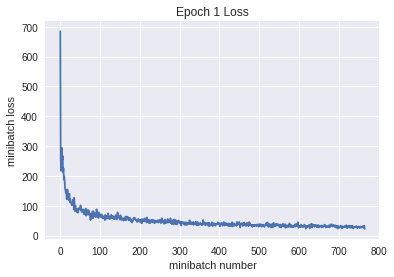

Validation
Epoch 1, Overall loss = 0.462 and accuracy of 0.344


In [5]:
def run_model(session, predict, loss_val, Xd, yd,
              epochs=1, batch_size=64, print_every=100,
              training=None, plot_losses=False):
    # have tensorflow compute accuracy
    correct_prediction = tf.equal(tf.argmax(predict,1), y)
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
    
    # shuffle indicies
    train_indicies = np.arange(Xd.shape[0])
    np.random.shuffle(train_indicies)

    training_now = training is not None
    
    # setting up variables we want to compute (and optimizing)
    # if we have a training function, add that to things we compute
    variables = [mean_loss,correct_prediction,accuracy]
    if training_now:
        variables[-1] = training
    
    # counter 
    iter_cnt = 0
    for e in range(epochs):
        # keep track of losses and accuracy
        correct = 0
        losses = []
        # make sure we iterate over the dataset once
        for i in range(int(math.ceil(Xd.shape[0]/batch_size))):
            # generate indicies for the batch
            start_idx = (i*batch_size)%Xd.shape[0]
            idx = train_indicies[start_idx:start_idx+batch_size]
            
            # create a feed dictionary for this batch
            feed_dict = {X: Xd[idx,:],
                         y: yd[idx],
                         is_training: training_now }
            # get batch size
            actual_batch_size = yd[idx].shape[0]
            
            # have tensorflow compute loss and correct predictions
            # and (if given) perform a training step
            loss, corr, _ = session.run(variables,feed_dict=feed_dict)
            
            # aggregate performance stats
            losses.append(loss*actual_batch_size)
            correct += np.sum(corr)
            
            # print every now and then
            if training_now and (iter_cnt % print_every) == 0:
                print("Iteration {0}: with minibatch training loss = {1:.3g} and accuracy of {2:.2g}"\
                      .format(iter_cnt,loss,np.sum(corr)/actual_batch_size))
            iter_cnt += 1
        total_correct = correct/Xd.shape[0]
        total_loss = np.sum(losses)/Xd.shape[0]
        print("Epoch {2}, Overall loss = {0:.3g} and accuracy of {1:.3g}"\
              .format(total_loss,total_correct,e+1))
        if plot_losses:
            plt.plot(losses)
            plt.grid(True)
            plt.title('Epoch {} Loss'.format(e+1))
            plt.xlabel('minibatch number')
            plt.ylabel('minibatch loss')
            plt.show()
    return total_loss,total_correct

with tf.Session() as sess:
    with tf.device("/cpu:0"): #"/cpu:0" or "/gpu:0" 
        sess.run(tf.global_variables_initializer())
        print('Training')
        run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step,True)
        print('Validation')
        run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

## Training a specific model

In this section, we're going to specify a model for you to construct. The goal here isn't to get good performance (that'll be next), but instead to get comfortable with understanding the TensorFlow documentation and configuring your own model. 

Using the code provided above as guidance, and using the following TensorFlow documentation, specify a model with the following architecture:

* 7x7 Convolutional Layer with 32 filters and stride of 1
* ReLU Activation Layer
* Spatial Batch Normalization Layer (trainable parameters, with scale and centering)
* 2x2 Max Pooling layer with a stride of 2
* Affine layer with 1024 output units
* ReLU Activation Layer
* Affine layer from 1024 input units to 10 outputs



In [6]:
# clear old variables
tf.reset_default_graph()

# define our input (e.g. the data that changes every batch)
# The first dim is None, and gets sets automatically based on batch size fed in
X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

# define model
def complex_model(X,y,is_training):
    # setup variables
    # filter values: [filter_height, filter_width, in_channels, out_channels]
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 32])
    bconv1 = tf.get_variable("bconv1", shape=[32])
    #Gamma1 = tf.get_variable("Gamma1", shape=[32])
    #Beta1 = tf.get_variable("Beta1", shape=[32])
    #batch_mean, batch_var = tf.nn.moments(X, [0,1,2], name='moments')
    #ema = tf.train.ExponentialMovingAverage(decay=0.5)
    Waff1 = tf.get_variable("Waff1", shape=[5408, 1024])
    baff1 = tf.get_variable("baff1", shape=[1024])
    Waff2 = tf.get_variable("Waff2", shape=[1024, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    # define our graph (e.g. two_layer_convnet)
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1_flat = tf.reshape(p1,[-1,5408])
    a1 = tf.matmul(p1_flat,Waff1) + baff1
    r2 = tf.nn.relu(a1)
    a2 = tf.matmul(r2,Waff2) + baff2
    y_out = a2
    return y_out

y_out = complex_model(X,y,is_training)

To make sure you're doing the right thing, use the following tool to check the dimensionality of your output (it should be 64 x 10, since our batches have size 64 and the output of the final affine layer should be 10, corresponding to our 10 classes):

In [7]:
# Now we're going to feed a random batch into the model 
# and make sure the output is the right size
x = np.random.randn(64, 32, 32,3)
with tf.Session() as sess:
    with tf.device("/cpu:0"): #"/cpu:0" or "/gpu:0"
        tf.global_variables_initializer().run()

        ans = sess.run(y_out,feed_dict={X:x,is_training:True})
        %timeit sess.run(y_out,feed_dict={X:x,is_training:True})
        print(ans.shape)
        print(np.array_equal(ans.shape, np.array([64, 10])))

100 loops, best of 3: 2.92 ms per loop
(64, 10)
True


You should see the following from the run above 

`(64, 10)`

`True`

### GPU!

Now, we're going to try and start the model under the GPU device, the rest of the code stays unchanged and all our variables and operations will be computed using accelerated code paths. However, if there is no GPU, we get a Python exception and have to rebuild our graph. On a dual-core CPU, you might see around 50-80ms/batch running the above, while the Google Cloud GPUs (run below) should be around 2-5ms/batch.

In [8]:
try:
    with tf.Session() as sess:
        with tf.device("/gpu:0") as dev: #"/cpu:0" or "/gpu:0"
            tf.global_variables_initializer().run()

            ans = sess.run(y_out,feed_dict={X:x,is_training:True})
            %timeit sess.run(y_out,feed_dict={X:x,is_training:True})
except tf.errors.InvalidArgumentError:
    print("no gpu found, please use Google Cloud if you want GPU acceleration")    
    # rebuild the graph
    # trying to start a GPU throws an exception 
    # and also trashes the original graph
    tf.reset_default_graph()
    X = tf.placeholder(tf.float32, [None, 32, 32, 3])
    y = tf.placeholder(tf.int64, [None])
    is_training = tf.placeholder(tf.bool)
    y_out = complex_model(X,y,is_training)

100 loops, best of 3: 2.75 ms per loop


You should observe that even a simple forward pass like this is significantly faster on the GPU. So for the rest of the assignment (and when you go train your models in assignment 3 and your project!), you should use GPU devices. However, with TensorFlow, the default device is a GPU if one is available, and a CPU otherwise, so we can skip the device specification from now on.

### Train the model.

Now that you've seen how to define a model and do a single forward pass of some data through it, let's  walk through how you'd actually train one whole epoch over your training data (using the complex_model you created provided above).

Make sure you understand how each TensorFlow function used below corresponds to what you implemented in your custom neural network implementation.

First, set up an **RMSprop optimizer** (using a 1e-3 learning rate) and a **cross-entropy loss** function. See the TensorFlow documentation for more information
* Layers, Activations, Loss functions : https://www.tensorflow.org/api_guides/python/nn
* Optimizers: https://www.tensorflow.org/api_guides/python/train#Optimizers

In [9]:
# Inputs
#     y_out: is what your model computes
#     y: is your TensorFlow variable with label information
# Outputs
#    mean_loss: a TensorFlow variable (scalar) with numerical loss
#    optimizer: a TensorFlow optimizer
# This should be ~3 lines of code!
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)


In [10]:
# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

### Train the model
Below we'll create a session and train the model over one epoch. You should see a loss of 1.4 to 2.0 and an accuracy of 0.4 to 0.5. There will be some variation due to random seeds and differences in initialization

In [11]:
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64,100,train_step)

Training
Iteration 0: with minibatch training loss = 3.28 and accuracy of 0.078
Iteration 100: with minibatch training loss = 3.15 and accuracy of 0.28
Iteration 200: with minibatch training loss = 1.83 and accuracy of 0.44
Iteration 300: with minibatch training loss = 1.26 and accuracy of 0.55
Iteration 400: with minibatch training loss = 1.61 and accuracy of 0.33
Iteration 500: with minibatch training loss = 1.42 and accuracy of 0.52
Iteration 600: with minibatch training loss = 1.39 and accuracy of 0.42
Iteration 700: with minibatch training loss = 1.14 and accuracy of 0.59
Epoch 1, Overall loss = 1.69 and accuracy of 0.444


(1.6876561937526782, 0.4437755102040816)

### Check the accuracy of the model.

Let's see the train and test code in action -- feel free to use these methods when evaluating the models you develop below. You should see a loss of 1.3 to 2.0 with an accuracy of 0.45 to 0.55.

In [12]:
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Validation
Epoch 1, Overall loss = 1.47 and accuracy of 0.509


(1.4677472476959228, 0.509)

## Train a _great_ model on CIFAR-10!

Now it's your job to experiment with architectures, hyperparameters, loss functions, and optimizers to train a model that achieves ** >= 70% accuracy on the validation set** of CIFAR-10. You can use the `run_model` function from above.

### Things you should try:
- **Filter size**: Above we used 7x7; this makes pretty pictures but smaller filters may be more efficient
- **Number of filters**: Above we used 32 filters. Do more or fewer do better?
- **Pooling vs Strided Convolution**: Do you use max pooling or just stride convolutions?
- **Batch normalization**: Try adding spatial batch normalization after convolution layers and vanilla batch normalization after affine layers. Do your networks train faster?
- **Network architecture**: The network above has two layers of trainable parameters. Can you do better with a deep network? Good architectures to try include:
    - [conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
    - [conv-relu-conv-relu-pool]xN -> [affine]xM -> [softmax or SVM]
    - [batchnorm-relu-conv]xN -> [affine]xM -> [softmax or SVM]
- **Use TensorFlow Scope**: Use TensorFlow scope and/or [tf.layers](https://www.tensorflow.org/api_docs/python/tf/layers) to make it easier to write deeper networks. See [this tutorial](https://www.tensorflow.org/tutorials/layers) for how to use `tf.layers`. 
- **Use Learning Rate Decay**: [As the notes point out](http://cs231n.github.io/neural-networks-3/#anneal), decaying the learning rate might help the model converge. Feel free to decay every epoch, when loss doesn't change over an entire epoch, or any other heuristic you find appropriate. See the [Tensorflow documentation](https://www.tensorflow.org/versions/master/api_guides/python/train#Decaying_the_learning_rate) for learning rate decay.
- **Global Average Pooling**: Instead of flattening and then having multiple affine layers, perform convolutions until your image gets small (7x7 or so) and then perform an average pooling operation to get to a 1x1 image picture (1, 1 , Filter#), which is then reshaped into a (Filter#) vector. This is used in [Google's Inception Network](https://arxiv.org/abs/1512.00567) (See Table 1 for their architecture).
- **Regularization**: Add l2 weight regularization, or perhaps use [Dropout as in the TensorFlow MNIST tutorial](https://www.tensorflow.org/get_started/mnist/pros)

### Tips for training
For each network architecture that you try, you should tune the learning rate and regularization strength. When doing this there are a couple important things to keep in mind:

- If the parameters are working well, you should see improvement within a few hundred iterations
- Remember the coarse-to-fine approach for hyperparameter tuning: start by testing a large range of hyperparameters for just a few training iterations to find the combinations of parameters that are working at all.
- Once you have found some sets of parameters that seem to work, search more finely around these parameters. You may need to train for more epochs.
- You should use the validation set for hyperparameter search, and we'll save the test set for evaluating your architecture on the best parameters as selected by the validation set.

### Going above and beyond
If you are feeling adventurous there are many other features you can implement to try and improve your performance. You are **not required** to implement any of these; however they would be good things to try for extra credit.

- Alternative update steps: For the assignment we implemented SGD+momentum, RMSprop, and Adam; you could try alternatives like AdaGrad or AdaDelta.
- Alternative activation functions such as leaky ReLU, parametric ReLU, ELU, or MaxOut.
- Model ensembles
- Data augmentation
- New Architectures
  - [ResNets](https://arxiv.org/abs/1512.03385) where the input from the previous layer is added to the output.
  - [DenseNets](https://arxiv.org/abs/1608.06993) where inputs into previous layers are concatenated together.
  - [This blog has an in-depth overview](https://chatbotslife.com/resnets-highwaynets-and-densenets-oh-my-9bb15918ee32)

If you do decide to implement something extra, clearly describe it in the "Extra Credit Description" cell below.

### What we expect
At the very least, you should be able to train a ConvNet that gets at **>= 70% accuracy on the validation set**. This is just a lower bound - if you are careful it should be possible to get accuracies much higher than that! Extra credit points will be awarded for particularly high-scoring models or unique approaches.

You should use the space below to experiment and train your network. The final cell in this notebook should contain the training and validation set accuracies for your final trained network.

Have fun and happy training!

In [13]:
# Feel free to play with this cell

def my_model(X,y,is_training):
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 32]) # 21632 = 26*26*32
    bconv1 = tf.get_variable("bconv1", shape=[32])
    Waff1 = tf.get_variable("Waff1", shape=[5408, 1024])
    baff1 = tf.get_variable("baff1", shape=[1024])
    Waff2 = tf.get_variable("Waff2", shape=[1024, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    # conv7x7 stride1 padding valid: (32 - 7 + 0 ) / 1 + 1 = 26 -> 32*26*26 = 21632
    
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1 
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(26 - 2 + 0 ) / 2 + 1 = 13 -> 32*13*13 = 5408
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1_flat = tf.reshape(p1,[-1,5408])
    a1 = tf.matmul(p1_flat,Waff1) + baff1
    r2 = tf.nn.relu(a1)
    a2 = tf.matmul(r2,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

y_out = my_model(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 2.99 and accuracy of 0.12
Iteration 100: with minibatch training loss = 2.13 and accuracy of 0.39
Iteration 200: with minibatch training loss = 1.67 and accuracy of 0.48
Iteration 300: with minibatch training loss = 1.46 and accuracy of 0.53
Iteration 400: with minibatch training loss = 1.34 and accuracy of 0.55
Iteration 500: with minibatch training loss = 1.43 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.37 and accuracy of 0.53
Iteration 700: with minibatch training loss = 1.16 and accuracy of 0.61
Epoch 1, Overall loss = 1.69 and accuracy of 0.449


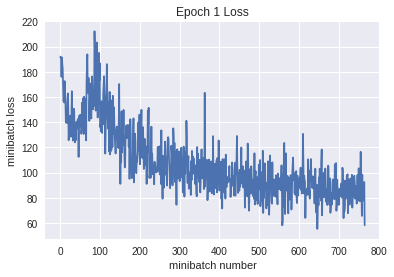

Iteration 800: with minibatch training loss = 1.4 and accuracy of 0.59
Iteration 900: with minibatch training loss = 1.09 and accuracy of 0.69
Iteration 1000: with minibatch training loss = 1.25 and accuracy of 0.55
Iteration 1100: with minibatch training loss = 1.15 and accuracy of 0.64
Iteration 1200: with minibatch training loss = 0.957 and accuracy of 0.67
Iteration 1300: with minibatch training loss = 1.08 and accuracy of 0.61
Iteration 1400: with minibatch training loss = 1.12 and accuracy of 0.67
Iteration 1500: with minibatch training loss = 0.826 and accuracy of 0.73
Epoch 2, Overall loss = 1.12 and accuracy of 0.618


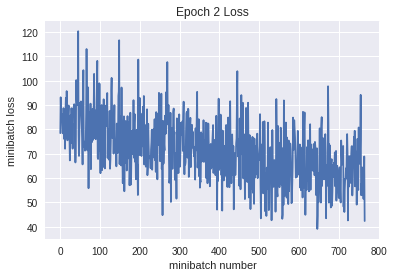

Iteration 1600: with minibatch training loss = 0.819 and accuracy of 0.75
Iteration 1700: with minibatch training loss = 0.868 and accuracy of 0.7
Iteration 1800: with minibatch training loss = 0.978 and accuracy of 0.73
Iteration 1900: with minibatch training loss = 1.14 and accuracy of 0.66
Iteration 2000: with minibatch training loss = 0.671 and accuracy of 0.8
Iteration 2100: with minibatch training loss = 0.869 and accuracy of 0.7
Iteration 2200: with minibatch training loss = 0.454 and accuracy of 0.78
Epoch 3, Overall loss = 0.811 and accuracy of 0.727


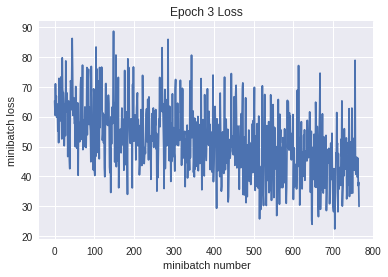

Iteration 2300: with minibatch training loss = 0.841 and accuracy of 0.73
Iteration 2400: with minibatch training loss = 0.916 and accuracy of 0.72
Iteration 2500: with minibatch training loss = 0.674 and accuracy of 0.83
Iteration 2600: with minibatch training loss = 0.575 and accuracy of 0.75
Iteration 2700: with minibatch training loss = 0.541 and accuracy of 0.81
Iteration 2800: with minibatch training loss = 0.565 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 0.487 and accuracy of 0.84
Iteration 3000: with minibatch training loss = 0.339 and accuracy of 0.89
Epoch 4, Overall loss = 0.563 and accuracy of 0.811


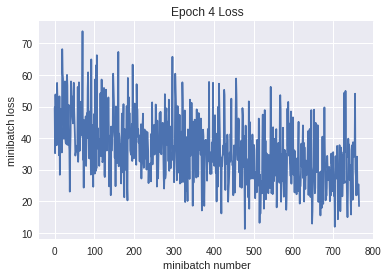

Iteration 3100: with minibatch training loss = 0.472 and accuracy of 0.84
Iteration 3200: with minibatch training loss = 0.496 and accuracy of 0.86
Iteration 3300: with minibatch training loss = 0.296 and accuracy of 0.89
Iteration 3400: with minibatch training loss = 0.334 and accuracy of 0.88
Iteration 3500: with minibatch training loss = 0.133 and accuracy of 0.94
Iteration 3600: with minibatch training loss = 0.216 and accuracy of 0.92
Iteration 3700: with minibatch training loss = 0.328 and accuracy of 0.92
Iteration 3800: with minibatch training loss = 0.363 and accuracy of 0.89
Epoch 5, Overall loss = 0.385 and accuracy of 0.87


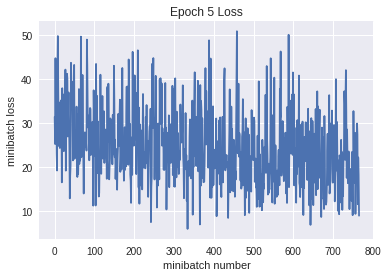

Iteration 3900: with minibatch training loss = 0.377 and accuracy of 0.89
Iteration 4000: with minibatch training loss = 0.348 and accuracy of 0.86
Iteration 4100: with minibatch training loss = 0.243 and accuracy of 0.91
Iteration 4200: with minibatch training loss = 0.116 and accuracy of 0.97
Iteration 4300: with minibatch training loss = 0.119 and accuracy of 0.94
Iteration 4400: with minibatch training loss = 0.173 and accuracy of 0.94
Iteration 4500: with minibatch training loss = 0.175 and accuracy of 0.91
Epoch 6, Overall loss = 0.278 and accuracy of 0.907


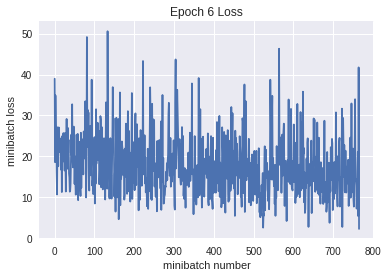

Iteration 4600: with minibatch training loss = 0.267 and accuracy of 0.92
Iteration 4700: with minibatch training loss = 0.191 and accuracy of 0.92
Iteration 4800: with minibatch training loss = 0.11 and accuracy of 0.95
Iteration 4900: with minibatch training loss = 0.388 and accuracy of 0.89
Iteration 5000: with minibatch training loss = 0.239 and accuracy of 0.91
Iteration 5100: with minibatch training loss = 0.129 and accuracy of 0.94
Iteration 5200: with minibatch training loss = 0.236 and accuracy of 0.88
Iteration 5300: with minibatch training loss = 0.127 and accuracy of 0.97
Epoch 7, Overall loss = 0.216 and accuracy of 0.929


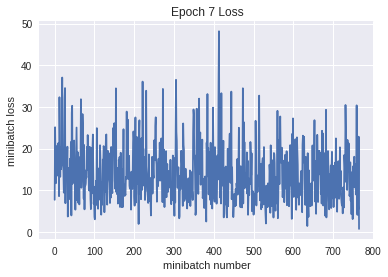

Iteration 5400: with minibatch training loss = 0.0597 and accuracy of 0.98
Iteration 5500: with minibatch training loss = 0.304 and accuracy of 0.88
Iteration 5600: with minibatch training loss = 0.148 and accuracy of 0.97
Iteration 5700: with minibatch training loss = 0.103 and accuracy of 0.97
Iteration 5800: with minibatch training loss = 0.454 and accuracy of 0.91
Iteration 5900: with minibatch training loss = 0.0982 and accuracy of 0.94
Iteration 6000: with minibatch training loss = 0.166 and accuracy of 0.92
Iteration 6100: with minibatch training loss = 0.19 and accuracy of 0.92
Epoch 8, Overall loss = 0.18 and accuracy of 0.941


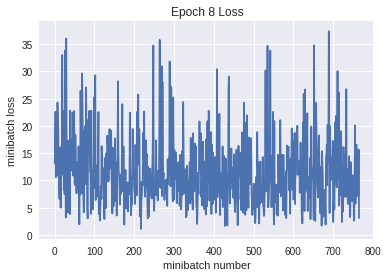

Iteration 6200: with minibatch training loss = 0.0214 and accuracy of 1
Iteration 6300: with minibatch training loss = 0.215 and accuracy of 0.92
Iteration 6400: with minibatch training loss = 0.137 and accuracy of 0.94
Iteration 6500: with minibatch training loss = 0.0272 and accuracy of 1
Iteration 6600: with minibatch training loss = 0.199 and accuracy of 0.94
Iteration 6700: with minibatch training loss = 0.149 and accuracy of 0.95
Iteration 6800: with minibatch training loss = 0.0712 and accuracy of 0.97
Epoch 9, Overall loss = 0.157 and accuracy of 0.949


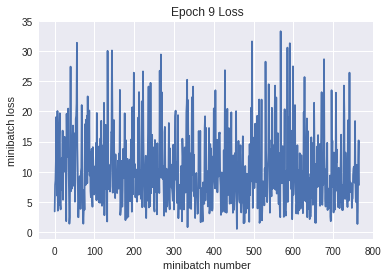

Iteration 6900: with minibatch training loss = 0.109 and accuracy of 0.97
Iteration 7000: with minibatch training loss = 0.108 and accuracy of 0.95
Iteration 7100: with minibatch training loss = 0.152 and accuracy of 0.95
Iteration 7200: with minibatch training loss = 0.131 and accuracy of 0.97
Iteration 7300: with minibatch training loss = 0.112 and accuracy of 0.95
Iteration 7400: with minibatch training loss = 0.0324 and accuracy of 0.98
Iteration 7500: with minibatch training loss = 0.0687 and accuracy of 0.98
Iteration 7600: with minibatch training loss = 0.0757 and accuracy of 0.95
Epoch 10, Overall loss = 0.13 and accuracy of 0.957


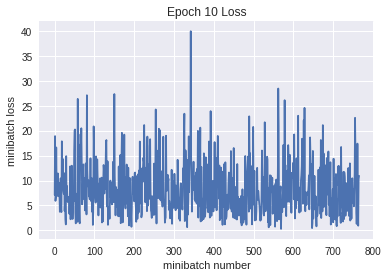

Validation
Epoch 1, Overall loss = 2.62 and accuracy of 0.622


(2.6155151805877686, 0.622)

In [14]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [15]:
def my_model2(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[3, 3, 3, 32])
    bconv1 = tf.get_variable("bconv1", shape=[32])
    Waff1 = tf.get_variable("Waff1", shape=[7200, 1024])
    baff1 = tf.get_variable("baff1", shape=[1024])
    Waff2 = tf.get_variable("Waff2", shape=[1024, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    # conv3x3 stride1 padding valid: (32 - 3 + 1 ) / 1  = 30 -> 32*30*30 = 28800
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(30 - 2 + 1 ) / 2  = 14.5 -> 32*15*15 = 7200
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1_flat = tf.reshape(p1,[-1,7200])
    a1 = tf.matmul(p1_flat,Waff1) + baff1
    r2 = tf.nn.relu(a1)
    a2 = tf.matmul(r2,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

y_out = my_model2(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.17 and accuracy of 0.14
Iteration 100: with minibatch training loss = 2.19 and accuracy of 0.36
Iteration 200: with minibatch training loss = 2.1 and accuracy of 0.38
Iteration 300: with minibatch training loss = 1.5 and accuracy of 0.47
Iteration 400: with minibatch training loss = 1.24 and accuracy of 0.64
Iteration 500: with minibatch training loss = 1.44 and accuracy of 0.48
Iteration 600: with minibatch training loss = 1.26 and accuracy of 0.56
Iteration 700: with minibatch training loss = 1.15 and accuracy of 0.52
Epoch 1, Overall loss = 1.64 and accuracy of 0.473


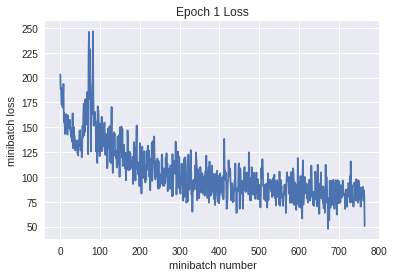

Iteration 800: with minibatch training loss = 1.43 and accuracy of 0.55
Iteration 900: with minibatch training loss = 1.16 and accuracy of 0.58
Iteration 1000: with minibatch training loss = 1.02 and accuracy of 0.64
Iteration 1100: with minibatch training loss = 0.985 and accuracy of 0.69
Iteration 1200: with minibatch training loss = 0.883 and accuracy of 0.67
Iteration 1300: with minibatch training loss = 1.03 and accuracy of 0.72
Iteration 1400: with minibatch training loss = 0.845 and accuracy of 0.7
Iteration 1500: with minibatch training loss = 0.962 and accuracy of 0.69
Epoch 2, Overall loss = 1.04 and accuracy of 0.648


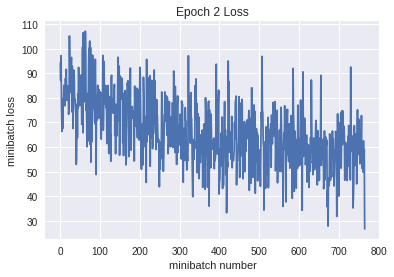

Iteration 1600: with minibatch training loss = 0.865 and accuracy of 0.75
Iteration 1700: with minibatch training loss = 1.02 and accuracy of 0.62
Iteration 1800: with minibatch training loss = 0.767 and accuracy of 0.73
Iteration 1900: with minibatch training loss = 0.565 and accuracy of 0.78
Iteration 2000: with minibatch training loss = 0.583 and accuracy of 0.78
Iteration 2100: with minibatch training loss = 0.508 and accuracy of 0.88
Iteration 2200: with minibatch training loss = 0.409 and accuracy of 0.86
Epoch 3, Overall loss = 0.709 and accuracy of 0.76


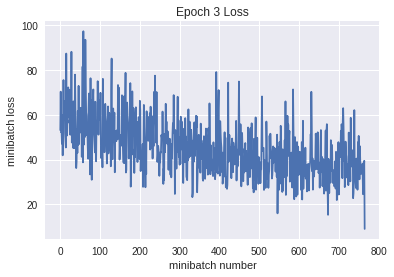

Iteration 2300: with minibatch training loss = 0.434 and accuracy of 0.84
Iteration 2400: with minibatch training loss = 0.406 and accuracy of 0.88
Iteration 2500: with minibatch training loss = 0.281 and accuracy of 0.91
Iteration 2600: with minibatch training loss = 0.651 and accuracy of 0.81
Iteration 2700: with minibatch training loss = 0.74 and accuracy of 0.77
Iteration 2800: with minibatch training loss = 0.404 and accuracy of 0.86
Iteration 2900: with minibatch training loss = 0.619 and accuracy of 0.8
Iteration 3000: with minibatch training loss = 0.395 and accuracy of 0.88
Epoch 4, Overall loss = 0.459 and accuracy of 0.845


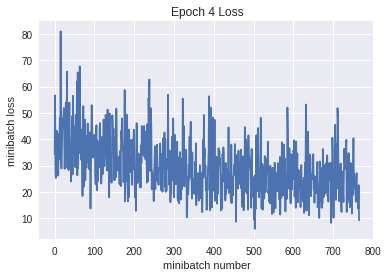

Iteration 3100: with minibatch training loss = 0.357 and accuracy of 0.88
Iteration 3200: with minibatch training loss = 0.237 and accuracy of 0.86
Iteration 3300: with minibatch training loss = 0.513 and accuracy of 0.86
Iteration 3400: with minibatch training loss = 0.51 and accuracy of 0.8
Iteration 3500: with minibatch training loss = 0.207 and accuracy of 0.92
Iteration 3600: with minibatch training loss = 0.249 and accuracy of 0.89
Iteration 3700: with minibatch training loss = 0.316 and accuracy of 0.88
Iteration 3800: with minibatch training loss = 0.0973 and accuracy of 0.95
Epoch 5, Overall loss = 0.308 and accuracy of 0.898


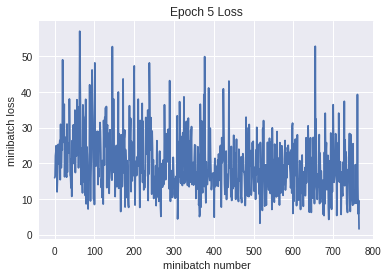

Iteration 3900: with minibatch training loss = 0.298 and accuracy of 0.92
Iteration 4000: with minibatch training loss = 0.2 and accuracy of 0.95
Iteration 4100: with minibatch training loss = 0.218 and accuracy of 0.92
Iteration 4200: with minibatch training loss = 0.0782 and accuracy of 0.97
Iteration 4300: with minibatch training loss = 0.201 and accuracy of 0.92
Iteration 4400: with minibatch training loss = 0.072 and accuracy of 0.95
Iteration 4500: with minibatch training loss = 0.268 and accuracy of 0.91
Epoch 6, Overall loss = 0.228 and accuracy of 0.924


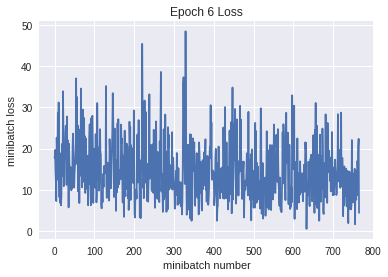

Iteration 4600: with minibatch training loss = 0.203 and accuracy of 0.94
Iteration 4700: with minibatch training loss = 0.177 and accuracy of 0.92
Iteration 4800: with minibatch training loss = 0.161 and accuracy of 0.92
Iteration 4900: with minibatch training loss = 0.258 and accuracy of 0.91
Iteration 5000: with minibatch training loss = 0.0588 and accuracy of 0.97
Iteration 5100: with minibatch training loss = 0.194 and accuracy of 0.95
Iteration 5200: with minibatch training loss = 0.135 and accuracy of 0.98
Iteration 5300: with minibatch training loss = 0.173 and accuracy of 0.92
Epoch 7, Overall loss = 0.187 and accuracy of 0.94


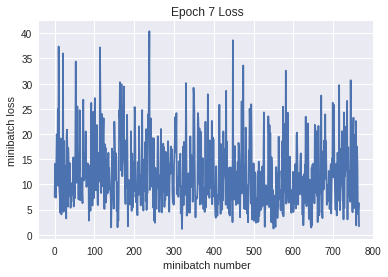

Iteration 5400: with minibatch training loss = 0.208 and accuracy of 0.94
Iteration 5500: with minibatch training loss = 0.226 and accuracy of 0.94
Iteration 5600: with minibatch training loss = 0.12 and accuracy of 0.95
Iteration 5700: with minibatch training loss = 0.132 and accuracy of 0.98
Iteration 5800: with minibatch training loss = 0.0909 and accuracy of 0.97
Iteration 5900: with minibatch training loss = 0.239 and accuracy of 0.94
Iteration 6000: with minibatch training loss = 0.163 and accuracy of 0.94
Iteration 6100: with minibatch training loss = 0.142 and accuracy of 0.95
Epoch 8, Overall loss = 0.154 and accuracy of 0.949


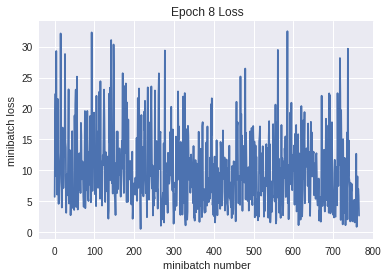

Iteration 6200: with minibatch training loss = 0.153 and accuracy of 0.94
Iteration 6300: with minibatch training loss = 0.23 and accuracy of 0.92
Iteration 6400: with minibatch training loss = 0.113 and accuracy of 0.97
Iteration 6500: with minibatch training loss = 0.0925 and accuracy of 0.97
Iteration 6600: with minibatch training loss = 0.264 and accuracy of 0.94
Iteration 6700: with minibatch training loss = 0.0821 and accuracy of 0.95
Iteration 6800: with minibatch training loss = 0.153 and accuracy of 0.94
Epoch 9, Overall loss = 0.138 and accuracy of 0.957


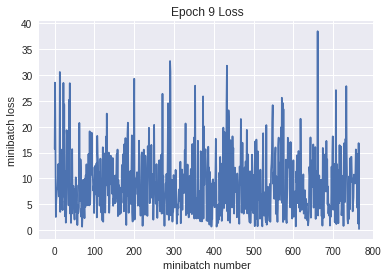

Iteration 6900: with minibatch training loss = 0.0315 and accuracy of 1
Iteration 7000: with minibatch training loss = 0.0251 and accuracy of 1
Iteration 7100: with minibatch training loss = 0.0287 and accuracy of 0.98
Iteration 7200: with minibatch training loss = 0.0692 and accuracy of 0.95
Iteration 7300: with minibatch training loss = 0.173 and accuracy of 0.97
Iteration 7400: with minibatch training loss = 0.16 and accuracy of 0.94
Iteration 7500: with minibatch training loss = 0.0863 and accuracy of 0.97
Iteration 7600: with minibatch training loss = 0.049 and accuracy of 0.97
Epoch 10, Overall loss = 0.116 and accuracy of 0.964


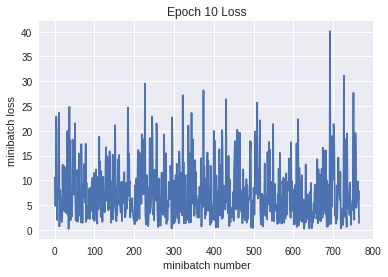

Validation
Epoch 1, Overall loss = 2.69 and accuracy of 0.645


(2.686822696685791, 0.645)

In [16]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [20]:
def my_model3(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[3, 3, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[3600, 1024])
    baff1 = tf.get_variable("baff1", shape=[1024])
    Waff2 = tf.get_variable("Waff2", shape=[1024, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    # conv3x3 stride1 padding valid: (32 - 3 + 1 ) / 1  = 30 -> 32*30*30 = 28800
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(30 - 2 + 1 ) / 2  = 14.5 -> 16*15*15 = 3600
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1_flat = tf.reshape(p1,[-1,3600])
    a1 = tf.matmul(p1_flat,Waff1) + baff1
    r2 = tf.nn.relu(a1)
    a2 = tf.matmul(r2,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

y_out = my_model3(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.46 and accuracy of 0.094
Iteration 100: with minibatch training loss = 2.14 and accuracy of 0.41
Iteration 200: with minibatch training loss = 1.94 and accuracy of 0.36
Iteration 300: with minibatch training loss = 1.48 and accuracy of 0.5
Iteration 400: with minibatch training loss = 1.37 and accuracy of 0.56
Iteration 500: with minibatch training loss = 1.26 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.33 and accuracy of 0.55
Iteration 700: with minibatch training loss = 0.935 and accuracy of 0.66
Epoch 1, Overall loss = 1.54 and accuracy of 0.492


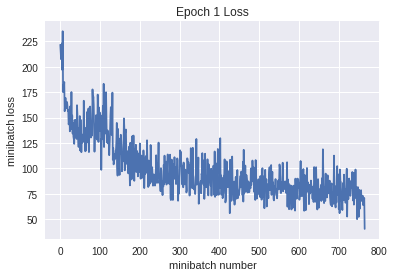

Iteration 800: with minibatch training loss = 0.829 and accuracy of 0.78
Iteration 900: with minibatch training loss = 0.966 and accuracy of 0.69
Iteration 1000: with minibatch training loss = 0.806 and accuracy of 0.69
Iteration 1100: with minibatch training loss = 0.884 and accuracy of 0.67
Iteration 1200: with minibatch training loss = 0.761 and accuracy of 0.73
Iteration 1300: with minibatch training loss = 0.71 and accuracy of 0.8
Iteration 1400: with minibatch training loss = 0.615 and accuracy of 0.8
Iteration 1500: with minibatch training loss = 0.955 and accuracy of 0.69
Epoch 2, Overall loss = 0.945 and accuracy of 0.677


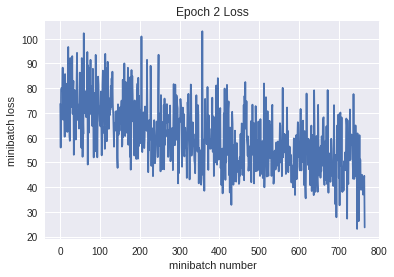

Iteration 1600: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 1700: with minibatch training loss = 0.445 and accuracy of 0.88
Iteration 1800: with minibatch training loss = 0.62 and accuracy of 0.81
Iteration 1900: with minibatch training loss = 0.361 and accuracy of 0.88
Iteration 2000: with minibatch training loss = 0.753 and accuracy of 0.8
Iteration 2100: with minibatch training loss = 0.597 and accuracy of 0.81
Iteration 2200: with minibatch training loss = 0.405 and accuracy of 0.86
Epoch 3, Overall loss = 0.602 and accuracy of 0.799


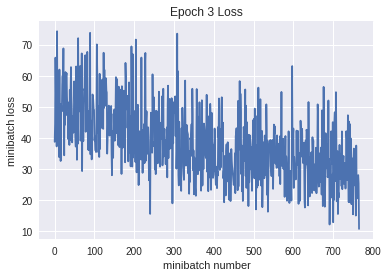

Iteration 2300: with minibatch training loss = 0.387 and accuracy of 0.83
Iteration 2400: with minibatch training loss = 0.336 and accuracy of 0.89
Iteration 2500: with minibatch training loss = 0.307 and accuracy of 0.86
Iteration 2600: with minibatch training loss = 0.338 and accuracy of 0.92
Iteration 2700: with minibatch training loss = 0.2 and accuracy of 0.95
Iteration 2800: with minibatch training loss = 0.232 and accuracy of 0.92
Iteration 2900: with minibatch training loss = 0.271 and accuracy of 0.92
Iteration 3000: with minibatch training loss = 0.187 and accuracy of 0.92
Epoch 4, Overall loss = 0.352 and accuracy of 0.883


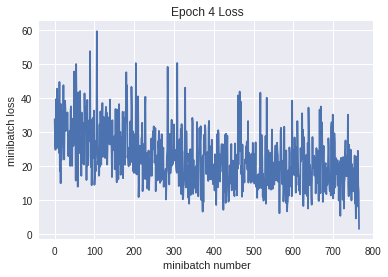

Iteration 3100: with minibatch training loss = 0.233 and accuracy of 0.92
Iteration 3200: with minibatch training loss = 0.174 and accuracy of 0.94
Iteration 3300: with minibatch training loss = 0.133 and accuracy of 0.95
Iteration 3400: with minibatch training loss = 0.217 and accuracy of 0.95
Iteration 3500: with minibatch training loss = 0.275 and accuracy of 0.94
Iteration 3600: with minibatch training loss = 0.179 and accuracy of 0.92
Iteration 3700: with minibatch training loss = 0.263 and accuracy of 0.88
Iteration 3800: with minibatch training loss = 0.341 and accuracy of 0.89
Epoch 5, Overall loss = 0.231 and accuracy of 0.921


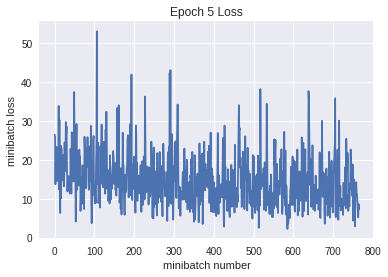

Iteration 3900: with minibatch training loss = 0.0505 and accuracy of 1
Iteration 4000: with minibatch training loss = 0.0497 and accuracy of 0.97
Iteration 4100: with minibatch training loss = 0.391 and accuracy of 0.92
Iteration 4200: with minibatch training loss = 0.166 and accuracy of 0.95
Iteration 4300: with minibatch training loss = 0.193 and accuracy of 0.91
Iteration 4400: with minibatch training loss = 0.13 and accuracy of 0.97
Iteration 4500: with minibatch training loss = 0.131 and accuracy of 0.94
Epoch 6, Overall loss = 0.178 and accuracy of 0.941


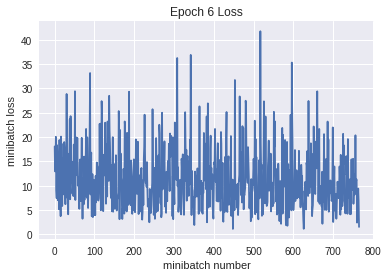

Iteration 4600: with minibatch training loss = 0.0488 and accuracy of 0.98
Iteration 4700: with minibatch training loss = 0.0912 and accuracy of 0.95
Iteration 4800: with minibatch training loss = 0.0715 and accuracy of 0.98
Iteration 4900: with minibatch training loss = 0.16 and accuracy of 0.94
Iteration 5000: with minibatch training loss = 0.157 and accuracy of 0.92
Iteration 5100: with minibatch training loss = 0.0105 and accuracy of 1
Iteration 5200: with minibatch training loss = 0.212 and accuracy of 0.94
Iteration 5300: with minibatch training loss = 0.0945 and accuracy of 0.98
Epoch 7, Overall loss = 0.147 and accuracy of 0.952


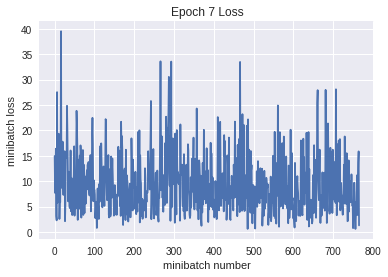

Iteration 5400: with minibatch training loss = 0.0367 and accuracy of 0.98
Iteration 5500: with minibatch training loss = 0.0421 and accuracy of 1
Iteration 5600: with minibatch training loss = 0.145 and accuracy of 0.97
Iteration 5700: with minibatch training loss = 0.0429 and accuracy of 0.97
Iteration 5800: with minibatch training loss = 0.109 and accuracy of 0.97
Iteration 5900: with minibatch training loss = 0.211 and accuracy of 0.92
Iteration 6000: with minibatch training loss = 0.384 and accuracy of 0.91
Iteration 6100: with minibatch training loss = 0.0756 and accuracy of 0.97
Epoch 8, Overall loss = 0.128 and accuracy of 0.958


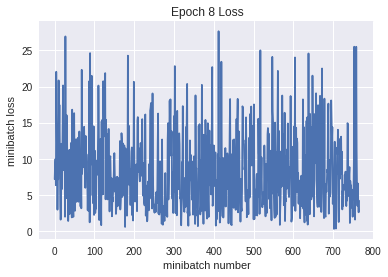

Iteration 6200: with minibatch training loss = 0.062 and accuracy of 0.97
Iteration 6300: with minibatch training loss = 0.161 and accuracy of 0.94
Iteration 6400: with minibatch training loss = 0.137 and accuracy of 0.94
Iteration 6500: with minibatch training loss = 0.0478 and accuracy of 0.98
Iteration 6600: with minibatch training loss = 0.138 and accuracy of 0.98
Iteration 6700: with minibatch training loss = 0.0971 and accuracy of 0.95
Iteration 6800: with minibatch training loss = 0.126 and accuracy of 0.97
Epoch 9, Overall loss = 0.107 and accuracy of 0.965


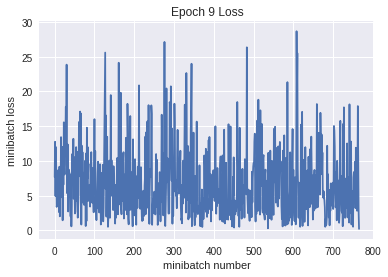

Iteration 6900: with minibatch training loss = 0.0417 and accuracy of 0.98
Iteration 7000: with minibatch training loss = 0.0638 and accuracy of 0.98
Iteration 7100: with minibatch training loss = 0.044 and accuracy of 0.98
Iteration 7200: with minibatch training loss = 0.18 and accuracy of 0.97
Iteration 7300: with minibatch training loss = 0.0028 and accuracy of 1
Iteration 7400: with minibatch training loss = 0.0919 and accuracy of 0.97
Iteration 7500: with minibatch training loss = 0.107 and accuracy of 0.97
Iteration 7600: with minibatch training loss = 0.0808 and accuracy of 0.95
Epoch 10, Overall loss = 0.101 and accuracy of 0.969


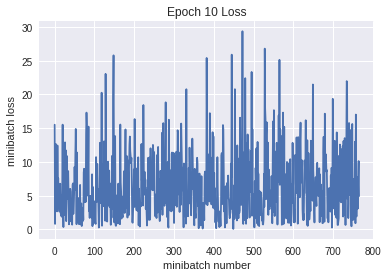

Validation
Epoch 1, Overall loss = 2.87 and accuracy of 0.64


(2.8672708492279053, 0.64)

In [18]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [21]:
def my_model4(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[3, 3, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[3600, 1024])
    baff1 = tf.get_variable("baff1", shape=[1024])
    Waff2 = tf.get_variable("Waff2", shape=[1024, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    # conv3x3 stride1 padding valid: (32 - 3 + 1 ) / 1  = 30 -> 32*30*30 = 28800
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(30 - 2 + 1 ) / 2  = 14.5 -> 16*15*15 = 3600
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1_flat = tf.reshape(p1,[-1,3600])
    a1 = tf.matmul(p1_flat,Waff1) + baff1
    r2 = tf.nn.relu(a1)
    a2 = tf.matmul(r2,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

y_out = my_model4(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.14 and accuracy of 0.062
Iteration 100: with minibatch training loss = 1.89 and accuracy of 0.42
Iteration 200: with minibatch training loss = 1.82 and accuracy of 0.38
Iteration 300: with minibatch training loss = 1.42 and accuracy of 0.52
Iteration 400: with minibatch training loss = 1.14 and accuracy of 0.56
Iteration 500: with minibatch training loss = 1.3 and accuracy of 0.55
Iteration 600: with minibatch training loss = 0.97 and accuracy of 0.66
Iteration 700: with minibatch training loss = 1.49 and accuracy of 0.48
Epoch 1, Overall loss = 1.55 and accuracy of 0.485


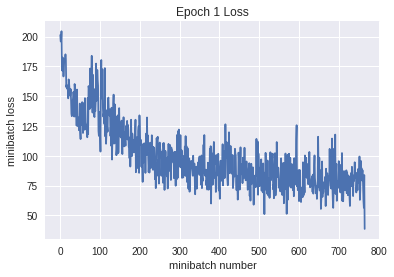

Iteration 800: with minibatch training loss = 1.26 and accuracy of 0.56
Iteration 900: with minibatch training loss = 1.28 and accuracy of 0.52
Iteration 1000: with minibatch training loss = 1.09 and accuracy of 0.69
Iteration 1100: with minibatch training loss = 0.833 and accuracy of 0.75
Iteration 1200: with minibatch training loss = 0.722 and accuracy of 0.75
Iteration 1300: with minibatch training loss = 0.729 and accuracy of 0.77
Iteration 1400: with minibatch training loss = 0.73 and accuracy of 0.7
Iteration 1500: with minibatch training loss = 0.641 and accuracy of 0.75
Epoch 2, Overall loss = 0.959 and accuracy of 0.671


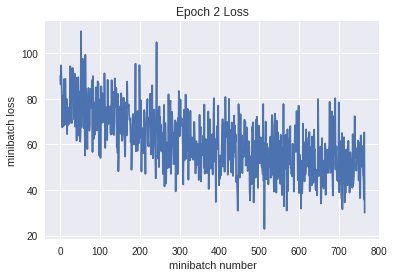

Iteration 1600: with minibatch training loss = 0.629 and accuracy of 0.84
Iteration 1700: with minibatch training loss = 0.864 and accuracy of 0.75
Iteration 1800: with minibatch training loss = 0.509 and accuracy of 0.81
Iteration 1900: with minibatch training loss = 0.512 and accuracy of 0.81
Iteration 2000: with minibatch training loss = 0.728 and accuracy of 0.81
Iteration 2100: with minibatch training loss = 0.397 and accuracy of 0.81
Iteration 2200: with minibatch training loss = 0.371 and accuracy of 0.86
Epoch 3, Overall loss = 0.605 and accuracy of 0.794


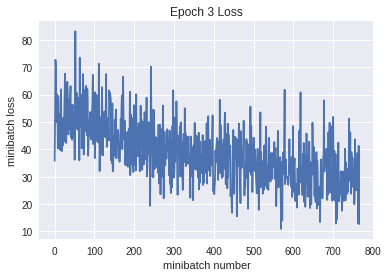

Iteration 2300: with minibatch training loss = 0.514 and accuracy of 0.8
Iteration 2400: with minibatch training loss = 0.736 and accuracy of 0.75
Iteration 2500: with minibatch training loss = 0.467 and accuracy of 0.83
Iteration 2600: with minibatch training loss = 0.45 and accuracy of 0.91
Iteration 2700: with minibatch training loss = 0.133 and accuracy of 0.95
Iteration 2800: with minibatch training loss = 0.172 and accuracy of 0.97
Iteration 2900: with minibatch training loss = 0.192 and accuracy of 0.94
Iteration 3000: with minibatch training loss = 0.244 and accuracy of 0.92
Epoch 4, Overall loss = 0.361 and accuracy of 0.879


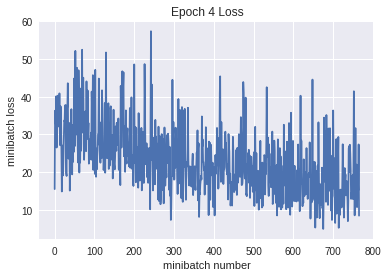

Iteration 3100: with minibatch training loss = 0.263 and accuracy of 0.86
Iteration 3200: with minibatch training loss = 0.226 and accuracy of 0.95
Iteration 3300: with minibatch training loss = 0.387 and accuracy of 0.89
Iteration 3400: with minibatch training loss = 0.37 and accuracy of 0.91
Iteration 3500: with minibatch training loss = 0.0877 and accuracy of 0.98
Iteration 3600: with minibatch training loss = 0.0965 and accuracy of 0.94
Iteration 3700: with minibatch training loss = 0.171 and accuracy of 0.94
Iteration 3800: with minibatch training loss = 0.233 and accuracy of 0.89
Epoch 5, Overall loss = 0.232 and accuracy of 0.922


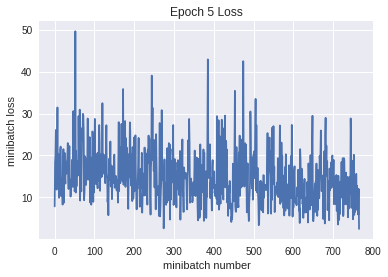

Validation
Epoch 1, Overall loss = 2.08 and accuracy of 0.638


(2.082047269821167, 0.638)

In [22]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,5,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [25]:
def my_model5(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[400, 1024])
    baff1 = tf.get_variable("baff1", shape=[1024])
    Waff2 = tf.get_variable("Waff2", shape=[1024, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    # conv3x3 stride1 padding valid: (13 - 3 + 1 ) / 1  = 11 -> 16*11*11 = 1573
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(11 - 2 + 1 ) / 2  = 5 -> 16*5*5 = 400
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p2_flat = tf.reshape(p2,[-1,400])
    a1 = tf.matmul(p2_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

y_out = my_model5(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 2.73 and accuracy of 0.12
Iteration 100: with minibatch training loss = 1.63 and accuracy of 0.36
Iteration 200: with minibatch training loss = 1.39 and accuracy of 0.52
Iteration 300: with minibatch training loss = 1.53 and accuracy of 0.56
Iteration 400: with minibatch training loss = 1.63 and accuracy of 0.5
Iteration 500: with minibatch training loss = 1.26 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.28 and accuracy of 0.61
Iteration 700: with minibatch training loss = 1.47 and accuracy of 0.48
Epoch 1, Overall loss = 1.49 and accuracy of 0.476


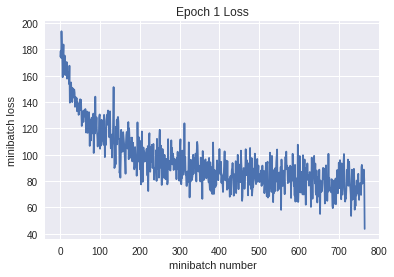

Iteration 800: with minibatch training loss = 1.05 and accuracy of 0.66
Iteration 900: with minibatch training loss = 1.67 and accuracy of 0.41
Iteration 1000: with minibatch training loss = 1.26 and accuracy of 0.53
Iteration 1100: with minibatch training loss = 1.31 and accuracy of 0.52
Iteration 1200: with minibatch training loss = 0.995 and accuracy of 0.59
Iteration 1300: with minibatch training loss = 0.914 and accuracy of 0.67
Iteration 1400: with minibatch training loss = 0.832 and accuracy of 0.64
Iteration 1500: with minibatch training loss = 0.806 and accuracy of 0.72
Epoch 2, Overall loss = 1.04 and accuracy of 0.638


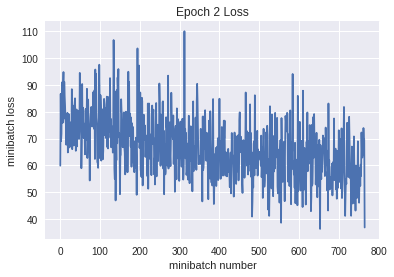

Iteration 1600: with minibatch training loss = 0.702 and accuracy of 0.72
Iteration 1700: with minibatch training loss = 0.985 and accuracy of 0.67
Iteration 1800: with minibatch training loss = 0.97 and accuracy of 0.67
Iteration 1900: with minibatch training loss = 0.914 and accuracy of 0.7
Iteration 2000: with minibatch training loss = 0.691 and accuracy of 0.73
Iteration 2100: with minibatch training loss = 0.785 and accuracy of 0.75
Iteration 2200: with minibatch training loss = 0.829 and accuracy of 0.75
Epoch 3, Overall loss = 0.816 and accuracy of 0.718


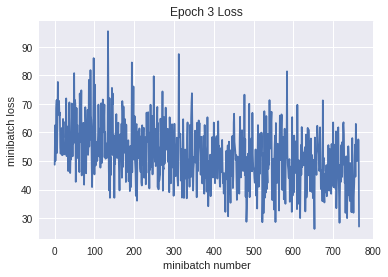

Iteration 2300: with minibatch training loss = 0.575 and accuracy of 0.77
Iteration 2400: with minibatch training loss = 0.858 and accuracy of 0.67
Iteration 2500: with minibatch training loss = 0.62 and accuracy of 0.75
Iteration 2600: with minibatch training loss = 0.694 and accuracy of 0.8
Iteration 2700: with minibatch training loss = 0.776 and accuracy of 0.73
Iteration 2800: with minibatch training loss = 0.507 and accuracy of 0.84
Iteration 2900: with minibatch training loss = 0.696 and accuracy of 0.77
Iteration 3000: with minibatch training loss = 0.548 and accuracy of 0.86
Epoch 4, Overall loss = 0.634 and accuracy of 0.786


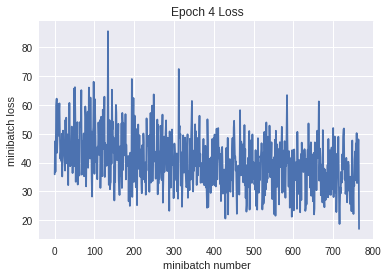

Iteration 3100: with minibatch training loss = 0.556 and accuracy of 0.77
Iteration 3200: with minibatch training loss = 0.342 and accuracy of 0.89
Iteration 3300: with minibatch training loss = 0.403 and accuracy of 0.86
Iteration 3400: with minibatch training loss = 0.439 and accuracy of 0.86
Iteration 3500: with minibatch training loss = 0.227 and accuracy of 0.92
Iteration 3600: with minibatch training loss = 0.422 and accuracy of 0.89
Iteration 3700: with minibatch training loss = 0.498 and accuracy of 0.84
Iteration 3800: with minibatch training loss = 0.372 and accuracy of 0.83
Epoch 5, Overall loss = 0.475 and accuracy of 0.844


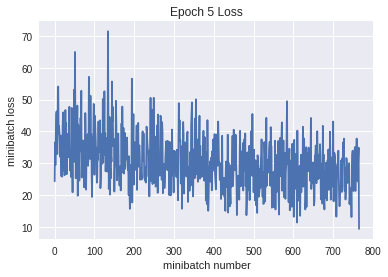

Iteration 3900: with minibatch training loss = 0.299 and accuracy of 0.86
Iteration 4000: with minibatch training loss = 0.626 and accuracy of 0.8
Iteration 4100: with minibatch training loss = 0.584 and accuracy of 0.84
Iteration 4200: with minibatch training loss = 0.254 and accuracy of 0.95
Iteration 4300: with minibatch training loss = 0.366 and accuracy of 0.86
Iteration 4400: with minibatch training loss = 0.432 and accuracy of 0.88
Iteration 4500: with minibatch training loss = 0.211 and accuracy of 0.95
Epoch 6, Overall loss = 0.343 and accuracy of 0.889


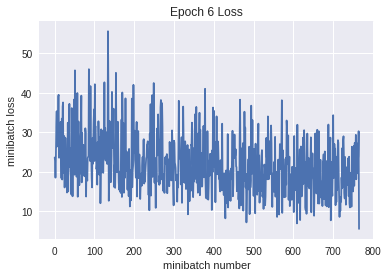

Iteration 4600: with minibatch training loss = 0.427 and accuracy of 0.83
Iteration 4700: with minibatch training loss = 0.422 and accuracy of 0.86
Iteration 4800: with minibatch training loss = 0.156 and accuracy of 0.95
Iteration 4900: with minibatch training loss = 0.311 and accuracy of 0.89
Iteration 5000: with minibatch training loss = 0.198 and accuracy of 0.97
Iteration 5100: with minibatch training loss = 0.168 and accuracy of 0.92
Iteration 5200: with minibatch training loss = 0.327 and accuracy of 0.84
Iteration 5300: with minibatch training loss = 0.441 and accuracy of 0.86
Epoch 7, Overall loss = 0.258 and accuracy of 0.916


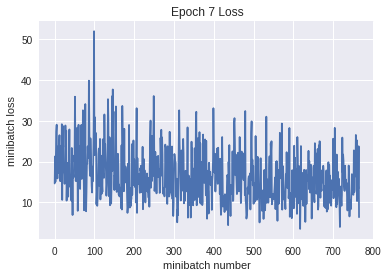

Iteration 5400: with minibatch training loss = 0.171 and accuracy of 0.95
Iteration 5500: with minibatch training loss = 0.238 and accuracy of 0.94
Iteration 5600: with minibatch training loss = 0.098 and accuracy of 0.97
Iteration 5700: with minibatch training loss = 0.3 and accuracy of 0.89
Iteration 5800: with minibatch training loss = 0.155 and accuracy of 0.97
Iteration 5900: with minibatch training loss = 0.233 and accuracy of 0.91
Iteration 6000: with minibatch training loss = 0.192 and accuracy of 0.94
Iteration 6100: with minibatch training loss = 0.238 and accuracy of 0.91
Epoch 8, Overall loss = 0.198 and accuracy of 0.932


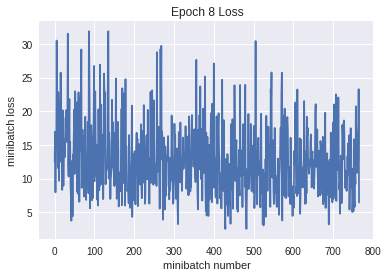

Iteration 6200: with minibatch training loss = 0.259 and accuracy of 0.91
Iteration 6300: with minibatch training loss = 0.274 and accuracy of 0.89
Iteration 6400: with minibatch training loss = 0.131 and accuracy of 0.97
Iteration 6500: with minibatch training loss = 0.0842 and accuracy of 0.98
Iteration 6600: with minibatch training loss = 0.128 and accuracy of 0.94
Iteration 6700: with minibatch training loss = 0.199 and accuracy of 0.92
Iteration 6800: with minibatch training loss = 0.191 and accuracy of 0.92
Epoch 9, Overall loss = 0.169 and accuracy of 0.942


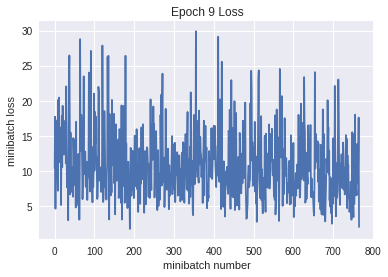

Iteration 6900: with minibatch training loss = 0.163 and accuracy of 0.97
Iteration 7000: with minibatch training loss = 0.18 and accuracy of 0.94
Iteration 7100: with minibatch training loss = 0.126 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.158 and accuracy of 0.92
Iteration 7300: with minibatch training loss = 0.128 and accuracy of 0.95
Iteration 7400: with minibatch training loss = 0.135 and accuracy of 0.95
Iteration 7500: with minibatch training loss = 0.129 and accuracy of 0.95
Iteration 7600: with minibatch training loss = 0.124 and accuracy of 0.95
Epoch 10, Overall loss = 0.143 and accuracy of 0.95


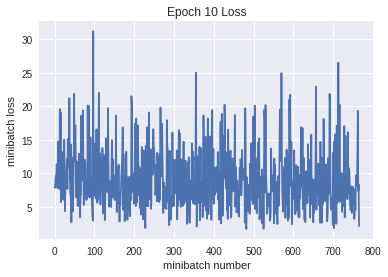

Validation
Epoch 1, Overall loss = 1.98 and accuracy of 0.623


(1.9845503454208373, 0.623)

In [26]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [27]:
# training my_model2 for more epoches
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

y_out = my_model2(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.47 and accuracy of 0.047
Iteration 100: with minibatch training loss = 2.15 and accuracy of 0.3
Iteration 200: with minibatch training loss = 1.68 and accuracy of 0.45
Iteration 300: with minibatch training loss = 1.81 and accuracy of 0.39
Iteration 400: with minibatch training loss = 1.49 and accuracy of 0.47
Iteration 500: with minibatch training loss = 1.32 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.62 and accuracy of 0.45
Iteration 700: with minibatch training loss = 1.34 and accuracy of 0.61
Epoch 1, Overall loss = 1.64 and accuracy of 0.47


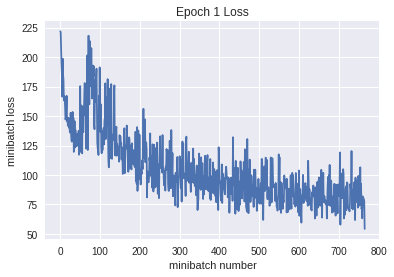

Iteration 800: with minibatch training loss = 0.861 and accuracy of 0.69
Iteration 900: with minibatch training loss = 1.07 and accuracy of 0.61
Iteration 1000: with minibatch training loss = 0.884 and accuracy of 0.62
Iteration 1100: with minibatch training loss = 0.971 and accuracy of 0.64
Iteration 1200: with minibatch training loss = 1.51 and accuracy of 0.55
Iteration 1300: with minibatch training loss = 0.699 and accuracy of 0.78
Iteration 1400: with minibatch training loss = 0.849 and accuracy of 0.69
Iteration 1500: with minibatch training loss = 0.922 and accuracy of 0.72
Epoch 2, Overall loss = 1.05 and accuracy of 0.645


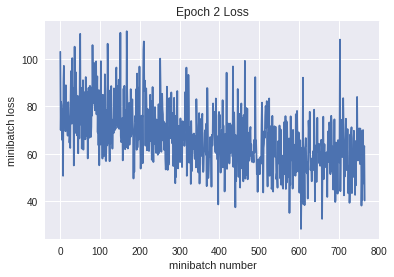

Iteration 1600: with minibatch training loss = 0.903 and accuracy of 0.69
Iteration 1700: with minibatch training loss = 1.18 and accuracy of 0.64
Iteration 1800: with minibatch training loss = 0.887 and accuracy of 0.67
Iteration 1900: with minibatch training loss = 0.655 and accuracy of 0.75
Iteration 2000: with minibatch training loss = 0.641 and accuracy of 0.81
Iteration 2100: with minibatch training loss = 0.77 and accuracy of 0.73
Iteration 2200: with minibatch training loss = 0.495 and accuracy of 0.84
Epoch 3, Overall loss = 0.725 and accuracy of 0.757


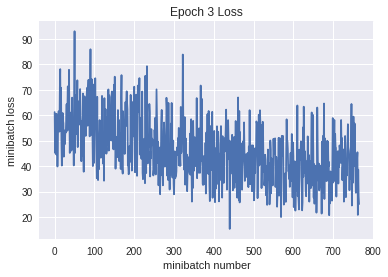

Iteration 2300: with minibatch training loss = 0.63 and accuracy of 0.81
Iteration 2400: with minibatch training loss = 0.653 and accuracy of 0.77
Iteration 2500: with minibatch training loss = 0.229 and accuracy of 0.92
Iteration 2600: with minibatch training loss = 0.439 and accuracy of 0.84
Iteration 2700: with minibatch training loss = 0.307 and accuracy of 0.89
Iteration 2800: with minibatch training loss = 0.301 and accuracy of 0.89
Iteration 2900: with minibatch training loss = 0.249 and accuracy of 0.91
Iteration 3000: with minibatch training loss = 0.293 and accuracy of 0.91
Epoch 4, Overall loss = 0.478 and accuracy of 0.842


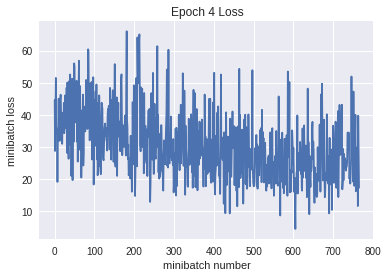

Iteration 3100: with minibatch training loss = 0.623 and accuracy of 0.83
Iteration 3200: with minibatch training loss = 0.271 and accuracy of 0.91
Iteration 3300: with minibatch training loss = 0.513 and accuracy of 0.86
Iteration 3400: with minibatch training loss = 0.195 and accuracy of 0.92
Iteration 3500: with minibatch training loss = 0.337 and accuracy of 0.92
Iteration 3600: with minibatch training loss = 0.435 and accuracy of 0.89
Iteration 3700: with minibatch training loss = 0.511 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.293 and accuracy of 0.94
Epoch 5, Overall loss = 0.321 and accuracy of 0.892


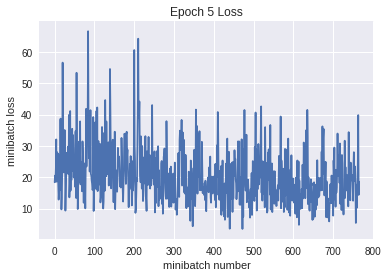

Iteration 3900: with minibatch training loss = 0.161 and accuracy of 0.92
Iteration 4000: with minibatch training loss = 0.131 and accuracy of 0.98
Iteration 4100: with minibatch training loss = 0.274 and accuracy of 0.92
Iteration 4200: with minibatch training loss = 0.204 and accuracy of 0.91
Iteration 4300: with minibatch training loss = 0.219 and accuracy of 0.92
Iteration 4400: with minibatch training loss = 0.312 and accuracy of 0.92
Iteration 4500: with minibatch training loss = 0.189 and accuracy of 0.92
Epoch 6, Overall loss = 0.238 and accuracy of 0.92


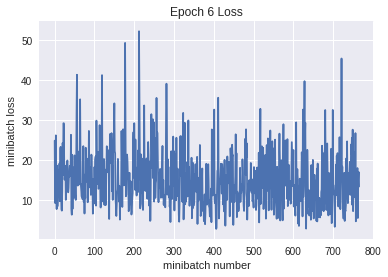

Iteration 4600: with minibatch training loss = 0.206 and accuracy of 0.94
Iteration 4700: with minibatch training loss = 0.0687 and accuracy of 0.97
Iteration 4800: with minibatch training loss = 0.191 and accuracy of 0.94
Iteration 4900: with minibatch training loss = 0.0545 and accuracy of 0.98
Iteration 5000: with minibatch training loss = 0.0822 and accuracy of 0.97
Iteration 5100: with minibatch training loss = 0.0881 and accuracy of 0.98
Iteration 5200: with minibatch training loss = 0.0478 and accuracy of 0.98
Iteration 5300: with minibatch training loss = 0.0841 and accuracy of 0.97
Epoch 7, Overall loss = 0.189 and accuracy of 0.939


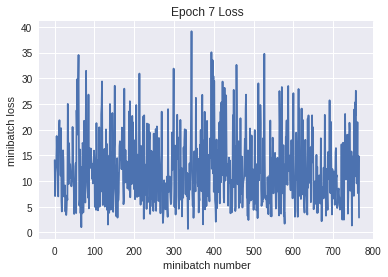

Iteration 5400: with minibatch training loss = 0.0826 and accuracy of 0.95
Iteration 5500: with minibatch training loss = 0.122 and accuracy of 0.95
Iteration 5600: with minibatch training loss = 0.0493 and accuracy of 0.98
Iteration 5700: with minibatch training loss = 0.4 and accuracy of 0.92
Iteration 5800: with minibatch training loss = 0.181 and accuracy of 0.94
Iteration 5900: with minibatch training loss = 0.0352 and accuracy of 0.98
Iteration 6000: with minibatch training loss = 0.382 and accuracy of 0.92
Iteration 6100: with minibatch training loss = 0.0993 and accuracy of 0.97
Epoch 8, Overall loss = 0.162 and accuracy of 0.949


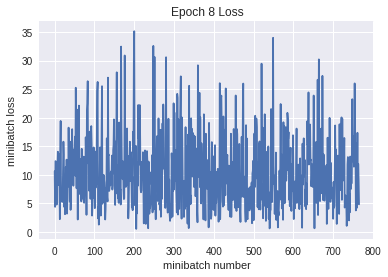

Iteration 6200: with minibatch training loss = 0.165 and accuracy of 0.92
Iteration 6300: with minibatch training loss = 0.231 and accuracy of 0.94
Iteration 6400: with minibatch training loss = 0.186 and accuracy of 0.92
Iteration 6500: with minibatch training loss = 0.12 and accuracy of 0.97
Iteration 6600: with minibatch training loss = 0.119 and accuracy of 0.94
Iteration 6700: with minibatch training loss = 0.205 and accuracy of 0.92
Iteration 6800: with minibatch training loss = 0.119 and accuracy of 0.95
Epoch 9, Overall loss = 0.143 and accuracy of 0.954


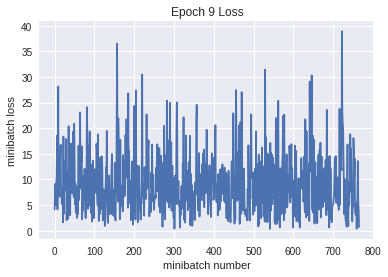

Iteration 6900: with minibatch training loss = 0.188 and accuracy of 0.94
Iteration 7000: with minibatch training loss = 0.0682 and accuracy of 0.98
Iteration 7100: with minibatch training loss = 0.0813 and accuracy of 0.97
Iteration 7200: with minibatch training loss = 0.0341 and accuracy of 0.98
Iteration 7300: with minibatch training loss = 0.0605 and accuracy of 0.98
Iteration 7400: with minibatch training loss = 0.046 and accuracy of 0.98
Iteration 7500: with minibatch training loss = 0.125 and accuracy of 0.97
Iteration 7600: with minibatch training loss = 0.173 and accuracy of 0.95
Epoch 10, Overall loss = 0.121 and accuracy of 0.962


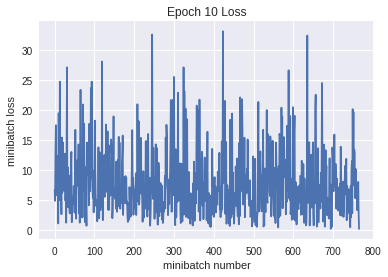

Iteration 7700: with minibatch training loss = 0.2 and accuracy of 0.95
Iteration 7800: with minibatch training loss = 0.026 and accuracy of 0.98
Iteration 7900: with minibatch training loss = 0.0375 and accuracy of 1
Iteration 8000: with minibatch training loss = 0.128 and accuracy of 0.95
Iteration 8100: with minibatch training loss = 0.0103 and accuracy of 1
Iteration 8200: with minibatch training loss = 0.0608 and accuracy of 0.95
Iteration 8300: with minibatch training loss = 0.08 and accuracy of 0.95
Iteration 8400: with minibatch training loss = 0.111 and accuracy of 0.95
Epoch 11, Overall loss = 0.109 and accuracy of 0.966


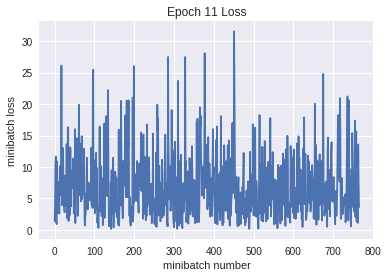

Iteration 8500: with minibatch training loss = 0.136 and accuracy of 0.95
Iteration 8600: with minibatch training loss = 0.0682 and accuracy of 0.98
Iteration 8700: with minibatch training loss = 0.0158 and accuracy of 1
Iteration 8800: with minibatch training loss = 0.0302 and accuracy of 0.98
Iteration 8900: with minibatch training loss = 0.113 and accuracy of 0.95
Iteration 9000: with minibatch training loss = 0.0531 and accuracy of 0.98
Iteration 9100: with minibatch training loss = 0.0796 and accuracy of 0.97
Epoch 12, Overall loss = 0.0968 and accuracy of 0.97


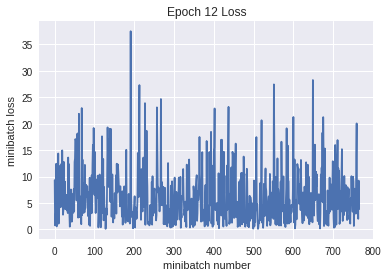

Iteration 9200: with minibatch training loss = 0.249 and accuracy of 0.92
Iteration 9300: with minibatch training loss = 0.0915 and accuracy of 0.97
Iteration 9400: with minibatch training loss = 0.287 and accuracy of 0.94
Iteration 9500: with minibatch training loss = 0.0812 and accuracy of 0.98
Iteration 9600: with minibatch training loss = 0.01 and accuracy of 1
Iteration 9700: with minibatch training loss = 0.108 and accuracy of 0.97
Iteration 9800: with minibatch training loss = 0.104 and accuracy of 0.94
Iteration 9900: with minibatch training loss = 0.0975 and accuracy of 0.98
Epoch 13, Overall loss = 0.0802 and accuracy of 0.975


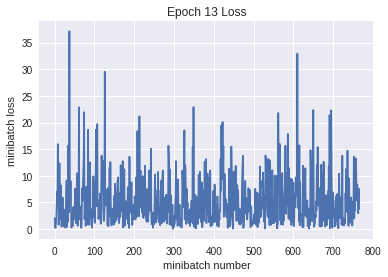

Iteration 10000: with minibatch training loss = 0.0402 and accuracy of 0.98
Iteration 10100: with minibatch training loss = 0.0693 and accuracy of 0.95
Iteration 10200: with minibatch training loss = 0.0541 and accuracy of 0.98
Iteration 10300: with minibatch training loss = 0.138 and accuracy of 0.97
Iteration 10400: with minibatch training loss = 0.014 and accuracy of 0.98
Iteration 10500: with minibatch training loss = 0.101 and accuracy of 0.97
Iteration 10600: with minibatch training loss = 0.0183 and accuracy of 1
Iteration 10700: with minibatch training loss = 0.0226 and accuracy of 0.98
Epoch 14, Overall loss = 0.0771 and accuracy of 0.976


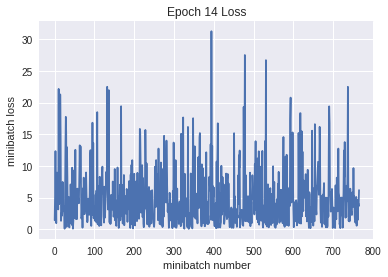

Iteration 10800: with minibatch training loss = 0.0138 and accuracy of 0.98
Iteration 10900: with minibatch training loss = 0.185 and accuracy of 0.97
Iteration 11000: with minibatch training loss = 0.155 and accuracy of 0.97
Iteration 11100: with minibatch training loss = 0.0539 and accuracy of 0.97
Iteration 11200: with minibatch training loss = 0.00691 and accuracy of 1
Iteration 11300: with minibatch training loss = 0.0135 and accuracy of 1
Iteration 11400: with minibatch training loss = 0.027 and accuracy of 0.97
Epoch 15, Overall loss = 0.0724 and accuracy of 0.977


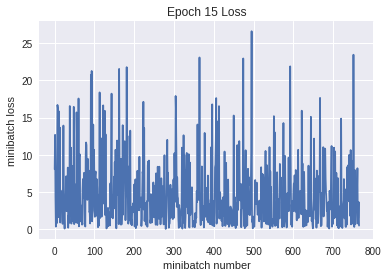

Iteration 11500: with minibatch training loss = 0.116 and accuracy of 0.95
Iteration 11600: with minibatch training loss = 0.059 and accuracy of 0.98
Iteration 11700: with minibatch training loss = 0.0452 and accuracy of 0.97
Iteration 11800: with minibatch training loss = 0.0542 and accuracy of 0.97
Iteration 11900: with minibatch training loss = 0.0585 and accuracy of 0.98
Iteration 12000: with minibatch training loss = 0.172 and accuracy of 0.95
Iteration 12100: with minibatch training loss = 0.107 and accuracy of 0.98
Iteration 12200: with minibatch training loss = 0.00488 and accuracy of 1
Epoch 16, Overall loss = 0.066 and accuracy of 0.98


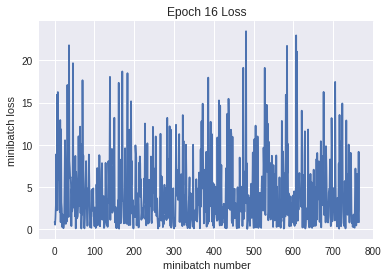

Iteration 12300: with minibatch training loss = 0.209 and accuracy of 0.94
Iteration 12400: with minibatch training loss = 0.179 and accuracy of 0.97
Iteration 12500: with minibatch training loss = 0.0122 and accuracy of 1
Iteration 12600: with minibatch training loss = 0.00775 and accuracy of 1
Iteration 12700: with minibatch training loss = 0.0256 and accuracy of 0.98
Iteration 12800: with minibatch training loss = 0.00932 and accuracy of 1
Iteration 12900: with minibatch training loss = 0.11 and accuracy of 0.97
Iteration 13000: with minibatch training loss = 0.124 and accuracy of 0.97
Epoch 17, Overall loss = 0.0665 and accuracy of 0.98


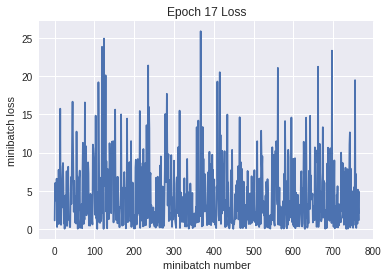

Iteration 13100: with minibatch training loss = 0.00111 and accuracy of 1
Iteration 13200: with minibatch training loss = 0.0178 and accuracy of 0.98
Iteration 13300: with minibatch training loss = 0.00271 and accuracy of 1
Iteration 13400: with minibatch training loss = 0.119 and accuracy of 0.97
Iteration 13500: with minibatch training loss = 0.0369 and accuracy of 0.98
Iteration 13600: with minibatch training loss = 0.00667 and accuracy of 1
Iteration 13700: with minibatch training loss = 0.0466 and accuracy of 0.98
Epoch 18, Overall loss = 0.0602 and accuracy of 0.983


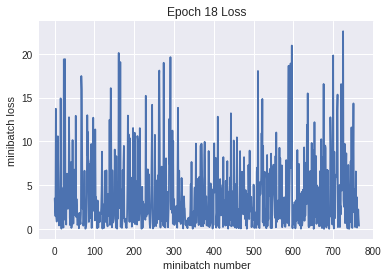

Iteration 13800: with minibatch training loss = 0.000926 and accuracy of 1
Iteration 13900: with minibatch training loss = 0.0669 and accuracy of 0.97
Iteration 14000: with minibatch training loss = 0.0513 and accuracy of 0.98
Iteration 14100: with minibatch training loss = 0.0671 and accuracy of 0.97
Iteration 14200: with minibatch training loss = 0.0788 and accuracy of 0.97
Iteration 14300: with minibatch training loss = 0.0028 and accuracy of 1
Iteration 14400: with minibatch training loss = 0.0213 and accuracy of 1
Iteration 14500: with minibatch training loss = 0.0367 and accuracy of 0.98
Epoch 19, Overall loss = 0.0546 and accuracy of 0.984


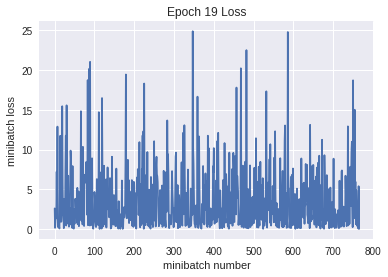

Iteration 14600: with minibatch training loss = 0.0369 and accuracy of 0.98
Iteration 14700: with minibatch training loss = 0.0748 and accuracy of 0.98
Iteration 14800: with minibatch training loss = 0.0311 and accuracy of 0.98
Iteration 14900: with minibatch training loss = 0.0312 and accuracy of 0.98
Iteration 15000: with minibatch training loss = 0.18 and accuracy of 0.98
Iteration 15100: with minibatch training loss = 0.0112 and accuracy of 1
Iteration 15200: with minibatch training loss = 0.0323 and accuracy of 0.98
Iteration 15300: with minibatch training loss = 0.147 and accuracy of 0.97
Epoch 20, Overall loss = 0.0498 and accuracy of 0.985


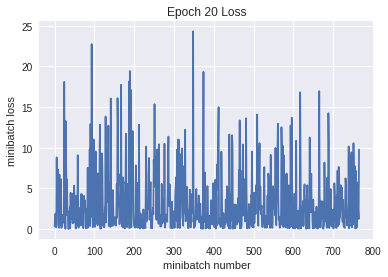

Iteration 15400: with minibatch training loss = 0.0408 and accuracy of 0.98
Iteration 15500: with minibatch training loss = 0.0676 and accuracy of 0.98
Iteration 15600: with minibatch training loss = 0.0891 and accuracy of 0.98
Iteration 15700: with minibatch training loss = 0.00159 and accuracy of 1
Iteration 15800: with minibatch training loss = 0.0623 and accuracy of 0.98
Iteration 15900: with minibatch training loss = 0.00768 and accuracy of 1
Iteration 16000: with minibatch training loss = 0.00652 and accuracy of 1
Epoch 21, Overall loss = 0.0486 and accuracy of 0.986


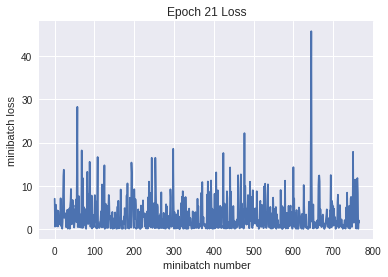

Iteration 16100: with minibatch training loss = 0.149 and accuracy of 0.98
Iteration 16200: with minibatch training loss = 0.136 and accuracy of 0.98
Iteration 16300: with minibatch training loss = 0.0407 and accuracy of 0.98
Iteration 16400: with minibatch training loss = 0.125 and accuracy of 0.97
Iteration 16500: with minibatch training loss = 0.0106 and accuracy of 1
Iteration 16600: with minibatch training loss = 0.0076 and accuracy of 1
Iteration 16700: with minibatch training loss = 0.0138 and accuracy of 0.98
Iteration 16800: with minibatch training loss = 0.087 and accuracy of 0.98
Epoch 22, Overall loss = 0.0441 and accuracy of 0.987


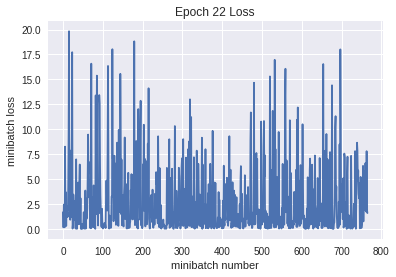

Iteration 16900: with minibatch training loss = 0.00145 and accuracy of 1
Iteration 17000: with minibatch training loss = 0.0178 and accuracy of 0.98
Iteration 17100: with minibatch training loss = 0.00811 and accuracy of 1
Iteration 17200: with minibatch training loss = 0.0539 and accuracy of 0.97
Iteration 17300: with minibatch training loss = 0.0155 and accuracy of 1
Iteration 17400: with minibatch training loss = 0.0839 and accuracy of 0.98
Iteration 17500: with minibatch training loss = 0.00815 and accuracy of 1
Iteration 17600: with minibatch training loss = 0.0133 and accuracy of 0.98
Epoch 23, Overall loss = 0.0435 and accuracy of 0.987


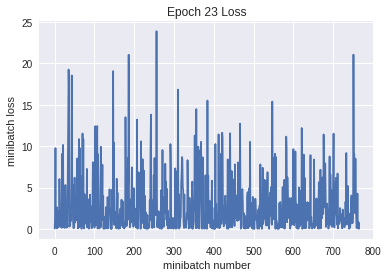

Iteration 17700: with minibatch training loss = 0.00328 and accuracy of 1
Iteration 17800: with minibatch training loss = 0.0437 and accuracy of 0.98
Iteration 17900: with minibatch training loss = 0.0277 and accuracy of 0.98
Iteration 18000: with minibatch training loss = 0.0299 and accuracy of 0.98
Iteration 18100: with minibatch training loss = 0.0311 and accuracy of 0.98
Iteration 18200: with minibatch training loss = 0.058 and accuracy of 0.98
Iteration 18300: with minibatch training loss = 0.00218 and accuracy of 1
Epoch 24, Overall loss = 0.0384 and accuracy of 0.989


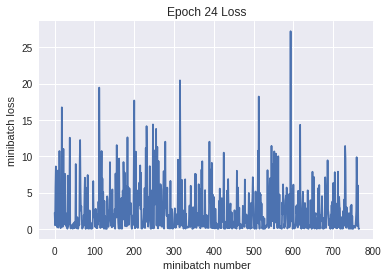

Iteration 18400: with minibatch training loss = 0.00844 and accuracy of 1
Iteration 18500: with minibatch training loss = 0.000246 and accuracy of 1
Iteration 18600: with minibatch training loss = 0.00741 and accuracy of 1
Iteration 18700: with minibatch training loss = 0.168 and accuracy of 0.98
Iteration 18800: with minibatch training loss = 0.00145 and accuracy of 1
Iteration 18900: with minibatch training loss = 0.00408 and accuracy of 1
Iteration 19000: with minibatch training loss = 0.11 and accuracy of 0.95
Iteration 19100: with minibatch training loss = 0.0126 and accuracy of 0.98
Epoch 25, Overall loss = 0.0349 and accuracy of 0.99


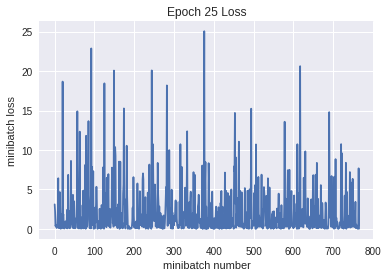

Iteration 19200: with minibatch training loss = 0.0466 and accuracy of 0.97
Iteration 19300: with minibatch training loss = 0.0621 and accuracy of 0.97
Iteration 19400: with minibatch training loss = 0.00361 and accuracy of 1
Iteration 19500: with minibatch training loss = 0.0145 and accuracy of 0.98
Iteration 19600: with minibatch training loss = 0.00582 and accuracy of 1
Iteration 19700: with minibatch training loss = 0.000884 and accuracy of 1
Iteration 19800: with minibatch training loss = 0.0612 and accuracy of 0.97
Iteration 19900: with minibatch training loss = 0.00123 and accuracy of 1
Epoch 26, Overall loss = 0.0318 and accuracy of 0.99


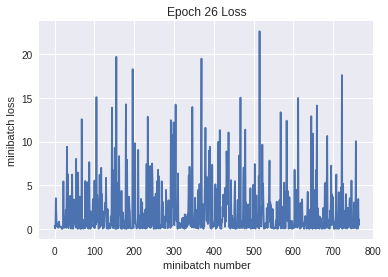

Iteration 20000: with minibatch training loss = 0.00162 and accuracy of 1
Iteration 20100: with minibatch training loss = 0.0674 and accuracy of 0.98
Iteration 20200: with minibatch training loss = 0.00812 and accuracy of 1
Iteration 20300: with minibatch training loss = 0.0147 and accuracy of 1
Iteration 20400: with minibatch training loss = 0.0153 and accuracy of 0.98
Iteration 20500: with minibatch training loss = 0.000425 and accuracy of 1
Iteration 20600: with minibatch training loss = 0.000985 and accuracy of 1
Epoch 27, Overall loss = 0.0361 and accuracy of 0.99


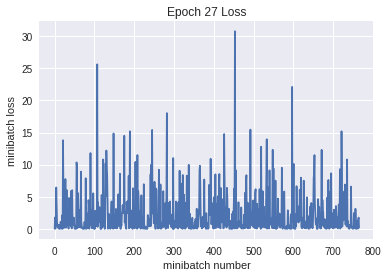

Iteration 20700: with minibatch training loss = 0.00322 and accuracy of 1
Iteration 20800: with minibatch training loss = 0.00216 and accuracy of 1
Iteration 20900: with minibatch training loss = 0.427 and accuracy of 0.94
Iteration 21000: with minibatch training loss = 0.0261 and accuracy of 0.98
Iteration 21100: with minibatch training loss = 0.0094 and accuracy of 1
Iteration 21200: with minibatch training loss = 0.0163 and accuracy of 0.98
Iteration 21300: with minibatch training loss = 0.0225 and accuracy of 0.98
Iteration 21400: with minibatch training loss = 0.0479 and accuracy of 0.98
Epoch 28, Overall loss = 0.0309 and accuracy of 0.99


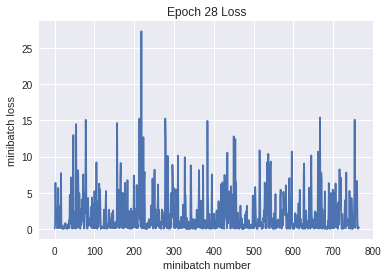

Iteration 21500: with minibatch training loss = 0.0196 and accuracy of 0.98
Iteration 21600: with minibatch training loss = 0.0249 and accuracy of 0.98
Iteration 21700: with minibatch training loss = 0.00539 and accuracy of 1
Iteration 21800: with minibatch training loss = 0.00155 and accuracy of 1
Iteration 21900: with minibatch training loss = 0.00206 and accuracy of 1
Iteration 22000: with minibatch training loss = 0.0681 and accuracy of 0.98
Iteration 22100: with minibatch training loss = 0.00193 and accuracy of 1
Iteration 22200: with minibatch training loss = 0.00966 and accuracy of 1
Epoch 29, Overall loss = 0.0298 and accuracy of 0.992


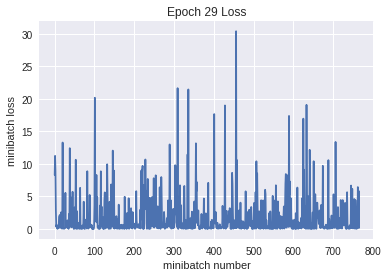

Iteration 22300: with minibatch training loss = 0.00824 and accuracy of 1
Iteration 22400: with minibatch training loss = 0.00122 and accuracy of 1
Iteration 22500: with minibatch training loss = 0.0482 and accuracy of 0.98
Iteration 22600: with minibatch training loss = 0.00131 and accuracy of 1
Iteration 22700: with minibatch training loss = 0.0469 and accuracy of 0.98
Iteration 22800: with minibatch training loss = 0.0183 and accuracy of 0.98
Iteration 22900: with minibatch training loss = 0.0799 and accuracy of 0.97
Epoch 30, Overall loss = 0.0314 and accuracy of 0.991


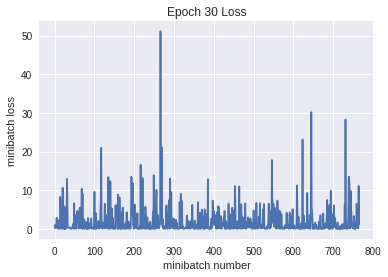

Iteration 23000: with minibatch training loss = 0.0121 and accuracy of 1
Iteration 23100: with minibatch training loss = 0.0438 and accuracy of 0.98
Iteration 23200: with minibatch training loss = 0.000334 and accuracy of 1
Iteration 23300: with minibatch training loss = 0.00141 and accuracy of 1
Iteration 23400: with minibatch training loss = 0.00202 and accuracy of 1
Iteration 23500: with minibatch training loss = 0.00283 and accuracy of 1
Iteration 23600: with minibatch training loss = 0.0264 and accuracy of 0.98
Iteration 23700: with minibatch training loss = 0.000579 and accuracy of 1
Epoch 31, Overall loss = 0.0299 and accuracy of 0.992


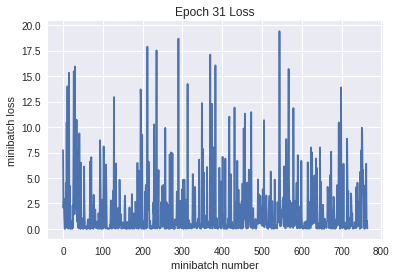

Iteration 23800: with minibatch training loss = 0.00391 and accuracy of 1
Iteration 23900: with minibatch training loss = 0.0018 and accuracy of 1
Iteration 24000: with minibatch training loss = 0.000471 and accuracy of 1
Iteration 24100: with minibatch training loss = 0.000878 and accuracy of 1
Iteration 24200: with minibatch training loss = 0.198 and accuracy of 0.97
Iteration 24300: with minibatch training loss = 0.0025 and accuracy of 1
Iteration 24400: with minibatch training loss = 0.00168 and accuracy of 1
Iteration 24500: with minibatch training loss = 0.00546 and accuracy of 1
Epoch 32, Overall loss = 0.0277 and accuracy of 0.992


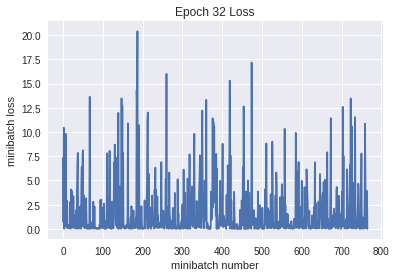

Iteration 24600: with minibatch training loss = 0.00971 and accuracy of 1
Iteration 24700: with minibatch training loss = 0.00246 and accuracy of 1
Iteration 24800: with minibatch training loss = 0.0525 and accuracy of 0.97
Iteration 24900: with minibatch training loss = 0.00319 and accuracy of 1
Iteration 25000: with minibatch training loss = 0.00516 and accuracy of 1
Iteration 25100: with minibatch training loss = 0.102 and accuracy of 0.97
Iteration 25200: with minibatch training loss = 0.0286 and accuracy of 0.98
Epoch 33, Overall loss = 0.0288 and accuracy of 0.992


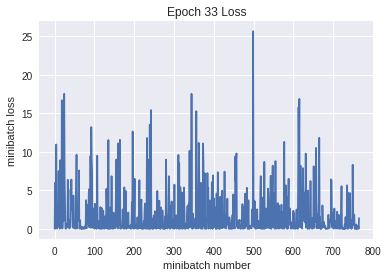

Iteration 25300: with minibatch training loss = 0.00177 and accuracy of 1
Iteration 25400: with minibatch training loss = 0.0103 and accuracy of 1
Iteration 25500: with minibatch training loss = 0.00241 and accuracy of 1
Iteration 25600: with minibatch training loss = 0.237 and accuracy of 0.97
Iteration 25700: with minibatch training loss = 0.00054 and accuracy of 1
Iteration 25800: with minibatch training loss = 0.0385 and accuracy of 0.98
Iteration 25900: with minibatch training loss = 0.00129 and accuracy of 1
Iteration 26000: with minibatch training loss = 0.0023 and accuracy of 1
Epoch 34, Overall loss = 0.0271 and accuracy of 0.993


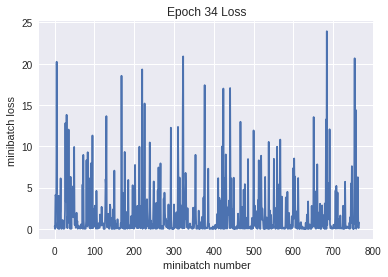

Iteration 26100: with minibatch training loss = 0.000145 and accuracy of 1
Iteration 26200: with minibatch training loss = 0.00119 and accuracy of 1
Iteration 26300: with minibatch training loss = 0.0305 and accuracy of 0.98
Iteration 26400: with minibatch training loss = 0.0704 and accuracy of 0.98
Iteration 26500: with minibatch training loss = 0.026 and accuracy of 0.98
Iteration 26600: with minibatch training loss = 0.000255 and accuracy of 1
Iteration 26700: with minibatch training loss = 0.00147 and accuracy of 1
Iteration 26800: with minibatch training loss = 0.0275 and accuracy of 0.98
Epoch 35, Overall loss = 0.026 and accuracy of 0.993


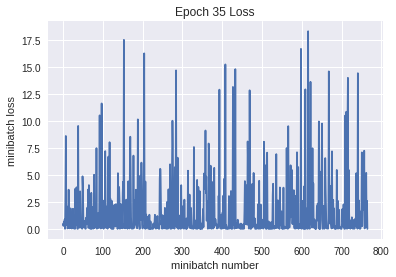

Iteration 26900: with minibatch training loss = 0.0375 and accuracy of 0.98
Iteration 27000: with minibatch training loss = 0.00175 and accuracy of 1
Iteration 27100: with minibatch training loss = 0.000217 and accuracy of 1
Iteration 27200: with minibatch training loss = 0.00576 and accuracy of 1
Iteration 27300: with minibatch training loss = 0.00232 and accuracy of 1
Iteration 27400: with minibatch training loss = 0.00381 and accuracy of 1
Iteration 27500: with minibatch training loss = 5.22e-05 and accuracy of 1
Epoch 36, Overall loss = 0.0279 and accuracy of 0.993


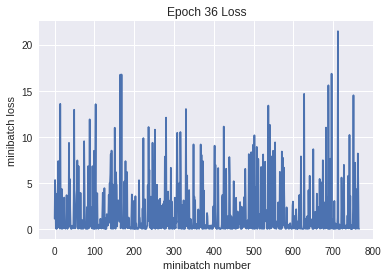

Iteration 27600: with minibatch training loss = 0.14 and accuracy of 0.97
Iteration 27700: with minibatch training loss = 0.185 and accuracy of 0.95
Iteration 27800: with minibatch training loss = 0.00316 and accuracy of 1
Iteration 27900: with minibatch training loss = 0.000342 and accuracy of 1
Iteration 28000: with minibatch training loss = 0.00921 and accuracy of 1
Iteration 28100: with minibatch training loss = 0.0546 and accuracy of 0.97
Iteration 28200: with minibatch training loss = 0.00333 and accuracy of 1
Iteration 28300: with minibatch training loss = 0.001 and accuracy of 1
Epoch 37, Overall loss = 0.0255 and accuracy of 0.993


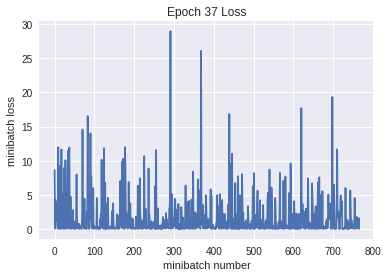

Iteration 28400: with minibatch training loss = 1.44e-05 and accuracy of 1
Iteration 28500: with minibatch training loss = 0.00116 and accuracy of 1
Iteration 28600: with minibatch training loss = 0.000406 and accuracy of 1
Iteration 28700: with minibatch training loss = 0.0392 and accuracy of 0.98
Iteration 28800: with minibatch training loss = 0.00481 and accuracy of 1
Iteration 28900: with minibatch training loss = 0.0754 and accuracy of 0.98
Iteration 29000: with minibatch training loss = 0.0057 and accuracy of 1
Iteration 29100: with minibatch training loss = 0.106 and accuracy of 0.98
Epoch 38, Overall loss = 0.0254 and accuracy of 0.993


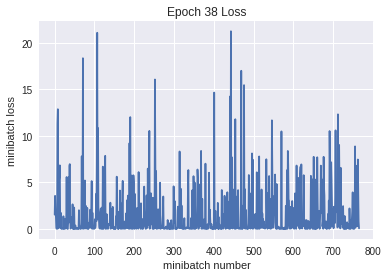

Iteration 29200: with minibatch training loss = 0.00673 and accuracy of 1
Iteration 29300: with minibatch training loss = 0.0044 and accuracy of 1
Iteration 29400: with minibatch training loss = 0.0453 and accuracy of 0.98
Iteration 29500: with minibatch training loss = 0.0008 and accuracy of 1
Iteration 29600: with minibatch training loss = 0.00139 and accuracy of 1
Iteration 29700: with minibatch training loss = 0.00149 and accuracy of 1
Iteration 29800: with minibatch training loss = 0.00353 and accuracy of 1
Epoch 39, Overall loss = 0.0221 and accuracy of 0.993


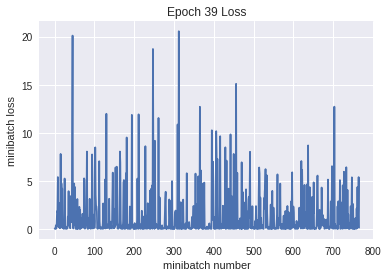

Iteration 29900: with minibatch training loss = 0.00907 and accuracy of 1
Iteration 30000: with minibatch training loss = 0.00375 and accuracy of 1
Iteration 30100: with minibatch training loss = 0.0151 and accuracy of 0.98
Iteration 30200: with minibatch training loss = 0.0172 and accuracy of 0.98
Iteration 30300: with minibatch training loss = 0.0501 and accuracy of 0.98
Iteration 30400: with minibatch training loss = 2.2e-05 and accuracy of 1
Iteration 30500: with minibatch training loss = 0.000405 and accuracy of 1
Iteration 30600: with minibatch training loss = 0.0124 and accuracy of 1
Epoch 40, Overall loss = 0.0228 and accuracy of 0.994


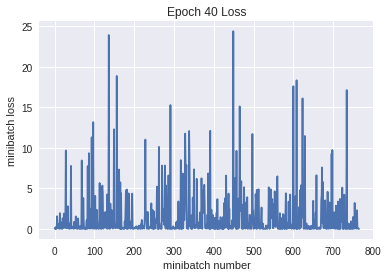

Iteration 30700: with minibatch training loss = 0.0307 and accuracy of 0.98
Iteration 30800: with minibatch training loss = 0.000943 and accuracy of 1
Iteration 30900: with minibatch training loss = 0.00361 and accuracy of 1
Iteration 31000: with minibatch training loss = 0.00174 and accuracy of 1
Iteration 31100: with minibatch training loss = 0.0147 and accuracy of 0.98
Iteration 31200: with minibatch training loss = 0.0161 and accuracy of 0.98
Iteration 31300: with minibatch training loss = 0.0792 and accuracy of 0.97
Iteration 31400: with minibatch training loss = 0.000356 and accuracy of 1
Epoch 41, Overall loss = 0.0213 and accuracy of 0.994


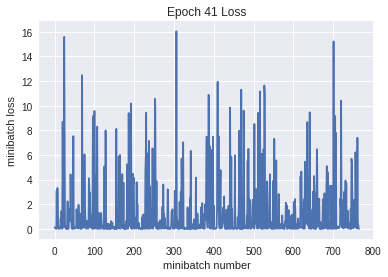

Iteration 31500: with minibatch training loss = 0.000298 and accuracy of 1
Iteration 31600: with minibatch training loss = 0.0284 and accuracy of 0.98
Iteration 31700: with minibatch training loss = 0.00636 and accuracy of 1
Iteration 31800: with minibatch training loss = 1.57e-05 and accuracy of 1
Iteration 31900: with minibatch training loss = 0.000625 and accuracy of 1
Iteration 32000: with minibatch training loss = 1.66e-05 and accuracy of 1
Iteration 32100: with minibatch training loss = 3.56e-06 and accuracy of 1
Epoch 42, Overall loss = 0.0222 and accuracy of 0.994


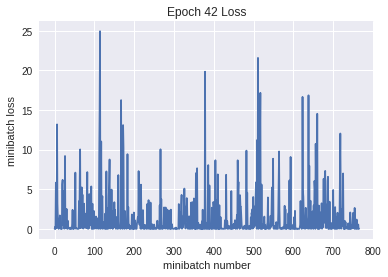

Iteration 32200: with minibatch training loss = 0.0722 and accuracy of 0.98
Iteration 32300: with minibatch training loss = 0.000227 and accuracy of 1
Iteration 32400: with minibatch training loss = 0.245 and accuracy of 0.98
Iteration 32500: with minibatch training loss = 0.0175 and accuracy of 0.98
Iteration 32600: with minibatch training loss = 0.00119 and accuracy of 1
Iteration 32700: with minibatch training loss = 3.04e-05 and accuracy of 1
Iteration 32800: with minibatch training loss = 0.0296 and accuracy of 0.98
Iteration 32900: with minibatch training loss = 7.41e-05 and accuracy of 1
Epoch 43, Overall loss = 0.0219 and accuracy of 0.994


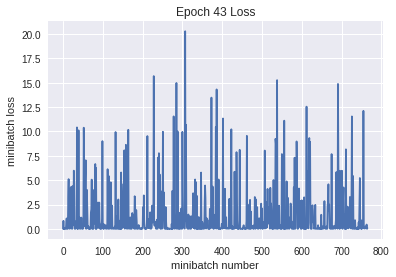

Iteration 33000: with minibatch training loss = 3.61e-05 and accuracy of 1
Iteration 33100: with minibatch training loss = 0.0117 and accuracy of 1
Iteration 33200: with minibatch training loss = 0.00207 and accuracy of 1
Iteration 33300: with minibatch training loss = 1.71e-06 and accuracy of 1
Iteration 33400: with minibatch training loss = 9.95e-06 and accuracy of 1
Iteration 33500: with minibatch training loss = 0.0845 and accuracy of 0.98
Iteration 33600: with minibatch training loss = 4.56e-05 and accuracy of 1
Iteration 33700: with minibatch training loss = 5.59e-05 and accuracy of 1
Epoch 44, Overall loss = 0.0212 and accuracy of 0.994


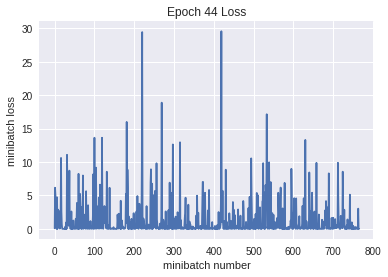

Iteration 33800: with minibatch training loss = 0.0116 and accuracy of 1
Iteration 33900: with minibatch training loss = 0.000182 and accuracy of 1
Iteration 34000: with minibatch training loss = 0.0303 and accuracy of 0.98
Iteration 34100: with minibatch training loss = 0.000835 and accuracy of 1
Iteration 34200: with minibatch training loss = 0.0042 and accuracy of 1
Iteration 34300: with minibatch training loss = 0.105 and accuracy of 0.98
Iteration 34400: with minibatch training loss = 3.01e-05 and accuracy of 1
Epoch 45, Overall loss = 0.0185 and accuracy of 0.995


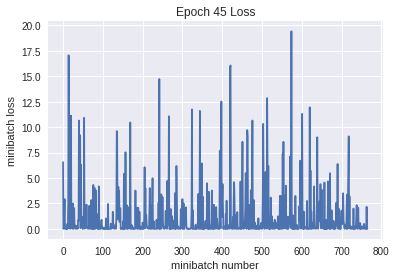

Iteration 34500: with minibatch training loss = 0.0551 and accuracy of 0.98
Iteration 34600: with minibatch training loss = 0.0158 and accuracy of 0.98
Iteration 34700: with minibatch training loss = 0.00291 and accuracy of 1
Iteration 34800: with minibatch training loss = 1.16e-05 and accuracy of 1
Iteration 34900: with minibatch training loss = 0.000121 and accuracy of 1
Iteration 35000: with minibatch training loss = 0.011 and accuracy of 1
Iteration 35100: with minibatch training loss = 0.000193 and accuracy of 1
Iteration 35200: with minibatch training loss = 0.0775 and accuracy of 0.98
Epoch 46, Overall loss = 0.0199 and accuracy of 0.995


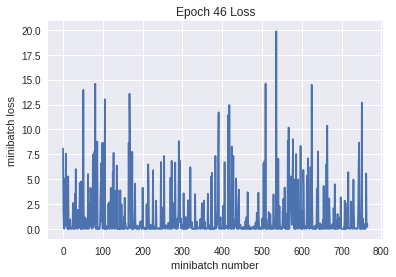

Iteration 35300: with minibatch training loss = 0.0413 and accuracy of 0.97
Iteration 35400: with minibatch training loss = 0.000176 and accuracy of 1
Iteration 35500: with minibatch training loss = 0.000933 and accuracy of 1
Iteration 35600: with minibatch training loss = 0.000521 and accuracy of 1
Iteration 35700: with minibatch training loss = 0.0569 and accuracy of 0.98
Iteration 35800: with minibatch training loss = 0.000285 and accuracy of 1
Iteration 35900: with minibatch training loss = 0.000208 and accuracy of 1
Iteration 36000: with minibatch training loss = 0.0101 and accuracy of 1
Epoch 47, Overall loss = 0.0192 and accuracy of 0.995


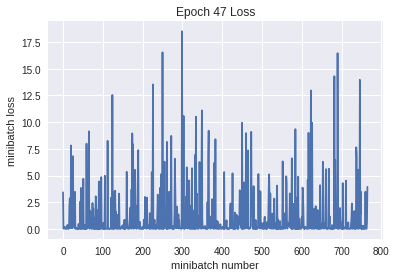

Iteration 36100: with minibatch training loss = 1.28e-06 and accuracy of 1
Iteration 36200: with minibatch training loss = 0.00692 and accuracy of 1
Iteration 36300: with minibatch training loss = 0.0656 and accuracy of 0.97
Iteration 36400: with minibatch training loss = 0.0563 and accuracy of 0.98
Iteration 36500: with minibatch training loss = 0.00763 and accuracy of 1
Iteration 36600: with minibatch training loss = 0.0364 and accuracy of 0.98
Iteration 36700: with minibatch training loss = 0.0066 and accuracy of 1
Epoch 48, Overall loss = 0.0183 and accuracy of 0.995


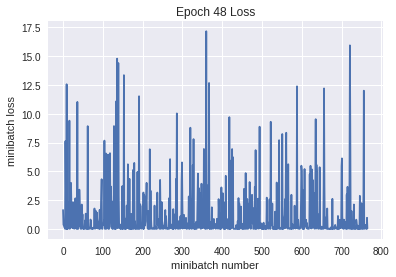

Iteration 36800: with minibatch training loss = 0.000428 and accuracy of 1
Iteration 36900: with minibatch training loss = 0.00426 and accuracy of 1
Iteration 37000: with minibatch training loss = 0.00533 and accuracy of 1
Iteration 37100: with minibatch training loss = 0.0774 and accuracy of 0.98
Iteration 37200: with minibatch training loss = 0.000161 and accuracy of 1
Iteration 37300: with minibatch training loss = 0.0041 and accuracy of 1
Iteration 37400: with minibatch training loss = 0.000106 and accuracy of 1
Iteration 37500: with minibatch training loss = 6.13e-05 and accuracy of 1
Epoch 49, Overall loss = 0.0175 and accuracy of 0.995


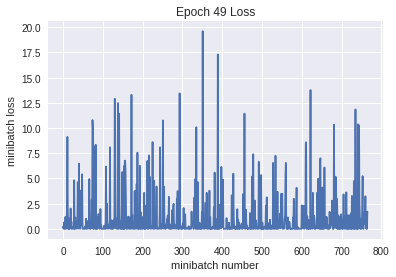

Iteration 37600: with minibatch training loss = 0.00145 and accuracy of 1
Iteration 37700: with minibatch training loss = 0.0646 and accuracy of 0.97
Iteration 37800: with minibatch training loss = 0.0512 and accuracy of 0.98
Iteration 37900: with minibatch training loss = 0.000219 and accuracy of 1
Iteration 38000: with minibatch training loss = 0.0296 and accuracy of 0.98
Iteration 38100: with minibatch training loss = 0.0354 and accuracy of 0.98
Iteration 38200: with minibatch training loss = 0.000204 and accuracy of 1
Epoch 50, Overall loss = 0.0197 and accuracy of 0.995


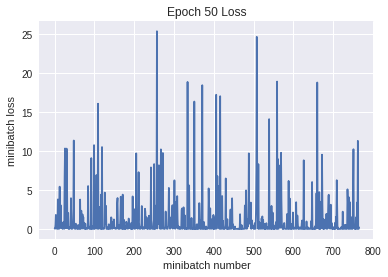

Validation
Epoch 1, Overall loss = 4.73 and accuracy of 0.657


(4.728360527038574, 0.657)

In [28]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,50,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [30]:
def my_model6(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[400, 300])
    baff1 = tf.get_variable("baff1", shape=[300])
    Waff2 = tf.get_variable("Waff2", shape=[300, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    # conv3x3 stride1 padding valid: (13 - 3 + 1 ) / 1  = 11 -> 16*11*11 = 1573
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(11 - 2 + 1 ) / 2  = 5 -> 16*5*5 = 400
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p2_flat = tf.reshape(p2,[-1,400])
    a1 = tf.matmul(p2_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

y_out = my_model6(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.36 and accuracy of 0.17
Iteration 100: with minibatch training loss = 1.81 and accuracy of 0.34
Iteration 200: with minibatch training loss = 1.79 and accuracy of 0.41
Iteration 300: with minibatch training loss = 1.78 and accuracy of 0.36
Iteration 400: with minibatch training loss = 1.51 and accuracy of 0.41
Iteration 500: with minibatch training loss = 1.35 and accuracy of 0.48
Iteration 600: with minibatch training loss = 1.12 and accuracy of 0.67
Iteration 700: with minibatch training loss = 1.17 and accuracy of 0.59
Epoch 1, Overall loss = 1.56 and accuracy of 0.453


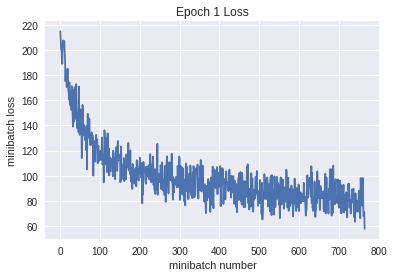

Iteration 800: with minibatch training loss = 1.23 and accuracy of 0.61
Iteration 900: with minibatch training loss = 1.05 and accuracy of 0.59
Iteration 1000: with minibatch training loss = 1.04 and accuracy of 0.7
Iteration 1100: with minibatch training loss = 1.26 and accuracy of 0.62
Iteration 1200: with minibatch training loss = 1.2 and accuracy of 0.5
Iteration 1300: with minibatch training loss = 0.836 and accuracy of 0.7
Iteration 1400: with minibatch training loss = 0.868 and accuracy of 0.69
Iteration 1500: with minibatch training loss = 1.19 and accuracy of 0.56
Epoch 2, Overall loss = 1.14 and accuracy of 0.597


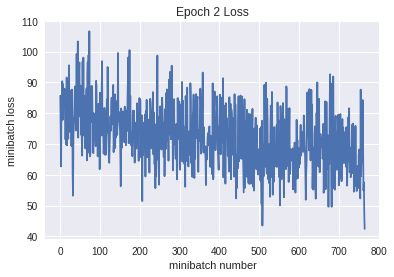

Iteration 1600: with minibatch training loss = 1.31 and accuracy of 0.62
Iteration 1700: with minibatch training loss = 0.913 and accuracy of 0.7
Iteration 1800: with minibatch training loss = 1.17 and accuracy of 0.59
Iteration 1900: with minibatch training loss = 0.814 and accuracy of 0.7
Iteration 2000: with minibatch training loss = 0.915 and accuracy of 0.67
Iteration 2100: with minibatch training loss = 1.15 and accuracy of 0.58
Iteration 2200: with minibatch training loss = 0.825 and accuracy of 0.7
Epoch 3, Overall loss = 0.965 and accuracy of 0.663


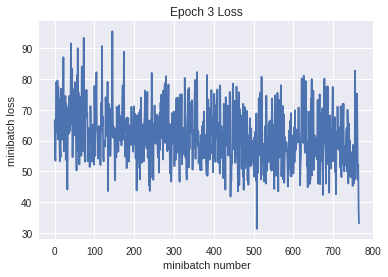

Iteration 2300: with minibatch training loss = 0.732 and accuracy of 0.69
Iteration 2400: with minibatch training loss = 0.692 and accuracy of 0.8
Iteration 2500: with minibatch training loss = 0.875 and accuracy of 0.7
Iteration 2600: with minibatch training loss = 0.89 and accuracy of 0.77
Iteration 2700: with minibatch training loss = 0.977 and accuracy of 0.73
Iteration 2800: with minibatch training loss = 0.782 and accuracy of 0.75
Iteration 2900: with minibatch training loss = 0.904 and accuracy of 0.61
Iteration 3000: with minibatch training loss = 0.813 and accuracy of 0.73
Epoch 4, Overall loss = 0.845 and accuracy of 0.707


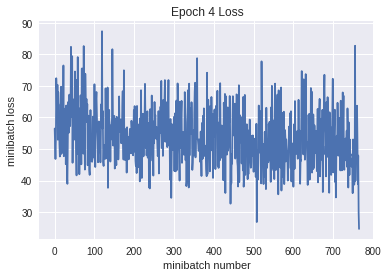

Iteration 3100: with minibatch training loss = 0.78 and accuracy of 0.7
Iteration 3200: with minibatch training loss = 0.692 and accuracy of 0.8
Iteration 3300: with minibatch training loss = 0.846 and accuracy of 0.7
Iteration 3400: with minibatch training loss = 0.742 and accuracy of 0.8
Iteration 3500: with minibatch training loss = 0.696 and accuracy of 0.8
Iteration 3600: with minibatch training loss = 0.763 and accuracy of 0.72
Iteration 3700: with minibatch training loss = 0.525 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.845 and accuracy of 0.78
Epoch 5, Overall loss = 0.75 and accuracy of 0.742


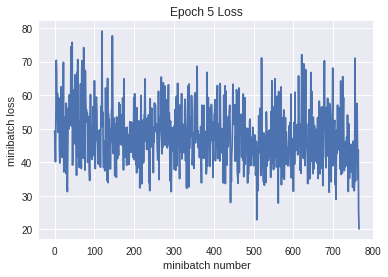

Iteration 3900: with minibatch training loss = 0.712 and accuracy of 0.81
Iteration 4000: with minibatch training loss = 0.692 and accuracy of 0.83
Iteration 4100: with minibatch training loss = 0.528 and accuracy of 0.86
Iteration 4200: with minibatch training loss = 0.871 and accuracy of 0.66
Iteration 4300: with minibatch training loss = 0.607 and accuracy of 0.78
Iteration 4400: with minibatch training loss = 0.491 and accuracy of 0.83
Iteration 4500: with minibatch training loss = 0.737 and accuracy of 0.78
Epoch 6, Overall loss = 0.667 and accuracy of 0.774


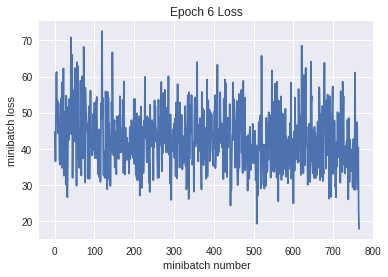

Iteration 4600: with minibatch training loss = 0.882 and accuracy of 0.73
Iteration 4700: with minibatch training loss = 0.652 and accuracy of 0.78
Iteration 4800: with minibatch training loss = 0.467 and accuracy of 0.81
Iteration 4900: with minibatch training loss = 0.385 and accuracy of 0.92
Iteration 5000: with minibatch training loss = 0.446 and accuracy of 0.84
Iteration 5100: with minibatch training loss = 0.524 and accuracy of 0.83
Iteration 5200: with minibatch training loss = 0.786 and accuracy of 0.78
Iteration 5300: with minibatch training loss = 0.665 and accuracy of 0.78
Epoch 7, Overall loss = 0.595 and accuracy of 0.799


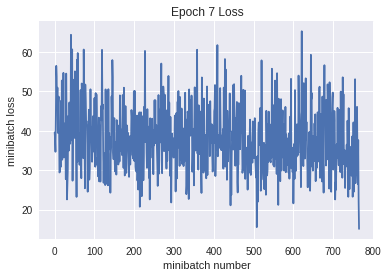

Iteration 5400: with minibatch training loss = 0.567 and accuracy of 0.78
Iteration 5500: with minibatch training loss = 0.423 and accuracy of 0.89
Iteration 5600: with minibatch training loss = 0.454 and accuracy of 0.89
Iteration 5700: with minibatch training loss = 0.673 and accuracy of 0.7
Iteration 5800: with minibatch training loss = 0.652 and accuracy of 0.84
Iteration 5900: with minibatch training loss = 0.632 and accuracy of 0.81
Iteration 6000: with minibatch training loss = 0.293 and accuracy of 0.92
Iteration 6100: with minibatch training loss = 0.263 and accuracy of 0.92
Epoch 8, Overall loss = 0.527 and accuracy of 0.825


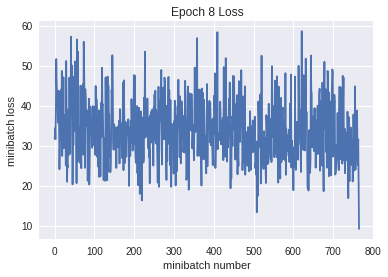

Iteration 6200: with minibatch training loss = 0.393 and accuracy of 0.86
Iteration 6300: with minibatch training loss = 0.595 and accuracy of 0.78
Iteration 6400: with minibatch training loss = 0.458 and accuracy of 0.81
Iteration 6500: with minibatch training loss = 0.353 and accuracy of 0.86
Iteration 6600: with minibatch training loss = 0.3 and accuracy of 0.94
Iteration 6700: with minibatch training loss = 0.492 and accuracy of 0.84
Iteration 6800: with minibatch training loss = 0.324 and accuracy of 0.86
Epoch 9, Overall loss = 0.465 and accuracy of 0.845


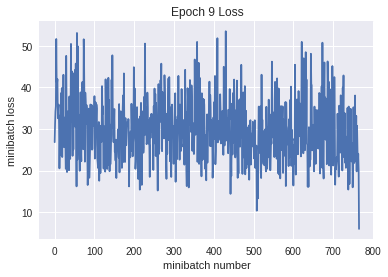

Iteration 6900: with minibatch training loss = 0.587 and accuracy of 0.77
Iteration 7000: with minibatch training loss = 0.549 and accuracy of 0.83
Iteration 7100: with minibatch training loss = 0.308 and accuracy of 0.92
Iteration 7200: with minibatch training loss = 0.554 and accuracy of 0.78
Iteration 7300: with minibatch training loss = 0.543 and accuracy of 0.81
Iteration 7400: with minibatch training loss = 0.333 and accuracy of 0.86
Iteration 7500: with minibatch training loss = 0.267 and accuracy of 0.89
Iteration 7600: with minibatch training loss = 0.279 and accuracy of 0.89
Epoch 10, Overall loss = 0.409 and accuracy of 0.865


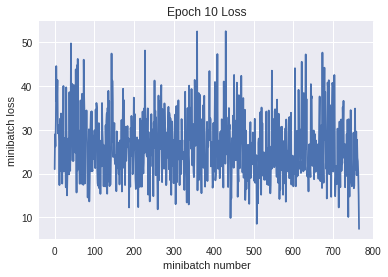

Validation
Epoch 1, Overall loss = 1.44 and accuracy of 0.655


(1.441908127784729, 0.655)

In [31]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [34]:
def my_model7(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[400, 300])
    baff1 = tf.get_variable("baff1", shape=[300])
    Waff2 = tf.get_variable("Waff2", shape=[300, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    # conv3x3 stride1 padding valid: (13 - 3 + 1 ) / 1  = 11 -> 16*11*11 = 1573
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(11 - 2 + 1 ) / 2  = 5 -> 16*5*5 = 400
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p2_flat = tf.reshape(p2,[-1,400])
    a1 = tf.matmul(p2_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

global_step = tf.Variable(0, trainable=False)
starter_learning_rate = 1e-3
learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.96, staircase=True)

y_out = my_model7(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(learning_rate)
train_step = optimizer.minimize(mean_loss, global_step=global_step)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.35 and accuracy of 0.11
Iteration 100: with minibatch training loss = 1.93 and accuracy of 0.31
Iteration 200: with minibatch training loss = 1.57 and accuracy of 0.39
Iteration 300: with minibatch training loss = 1.43 and accuracy of 0.45
Iteration 400: with minibatch training loss = 1.47 and accuracy of 0.42
Iteration 500: with minibatch training loss = 1.3 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.31 and accuracy of 0.61
Iteration 700: with minibatch training loss = 1.18 and accuracy of 0.62
Epoch 1, Overall loss = 1.56 and accuracy of 0.454


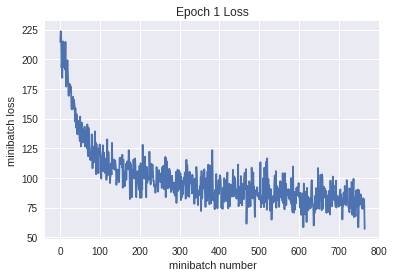

Iteration 800: with minibatch training loss = 1.52 and accuracy of 0.47
Iteration 900: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 1000: with minibatch training loss = 1.1 and accuracy of 0.69
Iteration 1100: with minibatch training loss = 1.17 and accuracy of 0.62
Iteration 1200: with minibatch training loss = 1.4 and accuracy of 0.52
Iteration 1300: with minibatch training loss = 0.95 and accuracy of 0.72
Iteration 1400: with minibatch training loss = 0.977 and accuracy of 0.69
Iteration 1500: with minibatch training loss = 0.919 and accuracy of 0.72
Epoch 2, Overall loss = 1.14 and accuracy of 0.603


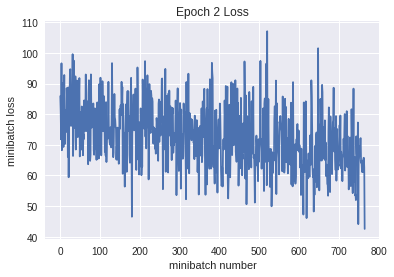

Iteration 1600: with minibatch training loss = 1.06 and accuracy of 0.59
Iteration 1700: with minibatch training loss = 1.11 and accuracy of 0.59
Iteration 1800: with minibatch training loss = 1.18 and accuracy of 0.59
Iteration 1900: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 2000: with minibatch training loss = 0.666 and accuracy of 0.78
Iteration 2100: with minibatch training loss = 0.904 and accuracy of 0.67
Iteration 2200: with minibatch training loss = 0.77 and accuracy of 0.75
Epoch 3, Overall loss = 0.968 and accuracy of 0.662


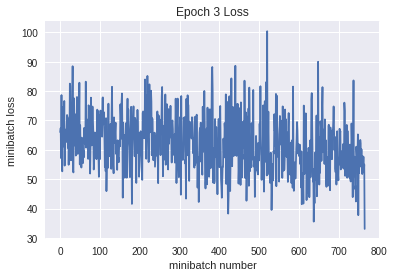

Iteration 2300: with minibatch training loss = 0.789 and accuracy of 0.8
Iteration 2400: with minibatch training loss = 0.888 and accuracy of 0.66
Iteration 2500: with minibatch training loss = 0.852 and accuracy of 0.72
Iteration 2600: with minibatch training loss = 0.822 and accuracy of 0.64
Iteration 2700: with minibatch training loss = 1.08 and accuracy of 0.7
Iteration 2800: with minibatch training loss = 0.808 and accuracy of 0.73
Iteration 2900: with minibatch training loss = 0.859 and accuracy of 0.67
Iteration 3000: with minibatch training loss = 0.941 and accuracy of 0.66
Epoch 4, Overall loss = 0.848 and accuracy of 0.707


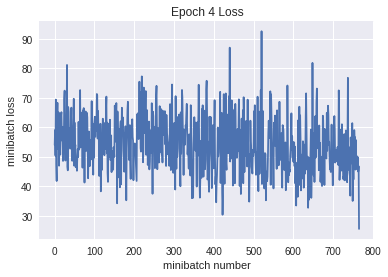

Iteration 3100: with minibatch training loss = 0.826 and accuracy of 0.73
Iteration 3200: with minibatch training loss = 0.827 and accuracy of 0.7
Iteration 3300: with minibatch training loss = 0.685 and accuracy of 0.75
Iteration 3400: with minibatch training loss = 0.783 and accuracy of 0.72
Iteration 3500: with minibatch training loss = 0.74 and accuracy of 0.75
Iteration 3600: with minibatch training loss = 0.666 and accuracy of 0.78
Iteration 3700: with minibatch training loss = 0.681 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.746 and accuracy of 0.69
Epoch 5, Overall loss = 0.751 and accuracy of 0.743


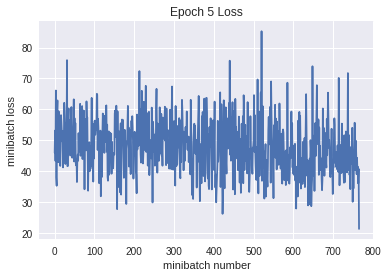

Iteration 3900: with minibatch training loss = 0.599 and accuracy of 0.81
Iteration 4000: with minibatch training loss = 0.777 and accuracy of 0.72
Iteration 4100: with minibatch training loss = 0.6 and accuracy of 0.77
Iteration 4200: with minibatch training loss = 0.797 and accuracy of 0.72
Iteration 4300: with minibatch training loss = 0.804 and accuracy of 0.7
Iteration 4400: with minibatch training loss = 0.729 and accuracy of 0.75
Iteration 4500: with minibatch training loss = 0.584 and accuracy of 0.78
Epoch 6, Overall loss = 0.67 and accuracy of 0.774


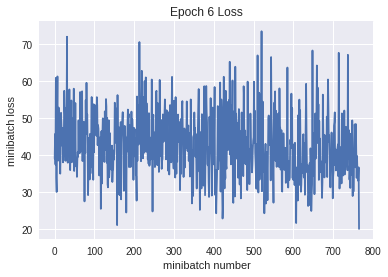

Iteration 4600: with minibatch training loss = 0.47 and accuracy of 0.81
Iteration 4700: with minibatch training loss = 0.601 and accuracy of 0.78
Iteration 4800: with minibatch training loss = 0.444 and accuracy of 0.92
Iteration 4900: with minibatch training loss = 0.828 and accuracy of 0.8
Iteration 5000: with minibatch training loss = 0.404 and accuracy of 0.89
Iteration 5100: with minibatch training loss = 0.594 and accuracy of 0.83
Iteration 5200: with minibatch training loss = 0.583 and accuracy of 0.77
Iteration 5300: with minibatch training loss = 0.729 and accuracy of 0.75
Epoch 7, Overall loss = 0.599 and accuracy of 0.798


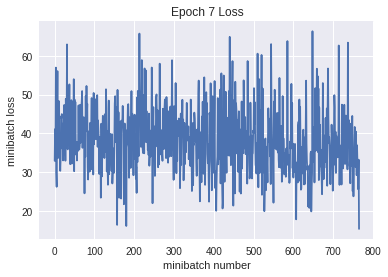

Iteration 5400: with minibatch training loss = 0.588 and accuracy of 0.81
Iteration 5500: with minibatch training loss = 0.432 and accuracy of 0.83
Iteration 5600: with minibatch training loss = 0.445 and accuracy of 0.84
Iteration 5700: with minibatch training loss = 0.545 and accuracy of 0.84
Iteration 5800: with minibatch training loss = 0.7 and accuracy of 0.77
Iteration 5900: with minibatch training loss = 0.668 and accuracy of 0.81
Iteration 6000: with minibatch training loss = 0.341 and accuracy of 0.88
Iteration 6100: with minibatch training loss = 0.563 and accuracy of 0.78
Epoch 8, Overall loss = 0.534 and accuracy of 0.822


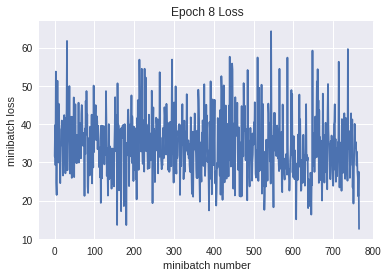

Iteration 6200: with minibatch training loss = 0.556 and accuracy of 0.8
Iteration 6300: with minibatch training loss = 0.533 and accuracy of 0.83
Iteration 6400: with minibatch training loss = 0.505 and accuracy of 0.86
Iteration 6500: with minibatch training loss = 0.572 and accuracy of 0.83
Iteration 6600: with minibatch training loss = 0.523 and accuracy of 0.8
Iteration 6700: with minibatch training loss = 0.3 and accuracy of 0.94
Iteration 6800: with minibatch training loss = 0.288 and accuracy of 0.91
Epoch 9, Overall loss = 0.473 and accuracy of 0.843


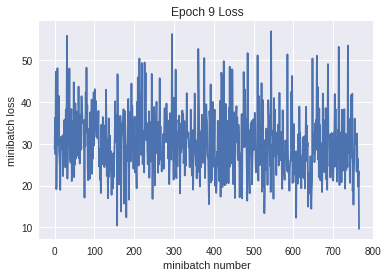

Iteration 6900: with minibatch training loss = 0.53 and accuracy of 0.78
Iteration 7000: with minibatch training loss = 0.406 and accuracy of 0.81
Iteration 7100: with minibatch training loss = 0.297 and accuracy of 0.91
Iteration 7200: with minibatch training loss = 0.285 and accuracy of 0.89
Iteration 7300: with minibatch training loss = 0.205 and accuracy of 0.94
Iteration 7400: with minibatch training loss = 0.278 and accuracy of 0.94
Iteration 7500: with minibatch training loss = 0.339 and accuracy of 0.89
Iteration 7600: with minibatch training loss = 0.593 and accuracy of 0.83
Epoch 10, Overall loss = 0.419 and accuracy of 0.862


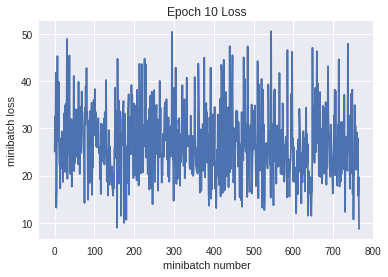

Validation
Epoch 1, Overall loss = 1.49 and accuracy of 0.644


(1.4909161138534546, 0.644)

In [35]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [36]:
def my_model8(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 16, 16])
    bconv3 = tf.get_variable("bconv3", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[16, 100])
    baff1 = tf.get_variable("baff1", shape=[100])
    Waff2 = tf.get_variable("Waff2", shape=[100, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    # conv3x3 stride1 padding valid: (13 - 3 + 1 ) / 1  = 11 -> 16*11*11 = 1573
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(11 - 2 + 1 ) / 2  = 5 -> 16*5*5 = 400
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    # conv3x3 stride1 padding valid: (5 - 3 + 1 ) / 1  = 3 -> 16*3*3 = 144
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(3 - 2 + 1 ) / 2  = 1 -> 16*1*1 = 16
    p3 = tf.nn.max_pool(b3,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p3_flat = tf.reshape(p3,[-1,16])
    a1 = tf.matmul(p3_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

global_step = tf.Variable(0, trainable=False)
starter_learning_rate = 1e-3
learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model8(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(learning_rate)
train_step = optimizer.minimize(mean_loss, global_step=global_step)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 2.5 and accuracy of 0.12
Iteration 100: with minibatch training loss = 2.15 and accuracy of 0.12
Iteration 200: with minibatch training loss = 1.87 and accuracy of 0.25
Iteration 300: with minibatch training loss = 1.63 and accuracy of 0.34
Iteration 400: with minibatch training loss = 1.57 and accuracy of 0.45
Iteration 500: with minibatch training loss = 1.83 and accuracy of 0.33
Iteration 600: with minibatch training loss = 1.49 and accuracy of 0.44
Iteration 700: with minibatch training loss = 1.66 and accuracy of 0.34
Epoch 1, Overall loss = 1.77 and accuracy of 0.35


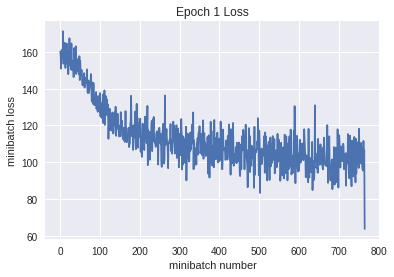

Iteration 800: with minibatch training loss = 1.5 and accuracy of 0.41
Iteration 900: with minibatch training loss = 1.4 and accuracy of 0.42
Iteration 1000: with minibatch training loss = 1.59 and accuracy of 0.48
Iteration 1100: with minibatch training loss = 1.6 and accuracy of 0.44
Iteration 1200: with minibatch training loss = 1.68 and accuracy of 0.44
Iteration 1300: with minibatch training loss = 1.55 and accuracy of 0.39
Iteration 1400: with minibatch training loss = 1.2 and accuracy of 0.58
Iteration 1500: with minibatch training loss = 1.31 and accuracy of 0.53
Epoch 2, Overall loss = 1.5 and accuracy of 0.453


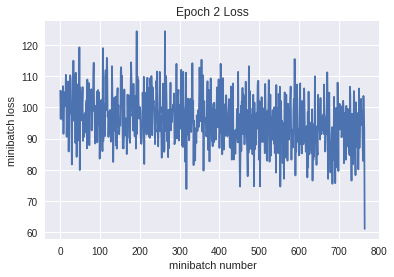

Iteration 1600: with minibatch training loss = 1.63 and accuracy of 0.31
Iteration 1700: with minibatch training loss = 1.25 and accuracy of 0.56
Iteration 1800: with minibatch training loss = 1.45 and accuracy of 0.45
Iteration 1900: with minibatch training loss = 1.41 and accuracy of 0.5
Iteration 2000: with minibatch training loss = 1.36 and accuracy of 0.45
Iteration 2100: with minibatch training loss = 1.41 and accuracy of 0.5
Iteration 2200: with minibatch training loss = 1.43 and accuracy of 0.48
Epoch 3, Overall loss = 1.4 and accuracy of 0.495


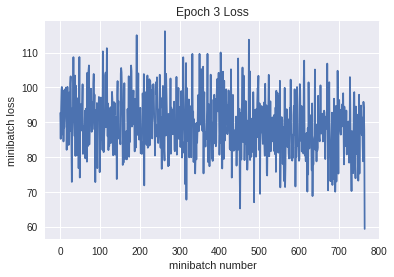

Iteration 2300: with minibatch training loss = 1.36 and accuracy of 0.55
Iteration 2400: with minibatch training loss = 1.47 and accuracy of 0.44
Iteration 2500: with minibatch training loss = 1.16 and accuracy of 0.58
Iteration 2600: with minibatch training loss = 1.17 and accuracy of 0.58
Iteration 2700: with minibatch training loss = 1.18 and accuracy of 0.56
Iteration 2800: with minibatch training loss = 1.05 and accuracy of 0.69
Iteration 2900: with minibatch training loss = 1.4 and accuracy of 0.52
Iteration 3000: with minibatch training loss = 1.37 and accuracy of 0.52
Epoch 4, Overall loss = 1.33 and accuracy of 0.523


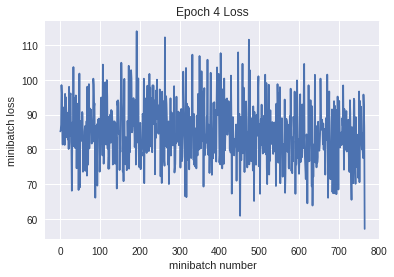

Iteration 3100: with minibatch training loss = 1.22 and accuracy of 0.61
Iteration 3200: with minibatch training loss = 1.33 and accuracy of 0.62
Iteration 3300: with minibatch training loss = 1.32 and accuracy of 0.47
Iteration 3400: with minibatch training loss = 1.36 and accuracy of 0.5
Iteration 3500: with minibatch training loss = 1.24 and accuracy of 0.61
Iteration 3600: with minibatch training loss = 1.22 and accuracy of 0.56
Iteration 3700: with minibatch training loss = 1.08 and accuracy of 0.67
Iteration 3800: with minibatch training loss = 1.07 and accuracy of 0.59
Epoch 5, Overall loss = 1.28 and accuracy of 0.541


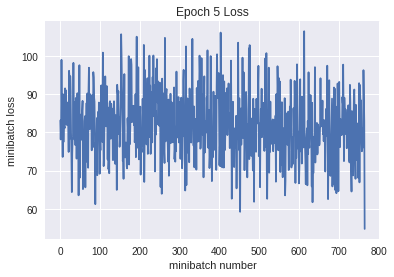

Iteration 3900: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 4000: with minibatch training loss = 1.22 and accuracy of 0.53
Iteration 4100: with minibatch training loss = 1.21 and accuracy of 0.53
Iteration 4200: with minibatch training loss = 1.55 and accuracy of 0.41
Iteration 4300: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 4400: with minibatch training loss = 1.28 and accuracy of 0.52
Iteration 4500: with minibatch training loss = 1.21 and accuracy of 0.55
Epoch 6, Overall loss = 1.24 and accuracy of 0.555


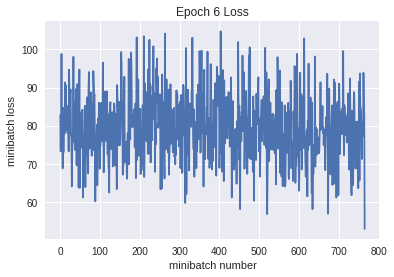

Iteration 4600: with minibatch training loss = 1.24 and accuracy of 0.55
Iteration 4700: with minibatch training loss = 1.28 and accuracy of 0.5
Iteration 4800: with minibatch training loss = 1.03 and accuracy of 0.59
Iteration 4900: with minibatch training loss = 1.33 and accuracy of 0.52
Iteration 5000: with minibatch training loss = 1.27 and accuracy of 0.47
Iteration 5100: with minibatch training loss = 1.23 and accuracy of 0.53
Iteration 5200: with minibatch training loss = 1.12 and accuracy of 0.53
Iteration 5300: with minibatch training loss = 1.24 and accuracy of 0.59
Epoch 7, Overall loss = 1.21 and accuracy of 0.567


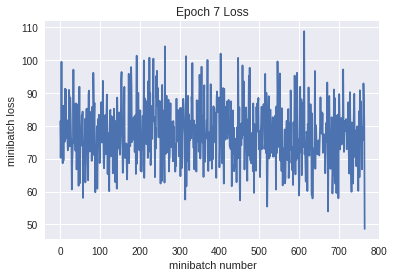

Iteration 5400: with minibatch training loss = 1.09 and accuracy of 0.64
Iteration 5500: with minibatch training loss = 0.938 and accuracy of 0.67
Iteration 5600: with minibatch training loss = 1 and accuracy of 0.66
Iteration 5700: with minibatch training loss = 1.15 and accuracy of 0.56
Iteration 5800: with minibatch training loss = 1.05 and accuracy of 0.69
Iteration 5900: with minibatch training loss = 1.21 and accuracy of 0.62
Iteration 6000: with minibatch training loss = 1.12 and accuracy of 0.61
Iteration 6100: with minibatch training loss = 1.3 and accuracy of 0.59
Epoch 8, Overall loss = 1.19 and accuracy of 0.576


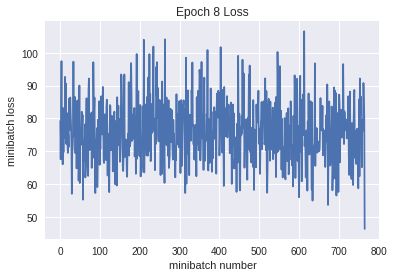

Iteration 6200: with minibatch training loss = 1.35 and accuracy of 0.56
Iteration 6300: with minibatch training loss = 1.45 and accuracy of 0.44
Iteration 6400: with minibatch training loss = 1.33 and accuracy of 0.56
Iteration 6500: with minibatch training loss = 1.02 and accuracy of 0.67
Iteration 6600: with minibatch training loss = 1.23 and accuracy of 0.58
Iteration 6700: with minibatch training loss = 1.15 and accuracy of 0.58
Iteration 6800: with minibatch training loss = 1.29 and accuracy of 0.5
Epoch 9, Overall loss = 1.17 and accuracy of 0.583


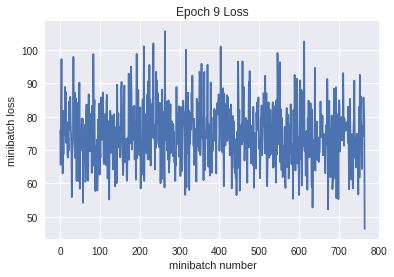

Iteration 6900: with minibatch training loss = 0.956 and accuracy of 0.69
Iteration 7000: with minibatch training loss = 1.17 and accuracy of 0.59
Iteration 7100: with minibatch training loss = 1.14 and accuracy of 0.58
Iteration 7200: with minibatch training loss = 0.975 and accuracy of 0.66
Iteration 7300: with minibatch training loss = 1.16 and accuracy of 0.61
Iteration 7400: with minibatch training loss = 1.32 and accuracy of 0.56
Iteration 7500: with minibatch training loss = 1.41 and accuracy of 0.53
Iteration 7600: with minibatch training loss = 1.28 and accuracy of 0.56
Epoch 10, Overall loss = 1.15 and accuracy of 0.591


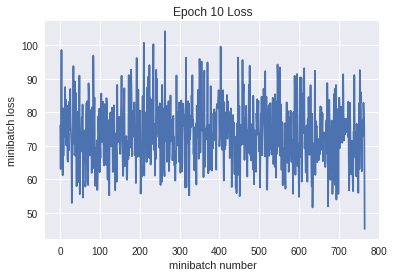

Validation
Epoch 1, Overall loss = 1.21 and accuracy of 0.56


(1.209507360458374, 0.56)

In [37]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [38]:
def my_model9(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 16, 16])
    bconv3 = tf.get_variable("bconv3", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[16, 100])
    baff1 = tf.get_variable("baff1", shape=[100])
    Waff2 = tf.get_variable("Waff2", shape=[100, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    # conv3x3 stride1 padding valid: (13 - 3 + 1 ) / 1  = 11 -> 16*11*11 = 1573
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(11 - 2 + 1 ) / 2  = 5 -> 16*5*5 = 400
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    # conv3x3 stride1 padding valid: (5 - 3 + 1 ) / 1  = 3 -> 16*3*3 = 144
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(3 - 2 + 1 ) / 2  = 1 -> 16*1*1 = 16
    p3 = tf.nn.max_pool(b3,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p3_flat = tf.reshape(p3,[-1,16])
    a1 = tf.matmul(p3_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model9(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 2.79 and accuracy of 0.062
Iteration 100: with minibatch training loss = 1.91 and accuracy of 0.2
Iteration 200: with minibatch training loss = 1.84 and accuracy of 0.39
Iteration 300: with minibatch training loss = 1.7 and accuracy of 0.36
Iteration 400: with minibatch training loss = 1.65 and accuracy of 0.42
Iteration 500: with minibatch training loss = 1.74 and accuracy of 0.38
Iteration 600: with minibatch training loss = 1.71 and accuracy of 0.33
Iteration 700: with minibatch training loss = 1.55 and accuracy of 0.44
Epoch 1, Overall loss = 1.77 and accuracy of 0.353


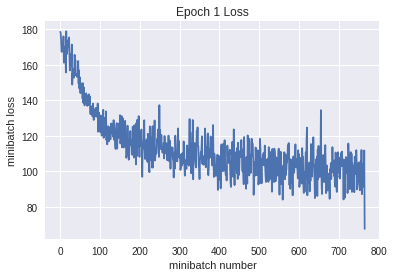

Iteration 800: with minibatch training loss = 1.35 and accuracy of 0.45
Iteration 900: with minibatch training loss = 1.42 and accuracy of 0.42
Iteration 1000: with minibatch training loss = 1.32 and accuracy of 0.45
Iteration 1100: with minibatch training loss = 1.23 and accuracy of 0.55
Iteration 1200: with minibatch training loss = 1.28 and accuracy of 0.53
Iteration 1300: with minibatch training loss = 1.43 and accuracy of 0.53
Iteration 1400: with minibatch training loss = 1.61 and accuracy of 0.48
Iteration 1500: with minibatch training loss = 1.56 and accuracy of 0.38
Epoch 2, Overall loss = 1.46 and accuracy of 0.466


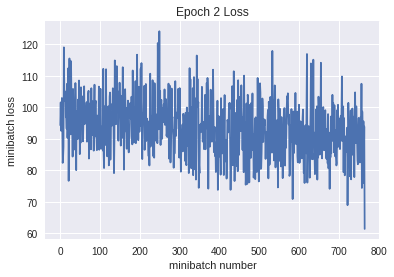

Iteration 1600: with minibatch training loss = 1.52 and accuracy of 0.47
Iteration 1700: with minibatch training loss = 1.37 and accuracy of 0.58
Iteration 1800: with minibatch training loss = 1.29 and accuracy of 0.56
Iteration 1900: with minibatch training loss = 1.53 and accuracy of 0.41
Iteration 2000: with minibatch training loss = 1.49 and accuracy of 0.52
Iteration 2100: with minibatch training loss = 1.32 and accuracy of 0.52
Iteration 2200: with minibatch training loss = 1.26 and accuracy of 0.53
Epoch 3, Overall loss = 1.36 and accuracy of 0.508


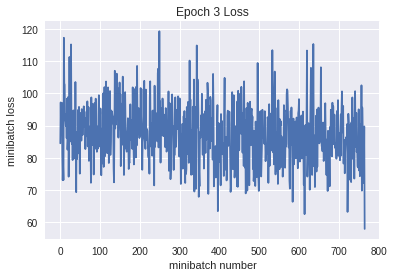

Iteration 2300: with minibatch training loss = 1.21 and accuracy of 0.61
Iteration 2400: with minibatch training loss = 1.42 and accuracy of 0.52
Iteration 2500: with minibatch training loss = 1.54 and accuracy of 0.45
Iteration 2600: with minibatch training loss = 1.25 and accuracy of 0.55
Iteration 2700: with minibatch training loss = 1.19 and accuracy of 0.59
Iteration 2800: with minibatch training loss = 1.34 and accuracy of 0.44
Iteration 2900: with minibatch training loss = 1.17 and accuracy of 0.58
Iteration 3000: with minibatch training loss = 1.26 and accuracy of 0.5
Epoch 4, Overall loss = 1.3 and accuracy of 0.534


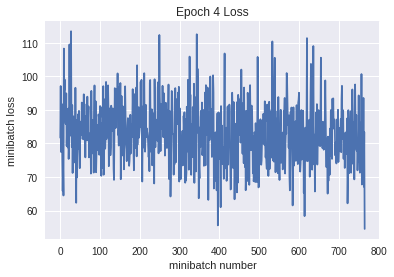

Iteration 3100: with minibatch training loss = 1.22 and accuracy of 0.62
Iteration 3200: with minibatch training loss = 1.28 and accuracy of 0.55
Iteration 3300: with minibatch training loss = 0.994 and accuracy of 0.67
Iteration 3400: with minibatch training loss = 1.43 and accuracy of 0.5
Iteration 3500: with minibatch training loss = 1.35 and accuracy of 0.52
Iteration 3600: with minibatch training loss = 1.17 and accuracy of 0.62
Iteration 3700: with minibatch training loss = 1.66 and accuracy of 0.41
Iteration 3800: with minibatch training loss = 1.33 and accuracy of 0.55
Epoch 5, Overall loss = 1.25 and accuracy of 0.552


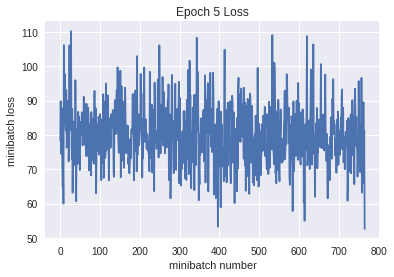

Iteration 3900: with minibatch training loss = 1.3 and accuracy of 0.55
Iteration 4000: with minibatch training loss = 1.21 and accuracy of 0.48
Iteration 4100: with minibatch training loss = 1.44 and accuracy of 0.48
Iteration 4200: with minibatch training loss = 1.39 and accuracy of 0.52
Iteration 4300: with minibatch training loss = 1.03 and accuracy of 0.58
Iteration 4400: with minibatch training loss = 1.48 and accuracy of 0.53
Iteration 4500: with minibatch training loss = 1.23 and accuracy of 0.55
Epoch 6, Overall loss = 1.22 and accuracy of 0.566


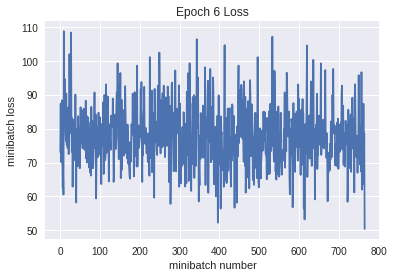

Iteration 4600: with minibatch training loss = 1.38 and accuracy of 0.48
Iteration 4700: with minibatch training loss = 1.23 and accuracy of 0.55
Iteration 4800: with minibatch training loss = 1.43 and accuracy of 0.48
Iteration 4900: with minibatch training loss = 1.11 and accuracy of 0.61
Iteration 5000: with minibatch training loss = 1.28 and accuracy of 0.45
Iteration 5100: with minibatch training loss = 0.964 and accuracy of 0.66
Iteration 5200: with minibatch training loss = 0.989 and accuracy of 0.7
Iteration 5300: with minibatch training loss = 1.25 and accuracy of 0.5
Epoch 7, Overall loss = 1.19 and accuracy of 0.577


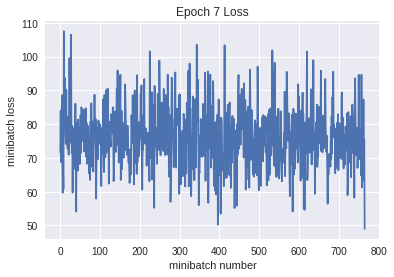

Iteration 5400: with minibatch training loss = 1.32 and accuracy of 0.55
Iteration 5500: with minibatch training loss = 1.19 and accuracy of 0.61
Iteration 5600: with minibatch training loss = 1.13 and accuracy of 0.61
Iteration 5700: with minibatch training loss = 1.24 and accuracy of 0.53
Iteration 5800: with minibatch training loss = 0.825 and accuracy of 0.72
Iteration 5900: with minibatch training loss = 1.31 and accuracy of 0.47
Iteration 6000: with minibatch training loss = 1.08 and accuracy of 0.56
Iteration 6100: with minibatch training loss = 1.15 and accuracy of 0.55
Epoch 8, Overall loss = 1.17 and accuracy of 0.584


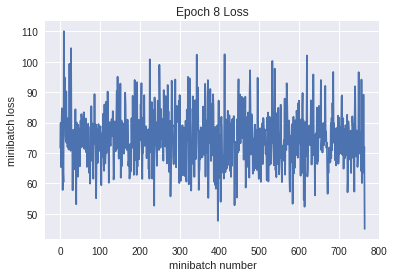

Iteration 6200: with minibatch training loss = 0.985 and accuracy of 0.64
Iteration 6300: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 6400: with minibatch training loss = 1.25 and accuracy of 0.53
Iteration 6500: with minibatch training loss = 0.854 and accuracy of 0.64
Iteration 6600: with minibatch training loss = 1.3 and accuracy of 0.52
Iteration 6700: with minibatch training loss = 1.11 and accuracy of 0.55
Iteration 6800: with minibatch training loss = 0.882 and accuracy of 0.61
Epoch 9, Overall loss = 1.15 and accuracy of 0.591


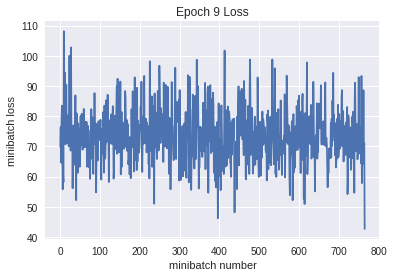

Iteration 6900: with minibatch training loss = 0.862 and accuracy of 0.72
Iteration 7000: with minibatch training loss = 1.18 and accuracy of 0.52
Iteration 7100: with minibatch training loss = 0.959 and accuracy of 0.67
Iteration 7200: with minibatch training loss = 0.979 and accuracy of 0.62
Iteration 7300: with minibatch training loss = 1.19 and accuracy of 0.56
Iteration 7400: with minibatch training loss = 0.986 and accuracy of 0.59
Iteration 7500: with minibatch training loss = 1.25 and accuracy of 0.62
Iteration 7600: with minibatch training loss = 1.11 and accuracy of 0.61
Epoch 10, Overall loss = 1.13 and accuracy of 0.598


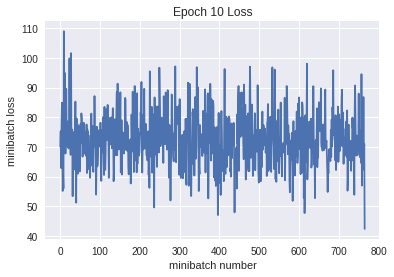

Validation
Epoch 1, Overall loss = 1.22 and accuracy of 0.588


(1.220081166267395, 0.588)

In [39]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [42]:
def my_model10(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 16, 16])
    bconv3 = tf.get_variable("bconv3", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[1936, 512])
    baff1 = tf.get_variable("baff1", shape=[512])
    Waff2 = tf.get_variable("Waff2", shape=[512, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 16*24*24 = 9216
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(11 - 2 + 1 ) / 2  = 5 -> 16*5*5 = 400
    #p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p2 = b2
    # conv3x3 stride1 padding valid: (24 - 3 + 1 ) / 1  = 22 -> 16*22*22 = 7744
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(22 - 2 + 1 ) / 2  = 10.5 -> 16*11*11 = 1936
    p3 = tf.nn.max_pool(b3,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p3_flat = tf.reshape(p3,[-1,1936])
    a1 = tf.matmul(p3_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model10(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 4.5 and accuracy of 0.062
Iteration 100: with minibatch training loss = 2.24 and accuracy of 0.28
Iteration 200: with minibatch training loss = 1.62 and accuracy of 0.42
Iteration 300: with minibatch training loss = 1.38 and accuracy of 0.52
Iteration 400: with minibatch training loss = 1.41 and accuracy of 0.52
Iteration 500: with minibatch training loss = 1.42 and accuracy of 0.48
Iteration 600: with minibatch training loss = 1.25 and accuracy of 0.62
Iteration 700: with minibatch training loss = 1.27 and accuracy of 0.55
Epoch 1, Overall loss = 1.58 and accuracy of 0.456


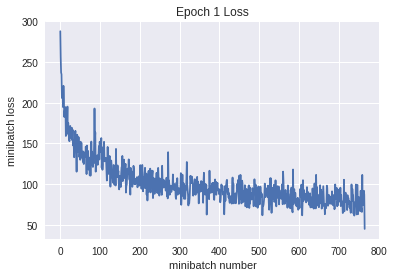

Iteration 800: with minibatch training loss = 0.875 and accuracy of 0.72
Iteration 900: with minibatch training loss = 1.26 and accuracy of 0.53
Iteration 1000: with minibatch training loss = 1.3 and accuracy of 0.53
Iteration 1100: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 1200: with minibatch training loss = 0.887 and accuracy of 0.64
Iteration 1300: with minibatch training loss = 0.908 and accuracy of 0.67
Iteration 1400: with minibatch training loss = 1.15 and accuracy of 0.58
Iteration 1500: with minibatch training loss = 0.964 and accuracy of 0.7
Epoch 2, Overall loss = 1.05 and accuracy of 0.635


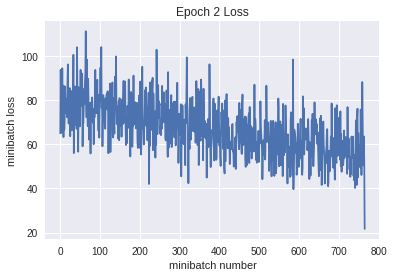

Iteration 1600: with minibatch training loss = 0.909 and accuracy of 0.66
Iteration 1700: with minibatch training loss = 0.763 and accuracy of 0.75
Iteration 1800: with minibatch training loss = 0.714 and accuracy of 0.8
Iteration 1900: with minibatch training loss = 0.467 and accuracy of 0.8
Iteration 2000: with minibatch training loss = 0.641 and accuracy of 0.81
Iteration 2100: with minibatch training loss = 0.669 and accuracy of 0.75
Iteration 2200: with minibatch training loss = 0.503 and accuracy of 0.83
Epoch 3, Overall loss = 0.736 and accuracy of 0.747


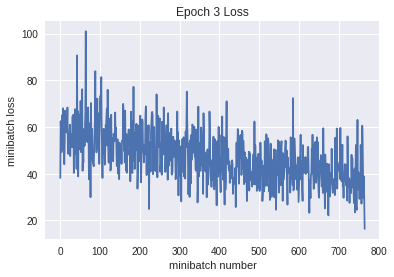

Iteration 2300: with minibatch training loss = 0.582 and accuracy of 0.8
Iteration 2400: with minibatch training loss = 0.559 and accuracy of 0.86
Iteration 2500: with minibatch training loss = 0.441 and accuracy of 0.84
Iteration 2600: with minibatch training loss = 0.387 and accuracy of 0.89
Iteration 2700: with minibatch training loss = 0.429 and accuracy of 0.88
Iteration 2800: with minibatch training loss = 0.222 and accuracy of 0.95
Iteration 2900: with minibatch training loss = 0.465 and accuracy of 0.88
Iteration 3000: with minibatch training loss = 0.384 and accuracy of 0.86
Epoch 4, Overall loss = 0.47 and accuracy of 0.843


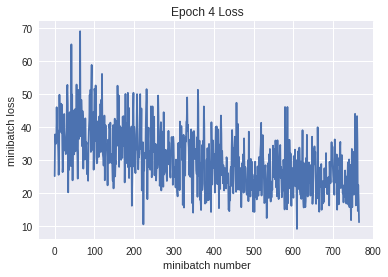

Iteration 3100: with minibatch training loss = 0.364 and accuracy of 0.84
Iteration 3200: with minibatch training loss = 0.289 and accuracy of 0.86
Iteration 3300: with minibatch training loss = 0.434 and accuracy of 0.86
Iteration 3400: with minibatch training loss = 0.467 and accuracy of 0.84
Iteration 3500: with minibatch training loss = 0.302 and accuracy of 0.89
Iteration 3600: with minibatch training loss = 0.142 and accuracy of 0.95
Iteration 3700: with minibatch training loss = 0.269 and accuracy of 0.94
Iteration 3800: with minibatch training loss = 0.334 and accuracy of 0.84
Epoch 5, Overall loss = 0.286 and accuracy of 0.905


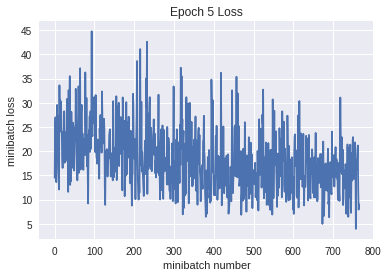

Iteration 3900: with minibatch training loss = 0.234 and accuracy of 0.89
Iteration 4000: with minibatch training loss = 0.146 and accuracy of 0.95
Iteration 4100: with minibatch training loss = 0.0413 and accuracy of 1
Iteration 4200: with minibatch training loss = 0.27 and accuracy of 0.92
Iteration 4300: with minibatch training loss = 0.103 and accuracy of 0.95
Iteration 4400: with minibatch training loss = 0.168 and accuracy of 0.92
Iteration 4500: with minibatch training loss = 0.264 and accuracy of 0.89
Epoch 6, Overall loss = 0.196 and accuracy of 0.932


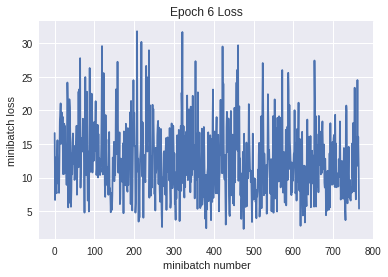

Iteration 4600: with minibatch training loss = 0.19 and accuracy of 0.94
Iteration 4700: with minibatch training loss = 0.19 and accuracy of 0.92
Iteration 4800: with minibatch training loss = 0.0996 and accuracy of 0.95
Iteration 4900: with minibatch training loss = 0.0839 and accuracy of 0.97
Iteration 5000: with minibatch training loss = 0.133 and accuracy of 0.94
Iteration 5100: with minibatch training loss = 0.169 and accuracy of 0.95
Iteration 5200: with minibatch training loss = 0.155 and accuracy of 0.94
Iteration 5300: with minibatch training loss = 0.315 and accuracy of 0.88
Epoch 7, Overall loss = 0.161 and accuracy of 0.945


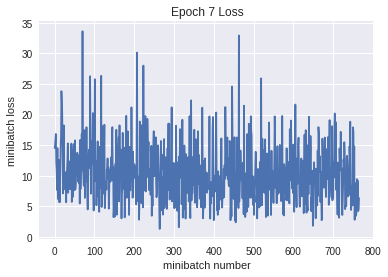

Iteration 5400: with minibatch training loss = 0.0959 and accuracy of 0.98
Iteration 5500: with minibatch training loss = 0.0629 and accuracy of 0.98
Iteration 5600: with minibatch training loss = 0.14 and accuracy of 0.92
Iteration 5700: with minibatch training loss = 0.109 and accuracy of 0.94
Iteration 5800: with minibatch training loss = 0.15 and accuracy of 0.95
Iteration 5900: with minibatch training loss = 0.181 and accuracy of 0.94
Iteration 6000: with minibatch training loss = 0.0613 and accuracy of 0.97
Iteration 6100: with minibatch training loss = 0.187 and accuracy of 0.94
Epoch 8, Overall loss = 0.137 and accuracy of 0.953


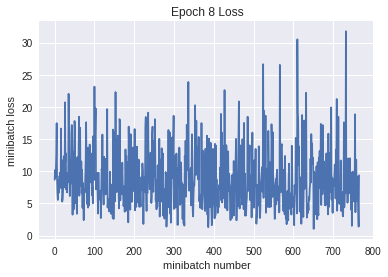

Iteration 6200: with minibatch training loss = 0.0675 and accuracy of 0.98
Iteration 6300: with minibatch training loss = 0.0719 and accuracy of 0.95
Iteration 6400: with minibatch training loss = 0.0548 and accuracy of 0.98
Iteration 6500: with minibatch training loss = 0.0303 and accuracy of 1
Iteration 6600: with minibatch training loss = 0.0319 and accuracy of 1
Iteration 6700: with minibatch training loss = 0.175 and accuracy of 0.94
Iteration 6800: with minibatch training loss = 0.128 and accuracy of 0.92
Epoch 9, Overall loss = 0.116 and accuracy of 0.959


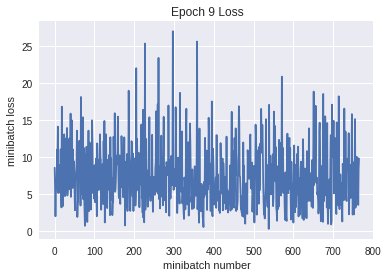

Iteration 6900: with minibatch training loss = 0.0962 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.0385 and accuracy of 1
Iteration 7100: with minibatch training loss = 0.232 and accuracy of 0.91
Iteration 7200: with minibatch training loss = 0.0831 and accuracy of 0.95
Iteration 7300: with minibatch training loss = 0.0436 and accuracy of 0.98
Iteration 7400: with minibatch training loss = 0.132 and accuracy of 0.92
Iteration 7500: with minibatch training loss = 0.049 and accuracy of 0.98
Iteration 7600: with minibatch training loss = 0.151 and accuracy of 0.92
Epoch 10, Overall loss = 0.106 and accuracy of 0.964


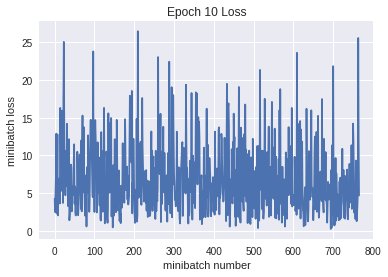

Validation
Epoch 1, Overall loss = 2.84 and accuracy of 0.606


(2.843586742401123, 0.606)

In [43]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [49]:
def my_model11(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 16, 16])
    bconv3 = tf.get_variable("bconv3", shape=[16])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 16, 16])
    bconv4 = tf.get_variable("bconv4", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[1600, 512])
    baff1 = tf.get_variable("baff1", shape=[512])
    Waff2 = tf.get_variable("Waff2", shape=[512, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 16*24*24 = 9216
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(11 - 2 + 1 ) / 2  = 5 -> 16*5*5 = 400
    #p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p2 = b2
    # conv3x3 stride1 padding valid: (24 - 3 + 1 ) / 1  = 22 -> 16*22*22 = 7744
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (22 - 3 + 1 ) / 1  = 20 -> 16*20*20 = 6400
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    b4 = tf.layers.batch_normalization(r4, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(20 - 2 + 1 ) / 2  = 9.5 -> 16*10*10 = 1600
    p4 = tf.nn.max_pool(b4,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p4_flat = tf.reshape(p4,[-1,1600])
    a1 = tf.matmul(p4_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model11(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.46 and accuracy of 0.16
Iteration 100: with minibatch training loss = 2.1 and accuracy of 0.31
Iteration 200: with minibatch training loss = 1.48 and accuracy of 0.44
Iteration 300: with minibatch training loss = 1.58 and accuracy of 0.42
Iteration 400: with minibatch training loss = 1.54 and accuracy of 0.41
Iteration 500: with minibatch training loss = 1.4 and accuracy of 0.53
Iteration 600: with minibatch training loss = 1.65 and accuracy of 0.36
Iteration 700: with minibatch training loss = 1.26 and accuracy of 0.55
Epoch 1, Overall loss = 1.62 and accuracy of 0.436


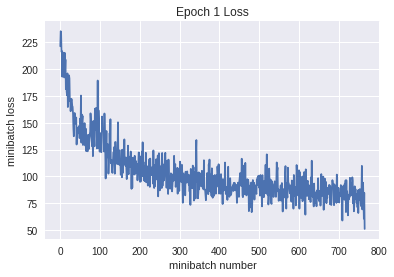

Iteration 800: with minibatch training loss = 1.27 and accuracy of 0.62
Iteration 900: with minibatch training loss = 1.41 and accuracy of 0.52
Iteration 1000: with minibatch training loss = 1.45 and accuracy of 0.55
Iteration 1100: with minibatch training loss = 1.4 and accuracy of 0.53
Iteration 1200: with minibatch training loss = 1.02 and accuracy of 0.58
Iteration 1300: with minibatch training loss = 1.15 and accuracy of 0.61
Iteration 1400: with minibatch training loss = 0.895 and accuracy of 0.67
Iteration 1500: with minibatch training loss = 1.07 and accuracy of 0.56
Epoch 2, Overall loss = 1.12 and accuracy of 0.604


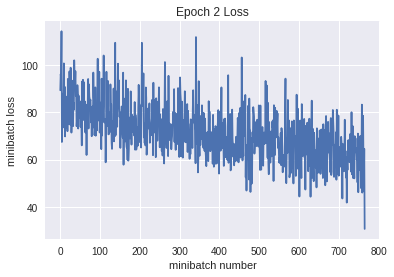

Iteration 1600: with minibatch training loss = 0.917 and accuracy of 0.75
Iteration 1700: with minibatch training loss = 0.848 and accuracy of 0.61
Iteration 1800: with minibatch training loss = 0.76 and accuracy of 0.75
Iteration 1900: with minibatch training loss = 0.917 and accuracy of 0.62
Iteration 2000: with minibatch training loss = 0.385 and accuracy of 0.84
Iteration 2100: with minibatch training loss = 0.523 and accuracy of 0.84
Iteration 2200: with minibatch training loss = 0.873 and accuracy of 0.72
Epoch 3, Overall loss = 0.837 and accuracy of 0.708


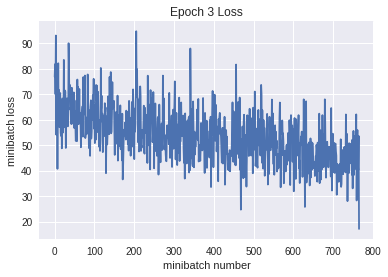

Iteration 2300: with minibatch training loss = 0.791 and accuracy of 0.75
Iteration 2400: with minibatch training loss = 0.609 and accuracy of 0.84
Iteration 2500: with minibatch training loss = 0.706 and accuracy of 0.73
Iteration 2600: with minibatch training loss = 0.883 and accuracy of 0.67
Iteration 2700: with minibatch training loss = 0.836 and accuracy of 0.7
Iteration 2800: with minibatch training loss = 0.512 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 0.538 and accuracy of 0.77
Iteration 3000: with minibatch training loss = 0.419 and accuracy of 0.86
Epoch 4, Overall loss = 0.584 and accuracy of 0.799


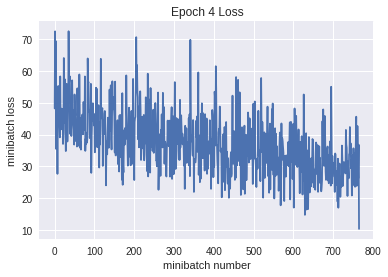

Iteration 3100: with minibatch training loss = 0.599 and accuracy of 0.81
Iteration 3200: with minibatch training loss = 0.264 and accuracy of 0.89
Iteration 3300: with minibatch training loss = 0.262 and accuracy of 0.91
Iteration 3400: with minibatch training loss = 0.318 and accuracy of 0.88
Iteration 3500: with minibatch training loss = 0.307 and accuracy of 0.86
Iteration 3600: with minibatch training loss = 0.314 and accuracy of 0.89
Iteration 3700: with minibatch training loss = 0.368 and accuracy of 0.86
Iteration 3800: with minibatch training loss = 0.145 and accuracy of 0.95
Epoch 5, Overall loss = 0.389 and accuracy of 0.869


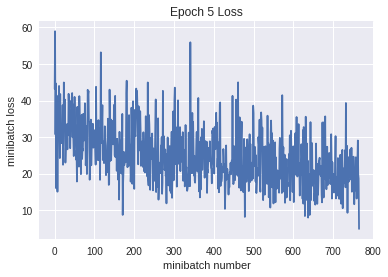

Iteration 3900: with minibatch training loss = 0.254 and accuracy of 0.91
Iteration 4000: with minibatch training loss = 0.275 and accuracy of 0.92
Iteration 4100: with minibatch training loss = 0.246 and accuracy of 0.89
Iteration 4200: with minibatch training loss = 0.305 and accuracy of 0.92
Iteration 4300: with minibatch training loss = 0.197 and accuracy of 0.91
Iteration 4400: with minibatch training loss = 0.157 and accuracy of 0.95
Iteration 4500: with minibatch training loss = 0.146 and accuracy of 0.95
Epoch 6, Overall loss = 0.26 and accuracy of 0.912


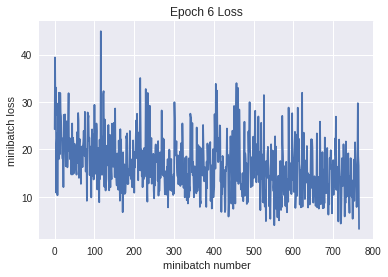

Iteration 4600: with minibatch training loss = 0.148 and accuracy of 0.95
Iteration 4700: with minibatch training loss = 0.335 and accuracy of 0.86
Iteration 4800: with minibatch training loss = 0.329 and accuracy of 0.89
Iteration 4900: with minibatch training loss = 0.097 and accuracy of 0.95
Iteration 5000: with minibatch training loss = 0.233 and accuracy of 0.92
Iteration 5100: with minibatch training loss = 0.157 and accuracy of 0.94
Iteration 5200: with minibatch training loss = 0.248 and accuracy of 0.92
Iteration 5300: with minibatch training loss = 0.289 and accuracy of 0.86
Epoch 7, Overall loss = 0.197 and accuracy of 0.931


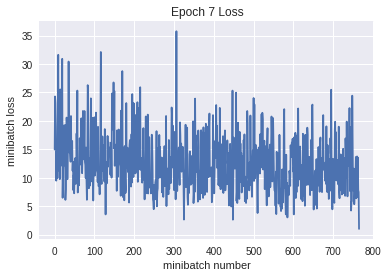

Iteration 5400: with minibatch training loss = 0.251 and accuracy of 0.91
Iteration 5500: with minibatch training loss = 0.174 and accuracy of 0.94
Iteration 5600: with minibatch training loss = 0.165 and accuracy of 0.95
Iteration 5700: with minibatch training loss = 0.14 and accuracy of 0.97
Iteration 5800: with minibatch training loss = 0.118 and accuracy of 0.95
Iteration 5900: with minibatch training loss = 0.139 and accuracy of 0.95
Iteration 6000: with minibatch training loss = 0.199 and accuracy of 0.91
Iteration 6100: with minibatch training loss = 0.239 and accuracy of 0.94
Epoch 8, Overall loss = 0.166 and accuracy of 0.942


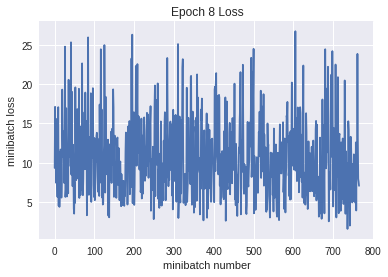

Iteration 6200: with minibatch training loss = 0.135 and accuracy of 0.94
Iteration 6300: with minibatch training loss = 0.0818 and accuracy of 0.97
Iteration 6400: with minibatch training loss = 0.317 and accuracy of 0.89
Iteration 6500: with minibatch training loss = 0.18 and accuracy of 0.92
Iteration 6600: with minibatch training loss = 0.0546 and accuracy of 0.98
Iteration 6700: with minibatch training loss = 0.101 and accuracy of 0.95
Iteration 6800: with minibatch training loss = 0.0929 and accuracy of 0.95
Epoch 9, Overall loss = 0.142 and accuracy of 0.95


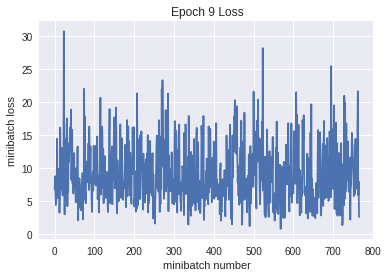

Iteration 6900: with minibatch training loss = 0.0452 and accuracy of 0.98
Iteration 7000: with minibatch training loss = 0.144 and accuracy of 0.92
Iteration 7100: with minibatch training loss = 0.2 and accuracy of 0.97
Iteration 7200: with minibatch training loss = 0.103 and accuracy of 0.98
Iteration 7300: with minibatch training loss = 0.292 and accuracy of 0.94
Iteration 7400: with minibatch training loss = 0.116 and accuracy of 0.97
Iteration 7500: with minibatch training loss = 0.0635 and accuracy of 0.98
Iteration 7600: with minibatch training loss = 0.153 and accuracy of 0.97
Epoch 10, Overall loss = 0.123 and accuracy of 0.958


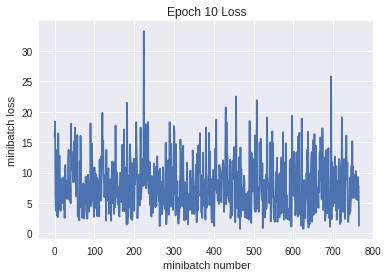

Validation
Epoch 1, Overall loss = 2.5 and accuracy of 0.606


(2.5002835388183593, 0.606)

In [47]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [50]:
def my_model12(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 16, 16])
    bconv3 = tf.get_variable("bconv3", shape=[16])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 16, 16])
    bconv4 = tf.get_variable("bconv4", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[1600, 200])
    baff1 = tf.get_variable("baff1", shape=[200])
    Waff2 = tf.get_variable("Waff2", shape=[200, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 16*24*24 = 9216
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(11 - 2 + 1 ) / 2  = 5 -> 16*5*5 = 400
    #p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p2 = b2
    # conv3x3 stride1 padding valid: (24 - 3 + 1 ) / 1  = 22 -> 16*22*22 = 7744
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (22 - 3 + 1 ) / 1  = 20 -> 16*20*20 = 6400
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    b4 = tf.layers.batch_normalization(r4, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(20 - 2 + 1 ) / 2  = 9.5 -> 16*10*10 = 1600
    p4 = tf.nn.max_pool(b4,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p4_flat = tf.reshape(p4,[-1,1600])
    a1 = tf.matmul(p4_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model12(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.64 and accuracy of 0.14
Iteration 100: with minibatch training loss = 1.83 and accuracy of 0.42
Iteration 200: with minibatch training loss = 1.82 and accuracy of 0.48
Iteration 300: with minibatch training loss = 1.35 and accuracy of 0.44
Iteration 400: with minibatch training loss = 1.47 and accuracy of 0.44
Iteration 500: with minibatch training loss = 1.21 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.42 and accuracy of 0.52
Iteration 700: with minibatch training loss = 1.26 and accuracy of 0.53
Epoch 1, Overall loss = 1.64 and accuracy of 0.426


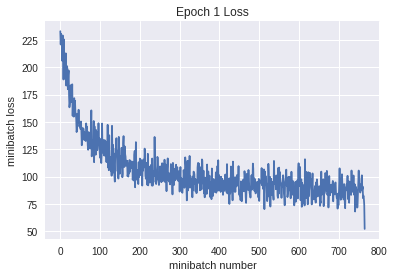

Iteration 800: with minibatch training loss = 1.36 and accuracy of 0.48
Iteration 900: with minibatch training loss = 1.26 and accuracy of 0.58
Iteration 1000: with minibatch training loss = 1.35 and accuracy of 0.52
Iteration 1100: with minibatch training loss = 1.14 and accuracy of 0.58
Iteration 1200: with minibatch training loss = 1.33 and accuracy of 0.61
Iteration 1300: with minibatch training loss = 1.13 and accuracy of 0.56
Iteration 1400: with minibatch training loss = 1.14 and accuracy of 0.53
Iteration 1500: with minibatch training loss = 1.1 and accuracy of 0.59
Epoch 2, Overall loss = 1.21 and accuracy of 0.573


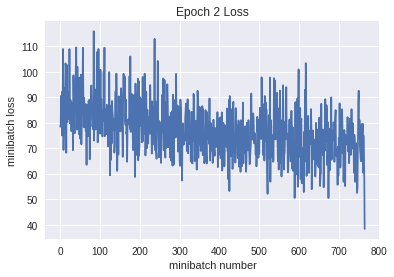

Iteration 1600: with minibatch training loss = 0.967 and accuracy of 0.62
Iteration 1700: with minibatch training loss = 0.713 and accuracy of 0.73
Iteration 1800: with minibatch training loss = 1.11 and accuracy of 0.62
Iteration 1900: with minibatch training loss = 0.828 and accuracy of 0.69
Iteration 2000: with minibatch training loss = 0.958 and accuracy of 0.66
Iteration 2100: with minibatch training loss = 1.32 and accuracy of 0.56
Iteration 2200: with minibatch training loss = 0.891 and accuracy of 0.64
Epoch 3, Overall loss = 0.99 and accuracy of 0.653


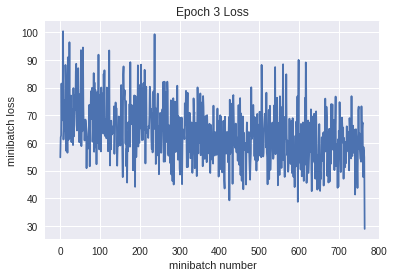

Iteration 2300: with minibatch training loss = 0.839 and accuracy of 0.72
Iteration 2400: with minibatch training loss = 0.75 and accuracy of 0.75
Iteration 2500: with minibatch training loss = 0.873 and accuracy of 0.72
Iteration 2600: with minibatch training loss = 0.748 and accuracy of 0.8
Iteration 2700: with minibatch training loss = 0.922 and accuracy of 0.67
Iteration 2800: with minibatch training loss = 0.826 and accuracy of 0.73
Iteration 2900: with minibatch training loss = 0.772 and accuracy of 0.72
Iteration 3000: with minibatch training loss = 0.997 and accuracy of 0.72
Epoch 4, Overall loss = 0.813 and accuracy of 0.717


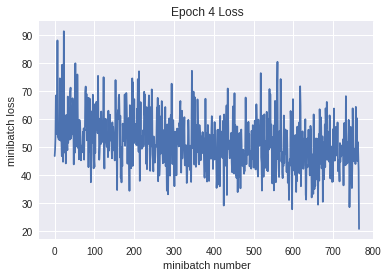

Iteration 3100: with minibatch training loss = 0.793 and accuracy of 0.73
Iteration 3200: with minibatch training loss = 0.603 and accuracy of 0.86
Iteration 3300: with minibatch training loss = 0.767 and accuracy of 0.72
Iteration 3400: with minibatch training loss = 0.791 and accuracy of 0.73
Iteration 3500: with minibatch training loss = 0.697 and accuracy of 0.7
Iteration 3600: with minibatch training loss = 0.446 and accuracy of 0.88
Iteration 3700: with minibatch training loss = 0.621 and accuracy of 0.8
Iteration 3800: with minibatch training loss = 0.696 and accuracy of 0.73
Epoch 5, Overall loss = 0.652 and accuracy of 0.777


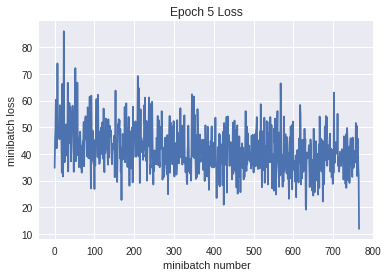

Iteration 3900: with minibatch training loss = 0.492 and accuracy of 0.81
Iteration 4000: with minibatch training loss = 0.372 and accuracy of 0.84
Iteration 4100: with minibatch training loss = 0.62 and accuracy of 0.77
Iteration 4200: with minibatch training loss = 0.412 and accuracy of 0.86
Iteration 4300: with minibatch training loss = 0.389 and accuracy of 0.86
Iteration 4400: with minibatch training loss = 0.369 and accuracy of 0.83
Iteration 4500: with minibatch training loss = 0.615 and accuracy of 0.8
Epoch 6, Overall loss = 0.509 and accuracy of 0.828


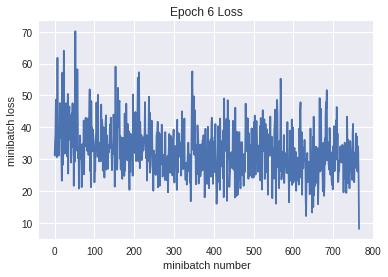

Iteration 4600: with minibatch training loss = 0.439 and accuracy of 0.89
Iteration 4700: with minibatch training loss = 0.43 and accuracy of 0.91
Iteration 4800: with minibatch training loss = 0.263 and accuracy of 0.92
Iteration 4900: with minibatch training loss = 0.348 and accuracy of 0.89
Iteration 5000: with minibatch training loss = 0.46 and accuracy of 0.84
Iteration 5100: with minibatch training loss = 0.397 and accuracy of 0.88
Iteration 5200: with minibatch training loss = 0.276 and accuracy of 0.88
Iteration 5300: with minibatch training loss = 0.275 and accuracy of 0.88
Epoch 7, Overall loss = 0.39 and accuracy of 0.87


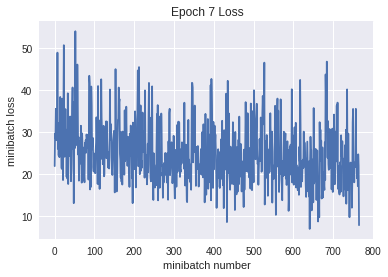

Iteration 5400: with minibatch training loss = 0.339 and accuracy of 0.88
Iteration 5500: with minibatch training loss = 0.279 and accuracy of 0.86
Iteration 5600: with minibatch training loss = 0.3 and accuracy of 0.89
Iteration 5700: with minibatch training loss = 0.349 and accuracy of 0.88
Iteration 5800: with minibatch training loss = 0.435 and accuracy of 0.88
Iteration 5900: with minibatch training loss = 0.211 and accuracy of 0.97
Iteration 6000: with minibatch training loss = 0.28 and accuracy of 0.91
Iteration 6100: with minibatch training loss = 0.424 and accuracy of 0.84
Epoch 8, Overall loss = 0.306 and accuracy of 0.895


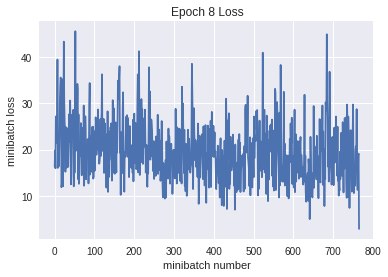

Iteration 6200: with minibatch training loss = 0.337 and accuracy of 0.86
Iteration 6300: with minibatch training loss = 0.316 and accuracy of 0.88
Iteration 6400: with minibatch training loss = 0.19 and accuracy of 0.95
Iteration 6500: with minibatch training loss = 0.222 and accuracy of 0.91
Iteration 6600: with minibatch training loss = 0.205 and accuracy of 0.94
Iteration 6700: with minibatch training loss = 0.173 and accuracy of 0.92
Iteration 6800: with minibatch training loss = 0.289 and accuracy of 0.89
Epoch 9, Overall loss = 0.249 and accuracy of 0.915


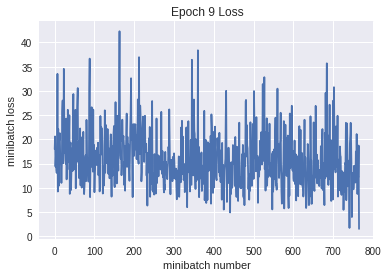

Iteration 6900: with minibatch training loss = 0.299 and accuracy of 0.91
Iteration 7000: with minibatch training loss = 0.309 and accuracy of 0.89
Iteration 7100: with minibatch training loss = 0.183 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.104 and accuracy of 0.97
Iteration 7300: with minibatch training loss = 0.229 and accuracy of 0.94
Iteration 7400: with minibatch training loss = 0.342 and accuracy of 0.88
Iteration 7500: with minibatch training loss = 0.139 and accuracy of 0.97
Iteration 7600: with minibatch training loss = 0.136 and accuracy of 0.95
Epoch 10, Overall loss = 0.207 and accuracy of 0.928


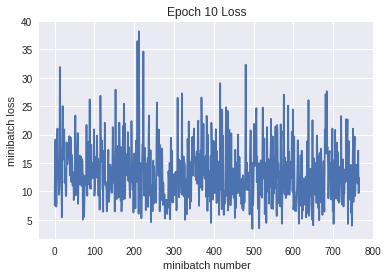

Validation
Epoch 1, Overall loss = 2.34 and accuracy of 0.591


(2.336429573059082, 0.591)

In [51]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [53]:
def my_model13(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 16, 16])
    bconv3 = tf.get_variable("bconv3", shape=[16])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 16, 16])
    bconv4 = tf.get_variable("bconv4", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[1600, 400])
    baff1 = tf.get_variable("baff1", shape=[400])
    Waff2 = tf.get_variable("Waff2", shape=[400, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 16*24*24 = 9216
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(11 - 2 + 1 ) / 2  = 5 -> 16*5*5 = 400
    #p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p2 = b2
    # conv3x3 stride1 padding valid: (24 - 3 + 1 ) / 1  = 22 -> 16*22*22 = 7744
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (22 - 3 + 1 ) / 1  = 20 -> 16*20*20 = 6400
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    b4 = tf.layers.batch_normalization(r4, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(20 - 2 + 1 ) / 2  = 9.5 -> 16*10*10 = 1600
    p4 = tf.nn.max_pool(b4,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p4_flat = tf.reshape(p4,[-1,1600])
    a1 = tf.matmul(p4_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model13(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.22 and accuracy of 0.14
Iteration 100: with minibatch training loss = 1.72 and accuracy of 0.41
Iteration 200: with minibatch training loss = 1.67 and accuracy of 0.39
Iteration 300: with minibatch training loss = 1.42 and accuracy of 0.41
Iteration 400: with minibatch training loss = 1.42 and accuracy of 0.45
Iteration 500: with minibatch training loss = 1.36 and accuracy of 0.44
Iteration 600: with minibatch training loss = 1.33 and accuracy of 0.61
Iteration 700: with minibatch training loss = 1.22 and accuracy of 0.53
Epoch 1, Overall loss = 1.62 and accuracy of 0.435


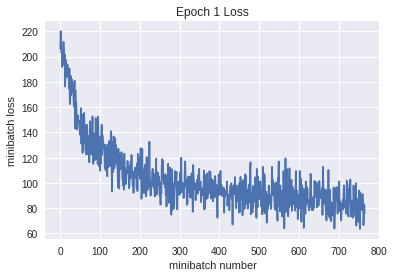

Iteration 800: with minibatch training loss = 1.44 and accuracy of 0.5
Iteration 900: with minibatch training loss = 1.28 and accuracy of 0.56
Iteration 1000: with minibatch training loss = 1.1 and accuracy of 0.61
Iteration 1100: with minibatch training loss = 1.32 and accuracy of 0.55
Iteration 1200: with minibatch training loss = 1.13 and accuracy of 0.64
Iteration 1300: with minibatch training loss = 1.28 and accuracy of 0.53
Iteration 1400: with minibatch training loss = 1.06 and accuracy of 0.59
Iteration 1500: with minibatch training loss = 0.646 and accuracy of 0.78
Epoch 2, Overall loss = 1.13 and accuracy of 0.602


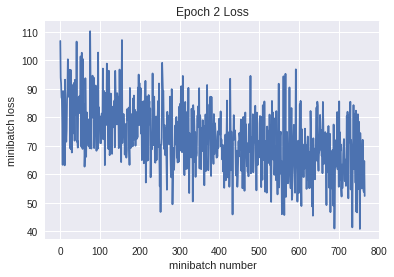

Iteration 1600: with minibatch training loss = 0.817 and accuracy of 0.67
Iteration 1700: with minibatch training loss = 0.938 and accuracy of 0.73
Iteration 1800: with minibatch training loss = 0.585 and accuracy of 0.84
Iteration 1900: with minibatch training loss = 0.9 and accuracy of 0.67
Iteration 2000: with minibatch training loss = 0.724 and accuracy of 0.77
Iteration 2100: with minibatch training loss = 0.898 and accuracy of 0.69
Iteration 2200: with minibatch training loss = 0.808 and accuracy of 0.77
Epoch 3, Overall loss = 0.866 and accuracy of 0.699


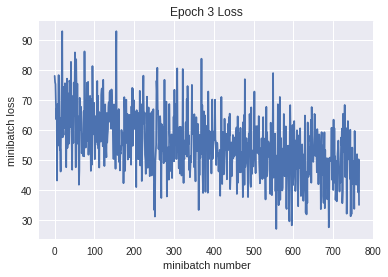

Iteration 2300: with minibatch training loss = 0.9 and accuracy of 0.69
Iteration 2400: with minibatch training loss = 0.716 and accuracy of 0.77
Iteration 2500: with minibatch training loss = 0.801 and accuracy of 0.69
Iteration 2600: with minibatch training loss = 0.637 and accuracy of 0.73
Iteration 2700: with minibatch training loss = 0.69 and accuracy of 0.78
Iteration 2800: with minibatch training loss = 0.727 and accuracy of 0.72
Iteration 2900: with minibatch training loss = 0.691 and accuracy of 0.72
Iteration 3000: with minibatch training loss = 0.422 and accuracy of 0.86
Epoch 4, Overall loss = 0.631 and accuracy of 0.783


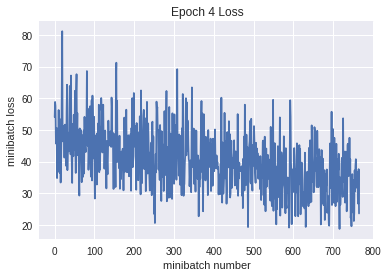

Iteration 3100: with minibatch training loss = 0.474 and accuracy of 0.84
Iteration 3200: with minibatch training loss = 0.597 and accuracy of 0.83
Iteration 3300: with minibatch training loss = 0.567 and accuracy of 0.84
Iteration 3400: with minibatch training loss = 0.544 and accuracy of 0.81
Iteration 3500: with minibatch training loss = 0.408 and accuracy of 0.84
Iteration 3600: with minibatch training loss = 0.453 and accuracy of 0.84
Iteration 3700: with minibatch training loss = 0.349 and accuracy of 0.89
Iteration 3800: with minibatch training loss = 0.531 and accuracy of 0.83
Epoch 5, Overall loss = 0.437 and accuracy of 0.853


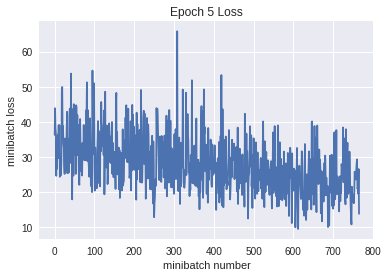

Iteration 3900: with minibatch training loss = 0.338 and accuracy of 0.88
Iteration 4000: with minibatch training loss = 0.205 and accuracy of 0.94
Iteration 4100: with minibatch training loss = 0.359 and accuracy of 0.89
Iteration 4200: with minibatch training loss = 0.289 and accuracy of 0.89
Iteration 4300: with minibatch training loss = 0.277 and accuracy of 0.92
Iteration 4400: with minibatch training loss = 0.23 and accuracy of 0.92
Iteration 4500: with minibatch training loss = 0.322 and accuracy of 0.88
Epoch 6, Overall loss = 0.295 and accuracy of 0.901


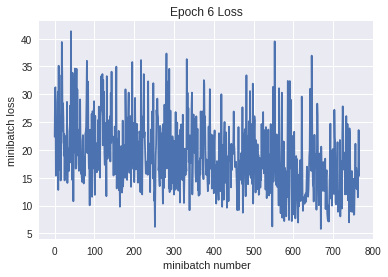

Iteration 4600: with minibatch training loss = 0.0998 and accuracy of 0.98
Iteration 4700: with minibatch training loss = 0.228 and accuracy of 0.92
Iteration 4800: with minibatch training loss = 0.277 and accuracy of 0.92
Iteration 4900: with minibatch training loss = 0.335 and accuracy of 0.88
Iteration 5000: with minibatch training loss = 0.195 and accuracy of 0.98
Iteration 5100: with minibatch training loss = 0.266 and accuracy of 0.92
Iteration 5200: with minibatch training loss = 0.185 and accuracy of 0.92
Iteration 5300: with minibatch training loss = 0.286 and accuracy of 0.89
Epoch 7, Overall loss = 0.221 and accuracy of 0.924


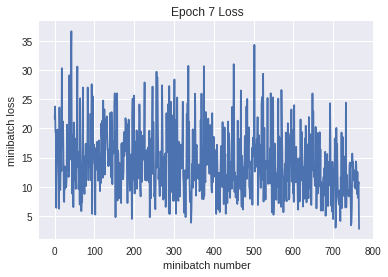

Iteration 5400: with minibatch training loss = 0.223 and accuracy of 0.94
Iteration 5500: with minibatch training loss = 0.178 and accuracy of 0.97
Iteration 5600: with minibatch training loss = 0.144 and accuracy of 0.94
Iteration 5700: with minibatch training loss = 0.28 and accuracy of 0.88
Iteration 5800: with minibatch training loss = 0.173 and accuracy of 0.92
Iteration 5900: with minibatch training loss = 0.139 and accuracy of 0.92
Iteration 6000: with minibatch training loss = 0.101 and accuracy of 0.97
Iteration 6100: with minibatch training loss = 0.16 and accuracy of 0.94
Epoch 8, Overall loss = 0.184 and accuracy of 0.935


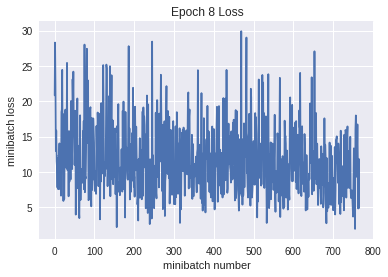

Iteration 6200: with minibatch training loss = 0.1 and accuracy of 0.97
Iteration 6300: with minibatch training loss = 0.0963 and accuracy of 0.97
Iteration 6400: with minibatch training loss = 0.147 and accuracy of 0.92
Iteration 6500: with minibatch training loss = 0.153 and accuracy of 0.97
Iteration 6600: with minibatch training loss = 0.125 and accuracy of 0.95
Iteration 6700: with minibatch training loss = 0.138 and accuracy of 0.94
Iteration 6800: with minibatch training loss = 0.0686 and accuracy of 0.98
Epoch 9, Overall loss = 0.158 and accuracy of 0.946


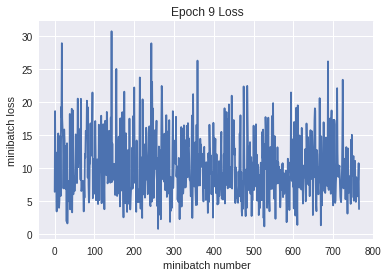

Iteration 6900: with minibatch training loss = 0.131 and accuracy of 0.97
Iteration 7000: with minibatch training loss = 0.129 and accuracy of 0.95
Iteration 7100: with minibatch training loss = 0.158 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.0823 and accuracy of 0.98
Iteration 7300: with minibatch training loss = 0.206 and accuracy of 0.92
Iteration 7400: with minibatch training loss = 0.0963 and accuracy of 0.97
Iteration 7500: with minibatch training loss = 0.151 and accuracy of 0.94
Iteration 7600: with minibatch training loss = 0.113 and accuracy of 0.95
Epoch 10, Overall loss = 0.141 and accuracy of 0.951


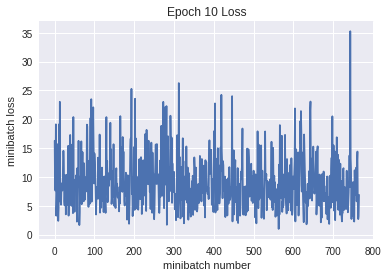

Validation
Epoch 1, Overall loss = 2.62 and accuracy of 0.59


(2.6185068073272704, 0.59)

In [54]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [55]:
def my_model14(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 16])
    bconv2 = tf.get_variable("bconv2", shape=[16])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 16, 16])
    bconv3 = tf.get_variable("bconv3", shape=[16])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 16, 16])
    bconv4 = tf.get_variable("bconv4", shape=[16])
    Waff1 = tf.get_variable("Waff1", shape=[256, 400])
    baff1 = tf.get_variable("baff1", shape=[400])
    Waff2 = tf.get_variable("Waff2", shape=[400, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 16*24*24 = 9216
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(24 - 2 + 1 ) / 2  = 11.5 -> 16*12*12 = 2304
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    #p2 = b2
    # conv3x3 stride1 padding valid: (12 - 3 + 1 ) / 1  = 10 -> 16*10*10 = 1600
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (10 - 3 + 1 ) / 1  = 8 -> 16*8*8 = 1024
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    b4 = tf.layers.batch_normalization(r4, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(8 - 2 + 1 ) / 2  = 3.5 -> 16*4*4 = 256
    p4 = tf.nn.max_pool(b4,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p4_flat = tf.reshape(p4,[-1,256])
    a1 = tf.matmul(p4_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model14(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 2.73 and accuracy of 0.047
Iteration 100: with minibatch training loss = 1.99 and accuracy of 0.28
Iteration 200: with minibatch training loss = 1.94 and accuracy of 0.34
Iteration 300: with minibatch training loss = 1.59 and accuracy of 0.39
Iteration 400: with minibatch training loss = 1.67 and accuracy of 0.42
Iteration 500: with minibatch training loss = 1.26 and accuracy of 0.61
Iteration 600: with minibatch training loss = 1.5 and accuracy of 0.41
Iteration 700: with minibatch training loss = 1.31 and accuracy of 0.61
Epoch 1, Overall loss = 1.62 and accuracy of 0.417


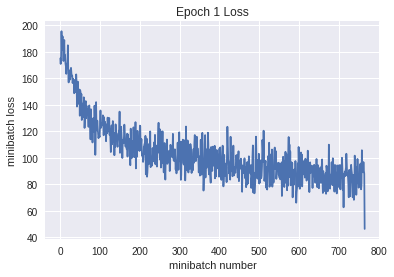

Iteration 800: with minibatch training loss = 1.33 and accuracy of 0.59
Iteration 900: with minibatch training loss = 1.04 and accuracy of 0.61
Iteration 1000: with minibatch training loss = 1.15 and accuracy of 0.62
Iteration 1100: with minibatch training loss = 1.34 and accuracy of 0.58
Iteration 1200: with minibatch training loss = 1.12 and accuracy of 0.64
Iteration 1300: with minibatch training loss = 1.13 and accuracy of 0.56
Iteration 1400: with minibatch training loss = 0.937 and accuracy of 0.7
Iteration 1500: with minibatch training loss = 0.896 and accuracy of 0.7
Epoch 2, Overall loss = 1.19 and accuracy of 0.573


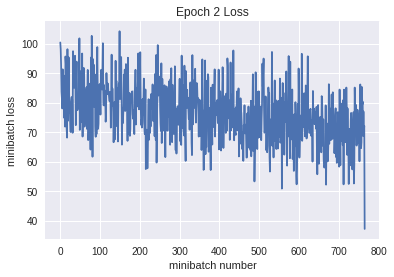

Iteration 1600: with minibatch training loss = 1.04 and accuracy of 0.67
Iteration 1700: with minibatch training loss = 1.08 and accuracy of 0.62
Iteration 1800: with minibatch training loss = 1.07 and accuracy of 0.61
Iteration 1900: with minibatch training loss = 0.894 and accuracy of 0.67
Iteration 2000: with minibatch training loss = 0.932 and accuracy of 0.66
Iteration 2100: with minibatch training loss = 1.23 and accuracy of 0.53
Iteration 2200: with minibatch training loss = 0.746 and accuracy of 0.75
Epoch 3, Overall loss = 1.03 and accuracy of 0.635


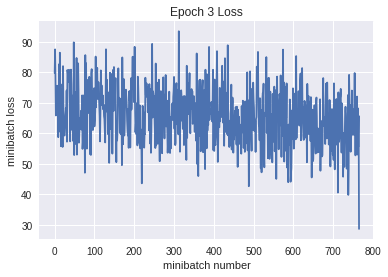

Iteration 2300: with minibatch training loss = 1.13 and accuracy of 0.58
Iteration 2400: with minibatch training loss = 0.996 and accuracy of 0.67
Iteration 2500: with minibatch training loss = 0.962 and accuracy of 0.66
Iteration 2600: with minibatch training loss = 1.03 and accuracy of 0.61
Iteration 2700: with minibatch training loss = 1.08 and accuracy of 0.66
Iteration 2800: with minibatch training loss = 0.857 and accuracy of 0.66
Iteration 2900: with minibatch training loss = 0.761 and accuracy of 0.75
Iteration 3000: with minibatch training loss = 1.06 and accuracy of 0.67
Epoch 4, Overall loss = 0.914 and accuracy of 0.678


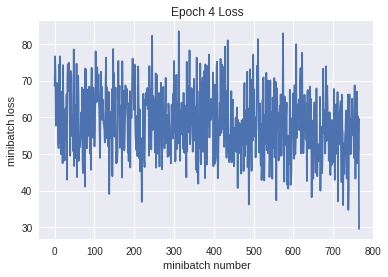

Iteration 3100: with minibatch training loss = 1.07 and accuracy of 0.67
Iteration 3200: with minibatch training loss = 0.911 and accuracy of 0.72
Iteration 3300: with minibatch training loss = 0.927 and accuracy of 0.64
Iteration 3400: with minibatch training loss = 0.791 and accuracy of 0.75
Iteration 3500: with minibatch training loss = 0.787 and accuracy of 0.67
Iteration 3600: with minibatch training loss = 0.684 and accuracy of 0.78
Iteration 3700: with minibatch training loss = 0.989 and accuracy of 0.7
Iteration 3800: with minibatch training loss = 0.622 and accuracy of 0.81
Epoch 5, Overall loss = 0.822 and accuracy of 0.711


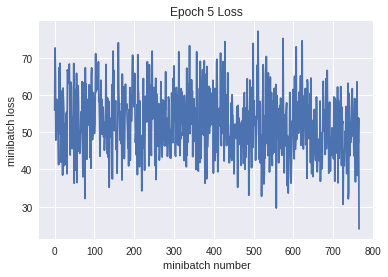

Iteration 3900: with minibatch training loss = 0.682 and accuracy of 0.73
Iteration 4000: with minibatch training loss = 0.917 and accuracy of 0.69
Iteration 4100: with minibatch training loss = 0.586 and accuracy of 0.8
Iteration 4200: with minibatch training loss = 0.746 and accuracy of 0.7
Iteration 4300: with minibatch training loss = 0.677 and accuracy of 0.75
Iteration 4400: with minibatch training loss = 0.643 and accuracy of 0.78
Iteration 4500: with minibatch training loss = 0.579 and accuracy of 0.83
Epoch 6, Overall loss = 0.744 and accuracy of 0.738


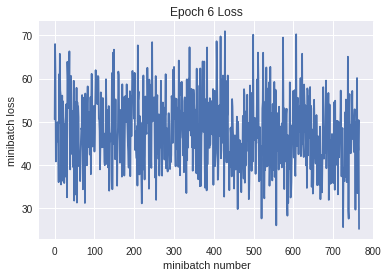

Iteration 4600: with minibatch training loss = 0.655 and accuracy of 0.78
Iteration 4700: with minibatch training loss = 0.872 and accuracy of 0.64
Iteration 4800: with minibatch training loss = 0.649 and accuracy of 0.73
Iteration 4900: with minibatch training loss = 0.545 and accuracy of 0.86
Iteration 5000: with minibatch training loss = 0.557 and accuracy of 0.86
Iteration 5100: with minibatch training loss = 0.705 and accuracy of 0.7
Iteration 5200: with minibatch training loss = 0.55 and accuracy of 0.78
Iteration 5300: with minibatch training loss = 0.481 and accuracy of 0.83
Epoch 7, Overall loss = 0.675 and accuracy of 0.764


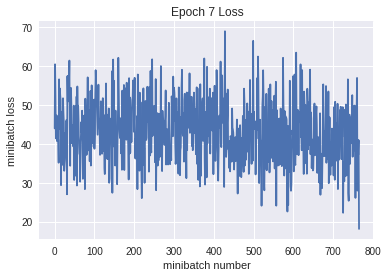

Iteration 5400: with minibatch training loss = 0.695 and accuracy of 0.69
Iteration 5500: with minibatch training loss = 0.339 and accuracy of 0.91
Iteration 5600: with minibatch training loss = 0.778 and accuracy of 0.72
Iteration 5700: with minibatch training loss = 0.671 and accuracy of 0.81
Iteration 5800: with minibatch training loss = 0.515 and accuracy of 0.83
Iteration 5900: with minibatch training loss = 0.761 and accuracy of 0.81
Iteration 6000: with minibatch training loss = 0.692 and accuracy of 0.72
Iteration 6100: with minibatch training loss = 0.409 and accuracy of 0.86
Epoch 8, Overall loss = 0.611 and accuracy of 0.788


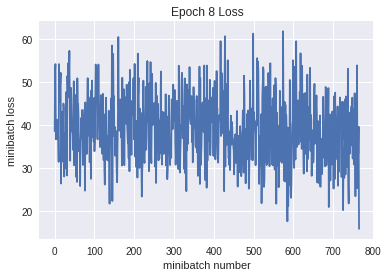

Iteration 6200: with minibatch training loss = 0.52 and accuracy of 0.73
Iteration 6300: with minibatch training loss = 0.49 and accuracy of 0.78
Iteration 6400: with minibatch training loss = 0.622 and accuracy of 0.7
Iteration 6500: with minibatch training loss = 0.618 and accuracy of 0.72
Iteration 6600: with minibatch training loss = 0.573 and accuracy of 0.81
Iteration 6700: with minibatch training loss = 0.608 and accuracy of 0.77
Iteration 6800: with minibatch training loss = 0.379 and accuracy of 0.83
Epoch 9, Overall loss = 0.556 and accuracy of 0.809


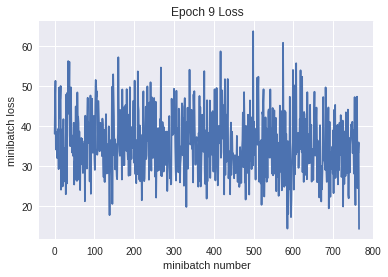

Iteration 6900: with minibatch training loss = 0.387 and accuracy of 0.88
Iteration 7000: with minibatch training loss = 0.651 and accuracy of 0.81
Iteration 7100: with minibatch training loss = 0.554 and accuracy of 0.77
Iteration 7200: with minibatch training loss = 0.667 and accuracy of 0.78
Iteration 7300: with minibatch training loss = 0.531 and accuracy of 0.8
Iteration 7400: with minibatch training loss = 0.514 and accuracy of 0.8
Iteration 7500: with minibatch training loss = 0.425 and accuracy of 0.91
Iteration 7600: with minibatch training loss = 0.375 and accuracy of 0.88
Epoch 10, Overall loss = 0.504 and accuracy of 0.828


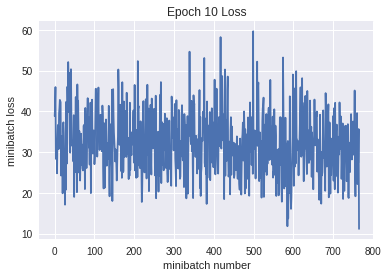

Validation
Epoch 1, Overall loss = 1.4 and accuracy of 0.625


(1.4029745016098023, 0.625)

In [56]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [57]:
def my_model15(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 32])
    bconv2 = tf.get_variable("bconv2", shape=[32])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 32, 64])
    bconv3 = tf.get_variable("bconv3", shape=[64])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 64, 80])
    bconv4 = tf.get_variable("bconv4", shape=[80])
    Waff1 = tf.get_variable("Waff1", shape=[1280, 400])
    baff1 = tf.get_variable("baff1", shape=[400])
    Waff2 = tf.get_variable("Waff2", shape=[400, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 32*24*24 = 18432
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(24 - 2 + 1 ) / 2  = 11.5 -> 32*12*12 = 4608
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    #p2 = b2
    # conv3x3 stride1 padding valid: (12 - 3 + 1 ) / 1  = 10 -> 64*10*10 = 6400
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (10 - 3 + 1 ) / 1  = 8 -> 80*8*8 = 5120
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    b4 = tf.layers.batch_normalization(r4, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(8 - 2 + 1 ) / 2  = 3.5 -> 80*4*4 = 1280
    p4 = tf.nn.max_pool(b4,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p4_flat = tf.reshape(p4,[-1,1280])
    a1 = tf.matmul(p4_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model15(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.38 and accuracy of 0.12
Iteration 100: with minibatch training loss = 2.01 and accuracy of 0.31
Iteration 200: with minibatch training loss = 1.57 and accuracy of 0.5
Iteration 300: with minibatch training loss = 1.43 and accuracy of 0.48
Iteration 400: with minibatch training loss = 1.54 and accuracy of 0.41
Iteration 500: with minibatch training loss = 1.29 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.38 and accuracy of 0.52
Iteration 700: with minibatch training loss = 1.02 and accuracy of 0.58
Epoch 1, Overall loss = 1.54 and accuracy of 0.463


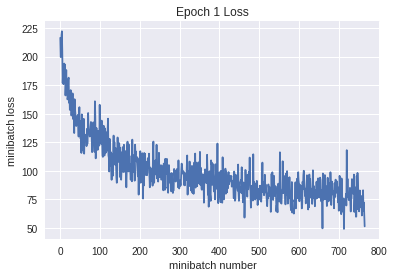

Iteration 800: with minibatch training loss = 1.1 and accuracy of 0.59
Iteration 900: with minibatch training loss = 1.33 and accuracy of 0.59
Iteration 1000: with minibatch training loss = 1.51 and accuracy of 0.44
Iteration 1100: with minibatch training loss = 0.935 and accuracy of 0.62
Iteration 1200: with minibatch training loss = 0.994 and accuracy of 0.66
Iteration 1300: with minibatch training loss = 0.86 and accuracy of 0.69
Iteration 1400: with minibatch training loss = 1.17 and accuracy of 0.52
Iteration 1500: with minibatch training loss = 0.973 and accuracy of 0.67
Epoch 2, Overall loss = 1.03 and accuracy of 0.643


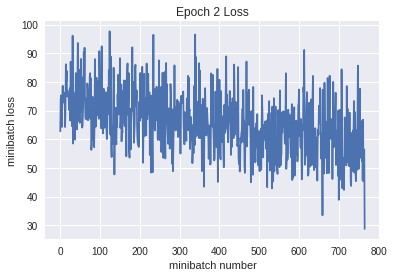

Iteration 1600: with minibatch training loss = 1.06 and accuracy of 0.62
Iteration 1700: with minibatch training loss = 1.08 and accuracy of 0.64
Iteration 1800: with minibatch training loss = 1.15 and accuracy of 0.62
Iteration 1900: with minibatch training loss = 0.831 and accuracy of 0.73
Iteration 2000: with minibatch training loss = 1.09 and accuracy of 0.59
Iteration 2100: with minibatch training loss = 0.613 and accuracy of 0.77
Iteration 2200: with minibatch training loss = 0.651 and accuracy of 0.8
Epoch 3, Overall loss = 0.8 and accuracy of 0.722


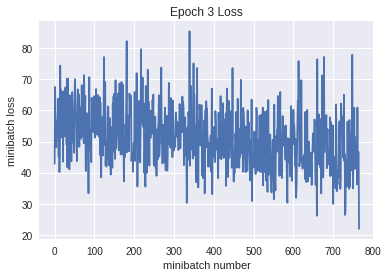

Iteration 2300: with minibatch training loss = 0.72 and accuracy of 0.73
Iteration 2400: with minibatch training loss = 0.639 and accuracy of 0.73
Iteration 2500: with minibatch training loss = 0.423 and accuracy of 0.8
Iteration 2600: with minibatch training loss = 0.595 and accuracy of 0.77
Iteration 2700: with minibatch training loss = 0.519 and accuracy of 0.83
Iteration 2800: with minibatch training loss = 0.728 and accuracy of 0.77
Iteration 2900: with minibatch training loss = 0.636 and accuracy of 0.77
Iteration 3000: with minibatch training loss = 0.508 and accuracy of 0.83
Epoch 4, Overall loss = 0.626 and accuracy of 0.781


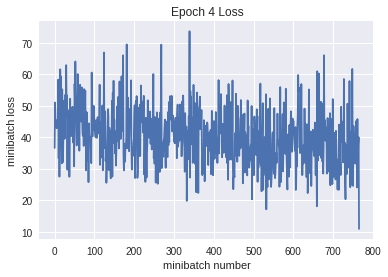

Iteration 3100: with minibatch training loss = 0.511 and accuracy of 0.86
Iteration 3200: with minibatch training loss = 0.328 and accuracy of 0.88
Iteration 3300: with minibatch training loss = 0.51 and accuracy of 0.8
Iteration 3400: with minibatch training loss = 0.509 and accuracy of 0.83
Iteration 3500: with minibatch training loss = 0.368 and accuracy of 0.88
Iteration 3600: with minibatch training loss = 0.365 and accuracy of 0.88
Iteration 3700: with minibatch training loss = 0.391 and accuracy of 0.89
Iteration 3800: with minibatch training loss = 0.604 and accuracy of 0.83
Epoch 5, Overall loss = 0.479 and accuracy of 0.833


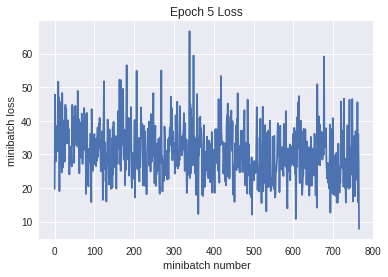

Iteration 3900: with minibatch training loss = 0.353 and accuracy of 0.91
Iteration 4000: with minibatch training loss = 0.386 and accuracy of 0.84
Iteration 4100: with minibatch training loss = 0.351 and accuracy of 0.86
Iteration 4200: with minibatch training loss = 0.213 and accuracy of 0.91
Iteration 4300: with minibatch training loss = 0.356 and accuracy of 0.88
Iteration 4400: with minibatch training loss = 0.339 and accuracy of 0.86
Iteration 4500: with minibatch training loss = 0.378 and accuracy of 0.91
Epoch 6, Overall loss = 0.367 and accuracy of 0.873


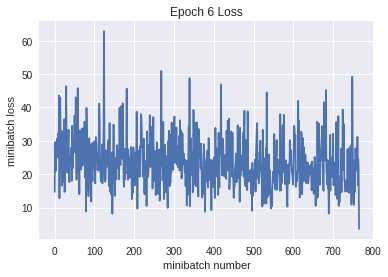

Iteration 4600: with minibatch training loss = 0.341 and accuracy of 0.88
Iteration 4700: with minibatch training loss = 0.396 and accuracy of 0.86
Iteration 4800: with minibatch training loss = 0.248 and accuracy of 0.91
Iteration 4900: with minibatch training loss = 0.22 and accuracy of 0.89
Iteration 5000: with minibatch training loss = 0.354 and accuracy of 0.92
Iteration 5100: with minibatch training loss = 0.136 and accuracy of 0.95
Iteration 5200: with minibatch training loss = 0.277 and accuracy of 0.92
Iteration 5300: with minibatch training loss = 0.32 and accuracy of 0.91
Epoch 7, Overall loss = 0.289 and accuracy of 0.898


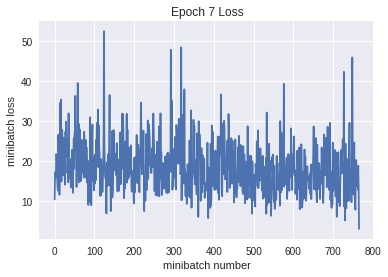

Iteration 5400: with minibatch training loss = 0.202 and accuracy of 0.94
Iteration 5500: with minibatch training loss = 0.296 and accuracy of 0.89
Iteration 5600: with minibatch training loss = 0.282 and accuracy of 0.89
Iteration 5700: with minibatch training loss = 0.128 and accuracy of 0.95
Iteration 5800: with minibatch training loss = 0.448 and accuracy of 0.8
Iteration 5900: with minibatch training loss = 0.0816 and accuracy of 0.97
Iteration 6000: with minibatch training loss = 0.102 and accuracy of 0.97
Iteration 6100: with minibatch training loss = 0.205 and accuracy of 0.95
Epoch 8, Overall loss = 0.233 and accuracy of 0.917


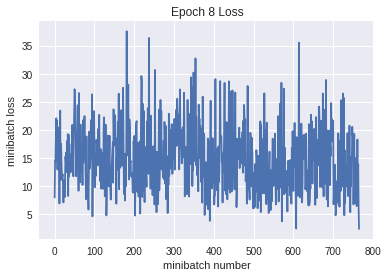

Iteration 6200: with minibatch training loss = 0.239 and accuracy of 0.91
Iteration 6300: with minibatch training loss = 0.334 and accuracy of 0.91
Iteration 6400: with minibatch training loss = 0.148 and accuracy of 0.97
Iteration 6500: with minibatch training loss = 0.229 and accuracy of 0.94
Iteration 6600: with minibatch training loss = 0.171 and accuracy of 0.95
Iteration 6700: with minibatch training loss = 0.181 and accuracy of 0.94
Iteration 6800: with minibatch training loss = 0.247 and accuracy of 0.92
Epoch 9, Overall loss = 0.198 and accuracy of 0.929


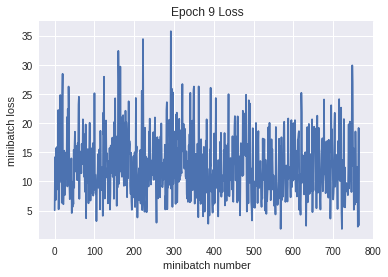

Iteration 6900: with minibatch training loss = 0.219 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.364 and accuracy of 0.86
Iteration 7100: with minibatch training loss = 0.182 and accuracy of 0.92
Iteration 7200: with minibatch training loss = 0.139 and accuracy of 0.95
Iteration 7300: with minibatch training loss = 0.143 and accuracy of 0.92
Iteration 7400: with minibatch training loss = 0.125 and accuracy of 0.95
Iteration 7500: with minibatch training loss = 0.16 and accuracy of 0.94
Iteration 7600: with minibatch training loss = 0.0716 and accuracy of 0.97
Epoch 10, Overall loss = 0.177 and accuracy of 0.939


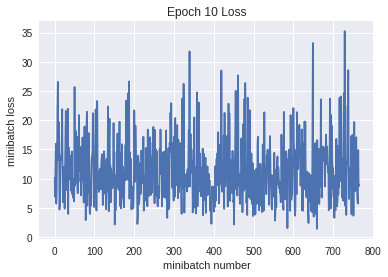

Validation
Epoch 1, Overall loss = 1.72 and accuracy of 0.692


(1.7245973377227783, 0.692)

In [58]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [59]:
def my_model16(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 32])
    bconv2 = tf.get_variable("bconv2", shape=[32])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 32, 64])
    bconv3 = tf.get_variable("bconv3", shape=[64])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 64, 80])
    bconv4 = tf.get_variable("bconv4", shape=[80])
    Waff1 = tf.get_variable("Waff1", shape=[1280, 300])
    baff1 = tf.get_variable("baff1", shape=[300])
    Waff2 = tf.get_variable("Waff2", shape=[300, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 32*24*24 = 18432
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(24 - 2 + 1 ) / 2  = 11.5 -> 32*12*12 = 4608
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    #p2 = b2
    # conv3x3 stride1 padding valid: (12 - 3 + 1 ) / 1  = 10 -> 64*10*10 = 6400
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (10 - 3 + 1 ) / 1  = 8 -> 80*8*8 = 5120
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    b4 = tf.layers.batch_normalization(r4, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(8 - 2 + 1 ) / 2  = 3.5 -> 80*4*4 = 1280
    p4 = tf.nn.max_pool(b4,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p4_flat = tf.reshape(p4,[-1,1280])
    a1 = tf.matmul(p4_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model16(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.89 and accuracy of 0.031
Iteration 100: with minibatch training loss = 1.73 and accuracy of 0.41
Iteration 200: with minibatch training loss = 1.8 and accuracy of 0.38
Iteration 300: with minibatch training loss = 1.54 and accuracy of 0.45
Iteration 400: with minibatch training loss = 1.37 and accuracy of 0.48
Iteration 500: with minibatch training loss = 1.35 and accuracy of 0.58
Iteration 600: with minibatch training loss = 1.19 and accuracy of 0.58
Iteration 700: with minibatch training loss = 1.11 and accuracy of 0.64
Epoch 1, Overall loss = 1.54 and accuracy of 0.461


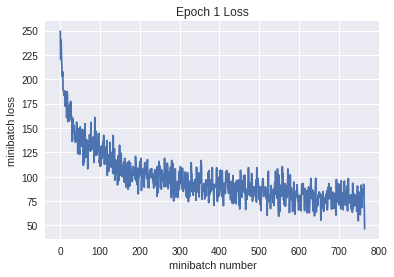

Iteration 800: with minibatch training loss = 1.1 and accuracy of 0.55
Iteration 900: with minibatch training loss = 1.2 and accuracy of 0.58
Iteration 1000: with minibatch training loss = 0.836 and accuracy of 0.69
Iteration 1100: with minibatch training loss = 1.11 and accuracy of 0.66
Iteration 1200: with minibatch training loss = 1.19 and accuracy of 0.62
Iteration 1300: with minibatch training loss = 1.12 and accuracy of 0.66
Iteration 1400: with minibatch training loss = 1.08 and accuracy of 0.64
Iteration 1500: with minibatch training loss = 0.797 and accuracy of 0.7
Epoch 2, Overall loss = 1.04 and accuracy of 0.635


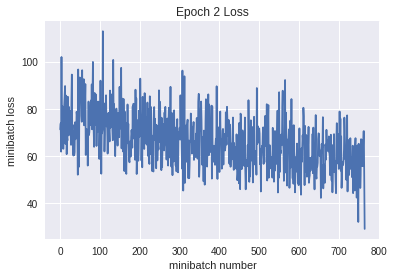

Iteration 1600: with minibatch training loss = 0.879 and accuracy of 0.66
Iteration 1700: with minibatch training loss = 0.751 and accuracy of 0.75
Iteration 1800: with minibatch training loss = 0.634 and accuracy of 0.77
Iteration 1900: with minibatch training loss = 0.703 and accuracy of 0.84
Iteration 2000: with minibatch training loss = 0.625 and accuracy of 0.78
Iteration 2100: with minibatch training loss = 0.983 and accuracy of 0.64
Iteration 2200: with minibatch training loss = 0.673 and accuracy of 0.81
Epoch 3, Overall loss = 0.812 and accuracy of 0.716


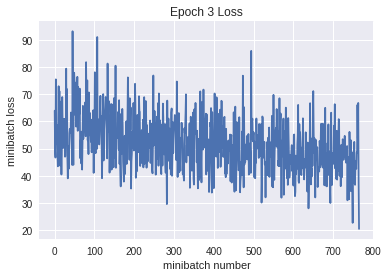

Iteration 2300: with minibatch training loss = 0.531 and accuracy of 0.86
Iteration 2400: with minibatch training loss = 0.629 and accuracy of 0.77
Iteration 2500: with minibatch training loss = 0.828 and accuracy of 0.69
Iteration 2600: with minibatch training loss = 1.06 and accuracy of 0.69
Iteration 2700: with minibatch training loss = 0.777 and accuracy of 0.75
Iteration 2800: with minibatch training loss = 0.519 and accuracy of 0.77
Iteration 2900: with minibatch training loss = 0.717 and accuracy of 0.73
Iteration 3000: with minibatch training loss = 0.805 and accuracy of 0.73
Epoch 4, Overall loss = 0.646 and accuracy of 0.774


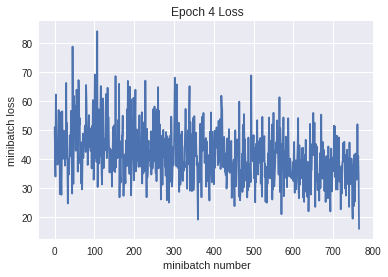

Iteration 3100: with minibatch training loss = 0.509 and accuracy of 0.81
Iteration 3200: with minibatch training loss = 0.53 and accuracy of 0.83
Iteration 3300: with minibatch training loss = 0.654 and accuracy of 0.81
Iteration 3400: with minibatch training loss = 0.572 and accuracy of 0.86
Iteration 3500: with minibatch training loss = 0.391 and accuracy of 0.86
Iteration 3600: with minibatch training loss = 0.484 and accuracy of 0.86
Iteration 3700: with minibatch training loss = 0.357 and accuracy of 0.88
Iteration 3800: with minibatch training loss = 0.331 and accuracy of 0.84
Epoch 5, Overall loss = 0.503 and accuracy of 0.824


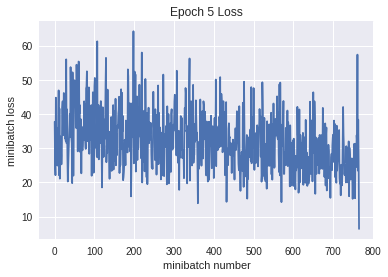

Iteration 3900: with minibatch training loss = 0.328 and accuracy of 0.92
Iteration 4000: with minibatch training loss = 0.481 and accuracy of 0.81
Iteration 4100: with minibatch training loss = 0.363 and accuracy of 0.86
Iteration 4200: with minibatch training loss = 0.398 and accuracy of 0.86
Iteration 4300: with minibatch training loss = 0.424 and accuracy of 0.88
Iteration 4400: with minibatch training loss = 0.173 and accuracy of 0.95
Iteration 4500: with minibatch training loss = 0.448 and accuracy of 0.81
Epoch 6, Overall loss = 0.392 and accuracy of 0.863


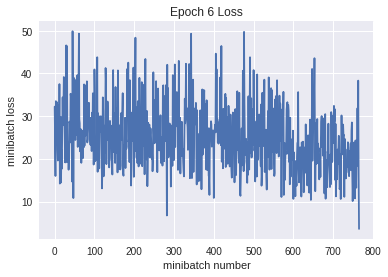

Iteration 4600: with minibatch training loss = 0.253 and accuracy of 0.95
Iteration 4700: with minibatch training loss = 0.203 and accuracy of 0.91
Iteration 4800: with minibatch training loss = 0.259 and accuracy of 0.94
Iteration 4900: with minibatch training loss = 0.398 and accuracy of 0.89
Iteration 5000: with minibatch training loss = 0.336 and accuracy of 0.86
Iteration 5100: with minibatch training loss = 0.16 and accuracy of 0.95
Iteration 5200: with minibatch training loss = 0.179 and accuracy of 0.92
Iteration 5300: with minibatch training loss = 0.338 and accuracy of 0.89
Epoch 7, Overall loss = 0.308 and accuracy of 0.891


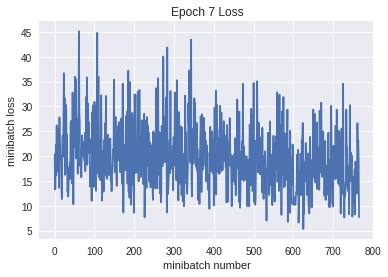

Iteration 5400: with minibatch training loss = 0.284 and accuracy of 0.88
Iteration 5500: with minibatch training loss = 0.217 and accuracy of 0.92
Iteration 5600: with minibatch training loss = 0.262 and accuracy of 0.89
Iteration 5700: with minibatch training loss = 0.362 and accuracy of 0.86
Iteration 5800: with minibatch training loss = 0.3 and accuracy of 0.89
Iteration 5900: with minibatch training loss = 0.29 and accuracy of 0.92
Iteration 6000: with minibatch training loss = 0.0897 and accuracy of 0.97
Iteration 6100: with minibatch training loss = 0.287 and accuracy of 0.94
Epoch 8, Overall loss = 0.247 and accuracy of 0.913


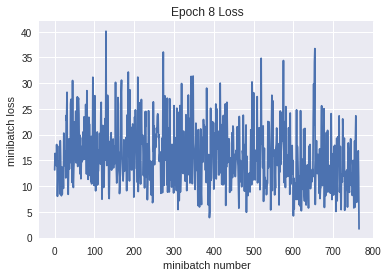

Iteration 6200: with minibatch training loss = 0.118 and accuracy of 0.94
Iteration 6300: with minibatch training loss = 0.179 and accuracy of 0.95
Iteration 6400: with minibatch training loss = 0.216 and accuracy of 0.95
Iteration 6500: with minibatch training loss = 0.286 and accuracy of 0.89
Iteration 6600: with minibatch training loss = 0.151 and accuracy of 0.97
Iteration 6700: with minibatch training loss = 0.0963 and accuracy of 0.95
Iteration 6800: with minibatch training loss = 0.133 and accuracy of 0.95
Epoch 9, Overall loss = 0.209 and accuracy of 0.926


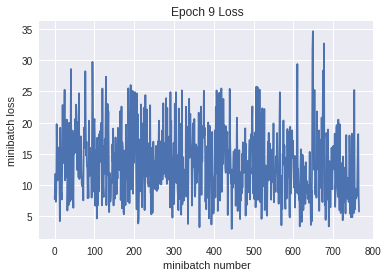

Iteration 6900: with minibatch training loss = 0.116 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.245 and accuracy of 0.94
Iteration 7100: with minibatch training loss = 0.302 and accuracy of 0.92
Iteration 7200: with minibatch training loss = 0.122 and accuracy of 0.97
Iteration 7300: with minibatch training loss = 0.179 and accuracy of 0.92
Iteration 7400: with minibatch training loss = 0.238 and accuracy of 0.94
Iteration 7500: with minibatch training loss = 0.222 and accuracy of 0.92
Iteration 7600: with minibatch training loss = 0.165 and accuracy of 0.92
Epoch 10, Overall loss = 0.183 and accuracy of 0.936


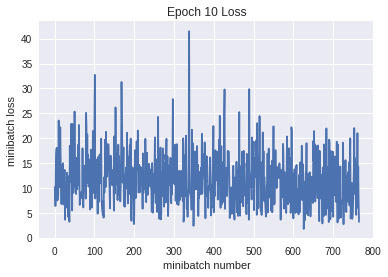

Validation
Epoch 1, Overall loss = 1.6 and accuracy of 0.683


(1.6032399225234986, 0.683)

In [60]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [62]:
def my_model17(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 32])
    bconv2 = tf.get_variable("bconv2", shape=[32])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 32, 64])
    bconv3 = tf.get_variable("bconv3", shape=[64])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 64, 80])
    bconv4 = tf.get_variable("bconv4", shape=[80])
    Wconv5 = tf.get_variable("Wconv5", shape=[3, 3, 80, 80])
    bconv5 = tf.get_variable("bconv5", shape=[80])
    Waff1 = tf.get_variable("Waff1", shape=[720, 400])
    baff1 = tf.get_variable("baff1", shape=[400])
    Waff2 = tf.get_variable("Waff2", shape=[400, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 32*24*24 = 18432
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(24 - 2 + 1 ) / 2  = 11.5 -> 32*12*12 = 4608
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    #p2 = b2
    # conv3x3 stride1 padding valid: (12 - 3 + 1 ) / 1  = 10 -> 64*10*10 = 6400
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (10 - 3 + 1 ) / 1  = 8 -> 80*8*8 = 5120
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    b4 = tf.layers.batch_normalization(r4, training=is_training) # training?
    p4 = b4
    # conv3x3 stride1 padding valid: (8 - 3 + 1 ) / 1  = 6 -> 80*6*6 = 2880
    c5 = tf.nn.conv2d(p4, Wconv5, strides=[1,1,1,1], padding='VALID') + bconv5
    r5 = tf.nn.relu(c5)
    b5 = tf.layers.batch_normalization(r5, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(6 - 2 + 1 ) / 2  = 2.5 -> 80*3*3 = 720
    p5 = tf.nn.max_pool(b5,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p5_flat = tf.reshape(p5,[-1,720])
    a1 = tf.matmul(p5_flat,Waff1) + baff1
    r6 = tf.nn.relu(a1)
    a2 = tf.matmul(r6,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model17(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.23 and accuracy of 0.062
Iteration 100: with minibatch training loss = 2.39 and accuracy of 0.25
Iteration 200: with minibatch training loss = 1.59 and accuracy of 0.44
Iteration 300: with minibatch training loss = 1.58 and accuracy of 0.48
Iteration 400: with minibatch training loss = 1.36 and accuracy of 0.52
Iteration 500: with minibatch training loss = 1.43 and accuracy of 0.53
Iteration 600: with minibatch training loss = 1.17 and accuracy of 0.53
Iteration 700: with minibatch training loss = 1.18 and accuracy of 0.56
Epoch 1, Overall loss = 1.59 and accuracy of 0.441


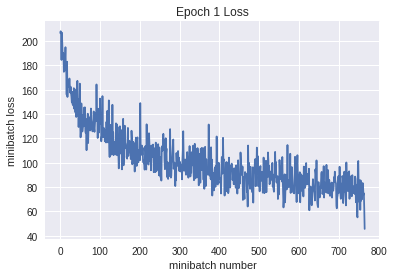

Iteration 800: with minibatch training loss = 1.39 and accuracy of 0.47
Iteration 900: with minibatch training loss = 1.07 and accuracy of 0.62
Iteration 1000: with minibatch training loss = 1.09 and accuracy of 0.56
Iteration 1100: with minibatch training loss = 1.21 and accuracy of 0.53
Iteration 1200: with minibatch training loss = 1.05 and accuracy of 0.66
Iteration 1300: with minibatch training loss = 1.02 and accuracy of 0.67
Iteration 1400: with minibatch training loss = 0.969 and accuracy of 0.66
Iteration 1500: with minibatch training loss = 1.15 and accuracy of 0.61
Epoch 2, Overall loss = 1.1 and accuracy of 0.608


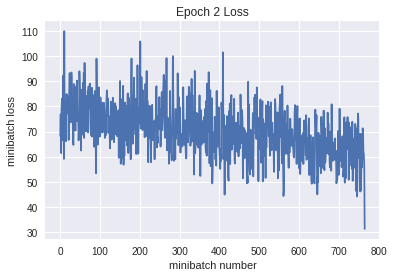

Iteration 1600: with minibatch training loss = 1.02 and accuracy of 0.59
Iteration 1700: with minibatch training loss = 0.863 and accuracy of 0.66
Iteration 1800: with minibatch training loss = 0.806 and accuracy of 0.67
Iteration 1900: with minibatch training loss = 0.877 and accuracy of 0.64
Iteration 2000: with minibatch training loss = 0.975 and accuracy of 0.67
Iteration 2100: with minibatch training loss = 1.07 and accuracy of 0.69
Iteration 2200: with minibatch training loss = 0.77 and accuracy of 0.7
Epoch 3, Overall loss = 0.893 and accuracy of 0.686


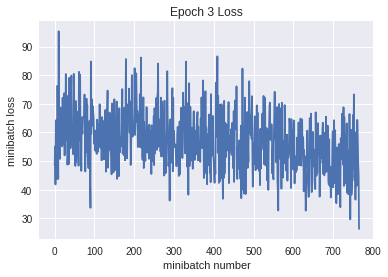

Iteration 2300: with minibatch training loss = 0.591 and accuracy of 0.84
Iteration 2400: with minibatch training loss = 0.722 and accuracy of 0.72
Iteration 2500: with minibatch training loss = 0.827 and accuracy of 0.73
Iteration 2600: with minibatch training loss = 0.589 and accuracy of 0.75
Iteration 2700: with minibatch training loss = 0.609 and accuracy of 0.78
Iteration 2800: with minibatch training loss = 0.775 and accuracy of 0.69
Iteration 2900: with minibatch training loss = 0.78 and accuracy of 0.78
Iteration 3000: with minibatch training loss = 0.802 and accuracy of 0.72
Epoch 4, Overall loss = 0.738 and accuracy of 0.742


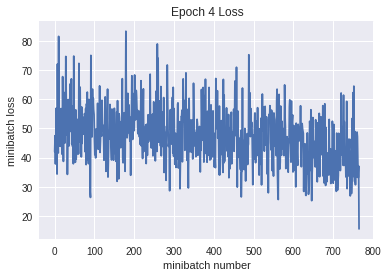

Iteration 3100: with minibatch training loss = 0.515 and accuracy of 0.83
Iteration 3200: with minibatch training loss = 0.555 and accuracy of 0.83
Iteration 3300: with minibatch training loss = 0.613 and accuracy of 0.8
Iteration 3400: with minibatch training loss = 0.296 and accuracy of 0.91
Iteration 3500: with minibatch training loss = 0.503 and accuracy of 0.84
Iteration 3600: with minibatch training loss = 0.636 and accuracy of 0.75
Iteration 3700: with minibatch training loss = 0.5 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.516 and accuracy of 0.86
Epoch 5, Overall loss = 0.61 and accuracy of 0.785


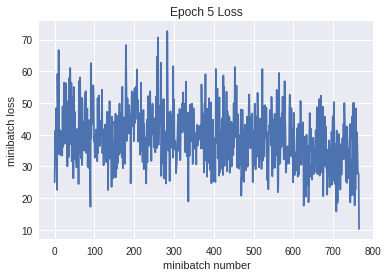

Iteration 3900: with minibatch training loss = 0.41 and accuracy of 0.84
Iteration 4000: with minibatch training loss = 0.707 and accuracy of 0.72
Iteration 4100: with minibatch training loss = 0.665 and accuracy of 0.8
Iteration 4200: with minibatch training loss = 0.604 and accuracy of 0.84
Iteration 4300: with minibatch training loss = 0.36 and accuracy of 0.84
Iteration 4400: with minibatch training loss = 0.443 and accuracy of 0.92
Iteration 4500: with minibatch training loss = 0.367 and accuracy of 0.86
Epoch 6, Overall loss = 0.5 and accuracy of 0.825


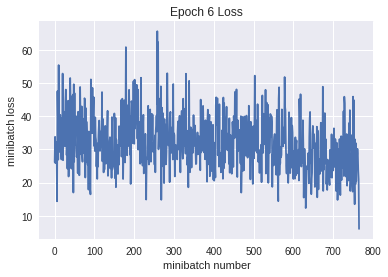

Iteration 4600: with minibatch training loss = 0.379 and accuracy of 0.84
Iteration 4700: with minibatch training loss = 0.469 and accuracy of 0.83
Iteration 4800: with minibatch training loss = 0.5 and accuracy of 0.83
Iteration 4900: with minibatch training loss = 0.368 and accuracy of 0.88
Iteration 5000: with minibatch training loss = 0.29 and accuracy of 0.89
Iteration 5100: with minibatch training loss = 0.397 and accuracy of 0.89
Iteration 5200: with minibatch training loss = 0.358 and accuracy of 0.89
Iteration 5300: with minibatch training loss = 0.36 and accuracy of 0.83
Epoch 7, Overall loss = 0.409 and accuracy of 0.855


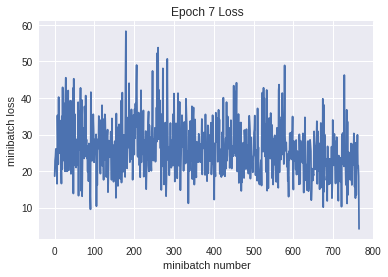

Iteration 5400: with minibatch training loss = 0.302 and accuracy of 0.88
Iteration 5500: with minibatch training loss = 0.315 and accuracy of 0.89
Iteration 5600: with minibatch training loss = 0.298 and accuracy of 0.91
Iteration 5700: with minibatch training loss = 0.513 and accuracy of 0.84
Iteration 5800: with minibatch training loss = 0.241 and accuracy of 0.89
Iteration 5900: with minibatch training loss = 0.318 and accuracy of 0.89
Iteration 6000: with minibatch training loss = 0.261 and accuracy of 0.94
Iteration 6100: with minibatch training loss = 0.206 and accuracy of 0.91
Epoch 8, Overall loss = 0.337 and accuracy of 0.88


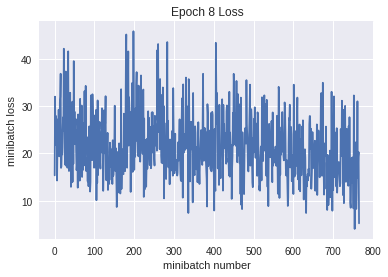

Iteration 6200: with minibatch training loss = 0.326 and accuracy of 0.91
Iteration 6300: with minibatch training loss = 0.237 and accuracy of 0.91
Iteration 6400: with minibatch training loss = 0.281 and accuracy of 0.92
Iteration 6500: with minibatch training loss = 0.353 and accuracy of 0.88
Iteration 6600: with minibatch training loss = 0.36 and accuracy of 0.88
Iteration 6700: with minibatch training loss = 0.232 and accuracy of 0.92
Iteration 6800: with minibatch training loss = 0.329 and accuracy of 0.89
Epoch 9, Overall loss = 0.282 and accuracy of 0.899


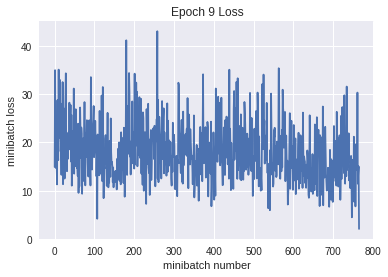

Iteration 6900: with minibatch training loss = 0.112 and accuracy of 0.97
Iteration 7000: with minibatch training loss = 0.189 and accuracy of 0.91
Iteration 7100: with minibatch training loss = 0.372 and accuracy of 0.83
Iteration 7200: with minibatch training loss = 0.322 and accuracy of 0.83
Iteration 7300: with minibatch training loss = 0.395 and accuracy of 0.89
Iteration 7400: with minibatch training loss = 0.329 and accuracy of 0.88
Iteration 7500: with minibatch training loss = 0.173 and accuracy of 0.94
Iteration 7600: with minibatch training loss = 0.171 and accuracy of 0.94
Epoch 10, Overall loss = 0.243 and accuracy of 0.913


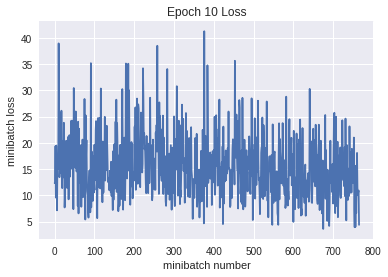

Validation
Epoch 1, Overall loss = 1.69 and accuracy of 0.662


(1.6944800758361815, 0.662)

In [63]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [64]:
def my_model18(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 32])
    bconv2 = tf.get_variable("bconv2", shape=[32])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 32, 64])
    bconv3 = tf.get_variable("bconv3", shape=[64])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 64, 80])
    bconv4 = tf.get_variable("bconv4", shape=[80])
    Waff1 = tf.get_variable("Waff1", shape=[1280, 500])
    baff1 = tf.get_variable("baff1", shape=[500])
    Waff2 = tf.get_variable("Waff2", shape=[500, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 32*24*24 = 18432
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(24 - 2 + 1 ) / 2  = 11.5 -> 32*12*12 = 4608
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    #p2 = b2
    # conv3x3 stride1 padding valid: (12 - 3 + 1 ) / 1  = 10 -> 64*10*10 = 6400
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (10 - 3 + 1 ) / 1  = 8 -> 80*8*8 = 5120
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    b4 = tf.layers.batch_normalization(r4, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(8 - 2 + 1 ) / 2  = 3.5 -> 80*4*4 = 1280
    p4 = tf.nn.max_pool(b4,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p4_flat = tf.reshape(p4,[-1,1280])
    a1 = tf.matmul(p4_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.58 and accuracy of 0.062
Iteration 100: with minibatch training loss = 2.28 and accuracy of 0.33
Iteration 200: with minibatch training loss = 1.43 and accuracy of 0.52
Iteration 300: with minibatch training loss = 1.39 and accuracy of 0.48
Iteration 400: with minibatch training loss = 1.44 and accuracy of 0.53
Iteration 500: with minibatch training loss = 1.66 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.4 and accuracy of 0.55
Iteration 700: with minibatch training loss = 1.19 and accuracy of 0.59
Epoch 1, Overall loss = 1.55 and accuracy of 0.462


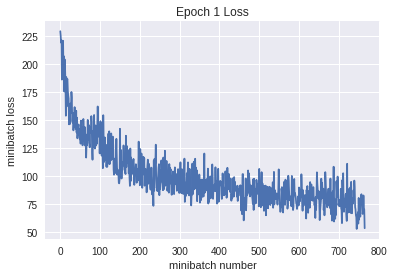

Iteration 800: with minibatch training loss = 1.15 and accuracy of 0.61
Iteration 900: with minibatch training loss = 0.928 and accuracy of 0.7
Iteration 1000: with minibatch training loss = 0.816 and accuracy of 0.64
Iteration 1100: with minibatch training loss = 1.15 and accuracy of 0.61
Iteration 1200: with minibatch training loss = 0.983 and accuracy of 0.61
Iteration 1300: with minibatch training loss = 1.21 and accuracy of 0.61
Iteration 1400: with minibatch training loss = 1.01 and accuracy of 0.59
Iteration 1500: with minibatch training loss = 1.08 and accuracy of 0.59
Epoch 2, Overall loss = 1.04 and accuracy of 0.635


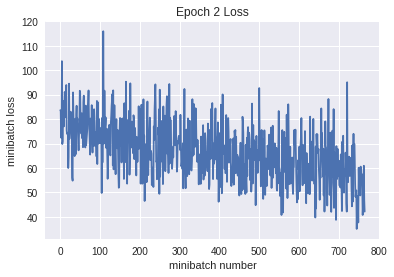

Iteration 1600: with minibatch training loss = 0.912 and accuracy of 0.73
Iteration 1700: with minibatch training loss = 0.652 and accuracy of 0.81
Iteration 1800: with minibatch training loss = 0.959 and accuracy of 0.7
Iteration 1900: with minibatch training loss = 0.805 and accuracy of 0.67
Iteration 2000: with minibatch training loss = 0.607 and accuracy of 0.78
Iteration 2100: with minibatch training loss = 0.697 and accuracy of 0.75
Iteration 2200: with minibatch training loss = 0.593 and accuracy of 0.81
Epoch 3, Overall loss = 0.803 and accuracy of 0.72


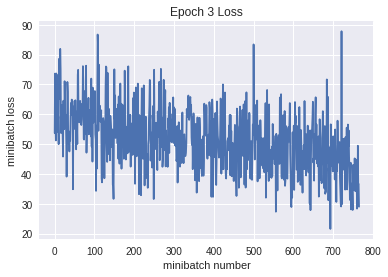

Iteration 2300: with minibatch training loss = 0.625 and accuracy of 0.77
Iteration 2400: with minibatch training loss = 0.619 and accuracy of 0.8
Iteration 2500: with minibatch training loss = 0.428 and accuracy of 0.86
Iteration 2600: with minibatch training loss = 0.79 and accuracy of 0.75
Iteration 2700: with minibatch training loss = 0.569 and accuracy of 0.8
Iteration 2800: with minibatch training loss = 0.677 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 0.315 and accuracy of 0.89
Iteration 3000: with minibatch training loss = 0.5 and accuracy of 0.84
Epoch 4, Overall loss = 0.618 and accuracy of 0.784


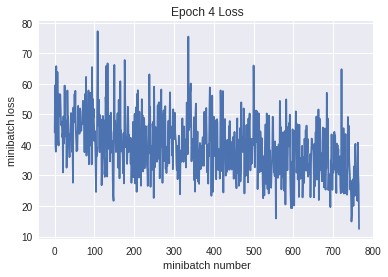

Iteration 3100: with minibatch training loss = 0.476 and accuracy of 0.81
Iteration 3200: with minibatch training loss = 0.612 and accuracy of 0.77
Iteration 3300: with minibatch training loss = 0.554 and accuracy of 0.81
Iteration 3400: with minibatch training loss = 0.645 and accuracy of 0.78
Iteration 3500: with minibatch training loss = 0.514 and accuracy of 0.86
Iteration 3600: with minibatch training loss = 0.516 and accuracy of 0.8
Iteration 3700: with minibatch training loss = 0.566 and accuracy of 0.8
Iteration 3800: with minibatch training loss = 0.342 and accuracy of 0.88
Epoch 5, Overall loss = 0.466 and accuracy of 0.838


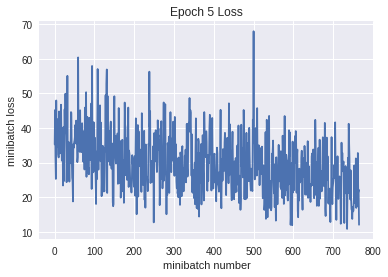

Iteration 3900: with minibatch training loss = 0.422 and accuracy of 0.86
Iteration 4000: with minibatch training loss = 0.446 and accuracy of 0.88
Iteration 4100: with minibatch training loss = 0.28 and accuracy of 0.92
Iteration 4200: with minibatch training loss = 0.338 and accuracy of 0.89
Iteration 4300: with minibatch training loss = 0.408 and accuracy of 0.89
Iteration 4400: with minibatch training loss = 0.184 and accuracy of 0.94
Iteration 4500: with minibatch training loss = 0.4 and accuracy of 0.89
Epoch 6, Overall loss = 0.349 and accuracy of 0.878


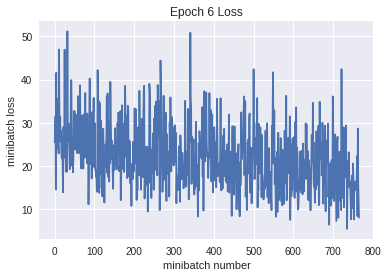

Iteration 4600: with minibatch training loss = 0.721 and accuracy of 0.8
Iteration 4700: with minibatch training loss = 0.24 and accuracy of 0.91
Iteration 4800: with minibatch training loss = 0.386 and accuracy of 0.86
Iteration 4900: with minibatch training loss = 0.235 and accuracy of 0.86
Iteration 5000: with minibatch training loss = 0.331 and accuracy of 0.89
Iteration 5100: with minibatch training loss = 0.263 and accuracy of 0.89
Iteration 5200: with minibatch training loss = 0.34 and accuracy of 0.84
Iteration 5300: with minibatch training loss = 0.198 and accuracy of 0.92
Epoch 7, Overall loss = 0.274 and accuracy of 0.904


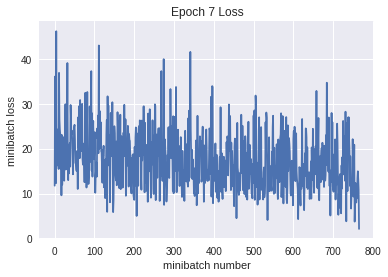

Iteration 5400: with minibatch training loss = 0.175 and accuracy of 0.92
Iteration 5500: with minibatch training loss = 0.238 and accuracy of 0.91
Iteration 5600: with minibatch training loss = 0.453 and accuracy of 0.81
Iteration 5700: with minibatch training loss = 0.153 and accuracy of 0.94
Iteration 5800: with minibatch training loss = 0.355 and accuracy of 0.88
Iteration 5900: with minibatch training loss = 0.159 and accuracy of 0.92
Iteration 6000: with minibatch training loss = 0.108 and accuracy of 0.98
Iteration 6100: with minibatch training loss = 0.153 and accuracy of 0.97
Epoch 8, Overall loss = 0.218 and accuracy of 0.923


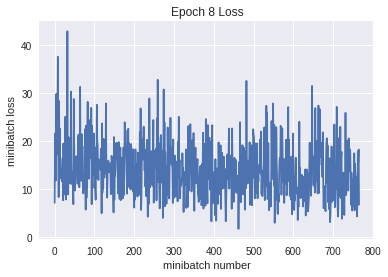

Iteration 6200: with minibatch training loss = 0.237 and accuracy of 0.91
Iteration 6300: with minibatch training loss = 0.148 and accuracy of 0.91
Iteration 6400: with minibatch training loss = 0.0822 and accuracy of 0.97
Iteration 6500: with minibatch training loss = 0.149 and accuracy of 0.94
Iteration 6600: with minibatch training loss = 0.202 and accuracy of 0.91
Iteration 6700: with minibatch training loss = 0.204 and accuracy of 0.92
Iteration 6800: with minibatch training loss = 0.135 and accuracy of 0.95
Epoch 9, Overall loss = 0.191 and accuracy of 0.932


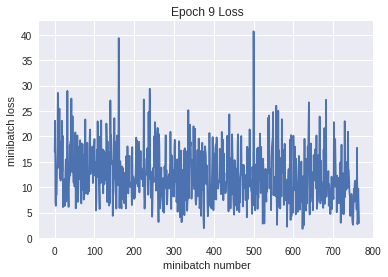

Iteration 6900: with minibatch training loss = 0.218 and accuracy of 0.91
Iteration 7000: with minibatch training loss = 0.0985 and accuracy of 0.95
Iteration 7100: with minibatch training loss = 0.0437 and accuracy of 0.98
Iteration 7200: with minibatch training loss = 0.103 and accuracy of 0.98
Iteration 7300: with minibatch training loss = 0.275 and accuracy of 0.89
Iteration 7400: with minibatch training loss = 0.07 and accuracy of 0.98
Iteration 7500: with minibatch training loss = 0.0751 and accuracy of 0.97
Iteration 7600: with minibatch training loss = 0.198 and accuracy of 0.97
Epoch 10, Overall loss = 0.163 and accuracy of 0.942


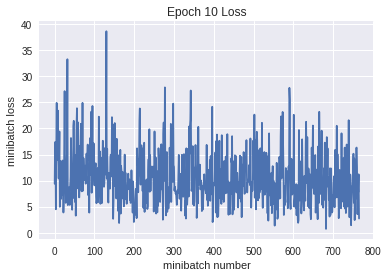

Validation
Epoch 1, Overall loss = 1.81 and accuracy of 0.685


(1.810019097328186, 0.685)

In [65]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [66]:
def my_model19(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 32])
    bconv2 = tf.get_variable("bconv2", shape=[32])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 32, 64])
    bconv3 = tf.get_variable("bconv3", shape=[64])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 64, 80])
    bconv4 = tf.get_variable("bconv4", shape=[80])
    Waff1 = tf.get_variable("Waff1", shape=[1280, 400])
    baff1 = tf.get_variable("baff1", shape=[400])
    Waff2 = tf.get_variable("Waff2", shape=[400, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 32*24*24 = 18432
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(24 - 2 + 1 ) / 2  = 11.5 -> 32*12*12 = 4608
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    #p2 = b2
    # conv3x3 stride1 padding valid: (12 - 3 + 1 ) / 1  = 10 -> 64*10*10 = 6400
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (10 - 3 + 1 ) / 1  = 8 -> 80*8*8 = 5120
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    b4 = tf.layers.batch_normalization(r4, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(8 - 2 + 1 ) / 2  = 3.5 -> 80*4*4 = 1280
    p4 = tf.nn.max_pool(b4,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p4_flat = tf.reshape(p4,[-1,1280])
    a1 = tf.matmul(p4_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model19(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(5e-4)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.88 and accuracy of 0.12
Iteration 100: with minibatch training loss = 1.99 and accuracy of 0.38
Iteration 200: with minibatch training loss = 1.76 and accuracy of 0.45
Iteration 300: with minibatch training loss = 1.24 and accuracy of 0.52
Iteration 400: with minibatch training loss = 1.44 and accuracy of 0.5
Iteration 500: with minibatch training loss = 1.17 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.24 and accuracy of 0.53
Iteration 700: with minibatch training loss = 1.35 and accuracy of 0.59
Epoch 1, Overall loss = 1.58 and accuracy of 0.453


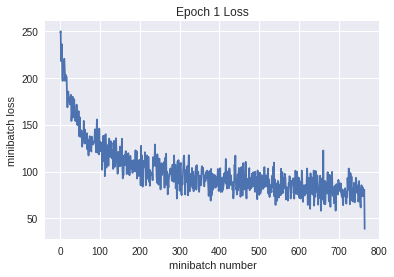

Iteration 800: with minibatch training loss = 1.21 and accuracy of 0.61
Iteration 900: with minibatch training loss = 0.979 and accuracy of 0.64
Iteration 1000: with minibatch training loss = 1.19 and accuracy of 0.59
Iteration 1100: with minibatch training loss = 1.1 and accuracy of 0.59
Iteration 1200: with minibatch training loss = 0.984 and accuracy of 0.67
Iteration 1300: with minibatch training loss = 1.06 and accuracy of 0.62
Iteration 1400: with minibatch training loss = 0.906 and accuracy of 0.67
Iteration 1500: with minibatch training loss = 0.835 and accuracy of 0.7
Epoch 2, Overall loss = 1.07 and accuracy of 0.625


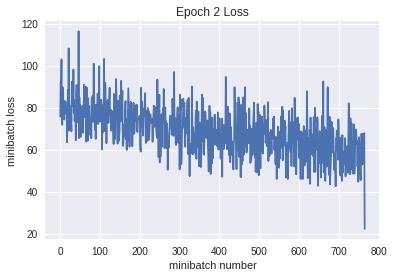

Iteration 1600: with minibatch training loss = 0.882 and accuracy of 0.67
Iteration 1700: with minibatch training loss = 1 and accuracy of 0.62
Iteration 1800: with minibatch training loss = 0.913 and accuracy of 0.75
Iteration 1900: with minibatch training loss = 0.917 and accuracy of 0.66
Iteration 2000: with minibatch training loss = 0.65 and accuracy of 0.78
Iteration 2100: with minibatch training loss = 0.567 and accuracy of 0.8
Iteration 2200: with minibatch training loss = 0.779 and accuracy of 0.75
Epoch 3, Overall loss = 0.818 and accuracy of 0.717


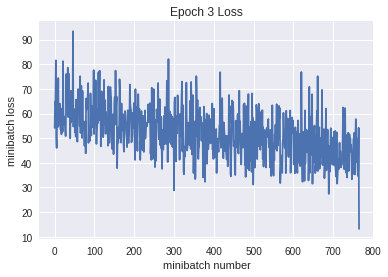

Iteration 2300: with minibatch training loss = 0.736 and accuracy of 0.77
Iteration 2400: with minibatch training loss = 0.798 and accuracy of 0.77
Iteration 2500: with minibatch training loss = 0.527 and accuracy of 0.8
Iteration 2600: with minibatch training loss = 0.839 and accuracy of 0.67
Iteration 2700: with minibatch training loss = 0.601 and accuracy of 0.81
Iteration 2800: with minibatch training loss = 0.708 and accuracy of 0.77
Iteration 2900: with minibatch training loss = 0.621 and accuracy of 0.75
Iteration 3000: with minibatch training loss = 0.63 and accuracy of 0.84
Epoch 4, Overall loss = 0.621 and accuracy of 0.789


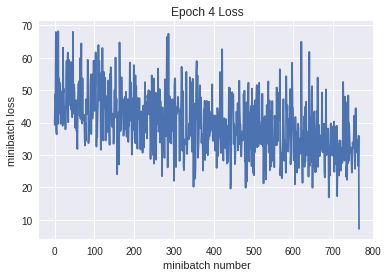

Iteration 3100: with minibatch training loss = 0.627 and accuracy of 0.75
Iteration 3200: with minibatch training loss = 0.425 and accuracy of 0.83
Iteration 3300: with minibatch training loss = 0.58 and accuracy of 0.84
Iteration 3400: with minibatch training loss = 0.424 and accuracy of 0.86
Iteration 3500: with minibatch training loss = 0.274 and accuracy of 0.92
Iteration 3600: with minibatch training loss = 0.497 and accuracy of 0.81
Iteration 3700: with minibatch training loss = 0.399 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.315 and accuracy of 0.88
Epoch 5, Overall loss = 0.449 and accuracy of 0.85


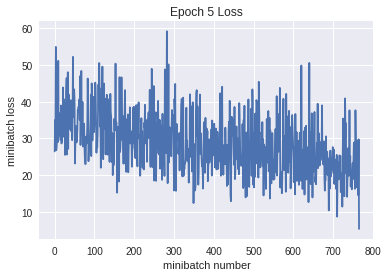

Iteration 3900: with minibatch training loss = 0.466 and accuracy of 0.86
Iteration 4000: with minibatch training loss = 0.328 and accuracy of 0.89
Iteration 4100: with minibatch training loss = 0.194 and accuracy of 0.92
Iteration 4200: with minibatch training loss = 0.21 and accuracy of 0.92
Iteration 4300: with minibatch training loss = 0.207 and accuracy of 0.92
Iteration 4400: with minibatch training loss = 0.242 and accuracy of 0.95
Iteration 4500: with minibatch training loss = 0.224 and accuracy of 0.94
Epoch 6, Overall loss = 0.315 and accuracy of 0.897


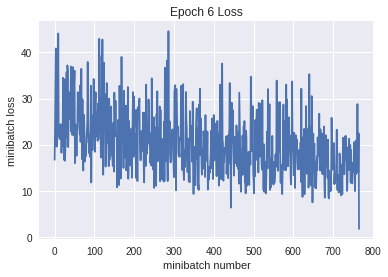

Iteration 4600: with minibatch training loss = 0.279 and accuracy of 0.88
Iteration 4700: with minibatch training loss = 0.275 and accuracy of 0.86
Iteration 4800: with minibatch training loss = 0.177 and accuracy of 0.97
Iteration 4900: with minibatch training loss = 0.26 and accuracy of 0.92
Iteration 5000: with minibatch training loss = 0.263 and accuracy of 0.94
Iteration 5100: with minibatch training loss = 0.215 and accuracy of 0.94
Iteration 5200: with minibatch training loss = 0.157 and accuracy of 0.95
Iteration 5300: with minibatch training loss = 0.131 and accuracy of 0.97
Epoch 7, Overall loss = 0.228 and accuracy of 0.926


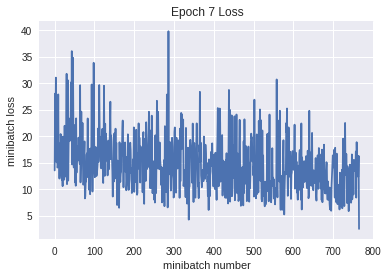

Iteration 5400: with minibatch training loss = 0.127 and accuracy of 0.98
Iteration 5500: with minibatch training loss = 0.132 and accuracy of 0.94
Iteration 5600: with minibatch training loss = 0.188 and accuracy of 0.94
Iteration 5700: with minibatch training loss = 0.134 and accuracy of 0.97
Iteration 5800: with minibatch training loss = 0.186 and accuracy of 0.97
Iteration 5900: with minibatch training loss = 0.122 and accuracy of 0.95
Iteration 6000: with minibatch training loss = 0.124 and accuracy of 0.94
Iteration 6100: with minibatch training loss = 0.208 and accuracy of 0.97
Epoch 8, Overall loss = 0.18 and accuracy of 0.939


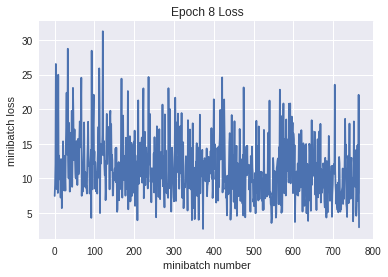

Iteration 6200: with minibatch training loss = 0.121 and accuracy of 0.95
Iteration 6300: with minibatch training loss = 0.266 and accuracy of 0.91
Iteration 6400: with minibatch training loss = 0.133 and accuracy of 0.95
Iteration 6500: with minibatch training loss = 0.121 and accuracy of 0.95
Iteration 6600: with minibatch training loss = 0.102 and accuracy of 0.98
Iteration 6700: with minibatch training loss = 0.111 and accuracy of 0.92
Iteration 6800: with minibatch training loss = 0.235 and accuracy of 0.92
Epoch 9, Overall loss = 0.152 and accuracy of 0.948


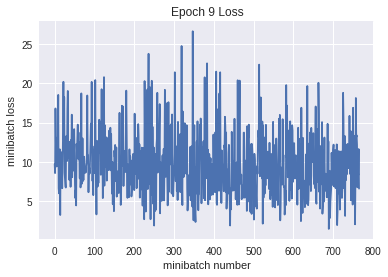

Iteration 6900: with minibatch training loss = 0.166 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.167 and accuracy of 0.94
Iteration 7100: with minibatch training loss = 0.491 and accuracy of 0.92
Iteration 7200: with minibatch training loss = 0.138 and accuracy of 0.95
Iteration 7300: with minibatch training loss = 0.228 and accuracy of 0.89
Iteration 7400: with minibatch training loss = 0.107 and accuracy of 0.98
Iteration 7500: with minibatch training loss = 0.123 and accuracy of 0.97
Iteration 7600: with minibatch training loss = 0.0769 and accuracy of 0.97
Epoch 10, Overall loss = 0.136 and accuracy of 0.953


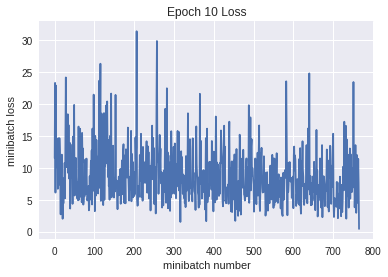

Validation
Epoch 1, Overall loss = 1.79 and accuracy of 0.656


(1.7944149265289306, 0.656)

In [67]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [68]:
# my_model19 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model19(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-2)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.59 and accuracy of 0.11
Iteration 100: with minibatch training loss = 2.47 and accuracy of 0.12
Iteration 200: with minibatch training loss = 1.72 and accuracy of 0.33
Iteration 300: with minibatch training loss = 1.63 and accuracy of 0.44
Iteration 400: with minibatch training loss = 1.78 and accuracy of 0.38
Iteration 500: with minibatch training loss = 1.4 and accuracy of 0.45
Iteration 600: with minibatch training loss = 1.58 and accuracy of 0.39
Iteration 700: with minibatch training loss = 1.48 and accuracy of 0.41
Epoch 1, Overall loss = 1.71 and accuracy of 0.393


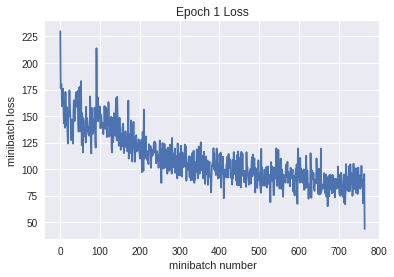

Iteration 800: with minibatch training loss = 1.46 and accuracy of 0.38
Iteration 900: with minibatch training loss = 1.37 and accuracy of 0.58
Iteration 1000: with minibatch training loss = 1.35 and accuracy of 0.53
Iteration 1100: with minibatch training loss = 1.33 and accuracy of 0.55
Iteration 1200: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 1300: with minibatch training loss = 1.59 and accuracy of 0.45
Iteration 1400: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 1500: with minibatch training loss = 0.943 and accuracy of 0.62
Epoch 2, Overall loss = 1.23 and accuracy of 0.571


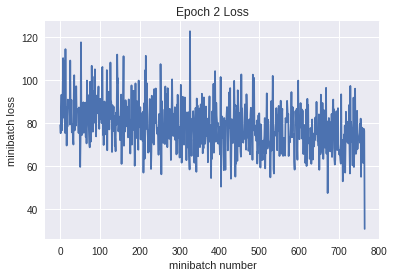

Iteration 1600: with minibatch training loss = 1.22 and accuracy of 0.61
Iteration 1700: with minibatch training loss = 1.09 and accuracy of 0.58
Iteration 1800: with minibatch training loss = 1.14 and accuracy of 0.62
Iteration 1900: with minibatch training loss = 1.16 and accuracy of 0.59
Iteration 2000: with minibatch training loss = 1.36 and accuracy of 0.53
Iteration 2100: with minibatch training loss = 0.927 and accuracy of 0.7
Iteration 2200: with minibatch training loss = 1.29 and accuracy of 0.61
Epoch 3, Overall loss = 1.09 and accuracy of 0.624


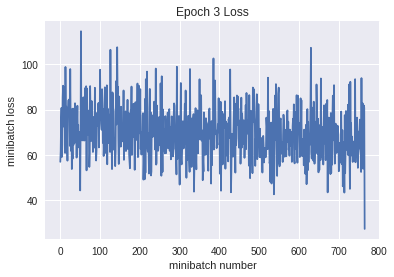

Iteration 2300: with minibatch training loss = 0.971 and accuracy of 0.72
Iteration 2400: with minibatch training loss = 1.06 and accuracy of 0.61
Iteration 2500: with minibatch training loss = 0.82 and accuracy of 0.8
Iteration 2600: with minibatch training loss = 1.05 and accuracy of 0.62
Iteration 2700: with minibatch training loss = 0.778 and accuracy of 0.66
Iteration 2800: with minibatch training loss = 1.07 and accuracy of 0.62
Iteration 2900: with minibatch training loss = 0.975 and accuracy of 0.64
Iteration 3000: with minibatch training loss = 0.88 and accuracy of 0.72
Epoch 4, Overall loss = 1.02 and accuracy of 0.652


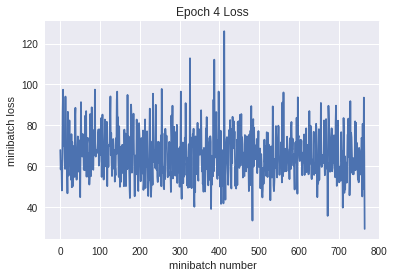

Iteration 3100: with minibatch training loss = 0.911 and accuracy of 0.67
Iteration 3200: with minibatch training loss = 0.889 and accuracy of 0.72
Iteration 3300: with minibatch training loss = 1.18 and accuracy of 0.58
Iteration 3400: with minibatch training loss = 0.624 and accuracy of 0.8
Iteration 3500: with minibatch training loss = 1.21 and accuracy of 0.59
Iteration 3600: with minibatch training loss = 0.791 and accuracy of 0.72
Iteration 3700: with minibatch training loss = 0.981 and accuracy of 0.66
Iteration 3800: with minibatch training loss = 0.83 and accuracy of 0.69
Epoch 5, Overall loss = 0.987 and accuracy of 0.669


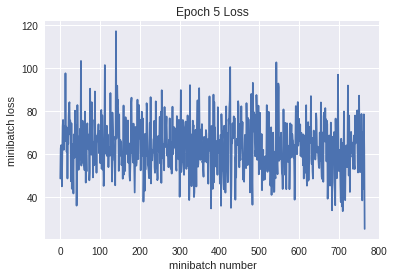

Iteration 3900: with minibatch training loss = 1.05 and accuracy of 0.66
Iteration 4000: with minibatch training loss = 0.848 and accuracy of 0.72
Iteration 4100: with minibatch training loss = 0.812 and accuracy of 0.75
Iteration 4200: with minibatch training loss = 0.891 and accuracy of 0.75
Iteration 4300: with minibatch training loss = 1.09 and accuracy of 0.61
Iteration 4400: with minibatch training loss = 1 and accuracy of 0.66
Iteration 4500: with minibatch training loss = 1.03 and accuracy of 0.66
Epoch 6, Overall loss = 0.975 and accuracy of 0.677


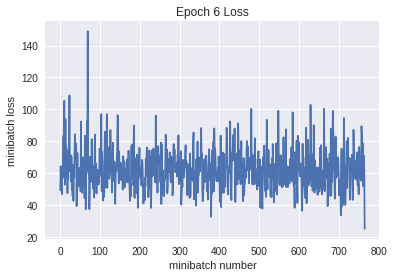

Iteration 4600: with minibatch training loss = 0.959 and accuracy of 0.75
Iteration 4700: with minibatch training loss = 0.779 and accuracy of 0.73
Iteration 4800: with minibatch training loss = 0.766 and accuracy of 0.7
Iteration 4900: with minibatch training loss = 0.764 and accuracy of 0.67
Iteration 5000: with minibatch training loss = 0.646 and accuracy of 0.77
Iteration 5100: with minibatch training loss = 1.04 and accuracy of 0.78
Iteration 5200: with minibatch training loss = 0.819 and accuracy of 0.75
Iteration 5300: with minibatch training loss = 0.89 and accuracy of 0.69
Epoch 7, Overall loss = 0.955 and accuracy of 0.684


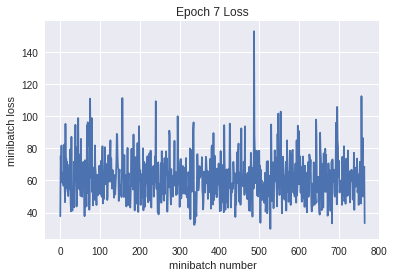

Iteration 5400: with minibatch training loss = 1.04 and accuracy of 0.64
Iteration 5500: with minibatch training loss = 0.763 and accuracy of 0.73
Iteration 5600: with minibatch training loss = 0.845 and accuracy of 0.72
Iteration 5700: with minibatch training loss = 0.734 and accuracy of 0.72
Iteration 5800: with minibatch training loss = 1.21 and accuracy of 0.64
Iteration 5900: with minibatch training loss = 0.555 and accuracy of 0.83
Iteration 6000: with minibatch training loss = 0.916 and accuracy of 0.72
Iteration 6100: with minibatch training loss = 0.725 and accuracy of 0.77
Epoch 8, Overall loss = 0.946 and accuracy of 0.695


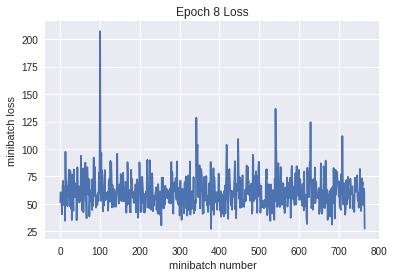

Iteration 6200: with minibatch training loss = 0.844 and accuracy of 0.72
Iteration 6300: with minibatch training loss = 2.39 and accuracy of 0.52
Iteration 6400: with minibatch training loss = 0.845 and accuracy of 0.72
Iteration 6500: with minibatch training loss = 0.646 and accuracy of 0.78
Iteration 6600: with minibatch training loss = 1.16 and accuracy of 0.67
Iteration 6700: with minibatch training loss = 0.725 and accuracy of 0.72
Iteration 6800: with minibatch training loss = 0.383 and accuracy of 0.88
Epoch 9, Overall loss = 0.944 and accuracy of 0.697


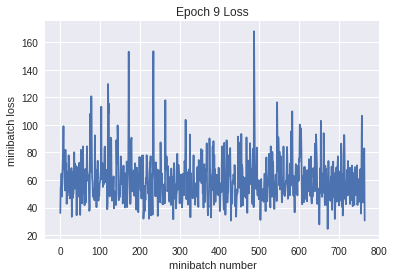

Iteration 6900: with minibatch training loss = 1.02 and accuracy of 0.64
Iteration 7000: with minibatch training loss = 1.06 and accuracy of 0.62
Iteration 7100: with minibatch training loss = 0.855 and accuracy of 0.78
Iteration 7200: with minibatch training loss = 0.977 and accuracy of 0.7
Iteration 7300: with minibatch training loss = 0.933 and accuracy of 0.7
Iteration 7400: with minibatch training loss = 0.678 and accuracy of 0.73
Iteration 7500: with minibatch training loss = 1.17 and accuracy of 0.67
Iteration 7600: with minibatch training loss = 0.963 and accuracy of 0.7
Epoch 10, Overall loss = 0.934 and accuracy of 0.703


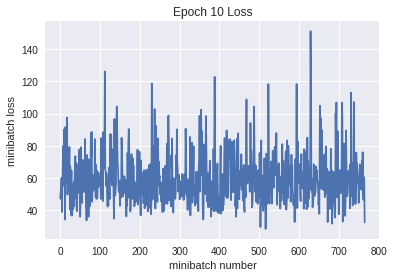

Validation
Epoch 1, Overall loss = 1.15 and accuracy of 0.658


(1.1481175746917724, 0.658)

In [69]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [70]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(1e-2)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.11 and accuracy of 0.047
Iteration 100: with minibatch training loss = 2.49 and accuracy of 0.17
Iteration 200: with minibatch training loss = 1.54 and accuracy of 0.52
Iteration 300: with minibatch training loss = 1.75 and accuracy of 0.27
Iteration 400: with minibatch training loss = 1.31 and accuracy of 0.53
Iteration 500: with minibatch training loss = 1.67 and accuracy of 0.45
Iteration 600: with minibatch training loss = 1.23 and accuracy of 0.52
Iteration 700: with minibatch training loss = 1.62 and accuracy of 0.36
Epoch 1, Overall loss = 1.74 and accuracy of 0.378


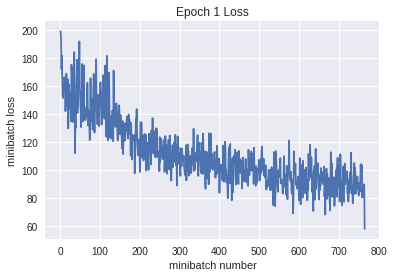

Iteration 800: with minibatch training loss = 1.3 and accuracy of 0.5
Iteration 900: with minibatch training loss = 0.983 and accuracy of 0.66
Iteration 1000: with minibatch training loss = 1.33 and accuracy of 0.5
Iteration 1100: with minibatch training loss = 1.3 and accuracy of 0.56
Iteration 1200: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 1300: with minibatch training loss = 1.21 and accuracy of 0.58
Iteration 1400: with minibatch training loss = 1.12 and accuracy of 0.64
Iteration 1500: with minibatch training loss = 1.09 and accuracy of 0.55
Epoch 2, Overall loss = 1.28 and accuracy of 0.545


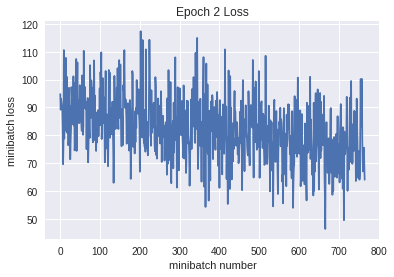

Iteration 1600: with minibatch training loss = 1.04 and accuracy of 0.58
Iteration 1700: with minibatch training loss = 0.966 and accuracy of 0.59
Iteration 1800: with minibatch training loss = 0.962 and accuracy of 0.67
Iteration 1900: with minibatch training loss = 0.916 and accuracy of 0.69
Iteration 2000: with minibatch training loss = 0.981 and accuracy of 0.58
Iteration 2100: with minibatch training loss = 1.06 and accuracy of 0.62
Iteration 2200: with minibatch training loss = 0.849 and accuracy of 0.64
Epoch 3, Overall loss = 1.13 and accuracy of 0.606


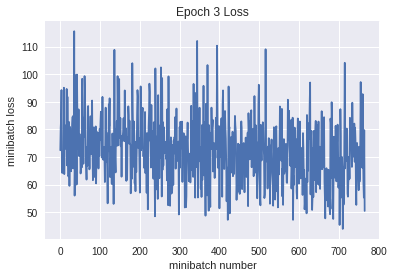

Iteration 2300: with minibatch training loss = 1.18 and accuracy of 0.58
Iteration 2400: with minibatch training loss = 1.3 and accuracy of 0.61
Iteration 2500: with minibatch training loss = 1.34 and accuracy of 0.48
Iteration 2600: with minibatch training loss = 1.25 and accuracy of 0.56
Iteration 2700: with minibatch training loss = 1.02 and accuracy of 0.58
Iteration 2800: with minibatch training loss = 0.855 and accuracy of 0.62
Iteration 2900: with minibatch training loss = 1.2 and accuracy of 0.61
Iteration 3000: with minibatch training loss = 0.8 and accuracy of 0.73
Epoch 4, Overall loss = 1.06 and accuracy of 0.635


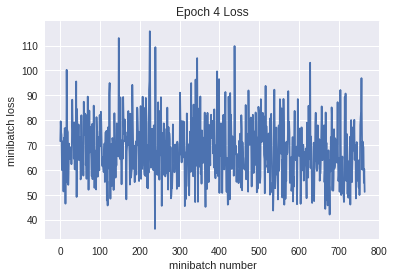

Iteration 3100: with minibatch training loss = 0.918 and accuracy of 0.64
Iteration 3200: with minibatch training loss = 1.44 and accuracy of 0.58
Iteration 3300: with minibatch training loss = 0.911 and accuracy of 0.73
Iteration 3400: with minibatch training loss = 1.06 and accuracy of 0.61
Iteration 3500: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 3600: with minibatch training loss = 0.873 and accuracy of 0.67
Iteration 3700: with minibatch training loss = 1.11 and accuracy of 0.7
Iteration 3800: with minibatch training loss = 1.87 and accuracy of 0.56
Epoch 5, Overall loss = 1.03 and accuracy of 0.65


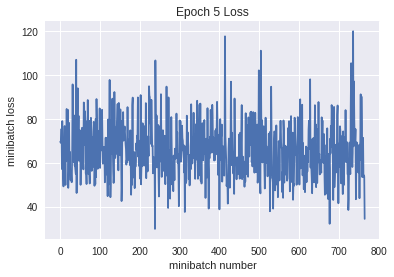

Iteration 3900: with minibatch training loss = 1.63 and accuracy of 0.47
Iteration 4000: with minibatch training loss = 0.843 and accuracy of 0.7
Iteration 4100: with minibatch training loss = 0.889 and accuracy of 0.67
Iteration 4200: with minibatch training loss = 1.42 and accuracy of 0.59
Iteration 4300: with minibatch training loss = 1.18 and accuracy of 0.61
Iteration 4400: with minibatch training loss = 0.811 and accuracy of 0.72
Iteration 4500: with minibatch training loss = 0.863 and accuracy of 0.72
Epoch 6, Overall loss = 1.01 and accuracy of 0.662


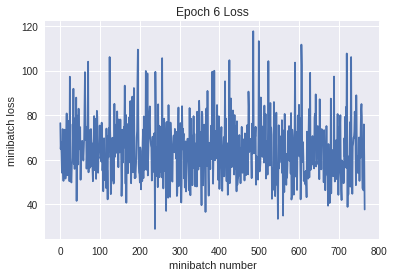

Iteration 4600: with minibatch training loss = 0.898 and accuracy of 0.69
Iteration 4700: with minibatch training loss = 0.934 and accuracy of 0.75
Iteration 4800: with minibatch training loss = 0.886 and accuracy of 0.75
Iteration 4900: with minibatch training loss = 0.761 and accuracy of 0.73
Iteration 5000: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 5100: with minibatch training loss = 1.18 and accuracy of 0.58
Iteration 5200: with minibatch training loss = 0.722 and accuracy of 0.72
Iteration 5300: with minibatch training loss = 1.2 and accuracy of 0.62
Epoch 7, Overall loss = 1.01 and accuracy of 0.664


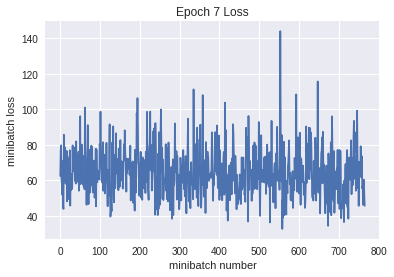

Iteration 5400: with minibatch training loss = 0.965 and accuracy of 0.75
Iteration 5500: with minibatch training loss = 0.889 and accuracy of 0.66
Iteration 5600: with minibatch training loss = 0.541 and accuracy of 0.84
Iteration 5700: with minibatch training loss = 0.955 and accuracy of 0.64
Iteration 5800: with minibatch training loss = 1.15 and accuracy of 0.67
Iteration 5900: with minibatch training loss = 1.11 and accuracy of 0.67
Iteration 6000: with minibatch training loss = 0.887 and accuracy of 0.67
Iteration 6100: with minibatch training loss = 1.23 and accuracy of 0.66
Epoch 8, Overall loss = 1 and accuracy of 0.668


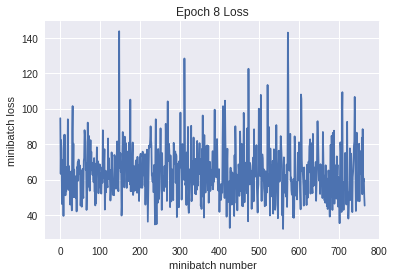

Iteration 6200: with minibatch training loss = 1.07 and accuracy of 0.73
Iteration 6300: with minibatch training loss = 1.1 and accuracy of 0.67
Iteration 6400: with minibatch training loss = 1.17 and accuracy of 0.66
Iteration 6500: with minibatch training loss = 1.18 and accuracy of 0.64
Iteration 6600: with minibatch training loss = 0.609 and accuracy of 0.78
Iteration 6700: with minibatch training loss = 0.984 and accuracy of 0.62
Iteration 6800: with minibatch training loss = 0.585 and accuracy of 0.78
Epoch 9, Overall loss = 0.988 and accuracy of 0.676


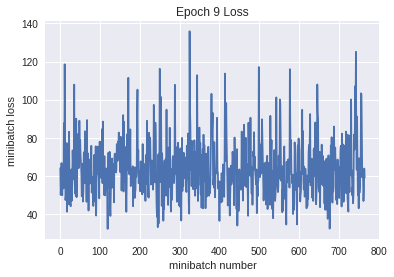

Iteration 6900: with minibatch training loss = 0.99 and accuracy of 0.7
Iteration 7000: with minibatch training loss = 0.866 and accuracy of 0.72
Iteration 7100: with minibatch training loss = 0.867 and accuracy of 0.67
Iteration 7200: with minibatch training loss = 0.906 and accuracy of 0.72
Iteration 7300: with minibatch training loss = 1.12 and accuracy of 0.7
Iteration 7400: with minibatch training loss = 0.891 and accuracy of 0.69
Iteration 7500: with minibatch training loss = 1.35 and accuracy of 0.64
Iteration 7600: with minibatch training loss = 0.769 and accuracy of 0.67
Epoch 10, Overall loss = 0.975 and accuracy of 0.681


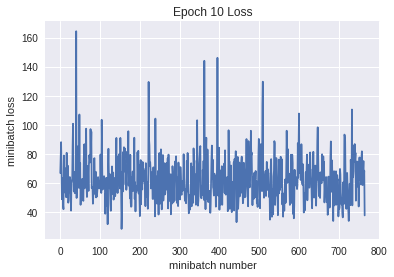

Validation
Epoch 1, Overall loss = 1.3 and accuracy of 0.666


(1.3014686584472657, 0.666)

In [71]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [72]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(5e-4)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.06 and accuracy of 0.11
Iteration 100: with minibatch training loss = 2.18 and accuracy of 0.27
Iteration 200: with minibatch training loss = 1.82 and accuracy of 0.33
Iteration 300: with minibatch training loss = 1.25 and accuracy of 0.55
Iteration 400: with minibatch training loss = 1.45 and accuracy of 0.45
Iteration 500: with minibatch training loss = 1.21 and accuracy of 0.59
Iteration 600: with minibatch training loss = 1.48 and accuracy of 0.53
Iteration 700: with minibatch training loss = 1.25 and accuracy of 0.53
Epoch 1, Overall loss = 1.55 and accuracy of 0.46


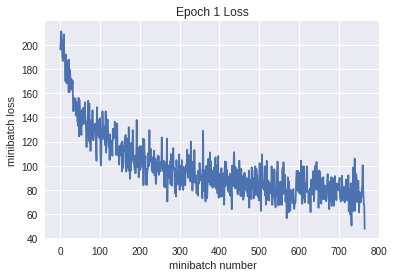

Iteration 800: with minibatch training loss = 1.32 and accuracy of 0.53
Iteration 900: with minibatch training loss = 1.29 and accuracy of 0.55
Iteration 1000: with minibatch training loss = 1.06 and accuracy of 0.62
Iteration 1100: with minibatch training loss = 1.02 and accuracy of 0.61
Iteration 1200: with minibatch training loss = 1.02 and accuracy of 0.62
Iteration 1300: with minibatch training loss = 0.876 and accuracy of 0.69
Iteration 1400: with minibatch training loss = 0.888 and accuracy of 0.67
Iteration 1500: with minibatch training loss = 0.775 and accuracy of 0.7
Epoch 2, Overall loss = 1.04 and accuracy of 0.634


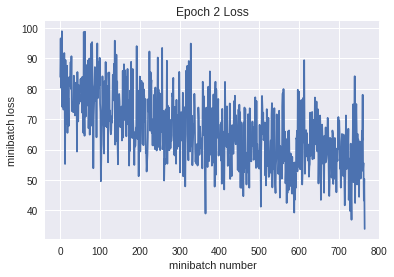

Iteration 1600: with minibatch training loss = 1.04 and accuracy of 0.67
Iteration 1700: with minibatch training loss = 0.75 and accuracy of 0.73
Iteration 1800: with minibatch training loss = 1.09 and accuracy of 0.62
Iteration 1900: with minibatch training loss = 0.588 and accuracy of 0.81
Iteration 2000: with minibatch training loss = 0.499 and accuracy of 0.83
Iteration 2100: with minibatch training loss = 0.664 and accuracy of 0.72
Iteration 2200: with minibatch training loss = 0.578 and accuracy of 0.8
Epoch 3, Overall loss = 0.778 and accuracy of 0.728


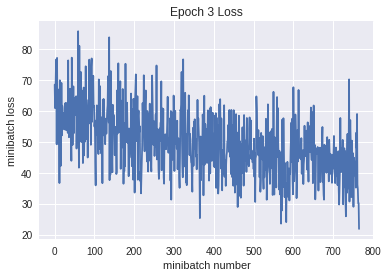

Iteration 2300: with minibatch training loss = 0.779 and accuracy of 0.77
Iteration 2400: with minibatch training loss = 0.552 and accuracy of 0.83
Iteration 2500: with minibatch training loss = 0.779 and accuracy of 0.67
Iteration 2600: with minibatch training loss = 0.557 and accuracy of 0.81
Iteration 2700: with minibatch training loss = 0.392 and accuracy of 0.88
Iteration 2800: with minibatch training loss = 0.42 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 0.522 and accuracy of 0.83
Iteration 3000: with minibatch training loss = 0.649 and accuracy of 0.77
Epoch 4, Overall loss = 0.569 and accuracy of 0.805


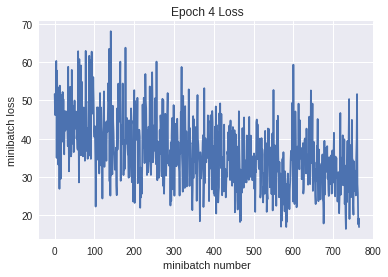

Iteration 3100: with minibatch training loss = 0.406 and accuracy of 0.88
Iteration 3200: with minibatch training loss = 0.598 and accuracy of 0.84
Iteration 3300: with minibatch training loss = 0.4 and accuracy of 0.91
Iteration 3400: with minibatch training loss = 0.374 and accuracy of 0.89
Iteration 3500: with minibatch training loss = 0.577 and accuracy of 0.8
Iteration 3600: with minibatch training loss = 0.402 and accuracy of 0.88
Iteration 3700: with minibatch training loss = 0.34 and accuracy of 0.89
Iteration 3800: with minibatch training loss = 0.519 and accuracy of 0.84
Epoch 5, Overall loss = 0.395 and accuracy of 0.868


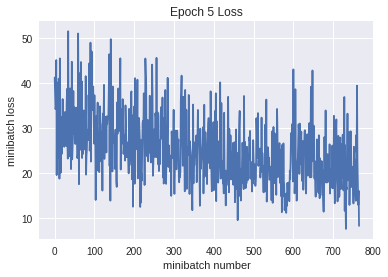

Iteration 3900: with minibatch training loss = 0.263 and accuracy of 0.92
Iteration 4000: with minibatch training loss = 0.216 and accuracy of 0.94
Iteration 4100: with minibatch training loss = 0.3 and accuracy of 0.92
Iteration 4200: with minibatch training loss = 0.224 and accuracy of 0.92
Iteration 4300: with minibatch training loss = 0.151 and accuracy of 0.97
Iteration 4400: with minibatch training loss = 0.363 and accuracy of 0.84
Iteration 4500: with minibatch training loss = 0.242 and accuracy of 0.92
Epoch 6, Overall loss = 0.271 and accuracy of 0.912


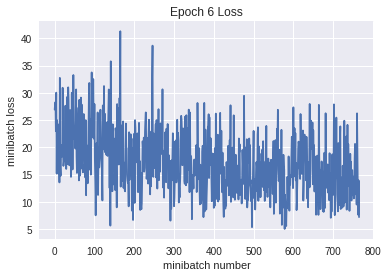

Iteration 4600: with minibatch training loss = 0.287 and accuracy of 0.92
Iteration 4700: with minibatch training loss = 0.118 and accuracy of 0.98
Iteration 4800: with minibatch training loss = 0.211 and accuracy of 0.94
Iteration 4900: with minibatch training loss = 0.24 and accuracy of 0.91
Iteration 5000: with minibatch training loss = 0.152 and accuracy of 0.98
Iteration 5100: with minibatch training loss = 0.125 and accuracy of 0.97
Iteration 5200: with minibatch training loss = 0.145 and accuracy of 0.95
Iteration 5300: with minibatch training loss = 0.11 and accuracy of 0.98
Epoch 7, Overall loss = 0.193 and accuracy of 0.936


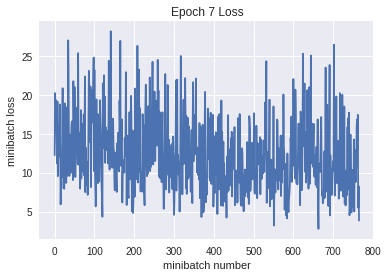

Iteration 5400: with minibatch training loss = 0.11 and accuracy of 0.97
Iteration 5500: with minibatch training loss = 0.0976 and accuracy of 0.97
Iteration 5600: with minibatch training loss = 0.143 and accuracy of 0.94
Iteration 5700: with minibatch training loss = 0.206 and accuracy of 0.92
Iteration 5800: with minibatch training loss = 0.109 and accuracy of 0.94
Iteration 5900: with minibatch training loss = 0.15 and accuracy of 0.97
Iteration 6000: with minibatch training loss = 0.126 and accuracy of 0.97
Iteration 6100: with minibatch training loss = 0.206 and accuracy of 0.91
Epoch 8, Overall loss = 0.156 and accuracy of 0.947


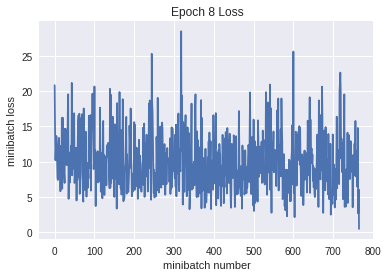

Iteration 6200: with minibatch training loss = 0.2 and accuracy of 0.94
Iteration 6300: with minibatch training loss = 0.166 and accuracy of 0.94
Iteration 6400: with minibatch training loss = 0.153 and accuracy of 0.94
Iteration 6500: with minibatch training loss = 0.133 and accuracy of 0.94
Iteration 6600: with minibatch training loss = 0.105 and accuracy of 0.95
Iteration 6700: with minibatch training loss = 0.148 and accuracy of 0.95
Iteration 6800: with minibatch training loss = 0.102 and accuracy of 0.98
Epoch 9, Overall loss = 0.134 and accuracy of 0.952


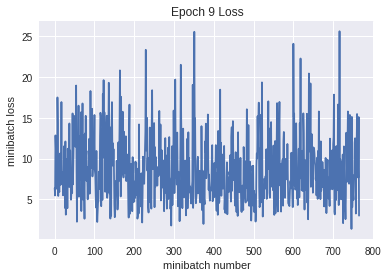

Iteration 6900: with minibatch training loss = 0.115 and accuracy of 0.98
Iteration 7000: with minibatch training loss = 0.0913 and accuracy of 0.97
Iteration 7100: with minibatch training loss = 0.161 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.257 and accuracy of 0.89
Iteration 7300: with minibatch training loss = 0.0384 and accuracy of 1
Iteration 7400: with minibatch training loss = 0.147 and accuracy of 0.95
Iteration 7500: with minibatch training loss = 0.114 and accuracy of 0.95
Iteration 7600: with minibatch training loss = 0.0606 and accuracy of 0.97
Epoch 10, Overall loss = 0.123 and accuracy of 0.957


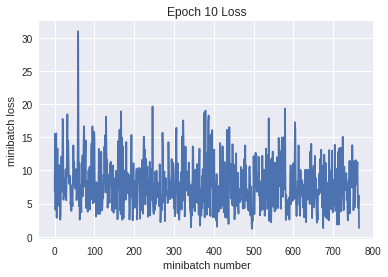

Validation
Epoch 1, Overall loss = 1.8 and accuracy of 0.667


(1.8022485332489013, 0.667)

In [73]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [74]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(9e-4)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.05 and accuracy of 0.19
Iteration 100: with minibatch training loss = 2.06 and accuracy of 0.2
Iteration 200: with minibatch training loss = 1.75 and accuracy of 0.38
Iteration 300: with minibatch training loss = 1.8 and accuracy of 0.41
Iteration 400: with minibatch training loss = 1.53 and accuracy of 0.5
Iteration 500: with minibatch training loss = 1.28 and accuracy of 0.47
Iteration 600: with minibatch training loss = 1.18 and accuracy of 0.61
Iteration 700: with minibatch training loss = 1.15 and accuracy of 0.61
Epoch 1, Overall loss = 1.55 and accuracy of 0.46


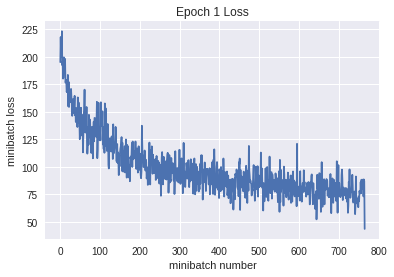

Iteration 800: with minibatch training loss = 1.15 and accuracy of 0.61
Iteration 900: with minibatch training loss = 1.26 and accuracy of 0.64
Iteration 1000: with minibatch training loss = 1.08 and accuracy of 0.62
Iteration 1100: with minibatch training loss = 0.963 and accuracy of 0.59
Iteration 1200: with minibatch training loss = 0.953 and accuracy of 0.69
Iteration 1300: with minibatch training loss = 1.01 and accuracy of 0.67
Iteration 1400: with minibatch training loss = 1.02 and accuracy of 0.61
Iteration 1500: with minibatch training loss = 1.03 and accuracy of 0.69
Epoch 2, Overall loss = 1.03 and accuracy of 0.639


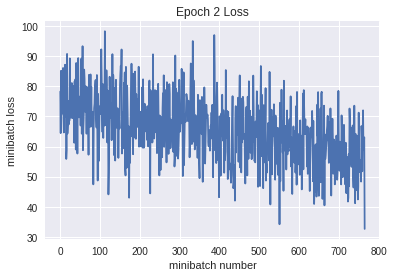

Iteration 1600: with minibatch training loss = 0.781 and accuracy of 0.66
Iteration 1700: with minibatch training loss = 1.03 and accuracy of 0.66
Iteration 1800: with minibatch training loss = 0.981 and accuracy of 0.66
Iteration 1900: with minibatch training loss = 0.927 and accuracy of 0.61
Iteration 2000: with minibatch training loss = 1.02 and accuracy of 0.66
Iteration 2100: with minibatch training loss = 0.657 and accuracy of 0.78
Iteration 2200: with minibatch training loss = 0.751 and accuracy of 0.72
Epoch 3, Overall loss = 0.787 and accuracy of 0.725


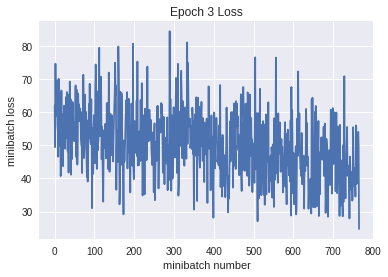

Iteration 2300: with minibatch training loss = 0.771 and accuracy of 0.73
Iteration 2400: with minibatch training loss = 0.856 and accuracy of 0.72
Iteration 2500: with minibatch training loss = 0.717 and accuracy of 0.7
Iteration 2600: with minibatch training loss = 0.773 and accuracy of 0.7
Iteration 2700: with minibatch training loss = 0.45 and accuracy of 0.83
Iteration 2800: with minibatch training loss = 0.523 and accuracy of 0.81
Iteration 2900: with minibatch training loss = 0.546 and accuracy of 0.75
Iteration 3000: with minibatch training loss = 0.448 and accuracy of 0.86
Epoch 4, Overall loss = 0.598 and accuracy of 0.792


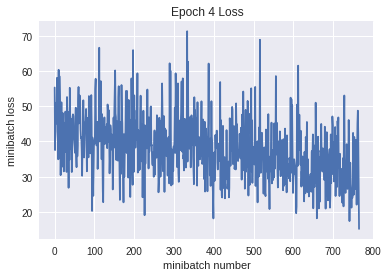

Iteration 3100: with minibatch training loss = 0.43 and accuracy of 0.88
Iteration 3200: with minibatch training loss = 0.57 and accuracy of 0.8
Iteration 3300: with minibatch training loss = 0.258 and accuracy of 0.92
Iteration 3400: with minibatch training loss = 0.543 and accuracy of 0.75
Iteration 3500: with minibatch training loss = 0.396 and accuracy of 0.91
Iteration 3600: with minibatch training loss = 0.396 and accuracy of 0.86
Iteration 3700: with minibatch training loss = 0.394 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.419 and accuracy of 0.89
Epoch 5, Overall loss = 0.44 and accuracy of 0.845


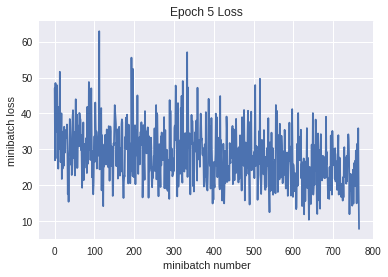

Iteration 3900: with minibatch training loss = 0.284 and accuracy of 0.88
Iteration 4000: with minibatch training loss = 0.496 and accuracy of 0.86
Iteration 4100: with minibatch training loss = 0.367 and accuracy of 0.89
Iteration 4200: with minibatch training loss = 0.337 and accuracy of 0.88
Iteration 4300: with minibatch training loss = 0.142 and accuracy of 0.97
Iteration 4400: with minibatch training loss = 0.473 and accuracy of 0.8
Iteration 4500: with minibatch training loss = 0.34 and accuracy of 0.89
Epoch 6, Overall loss = 0.329 and accuracy of 0.885


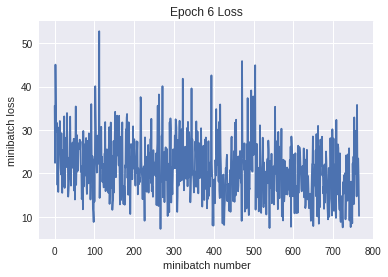

Iteration 4600: with minibatch training loss = 0.549 and accuracy of 0.81
Iteration 4700: with minibatch training loss = 0.171 and accuracy of 0.95
Iteration 4800: with minibatch training loss = 0.312 and accuracy of 0.89
Iteration 4900: with minibatch training loss = 0.42 and accuracy of 0.83
Iteration 5000: with minibatch training loss = 0.236 and accuracy of 0.92
Iteration 5100: with minibatch training loss = 0.434 and accuracy of 0.86
Iteration 5200: with minibatch training loss = 0.14 and accuracy of 0.95
Iteration 5300: with minibatch training loss = 0.242 and accuracy of 0.91
Epoch 7, Overall loss = 0.249 and accuracy of 0.913


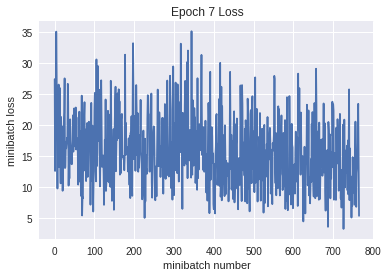

Iteration 5400: with minibatch training loss = 0.157 and accuracy of 0.95
Iteration 5500: with minibatch training loss = 0.176 and accuracy of 0.95
Iteration 5600: with minibatch training loss = 0.326 and accuracy of 0.88
Iteration 5700: with minibatch training loss = 0.341 and accuracy of 0.91
Iteration 5800: with minibatch training loss = 0.141 and accuracy of 0.97
Iteration 5900: with minibatch training loss = 0.148 and accuracy of 0.94
Iteration 6000: with minibatch training loss = 0.136 and accuracy of 0.95
Iteration 6100: with minibatch training loss = 0.096 and accuracy of 0.95
Epoch 8, Overall loss = 0.207 and accuracy of 0.926


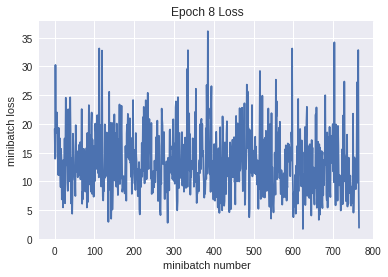

Iteration 6200: with minibatch training loss = 0.246 and accuracy of 0.94
Iteration 6300: with minibatch training loss = 0.147 and accuracy of 0.98
Iteration 6400: with minibatch training loss = 0.22 and accuracy of 0.94
Iteration 6500: with minibatch training loss = 0.323 and accuracy of 0.91
Iteration 6600: with minibatch training loss = 0.146 and accuracy of 0.94
Iteration 6700: with minibatch training loss = 0.149 and accuracy of 0.92
Iteration 6800: with minibatch training loss = 0.13 and accuracy of 0.94
Epoch 9, Overall loss = 0.176 and accuracy of 0.937


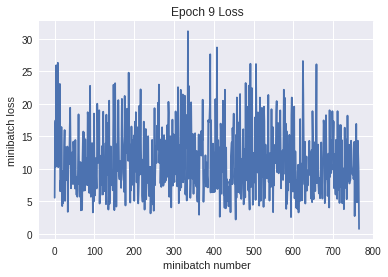

Iteration 6900: with minibatch training loss = 0.309 and accuracy of 0.91
Iteration 7000: with minibatch training loss = 0.082 and accuracy of 0.95
Iteration 7100: with minibatch training loss = 0.167 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.101 and accuracy of 0.95
Iteration 7300: with minibatch training loss = 0.228 and accuracy of 0.91
Iteration 7400: with minibatch training loss = 0.161 and accuracy of 0.92
Iteration 7500: with minibatch training loss = 0.121 and accuracy of 0.98
Iteration 7600: with minibatch training loss = 0.0768 and accuracy of 0.95
Epoch 10, Overall loss = 0.158 and accuracy of 0.943


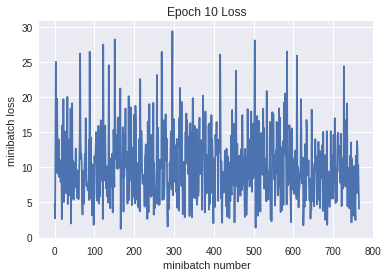

Validation
Epoch 1, Overall loss = 1.81 and accuracy of 0.685


(1.808354437828064, 0.685)

In [75]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [76]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.RMSPropOptimizer(8e-4)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.77 and accuracy of 0.062
Iteration 100: with minibatch training loss = 2.2 and accuracy of 0.33
Iteration 200: with minibatch training loss = 1.54 and accuracy of 0.45
Iteration 300: with minibatch training loss = 1.32 and accuracy of 0.45
Iteration 400: with minibatch training loss = 1.47 and accuracy of 0.45
Iteration 500: with minibatch training loss = 1.3 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.23 and accuracy of 0.59
Iteration 700: with minibatch training loss = 1.1 and accuracy of 0.62
Epoch 1, Overall loss = 1.55 and accuracy of 0.468


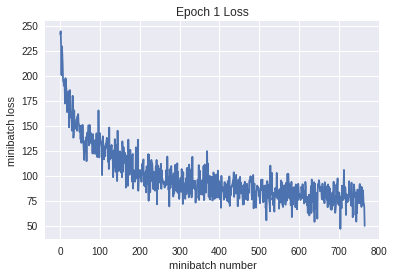

Iteration 800: with minibatch training loss = 1.18 and accuracy of 0.56
Iteration 900: with minibatch training loss = 1.12 and accuracy of 0.58
Iteration 1000: with minibatch training loss = 1.02 and accuracy of 0.66
Iteration 1100: with minibatch training loss = 1.07 and accuracy of 0.61
Iteration 1200: with minibatch training loss = 1.09 and accuracy of 0.69
Iteration 1300: with minibatch training loss = 0.774 and accuracy of 0.67
Iteration 1400: with minibatch training loss = 1.07 and accuracy of 0.62
Iteration 1500: with minibatch training loss = 0.998 and accuracy of 0.61
Epoch 2, Overall loss = 1.03 and accuracy of 0.637


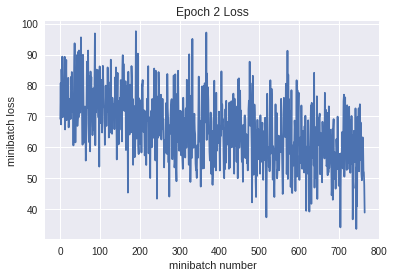

Iteration 1600: with minibatch training loss = 1.18 and accuracy of 0.56
Iteration 1700: with minibatch training loss = 0.791 and accuracy of 0.8
Iteration 1800: with minibatch training loss = 0.694 and accuracy of 0.73
Iteration 1900: with minibatch training loss = 0.783 and accuracy of 0.62
Iteration 2000: with minibatch training loss = 0.727 and accuracy of 0.77
Iteration 2100: with minibatch training loss = 0.781 and accuracy of 0.69
Iteration 2200: with minibatch training loss = 0.908 and accuracy of 0.75
Epoch 3, Overall loss = 0.78 and accuracy of 0.725


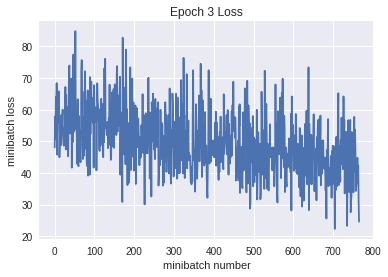

Iteration 2300: with minibatch training loss = 0.585 and accuracy of 0.78
Iteration 2400: with minibatch training loss = 0.585 and accuracy of 0.8
Iteration 2500: with minibatch training loss = 0.557 and accuracy of 0.81
Iteration 2600: with minibatch training loss = 0.577 and accuracy of 0.77
Iteration 2700: with minibatch training loss = 0.542 and accuracy of 0.8
Iteration 2800: with minibatch training loss = 0.443 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 0.577 and accuracy of 0.81
Iteration 3000: with minibatch training loss = 0.592 and accuracy of 0.75
Epoch 4, Overall loss = 0.58 and accuracy of 0.797


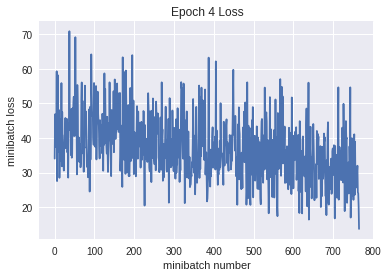

Iteration 3100: with minibatch training loss = 0.52 and accuracy of 0.88
Iteration 3200: with minibatch training loss = 0.648 and accuracy of 0.77
Iteration 3300: with minibatch training loss = 0.429 and accuracy of 0.84
Iteration 3400: with minibatch training loss = 0.458 and accuracy of 0.86
Iteration 3500: with minibatch training loss = 0.351 and accuracy of 0.84
Iteration 3600: with minibatch training loss = 0.242 and accuracy of 0.92
Iteration 3700: with minibatch training loss = 0.409 and accuracy of 0.89
Iteration 3800: with minibatch training loss = 0.279 and accuracy of 0.91
Epoch 5, Overall loss = 0.421 and accuracy of 0.855


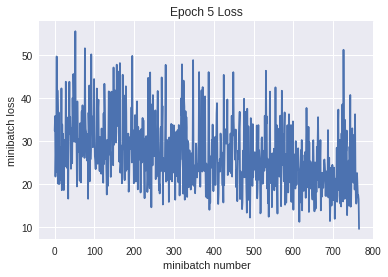

Iteration 3900: with minibatch training loss = 0.608 and accuracy of 0.84
Iteration 4000: with minibatch training loss = 0.281 and accuracy of 0.92
Iteration 4100: with minibatch training loss = 0.402 and accuracy of 0.88
Iteration 4200: with minibatch training loss = 0.317 and accuracy of 0.89
Iteration 4300: with minibatch training loss = 0.219 and accuracy of 0.95
Iteration 4400: with minibatch training loss = 0.285 and accuracy of 0.84
Iteration 4500: with minibatch training loss = 0.229 and accuracy of 0.94
Epoch 6, Overall loss = 0.301 and accuracy of 0.897


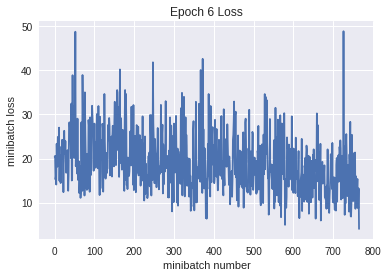

Iteration 4600: with minibatch training loss = 0.299 and accuracy of 0.91
Iteration 4700: with minibatch training loss = 0.371 and accuracy of 0.86
Iteration 4800: with minibatch training loss = 0.215 and accuracy of 0.91
Iteration 4900: with minibatch training loss = 0.247 and accuracy of 0.97
Iteration 5000: with minibatch training loss = 0.087 and accuracy of 0.98
Iteration 5100: with minibatch training loss = 0.234 and accuracy of 0.94
Iteration 5200: with minibatch training loss = 0.221 and accuracy of 0.89
Iteration 5300: with minibatch training loss = 0.0973 and accuracy of 0.94
Epoch 7, Overall loss = 0.232 and accuracy of 0.919


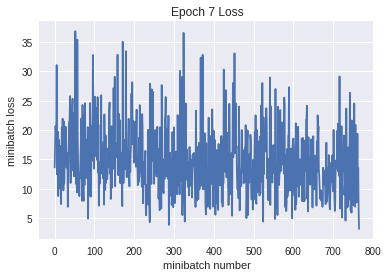

Iteration 5400: with minibatch training loss = 0.314 and accuracy of 0.89
Iteration 5500: with minibatch training loss = 0.423 and accuracy of 0.84
Iteration 5600: with minibatch training loss = 0.107 and accuracy of 0.95
Iteration 5700: with minibatch training loss = 0.207 and accuracy of 0.89
Iteration 5800: with minibatch training loss = 0.283 and accuracy of 0.95
Iteration 5900: with minibatch training loss = 0.171 and accuracy of 0.97
Iteration 6000: with minibatch training loss = 0.201 and accuracy of 0.92
Iteration 6100: with minibatch training loss = 0.205 and accuracy of 0.91
Epoch 8, Overall loss = 0.186 and accuracy of 0.933


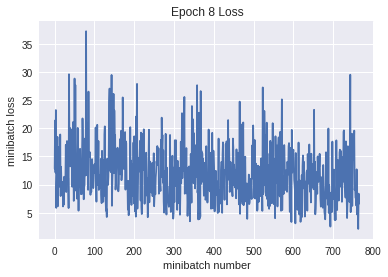

Iteration 6200: with minibatch training loss = 0.0922 and accuracy of 0.97
Iteration 6300: with minibatch training loss = 0.108 and accuracy of 0.94
Iteration 6400: with minibatch training loss = 0.18 and accuracy of 0.95
Iteration 6500: with minibatch training loss = 0.202 and accuracy of 0.95
Iteration 6600: with minibatch training loss = 0.112 and accuracy of 0.95
Iteration 6700: with minibatch training loss = 0.0559 and accuracy of 1
Iteration 6800: with minibatch training loss = 0.2 and accuracy of 0.92
Epoch 9, Overall loss = 0.162 and accuracy of 0.943


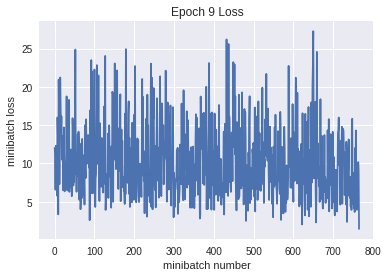

Iteration 6900: with minibatch training loss = 0.106 and accuracy of 0.97
Iteration 7000: with minibatch training loss = 0.0657 and accuracy of 0.98
Iteration 7100: with minibatch training loss = 0.148 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.214 and accuracy of 0.94
Iteration 7300: with minibatch training loss = 0.316 and accuracy of 0.94
Iteration 7400: with minibatch training loss = 0.126 and accuracy of 0.94
Iteration 7500: with minibatch training loss = 0.148 and accuracy of 0.95
Iteration 7600: with minibatch training loss = 0.228 and accuracy of 0.92
Epoch 10, Overall loss = 0.148 and accuracy of 0.948


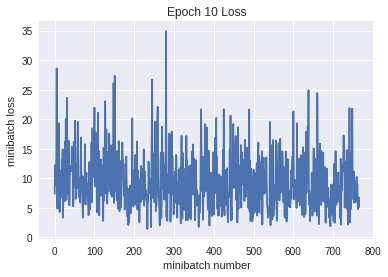

Validation
Epoch 1, Overall loss = 1.67 and accuracy of 0.682


(1.668765308380127, 0.682)

In [77]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [78]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(1e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.46 and accuracy of 0.062
Iteration 100: with minibatch training loss = 1.56 and accuracy of 0.44
Iteration 200: with minibatch training loss = 1.44 and accuracy of 0.53
Iteration 300: with minibatch training loss = 1.09 and accuracy of 0.58
Iteration 400: with minibatch training loss = 1.15 and accuracy of 0.55
Iteration 500: with minibatch training loss = 1.3 and accuracy of 0.48
Iteration 600: with minibatch training loss = 1.25 and accuracy of 0.59
Iteration 700: with minibatch training loss = 1.11 and accuracy of 0.66
Epoch 1, Overall loss = 1.39 and accuracy of 0.509


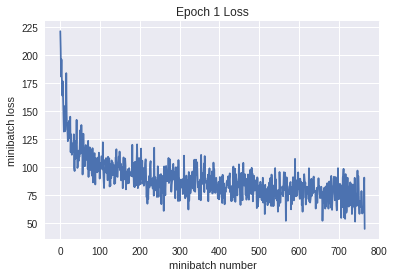

Iteration 800: with minibatch training loss = 1.04 and accuracy of 0.64
Iteration 900: with minibatch training loss = 0.768 and accuracy of 0.77
Iteration 1000: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 1100: with minibatch training loss = 0.963 and accuracy of 0.62
Iteration 1200: with minibatch training loss = 0.804 and accuracy of 0.75
Iteration 1300: with minibatch training loss = 0.778 and accuracy of 0.75
Iteration 1400: with minibatch training loss = 1.12 and accuracy of 0.61
Iteration 1500: with minibatch training loss = 0.72 and accuracy of 0.75
Epoch 2, Overall loss = 0.995 and accuracy of 0.649


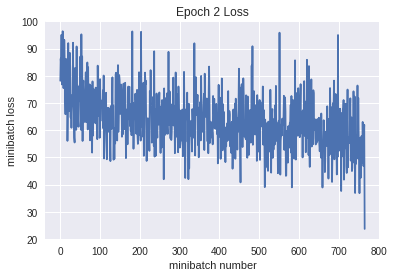

Iteration 1600: with minibatch training loss = 1.05 and accuracy of 0.66
Iteration 1700: with minibatch training loss = 0.876 and accuracy of 0.7
Iteration 1800: with minibatch training loss = 0.911 and accuracy of 0.69
Iteration 1900: with minibatch training loss = 0.823 and accuracy of 0.7
Iteration 2000: with minibatch training loss = 0.784 and accuracy of 0.67
Iteration 2100: with minibatch training loss = 0.549 and accuracy of 0.8
Iteration 2200: with minibatch training loss = 0.662 and accuracy of 0.72
Epoch 3, Overall loss = 0.789 and accuracy of 0.722


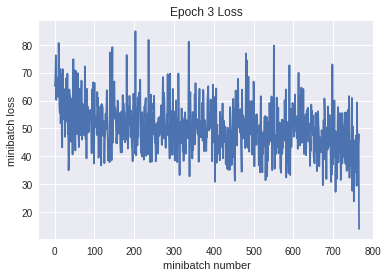

Iteration 2300: with minibatch training loss = 0.831 and accuracy of 0.72
Iteration 2400: with minibatch training loss = 0.722 and accuracy of 0.77
Iteration 2500: with minibatch training loss = 0.452 and accuracy of 0.84
Iteration 2600: with minibatch training loss = 0.417 and accuracy of 0.86
Iteration 2700: with minibatch training loss = 0.691 and accuracy of 0.78
Iteration 2800: with minibatch training loss = 0.461 and accuracy of 0.84
Iteration 2900: with minibatch training loss = 0.484 and accuracy of 0.86
Iteration 3000: with minibatch training loss = 0.601 and accuracy of 0.77
Epoch 4, Overall loss = 0.628 and accuracy of 0.778


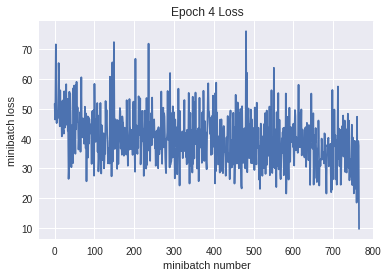

Iteration 3100: with minibatch training loss = 0.36 and accuracy of 0.89
Iteration 3200: with minibatch training loss = 0.44 and accuracy of 0.83
Iteration 3300: with minibatch training loss = 1.02 and accuracy of 0.69
Iteration 3400: with minibatch training loss = 0.51 and accuracy of 0.86
Iteration 3500: with minibatch training loss = 0.321 and accuracy of 0.91
Iteration 3600: with minibatch training loss = 0.283 and accuracy of 0.92
Iteration 3700: with minibatch training loss = 0.418 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.469 and accuracy of 0.83
Epoch 5, Overall loss = 0.486 and accuracy of 0.83


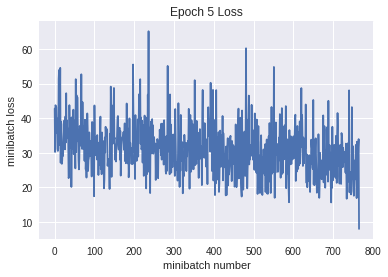

Iteration 3900: with minibatch training loss = 0.522 and accuracy of 0.83
Iteration 4000: with minibatch training loss = 0.384 and accuracy of 0.89
Iteration 4100: with minibatch training loss = 0.364 and accuracy of 0.83
Iteration 4200: with minibatch training loss = 0.314 and accuracy of 0.89
Iteration 4300: with minibatch training loss = 0.245 and accuracy of 0.88
Iteration 4400: with minibatch training loss = 0.296 and accuracy of 0.86
Iteration 4500: with minibatch training loss = 0.348 and accuracy of 0.89
Epoch 6, Overall loss = 0.369 and accuracy of 0.869


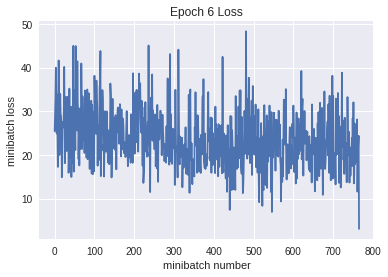

Iteration 4600: with minibatch training loss = 0.379 and accuracy of 0.78
Iteration 4700: with minibatch training loss = 0.276 and accuracy of 0.88
Iteration 4800: with minibatch training loss = 0.281 and accuracy of 0.91
Iteration 4900: with minibatch training loss = 0.358 and accuracy of 0.91
Iteration 5000: with minibatch training loss = 0.272 and accuracy of 0.92
Iteration 5100: with minibatch training loss = 0.398 and accuracy of 0.84
Iteration 5200: with minibatch training loss = 0.235 and accuracy of 0.91
Iteration 5300: with minibatch training loss = 0.287 and accuracy of 0.92
Epoch 7, Overall loss = 0.292 and accuracy of 0.897


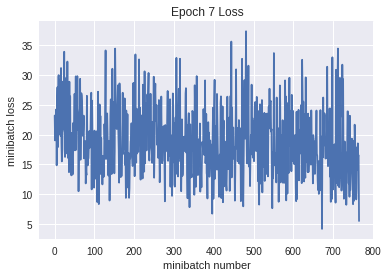

Iteration 5400: with minibatch training loss = 0.204 and accuracy of 0.91
Iteration 5500: with minibatch training loss = 0.216 and accuracy of 0.89
Iteration 5600: with minibatch training loss = 0.223 and accuracy of 0.91
Iteration 5700: with minibatch training loss = 0.319 and accuracy of 0.86
Iteration 5800: with minibatch training loss = 0.212 and accuracy of 0.94
Iteration 5900: with minibatch training loss = 0.249 and accuracy of 0.92
Iteration 6000: with minibatch training loss = 0.175 and accuracy of 0.92
Iteration 6100: with minibatch training loss = 0.146 and accuracy of 0.97
Epoch 8, Overall loss = 0.224 and accuracy of 0.92


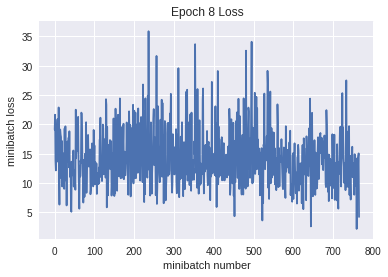

Iteration 6200: with minibatch training loss = 0.19 and accuracy of 0.91
Iteration 6300: with minibatch training loss = 0.0673 and accuracy of 0.97
Iteration 6400: with minibatch training loss = 0.238 and accuracy of 0.91
Iteration 6500: with minibatch training loss = 0.252 and accuracy of 0.89
Iteration 6600: with minibatch training loss = 0.166 and accuracy of 0.95
Iteration 6700: with minibatch training loss = 0.283 and accuracy of 0.89
Iteration 6800: with minibatch training loss = 0.151 and accuracy of 0.95
Epoch 9, Overall loss = 0.188 and accuracy of 0.934


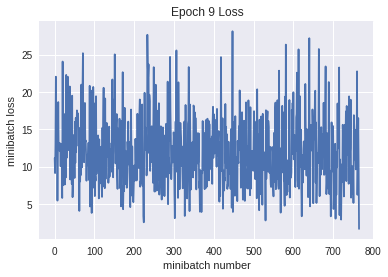

Iteration 6900: with minibatch training loss = 0.136 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.203 and accuracy of 0.94
Iteration 7100: with minibatch training loss = 0.0999 and accuracy of 0.95
Iteration 7200: with minibatch training loss = 0.189 and accuracy of 0.95
Iteration 7300: with minibatch training loss = 0.145 and accuracy of 0.92
Iteration 7400: with minibatch training loss = 0.0941 and accuracy of 0.98
Iteration 7500: with minibatch training loss = 0.243 and accuracy of 0.92
Iteration 7600: with minibatch training loss = 0.0484 and accuracy of 0.97
Epoch 10, Overall loss = 0.153 and accuracy of 0.947


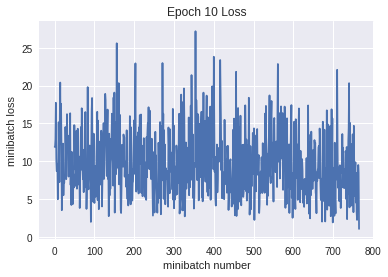

Validation
Epoch 1, Overall loss = 1.48 and accuracy of 0.698


(1.4758985204696655, 0.698)

In [79]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [80]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(5e-4)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.36 and accuracy of 0.2
Iteration 100: with minibatch training loss = 1.83 and accuracy of 0.34
Iteration 200: with minibatch training loss = 1.31 and accuracy of 0.5
Iteration 300: with minibatch training loss = 1.56 and accuracy of 0.41
Iteration 400: with minibatch training loss = 1.53 and accuracy of 0.56
Iteration 500: with minibatch training loss = 1.26 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.11 and accuracy of 0.66
Iteration 700: with minibatch training loss = 1.19 and accuracy of 0.58
Epoch 1, Overall loss = 1.44 and accuracy of 0.491


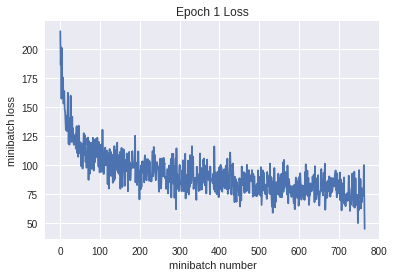

Iteration 800: with minibatch training loss = 1.14 and accuracy of 0.56
Iteration 900: with minibatch training loss = 0.921 and accuracy of 0.7
Iteration 1000: with minibatch training loss = 0.954 and accuracy of 0.75
Iteration 1100: with minibatch training loss = 1.05 and accuracy of 0.66
Iteration 1200: with minibatch training loss = 1.17 and accuracy of 0.53
Iteration 1300: with minibatch training loss = 0.719 and accuracy of 0.75
Iteration 1400: with minibatch training loss = 1.02 and accuracy of 0.66
Iteration 1500: with minibatch training loss = 1.16 and accuracy of 0.62
Epoch 2, Overall loss = 1.03 and accuracy of 0.637


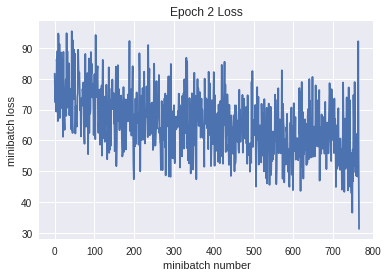

Iteration 1600: with minibatch training loss = 0.854 and accuracy of 0.67
Iteration 1700: with minibatch training loss = 0.869 and accuracy of 0.72
Iteration 1800: with minibatch training loss = 0.612 and accuracy of 0.78
Iteration 1900: with minibatch training loss = 0.847 and accuracy of 0.69
Iteration 2000: with minibatch training loss = 0.743 and accuracy of 0.77
Iteration 2100: with minibatch training loss = 0.634 and accuracy of 0.83
Iteration 2200: with minibatch training loss = 0.725 and accuracy of 0.7
Epoch 3, Overall loss = 0.802 and accuracy of 0.72


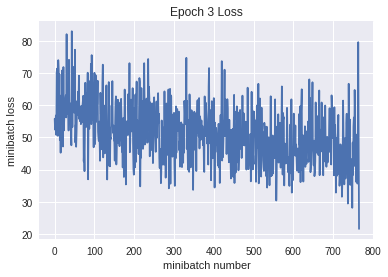

Iteration 2300: with minibatch training loss = 0.594 and accuracy of 0.8
Iteration 2400: with minibatch training loss = 0.637 and accuracy of 0.77
Iteration 2500: with minibatch training loss = 0.522 and accuracy of 0.83
Iteration 2600: with minibatch training loss = 0.485 and accuracy of 0.84
Iteration 2700: with minibatch training loss = 0.41 and accuracy of 0.88
Iteration 2800: with minibatch training loss = 0.652 and accuracy of 0.75
Iteration 2900: with minibatch training loss = 0.599 and accuracy of 0.81
Iteration 3000: with minibatch training loss = 0.478 and accuracy of 0.84
Epoch 4, Overall loss = 0.613 and accuracy of 0.788


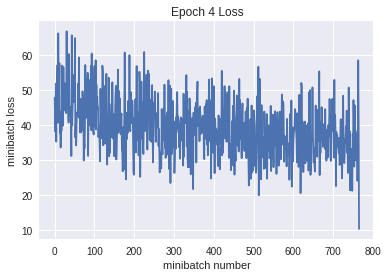

Iteration 3100: with minibatch training loss = 0.795 and accuracy of 0.69
Iteration 3200: with minibatch training loss = 0.604 and accuracy of 0.78
Iteration 3300: with minibatch training loss = 0.581 and accuracy of 0.78
Iteration 3400: with minibatch training loss = 0.477 and accuracy of 0.83
Iteration 3500: with minibatch training loss = 0.484 and accuracy of 0.84
Iteration 3600: with minibatch training loss = 0.324 and accuracy of 0.91
Iteration 3700: with minibatch training loss = 0.443 and accuracy of 0.84
Iteration 3800: with minibatch training loss = 0.393 and accuracy of 0.84
Epoch 5, Overall loss = 0.463 and accuracy of 0.843


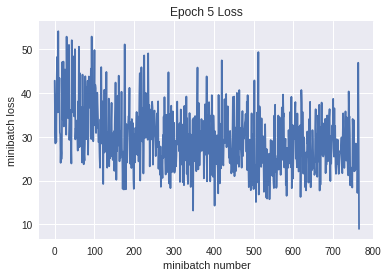

Iteration 3900: with minibatch training loss = 0.565 and accuracy of 0.81
Iteration 4000: with minibatch training loss = 0.301 and accuracy of 0.88
Iteration 4100: with minibatch training loss = 0.231 and accuracy of 0.92
Iteration 4200: with minibatch training loss = 0.364 and accuracy of 0.88
Iteration 4300: with minibatch training loss = 0.229 and accuracy of 0.91
Iteration 4400: with minibatch training loss = 0.374 and accuracy of 0.89
Iteration 4500: with minibatch training loss = 0.39 and accuracy of 0.91
Epoch 6, Overall loss = 0.344 and accuracy of 0.884


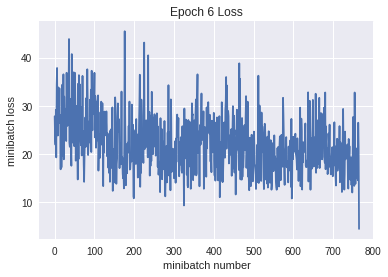

Iteration 4600: with minibatch training loss = 0.229 and accuracy of 0.97
Iteration 4700: with minibatch training loss = 0.312 and accuracy of 0.89
Iteration 4800: with minibatch training loss = 0.285 and accuracy of 0.91
Iteration 4900: with minibatch training loss = 0.155 and accuracy of 0.98
Iteration 5000: with minibatch training loss = 0.261 and accuracy of 0.84
Iteration 5100: with minibatch training loss = 0.26 and accuracy of 0.92
Iteration 5200: with minibatch training loss = 0.241 and accuracy of 0.92
Iteration 5300: with minibatch training loss = 0.21 and accuracy of 0.95
Epoch 7, Overall loss = 0.277 and accuracy of 0.904


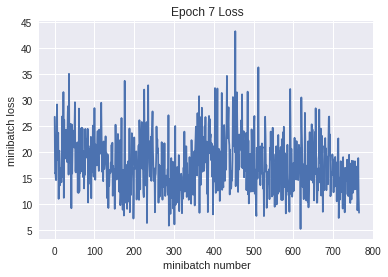

Iteration 5400: with minibatch training loss = 0.209 and accuracy of 0.91
Iteration 5500: with minibatch training loss = 0.159 and accuracy of 0.95
Iteration 5600: with minibatch training loss = 0.216 and accuracy of 0.91
Iteration 5700: with minibatch training loss = 0.323 and accuracy of 0.92
Iteration 5800: with minibatch training loss = 0.151 and accuracy of 0.94
Iteration 5900: with minibatch training loss = 0.357 and accuracy of 0.89
Iteration 6000: with minibatch training loss = 0.0931 and accuracy of 0.95
Iteration 6100: with minibatch training loss = 0.0871 and accuracy of 0.97
Epoch 8, Overall loss = 0.208 and accuracy of 0.93


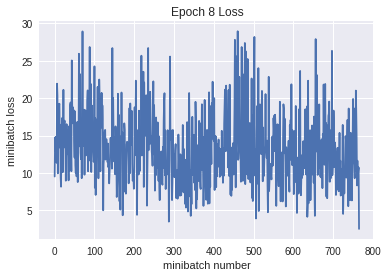

Iteration 6200: with minibatch training loss = 0.259 and accuracy of 0.94
Iteration 6300: with minibatch training loss = 0.155 and accuracy of 0.94
Iteration 6400: with minibatch training loss = 0.121 and accuracy of 0.95
Iteration 6500: with minibatch training loss = 0.0674 and accuracy of 1
Iteration 6600: with minibatch training loss = 0.28 and accuracy of 0.91
Iteration 6700: with minibatch training loss = 0.0534 and accuracy of 1
Iteration 6800: with minibatch training loss = 0.125 and accuracy of 0.97
Epoch 9, Overall loss = 0.163 and accuracy of 0.945


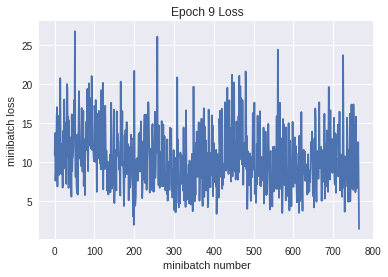

Iteration 6900: with minibatch training loss = 0.215 and accuracy of 0.94
Iteration 7000: with minibatch training loss = 0.14 and accuracy of 0.94
Iteration 7100: with minibatch training loss = 0.0836 and accuracy of 0.98
Iteration 7200: with minibatch training loss = 0.0798 and accuracy of 0.97
Iteration 7300: with minibatch training loss = 0.13 and accuracy of 0.94
Iteration 7400: with minibatch training loss = 0.117 and accuracy of 0.95
Iteration 7500: with minibatch training loss = 0.147 and accuracy of 0.95
Iteration 7600: with minibatch training loss = 0.197 and accuracy of 0.92
Epoch 10, Overall loss = 0.125 and accuracy of 0.958


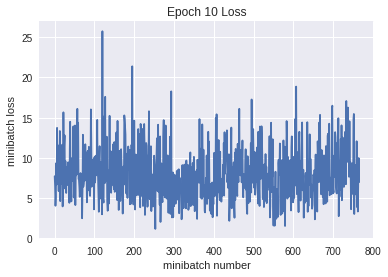

Validation
Epoch 1, Overall loss = 1.68 and accuracy of 0.669


(1.679370279312134, 0.669)

In [81]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [82]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(8e-4)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.58 and accuracy of 0.078
Iteration 100: with minibatch training loss = 1.76 and accuracy of 0.33
Iteration 200: with minibatch training loss = 1.55 and accuracy of 0.44
Iteration 300: with minibatch training loss = 1.46 and accuracy of 0.48
Iteration 400: with minibatch training loss = 1.46 and accuracy of 0.5
Iteration 500: with minibatch training loss = 1.28 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.5 and accuracy of 0.5
Iteration 700: with minibatch training loss = 1.19 and accuracy of 0.59
Epoch 1, Overall loss = 1.43 and accuracy of 0.496


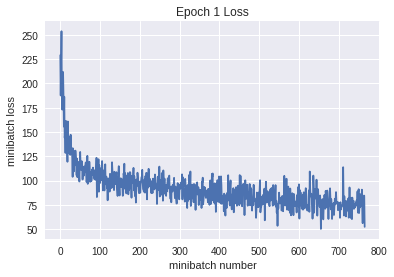

Iteration 800: with minibatch training loss = 0.98 and accuracy of 0.59
Iteration 900: with minibatch training loss = 1.07 and accuracy of 0.58
Iteration 1000: with minibatch training loss = 1.21 and accuracy of 0.58
Iteration 1100: with minibatch training loss = 1.17 and accuracy of 0.5
Iteration 1200: with minibatch training loss = 1.1 and accuracy of 0.59
Iteration 1300: with minibatch training loss = 0.867 and accuracy of 0.72
Iteration 1400: with minibatch training loss = 0.74 and accuracy of 0.7
Iteration 1500: with minibatch training loss = 0.938 and accuracy of 0.7
Epoch 2, Overall loss = 1.02 and accuracy of 0.64


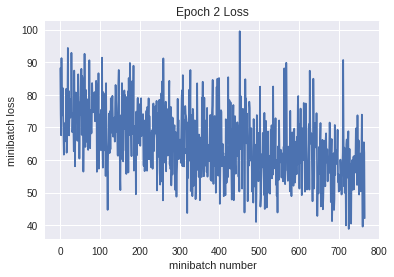

Iteration 1600: with minibatch training loss = 0.959 and accuracy of 0.62
Iteration 1700: with minibatch training loss = 0.914 and accuracy of 0.64
Iteration 1800: with minibatch training loss = 0.743 and accuracy of 0.69
Iteration 1900: with minibatch training loss = 0.769 and accuracy of 0.72
Iteration 2000: with minibatch training loss = 0.781 and accuracy of 0.75
Iteration 2100: with minibatch training loss = 1.11 and accuracy of 0.59
Iteration 2200: with minibatch training loss = 0.725 and accuracy of 0.73
Epoch 3, Overall loss = 0.806 and accuracy of 0.715


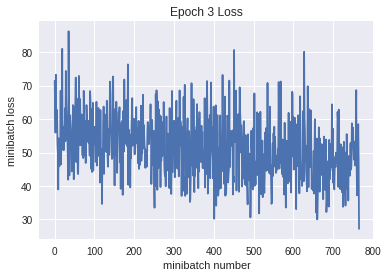

Iteration 2300: with minibatch training loss = 0.692 and accuracy of 0.77
Iteration 2400: with minibatch training loss = 0.796 and accuracy of 0.73
Iteration 2500: with minibatch training loss = 0.735 and accuracy of 0.72
Iteration 2600: with minibatch training loss = 0.557 and accuracy of 0.8
Iteration 2700: with minibatch training loss = 0.529 and accuracy of 0.86
Iteration 2800: with minibatch training loss = 0.76 and accuracy of 0.69
Iteration 2900: with minibatch training loss = 0.756 and accuracy of 0.73
Iteration 3000: with minibatch training loss = 0.586 and accuracy of 0.77
Epoch 4, Overall loss = 0.645 and accuracy of 0.774


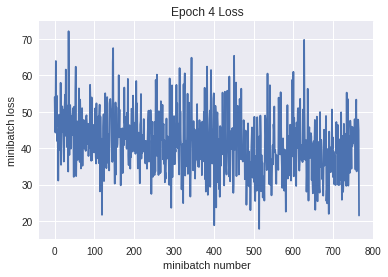

Iteration 3100: with minibatch training loss = 0.733 and accuracy of 0.8
Iteration 3200: with minibatch training loss = 0.515 and accuracy of 0.81
Iteration 3300: with minibatch training loss = 0.682 and accuracy of 0.81
Iteration 3400: with minibatch training loss = 0.489 and accuracy of 0.88
Iteration 3500: with minibatch training loss = 0.355 and accuracy of 0.84
Iteration 3600: with minibatch training loss = 0.52 and accuracy of 0.81
Iteration 3700: with minibatch training loss = 0.591 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.497 and accuracy of 0.89
Epoch 5, Overall loss = 0.497 and accuracy of 0.825


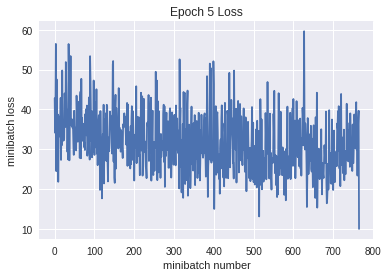

Iteration 3900: with minibatch training loss = 0.275 and accuracy of 0.89
Iteration 4000: with minibatch training loss = 0.457 and accuracy of 0.88
Iteration 4100: with minibatch training loss = 0.284 and accuracy of 0.83
Iteration 4200: with minibatch training loss = 0.274 and accuracy of 0.91
Iteration 4300: with minibatch training loss = 0.276 and accuracy of 0.92
Iteration 4400: with minibatch training loss = 0.325 and accuracy of 0.91
Iteration 4500: with minibatch training loss = 0.401 and accuracy of 0.84
Epoch 6, Overall loss = 0.387 and accuracy of 0.864


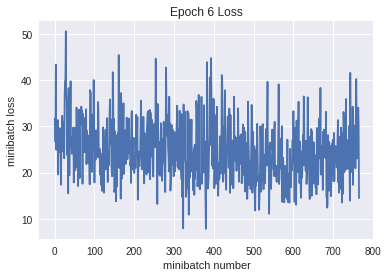

Iteration 4600: with minibatch training loss = 0.329 and accuracy of 0.89
Iteration 4700: with minibatch training loss = 0.389 and accuracy of 0.86
Iteration 4800: with minibatch training loss = 0.282 and accuracy of 0.91
Iteration 4900: with minibatch training loss = 0.21 and accuracy of 0.89
Iteration 5000: with minibatch training loss = 0.28 and accuracy of 0.91
Iteration 5100: with minibatch training loss = 0.124 and accuracy of 0.95
Iteration 5200: with minibatch training loss = 0.257 and accuracy of 0.94
Iteration 5300: with minibatch training loss = 0.214 and accuracy of 0.92
Epoch 7, Overall loss = 0.289 and accuracy of 0.899


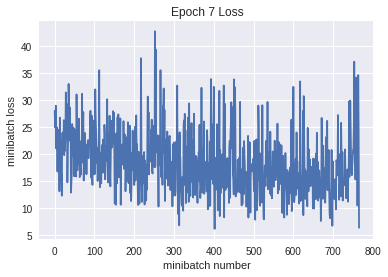

Iteration 5400: with minibatch training loss = 0.26 and accuracy of 0.88
Iteration 5500: with minibatch training loss = 0.216 and accuracy of 0.92
Iteration 5600: with minibatch training loss = 0.306 and accuracy of 0.86
Iteration 5700: with minibatch training loss = 0.237 and accuracy of 0.94
Iteration 5800: with minibatch training loss = 0.156 and accuracy of 0.92
Iteration 5900: with minibatch training loss = 0.188 and accuracy of 0.95
Iteration 6000: with minibatch training loss = 0.172 and accuracy of 0.92
Iteration 6100: with minibatch training loss = 0.157 and accuracy of 0.94
Epoch 8, Overall loss = 0.221 and accuracy of 0.921


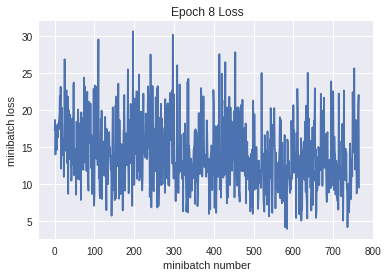

Iteration 6200: with minibatch training loss = 0.282 and accuracy of 0.91
Iteration 6300: with minibatch training loss = 0.253 and accuracy of 0.89
Iteration 6400: with minibatch training loss = 0.173 and accuracy of 0.95
Iteration 6500: with minibatch training loss = 0.0896 and accuracy of 0.97
Iteration 6600: with minibatch training loss = 0.114 and accuracy of 0.97
Iteration 6700: with minibatch training loss = 0.169 and accuracy of 0.91
Iteration 6800: with minibatch training loss = 0.334 and accuracy of 0.84
Epoch 9, Overall loss = 0.182 and accuracy of 0.936


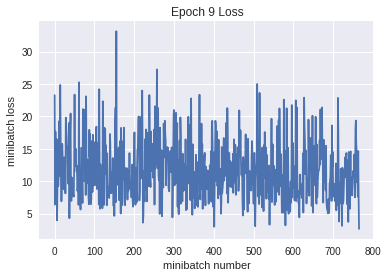

Iteration 6900: with minibatch training loss = 0.285 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.0794 and accuracy of 0.95
Iteration 7100: with minibatch training loss = 0.106 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.25 and accuracy of 0.91
Iteration 7300: with minibatch training loss = 0.0768 and accuracy of 0.97
Iteration 7400: with minibatch training loss = 0.19 and accuracy of 0.92
Iteration 7500: with minibatch training loss = 0.0358 and accuracy of 1
Iteration 7600: with minibatch training loss = 0.103 and accuracy of 0.97
Epoch 10, Overall loss = 0.153 and accuracy of 0.945


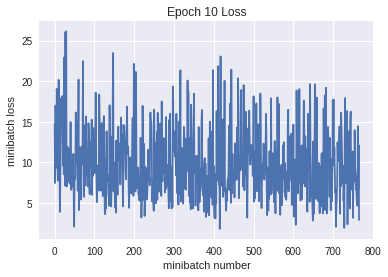

Validation
Epoch 1, Overall loss = 1.47 and accuracy of 0.691


(1.471532753944397, 0.691)

In [83]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [84]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(4e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 2.99 and accuracy of 0.16
Iteration 100: with minibatch training loss = 1.78 and accuracy of 0.41
Iteration 200: with minibatch training loss = 1.58 and accuracy of 0.39
Iteration 300: with minibatch training loss = 1.5 and accuracy of 0.45
Iteration 400: with minibatch training loss = 1.4 and accuracy of 0.45
Iteration 500: with minibatch training loss = 1.39 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.53 and accuracy of 0.45
Iteration 700: with minibatch training loss = 1.42 and accuracy of 0.47
Epoch 1, Overall loss = 1.65 and accuracy of 0.429


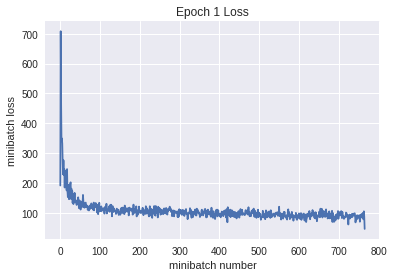

Iteration 800: with minibatch training loss = 1.33 and accuracy of 0.44
Iteration 900: with minibatch training loss = 1.3 and accuracy of 0.53
Iteration 1000: with minibatch training loss = 1.32 and accuracy of 0.56
Iteration 1100: with minibatch training loss = 1.08 and accuracy of 0.64
Iteration 1200: with minibatch training loss = 1.16 and accuracy of 0.56
Iteration 1300: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 1400: with minibatch training loss = 1.26 and accuracy of 0.47
Iteration 1500: with minibatch training loss = 1.15 and accuracy of 0.56
Epoch 2, Overall loss = 1.22 and accuracy of 0.565


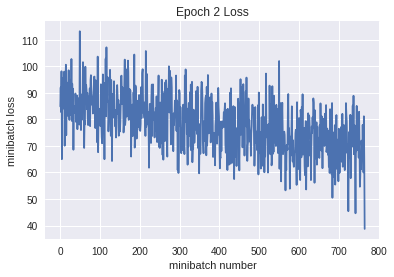

Iteration 1600: with minibatch training loss = 1.04 and accuracy of 0.61
Iteration 1700: with minibatch training loss = 1.08 and accuracy of 0.61
Iteration 1800: with minibatch training loss = 0.956 and accuracy of 0.62
Iteration 1900: with minibatch training loss = 1.18 and accuracy of 0.56
Iteration 2000: with minibatch training loss = 1.16 and accuracy of 0.58
Iteration 2100: with minibatch training loss = 0.771 and accuracy of 0.75
Iteration 2200: with minibatch training loss = 0.991 and accuracy of 0.64
Epoch 3, Overall loss = 0.977 and accuracy of 0.655


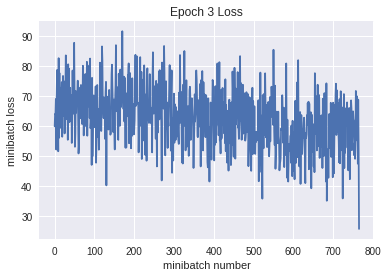

Iteration 2300: with minibatch training loss = 0.909 and accuracy of 0.7
Iteration 2400: with minibatch training loss = 0.856 and accuracy of 0.75
Iteration 2500: with minibatch training loss = 0.764 and accuracy of 0.75
Iteration 2600: with minibatch training loss = 0.847 and accuracy of 0.7
Iteration 2700: with minibatch training loss = 0.792 and accuracy of 0.72
Iteration 2800: with minibatch training loss = 0.906 and accuracy of 0.67
Iteration 2900: with minibatch training loss = 0.643 and accuracy of 0.78
Iteration 3000: with minibatch training loss = 0.563 and accuracy of 0.77
Epoch 4, Overall loss = 0.819 and accuracy of 0.712


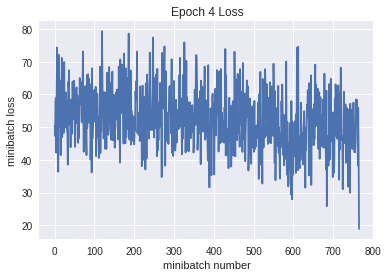

Iteration 3100: with minibatch training loss = 0.838 and accuracy of 0.67
Iteration 3200: with minibatch training loss = 0.709 and accuracy of 0.75
Iteration 3300: with minibatch training loss = 0.723 and accuracy of 0.7
Iteration 3400: with minibatch training loss = 0.555 and accuracy of 0.78
Iteration 3500: with minibatch training loss = 0.602 and accuracy of 0.73
Iteration 3600: with minibatch training loss = 0.609 and accuracy of 0.77
Iteration 3700: with minibatch training loss = 0.783 and accuracy of 0.7
Iteration 3800: with minibatch training loss = 0.62 and accuracy of 0.78
Epoch 5, Overall loss = 0.71 and accuracy of 0.751


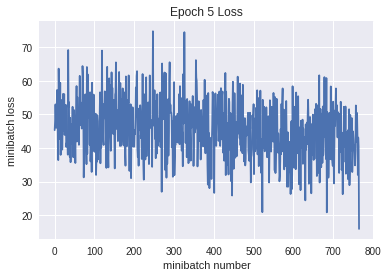

Iteration 3900: with minibatch training loss = 0.727 and accuracy of 0.75
Iteration 4000: with minibatch training loss = 0.642 and accuracy of 0.77
Iteration 4100: with minibatch training loss = 0.737 and accuracy of 0.7
Iteration 4200: with minibatch training loss = 0.562 and accuracy of 0.77
Iteration 4300: with minibatch training loss = 0.619 and accuracy of 0.72
Iteration 4400: with minibatch training loss = 0.591 and accuracy of 0.78
Iteration 4500: with minibatch training loss = 0.348 and accuracy of 0.91
Epoch 6, Overall loss = 0.607 and accuracy of 0.788


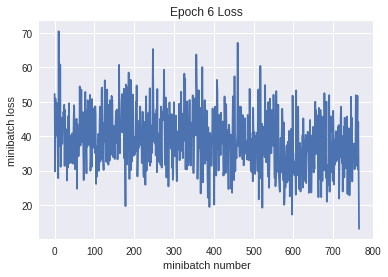

Iteration 4600: with minibatch training loss = 0.475 and accuracy of 0.8
Iteration 4700: with minibatch training loss = 0.277 and accuracy of 0.94
Iteration 4800: with minibatch training loss = 0.624 and accuracy of 0.7
Iteration 4900: with minibatch training loss = 0.542 and accuracy of 0.83
Iteration 5000: with minibatch training loss = 0.431 and accuracy of 0.83
Iteration 5100: with minibatch training loss = 0.356 and accuracy of 0.88
Iteration 5200: with minibatch training loss = 0.389 and accuracy of 0.86
Iteration 5300: with minibatch training loss = 0.574 and accuracy of 0.8
Epoch 7, Overall loss = 0.524 and accuracy of 0.818


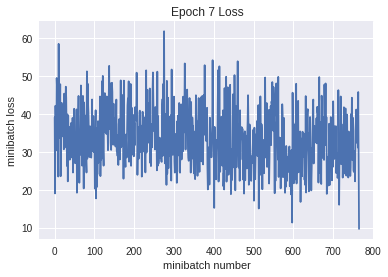

Iteration 5400: with minibatch training loss = 0.303 and accuracy of 0.89
Iteration 5500: with minibatch training loss = 0.546 and accuracy of 0.84
Iteration 5600: with minibatch training loss = 0.564 and accuracy of 0.78
Iteration 5700: with minibatch training loss = 0.385 and accuracy of 0.86
Iteration 5800: with minibatch training loss = 0.536 and accuracy of 0.77
Iteration 5900: with minibatch training loss = 0.484 and accuracy of 0.81
Iteration 6000: with minibatch training loss = 0.391 and accuracy of 0.88
Iteration 6100: with minibatch training loss = 0.347 and accuracy of 0.83
Epoch 8, Overall loss = 0.452 and accuracy of 0.841


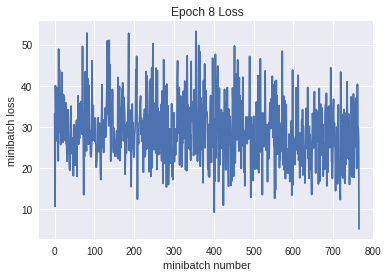

Iteration 6200: with minibatch training loss = 0.358 and accuracy of 0.84
Iteration 6300: with minibatch training loss = 0.624 and accuracy of 0.8
Iteration 6400: with minibatch training loss = 0.24 and accuracy of 0.89
Iteration 6500: with minibatch training loss = 0.481 and accuracy of 0.81
Iteration 6600: with minibatch training loss = 0.327 and accuracy of 0.86
Iteration 6700: with minibatch training loss = 0.312 and accuracy of 0.92
Iteration 6800: with minibatch training loss = 0.433 and accuracy of 0.83
Epoch 9, Overall loss = 0.378 and accuracy of 0.866


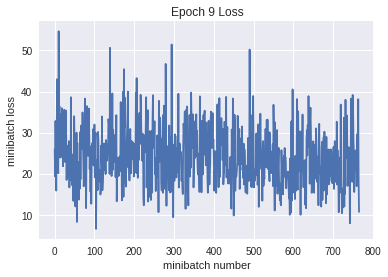

Iteration 6900: with minibatch training loss = 0.411 and accuracy of 0.81
Iteration 7000: with minibatch training loss = 0.222 and accuracy of 0.92
Iteration 7100: with minibatch training loss = 0.33 and accuracy of 0.88
Iteration 7200: with minibatch training loss = 0.163 and accuracy of 0.95
Iteration 7300: with minibatch training loss = 0.396 and accuracy of 0.89
Iteration 7400: with minibatch training loss = 0.38 and accuracy of 0.92
Iteration 7500: with minibatch training loss = 0.181 and accuracy of 0.95
Iteration 7600: with minibatch training loss = 0.291 and accuracy of 0.92
Epoch 10, Overall loss = 0.323 and accuracy of 0.886


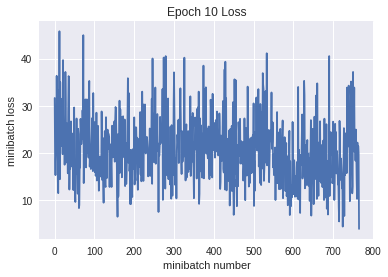

Validation
Epoch 1, Overall loss = 1.26 and accuracy of 0.696


(1.2642928318977356, 0.696)

In [85]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [86]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(6e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.18 and accuracy of 0.17
Iteration 100: with minibatch training loss = 1.7 and accuracy of 0.38
Iteration 200: with minibatch training loss = 1.81 and accuracy of 0.34
Iteration 300: with minibatch training loss = 1.38 and accuracy of 0.47
Iteration 400: with minibatch training loss = 1.69 and accuracy of 0.34
Iteration 500: with minibatch training loss = 1.64 and accuracy of 0.39
Iteration 600: with minibatch training loss = 1.45 and accuracy of 0.41
Iteration 700: with minibatch training loss = 1.47 and accuracy of 0.47
Epoch 1, Overall loss = 1.72 and accuracy of 0.408


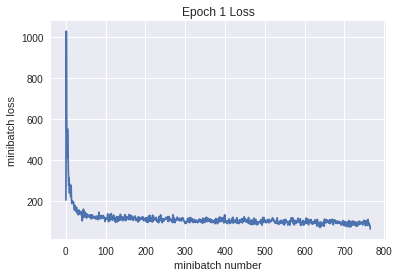

Iteration 800: with minibatch training loss = 1.25 and accuracy of 0.44
Iteration 900: with minibatch training loss = 1.39 and accuracy of 0.5
Iteration 1000: with minibatch training loss = 1.46 and accuracy of 0.52
Iteration 1100: with minibatch training loss = 1.17 and accuracy of 0.66
Iteration 1200: with minibatch training loss = 1.16 and accuracy of 0.58
Iteration 1300: with minibatch training loss = 0.843 and accuracy of 0.72
Iteration 1400: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 1500: with minibatch training loss = 1.03 and accuracy of 0.69
Epoch 2, Overall loss = 1.21 and accuracy of 0.567


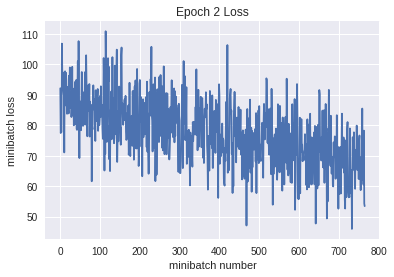

Iteration 1600: with minibatch training loss = 0.733 and accuracy of 0.73
Iteration 1700: with minibatch training loss = 1.02 and accuracy of 0.61
Iteration 1800: with minibatch training loss = 0.939 and accuracy of 0.7
Iteration 1900: with minibatch training loss = 1.06 and accuracy of 0.61
Iteration 2000: with minibatch training loss = 0.622 and accuracy of 0.8
Iteration 2100: with minibatch training loss = 0.804 and accuracy of 0.67
Iteration 2200: with minibatch training loss = 0.905 and accuracy of 0.62
Epoch 3, Overall loss = 0.971 and accuracy of 0.659


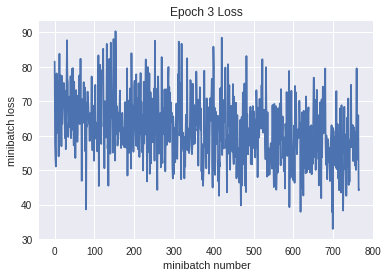

Iteration 2300: with minibatch training loss = 0.76 and accuracy of 0.73
Iteration 2400: with minibatch training loss = 0.954 and accuracy of 0.77
Iteration 2500: with minibatch training loss = 0.955 and accuracy of 0.7
Iteration 2600: with minibatch training loss = 0.763 and accuracy of 0.75
Iteration 2700: with minibatch training loss = 0.933 and accuracy of 0.7
Iteration 2800: with minibatch training loss = 0.771 and accuracy of 0.67
Iteration 2900: with minibatch training loss = 0.912 and accuracy of 0.7
Iteration 3000: with minibatch training loss = 0.828 and accuracy of 0.67
Epoch 4, Overall loss = 0.835 and accuracy of 0.707


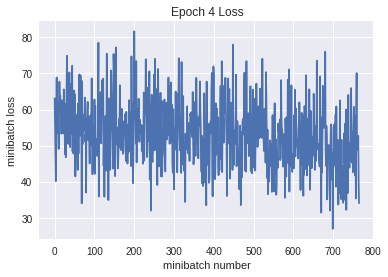

Iteration 3100: with minibatch training loss = 0.726 and accuracy of 0.7
Iteration 3200: with minibatch training loss = 0.895 and accuracy of 0.72
Iteration 3300: with minibatch training loss = 0.825 and accuracy of 0.72
Iteration 3400: with minibatch training loss = 0.68 and accuracy of 0.77
Iteration 3500: with minibatch training loss = 0.873 and accuracy of 0.73
Iteration 3600: with minibatch training loss = 0.502 and accuracy of 0.84
Iteration 3700: with minibatch training loss = 0.747 and accuracy of 0.77
Iteration 3800: with minibatch training loss = 0.773 and accuracy of 0.8
Epoch 5, Overall loss = 0.742 and accuracy of 0.741


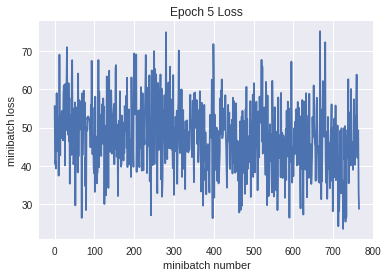

Iteration 3900: with minibatch training loss = 0.477 and accuracy of 0.81
Iteration 4000: with minibatch training loss = 0.677 and accuracy of 0.75
Iteration 4100: with minibatch training loss = 0.466 and accuracy of 0.81
Iteration 4200: with minibatch training loss = 0.811 and accuracy of 0.72
Iteration 4300: with minibatch training loss = 0.796 and accuracy of 0.75
Iteration 4400: with minibatch training loss = 0.537 and accuracy of 0.8
Iteration 4500: with minibatch training loss = 0.407 and accuracy of 0.83
Epoch 6, Overall loss = 0.663 and accuracy of 0.77


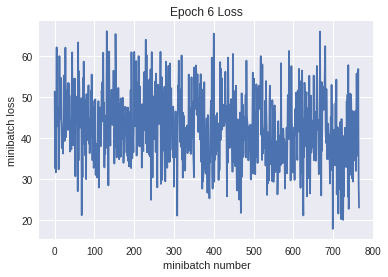

Iteration 4600: with minibatch training loss = 0.722 and accuracy of 0.73
Iteration 4700: with minibatch training loss = 0.609 and accuracy of 0.73
Iteration 4800: with minibatch training loss = 0.762 and accuracy of 0.73
Iteration 4900: with minibatch training loss = 0.659 and accuracy of 0.8
Iteration 5000: with minibatch training loss = 0.644 and accuracy of 0.8
Iteration 5100: with minibatch training loss = 0.523 and accuracy of 0.83
Iteration 5200: with minibatch training loss = 0.6 and accuracy of 0.73
Iteration 5300: with minibatch training loss = 0.489 and accuracy of 0.8
Epoch 7, Overall loss = 0.595 and accuracy of 0.793


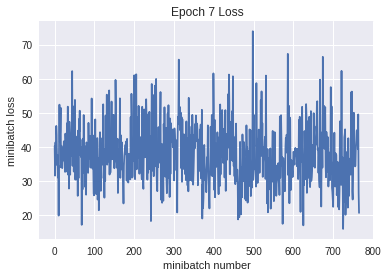

Iteration 5400: with minibatch training loss = 0.447 and accuracy of 0.84
Iteration 5500: with minibatch training loss = 0.523 and accuracy of 0.86
Iteration 5600: with minibatch training loss = 0.545 and accuracy of 0.81
Iteration 5700: with minibatch training loss = 0.528 and accuracy of 0.77
Iteration 5800: with minibatch training loss = 0.535 and accuracy of 0.81
Iteration 5900: with minibatch training loss = 0.518 and accuracy of 0.84
Iteration 6000: with minibatch training loss = 0.492 and accuracy of 0.88
Iteration 6100: with minibatch training loss = 0.599 and accuracy of 0.81
Epoch 8, Overall loss = 0.536 and accuracy of 0.813


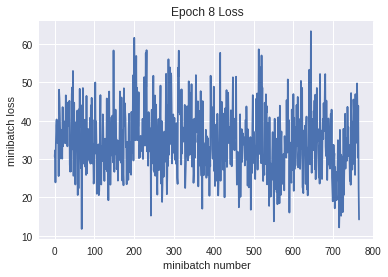

Iteration 6200: with minibatch training loss = 0.521 and accuracy of 0.8
Iteration 6300: with minibatch training loss = 0.405 and accuracy of 0.83
Iteration 6400: with minibatch training loss = 0.546 and accuracy of 0.81
Iteration 6500: with minibatch training loss = 0.447 and accuracy of 0.81
Iteration 6600: with minibatch training loss = 0.305 and accuracy of 0.89
Iteration 6700: with minibatch training loss = 0.499 and accuracy of 0.78
Iteration 6800: with minibatch training loss = 0.401 and accuracy of 0.86
Epoch 9, Overall loss = 0.483 and accuracy of 0.832


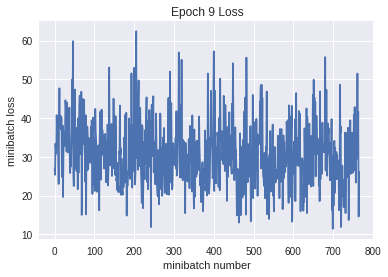

Iteration 6900: with minibatch training loss = 0.613 and accuracy of 0.81
Iteration 7000: with minibatch training loss = 0.349 and accuracy of 0.89
Iteration 7100: with minibatch training loss = 0.486 and accuracy of 0.8
Iteration 7200: with minibatch training loss = 0.475 and accuracy of 0.8
Iteration 7300: with minibatch training loss = 0.59 and accuracy of 0.81
Iteration 7400: with minibatch training loss = 0.469 and accuracy of 0.86
Iteration 7500: with minibatch training loss = 0.626 and accuracy of 0.78
Iteration 7600: with minibatch training loss = 0.265 and accuracy of 0.89
Epoch 10, Overall loss = 0.433 and accuracy of 0.85


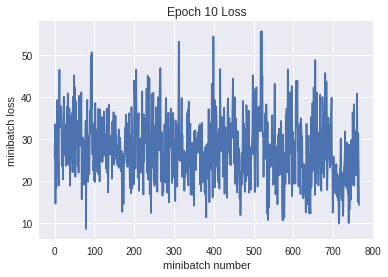

Validation
Epoch 1, Overall loss = 1.27 and accuracy of 0.694


(1.268807556629181, 0.694)

In [87]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [88]:
# my_model18 with different learning rate
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model18(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(5e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 2.81 and accuracy of 0.12
Iteration 100: with minibatch training loss = 1.93 and accuracy of 0.3
Iteration 200: with minibatch training loss = 1.65 and accuracy of 0.39
Iteration 300: with minibatch training loss = 1.7 and accuracy of 0.31
Iteration 400: with minibatch training loss = 1.36 and accuracy of 0.41
Iteration 500: with minibatch training loss = 1.6 and accuracy of 0.33
Iteration 600: with minibatch training loss = 1.55 and accuracy of 0.45
Iteration 700: with minibatch training loss = 1.32 and accuracy of 0.56
Epoch 1, Overall loss = 1.7 and accuracy of 0.415


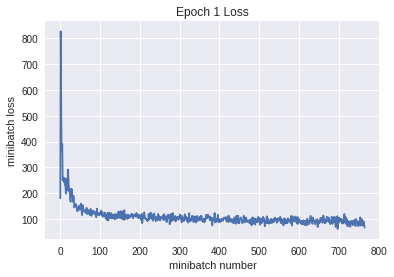

Iteration 800: with minibatch training loss = 1.14 and accuracy of 0.62
Iteration 900: with minibatch training loss = 1.34 and accuracy of 0.59
Iteration 1000: with minibatch training loss = 1.37 and accuracy of 0.47
Iteration 1100: with minibatch training loss = 1.18 and accuracy of 0.55
Iteration 1200: with minibatch training loss = 1.17 and accuracy of 0.64
Iteration 1300: with minibatch training loss = 1.01 and accuracy of 0.69
Iteration 1400: with minibatch training loss = 1.24 and accuracy of 0.48
Iteration 1500: with minibatch training loss = 1.04 and accuracy of 0.64
Epoch 2, Overall loss = 1.21 and accuracy of 0.571


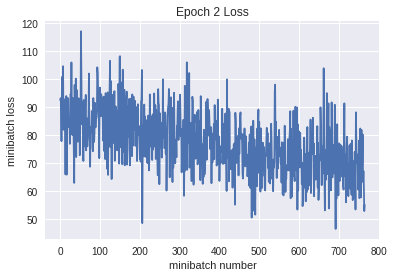

Iteration 1600: with minibatch training loss = 0.913 and accuracy of 0.64
Iteration 1700: with minibatch training loss = 1.02 and accuracy of 0.75
Iteration 1800: with minibatch training loss = 0.794 and accuracy of 0.73
Iteration 1900: with minibatch training loss = 0.984 and accuracy of 0.66
Iteration 2000: with minibatch training loss = 0.938 and accuracy of 0.72
Iteration 2100: with minibatch training loss = 0.901 and accuracy of 0.7
Iteration 2200: with minibatch training loss = 0.83 and accuracy of 0.72
Epoch 3, Overall loss = 0.982 and accuracy of 0.656


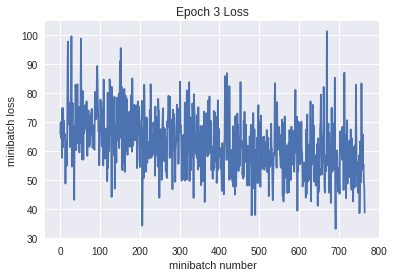

Iteration 2300: with minibatch training loss = 0.845 and accuracy of 0.72
Iteration 2400: with minibatch training loss = 0.938 and accuracy of 0.66
Iteration 2500: with minibatch training loss = 0.857 and accuracy of 0.72
Iteration 2600: with minibatch training loss = 0.701 and accuracy of 0.78
Iteration 2700: with minibatch training loss = 1.1 and accuracy of 0.67
Iteration 2800: with minibatch training loss = 0.705 and accuracy of 0.73
Iteration 2900: with minibatch training loss = 0.893 and accuracy of 0.75
Iteration 3000: with minibatch training loss = 0.616 and accuracy of 0.75
Epoch 4, Overall loss = 0.838 and accuracy of 0.706


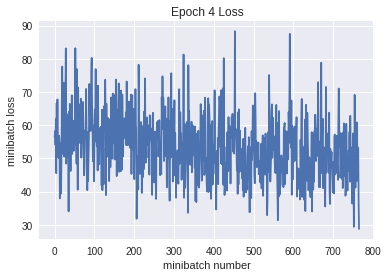

Iteration 3100: with minibatch training loss = 0.78 and accuracy of 0.72
Iteration 3200: with minibatch training loss = 0.929 and accuracy of 0.72
Iteration 3300: with minibatch training loss = 0.681 and accuracy of 0.77
Iteration 3400: with minibatch training loss = 1.07 and accuracy of 0.66
Iteration 3500: with minibatch training loss = 0.759 and accuracy of 0.77
Iteration 3600: with minibatch training loss = 0.757 and accuracy of 0.75
Iteration 3700: with minibatch training loss = 0.633 and accuracy of 0.78
Iteration 3800: with minibatch training loss = 0.47 and accuracy of 0.83
Epoch 5, Overall loss = 0.731 and accuracy of 0.745


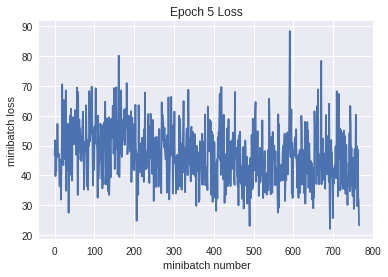

Iteration 3900: with minibatch training loss = 0.728 and accuracy of 0.77
Iteration 4000: with minibatch training loss = 0.827 and accuracy of 0.66
Iteration 4100: with minibatch training loss = 0.567 and accuracy of 0.78
Iteration 4200: with minibatch training loss = 0.529 and accuracy of 0.83
Iteration 4300: with minibatch training loss = 0.534 and accuracy of 0.78
Iteration 4400: with minibatch training loss = 0.411 and accuracy of 0.84
Iteration 4500: with minibatch training loss = 1.1 and accuracy of 0.67
Epoch 6, Overall loss = 0.644 and accuracy of 0.775


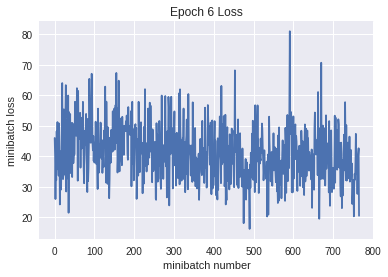

Iteration 4600: with minibatch training loss = 0.387 and accuracy of 0.88
Iteration 4700: with minibatch training loss = 0.657 and accuracy of 0.78
Iteration 4800: with minibatch training loss = 0.626 and accuracy of 0.83
Iteration 4900: with minibatch training loss = 0.664 and accuracy of 0.73
Iteration 5000: with minibatch training loss = 0.482 and accuracy of 0.8
Iteration 5100: with minibatch training loss = 0.723 and accuracy of 0.75
Iteration 5200: with minibatch training loss = 0.77 and accuracy of 0.72
Iteration 5300: with minibatch training loss = 0.674 and accuracy of 0.77
Epoch 7, Overall loss = 0.566 and accuracy of 0.802


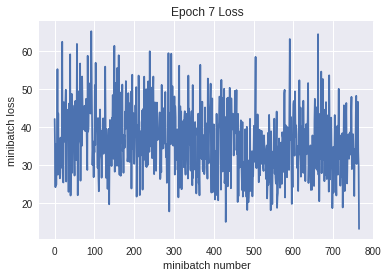

Iteration 5400: with minibatch training loss = 0.499 and accuracy of 0.81
Iteration 5500: with minibatch training loss = 0.352 and accuracy of 0.88
Iteration 5600: with minibatch training loss = 0.463 and accuracy of 0.86
Iteration 5700: with minibatch training loss = 0.491 and accuracy of 0.78
Iteration 5800: with minibatch training loss = 0.461 and accuracy of 0.81
Iteration 5900: with minibatch training loss = 0.448 and accuracy of 0.81
Iteration 6000: with minibatch training loss = 0.543 and accuracy of 0.83
Iteration 6100: with minibatch training loss = 0.441 and accuracy of 0.83
Epoch 8, Overall loss = 0.503 and accuracy of 0.823


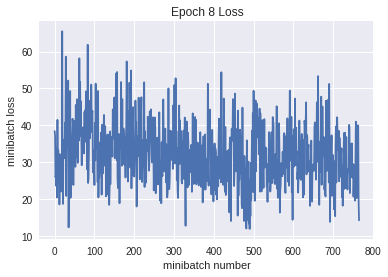

Iteration 6200: with minibatch training loss = 0.473 and accuracy of 0.83
Iteration 6300: with minibatch training loss = 0.468 and accuracy of 0.8
Iteration 6400: with minibatch training loss = 0.493 and accuracy of 0.78
Iteration 6500: with minibatch training loss = 0.27 and accuracy of 0.89
Iteration 6600: with minibatch training loss = 0.429 and accuracy of 0.84
Iteration 6700: with minibatch training loss = 0.349 and accuracy of 0.86
Iteration 6800: with minibatch training loss = 0.299 and accuracy of 0.89
Epoch 9, Overall loss = 0.437 and accuracy of 0.847


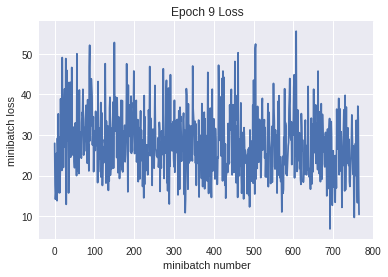

Iteration 6900: with minibatch training loss = 0.399 and accuracy of 0.88
Iteration 7000: with minibatch training loss = 0.471 and accuracy of 0.75
Iteration 7100: with minibatch training loss = 0.17 and accuracy of 0.97
Iteration 7200: with minibatch training loss = 0.252 and accuracy of 0.91
Iteration 7300: with minibatch training loss = 0.309 and accuracy of 0.89
Iteration 7400: with minibatch training loss = 0.248 and accuracy of 0.91
Iteration 7500: with minibatch training loss = 0.321 and accuracy of 0.89
Iteration 7600: with minibatch training loss = 0.233 and accuracy of 0.89
Epoch 10, Overall loss = 0.385 and accuracy of 0.866


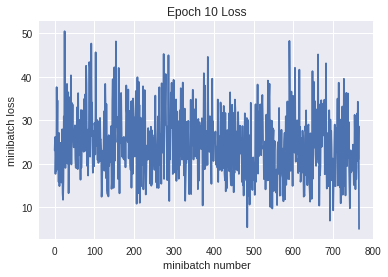

Iteration 7700: with minibatch training loss = 0.319 and accuracy of 0.91
Iteration 7800: with minibatch training loss = 0.32 and accuracy of 0.88
Iteration 7900: with minibatch training loss = 0.334 and accuracy of 0.88
Iteration 8000: with minibatch training loss = 0.376 and accuracy of 0.89
Iteration 8100: with minibatch training loss = 0.425 and accuracy of 0.81
Iteration 8200: with minibatch training loss = 0.516 and accuracy of 0.81
Iteration 8300: with minibatch training loss = 0.291 and accuracy of 0.92
Iteration 8400: with minibatch training loss = 0.262 and accuracy of 0.91
Epoch 11, Overall loss = 0.345 and accuracy of 0.88


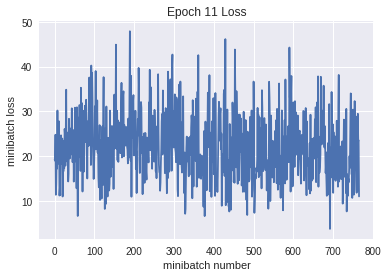

Iteration 8500: with minibatch training loss = 0.286 and accuracy of 0.91
Iteration 8600: with minibatch training loss = 0.53 and accuracy of 0.84
Iteration 8700: with minibatch training loss = 0.287 and accuracy of 0.91
Iteration 8800: with minibatch training loss = 0.0715 and accuracy of 0.98
Iteration 8900: with minibatch training loss = 0.196 and accuracy of 0.89
Iteration 9000: with minibatch training loss = 0.15 and accuracy of 0.94
Iteration 9100: with minibatch training loss = 0.346 and accuracy of 0.86
Epoch 12, Overall loss = 0.302 and accuracy of 0.896


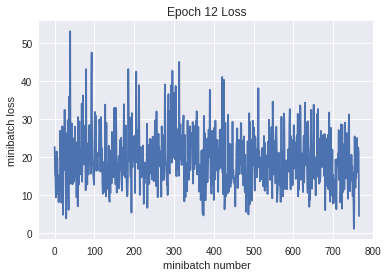

Iteration 9200: with minibatch training loss = 0.177 and accuracy of 0.92
Iteration 9300: with minibatch training loss = 0.159 and accuracy of 0.95
Iteration 9400: with minibatch training loss = 0.212 and accuracy of 0.94
Iteration 9500: with minibatch training loss = 0.37 and accuracy of 0.84
Iteration 9600: with minibatch training loss = 0.137 and accuracy of 0.97
Iteration 9700: with minibatch training loss = 0.256 and accuracy of 0.88
Iteration 9800: with minibatch training loss = 0.259 and accuracy of 0.94
Iteration 9900: with minibatch training loss = 0.288 and accuracy of 0.88
Epoch 13, Overall loss = 0.281 and accuracy of 0.904


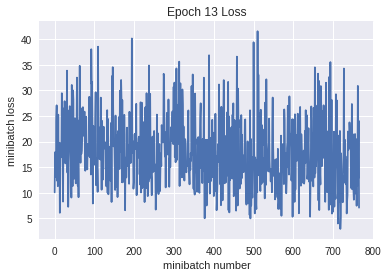

Iteration 10000: with minibatch training loss = 0.221 and accuracy of 0.94
Iteration 10100: with minibatch training loss = 0.394 and accuracy of 0.88
Iteration 10200: with minibatch training loss = 0.39 and accuracy of 0.86
Iteration 10300: with minibatch training loss = 0.0986 and accuracy of 0.95
Iteration 10400: with minibatch training loss = 0.19 and accuracy of 0.92
Iteration 10500: with minibatch training loss = 0.0604 and accuracy of 0.97
Iteration 10600: with minibatch training loss = 0.113 and accuracy of 0.95
Iteration 10700: with minibatch training loss = 0.0944 and accuracy of 0.97
Epoch 14, Overall loss = 0.259 and accuracy of 0.912


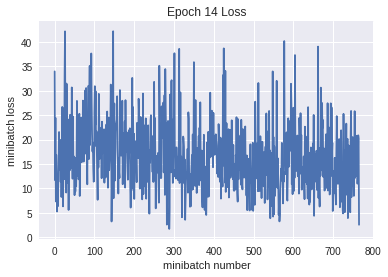

Iteration 10800: with minibatch training loss = 0.468 and accuracy of 0.83
Iteration 10900: with minibatch training loss = 0.223 and accuracy of 0.91
Iteration 11000: with minibatch training loss = 0.32 and accuracy of 0.89
Iteration 11100: with minibatch training loss = 0.209 and accuracy of 0.94
Iteration 11200: with minibatch training loss = 0.133 and accuracy of 0.94
Iteration 11300: with minibatch training loss = 0.205 and accuracy of 0.94
Iteration 11400: with minibatch training loss = 0.186 and accuracy of 0.94
Epoch 15, Overall loss = 0.232 and accuracy of 0.921


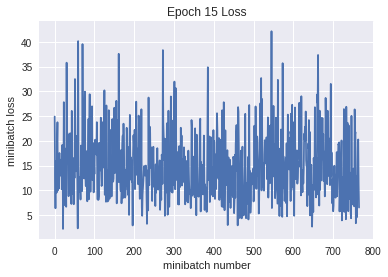

Iteration 11500: with minibatch training loss = 0.0871 and accuracy of 0.95
Iteration 11600: with minibatch training loss = 0.135 and accuracy of 0.95
Iteration 11700: with minibatch training loss = 0.372 and accuracy of 0.89
Iteration 11800: with minibatch training loss = 0.191 and accuracy of 0.91
Iteration 11900: with minibatch training loss = 0.253 and accuracy of 0.92
Iteration 12000: with minibatch training loss = 0.124 and accuracy of 0.97
Iteration 12100: with minibatch training loss = 0.143 and accuracy of 0.94
Iteration 12200: with minibatch training loss = 0.237 and accuracy of 0.95
Epoch 16, Overall loss = 0.22 and accuracy of 0.925


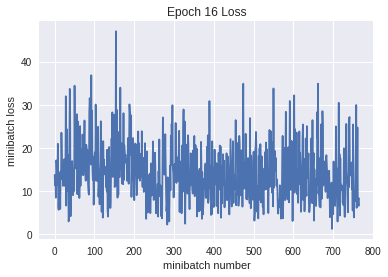

Iteration 12300: with minibatch training loss = 0.0537 and accuracy of 0.98
Iteration 12400: with minibatch training loss = 0.536 and accuracy of 0.88
Iteration 12500: with minibatch training loss = 0.088 and accuracy of 0.98
Iteration 12600: with minibatch training loss = 0.281 and accuracy of 0.91
Iteration 12700: with minibatch training loss = 0.183 and accuracy of 0.95
Iteration 12800: with minibatch training loss = 0.201 and accuracy of 0.92
Iteration 12900: with minibatch training loss = 0.184 and accuracy of 0.94
Iteration 13000: with minibatch training loss = 0.186 and accuracy of 0.91
Epoch 17, Overall loss = 0.199 and accuracy of 0.934


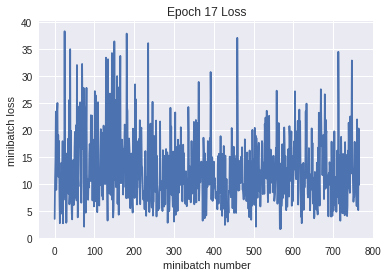

Iteration 13100: with minibatch training loss = 0.268 and accuracy of 0.94
Iteration 13200: with minibatch training loss = 0.127 and accuracy of 0.94
Iteration 13300: with minibatch training loss = 0.0771 and accuracy of 0.98
Iteration 13400: with minibatch training loss = 0.0978 and accuracy of 0.98
Iteration 13500: with minibatch training loss = 0.179 and accuracy of 0.94
Iteration 13600: with minibatch training loss = 0.427 and accuracy of 0.89
Iteration 13700: with minibatch training loss = 0.143 and accuracy of 0.97
Epoch 18, Overall loss = 0.184 and accuracy of 0.939


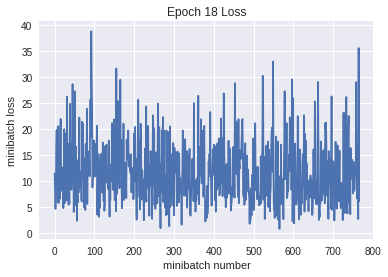

Iteration 13800: with minibatch training loss = 0.272 and accuracy of 0.89
Iteration 13900: with minibatch training loss = 0.148 and accuracy of 0.97
Iteration 14000: with minibatch training loss = 0.127 and accuracy of 0.95
Iteration 14100: with minibatch training loss = 0.239 and accuracy of 0.91
Iteration 14200: with minibatch training loss = 0.183 and accuracy of 0.95
Iteration 14300: with minibatch training loss = 0.353 and accuracy of 0.92
Iteration 14400: with minibatch training loss = 0.158 and accuracy of 0.91
Iteration 14500: with minibatch training loss = 0.173 and accuracy of 0.92
Epoch 19, Overall loss = 0.176 and accuracy of 0.942


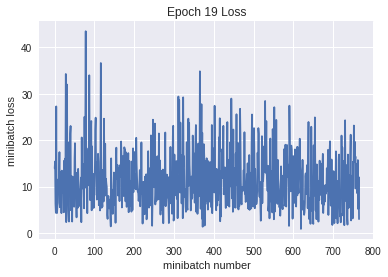

Iteration 14600: with minibatch training loss = 0.353 and accuracy of 0.91
Iteration 14700: with minibatch training loss = 0.139 and accuracy of 0.92
Iteration 14800: with minibatch training loss = 0.226 and accuracy of 0.97
Iteration 14900: with minibatch training loss = 0.0212 and accuracy of 1
Iteration 15000: with minibatch training loss = 0.102 and accuracy of 0.95
Iteration 15100: with minibatch training loss = 0.154 and accuracy of 0.95
Iteration 15200: with minibatch training loss = 0.118 and accuracy of 0.97
Iteration 15300: with minibatch training loss = 0.0433 and accuracy of 1
Epoch 20, Overall loss = 0.166 and accuracy of 0.946


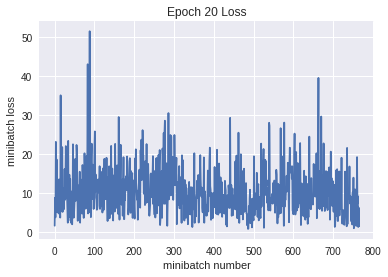

Iteration 15400: with minibatch training loss = 0.0607 and accuracy of 1
Iteration 15500: with minibatch training loss = 0.175 and accuracy of 0.95
Iteration 15600: with minibatch training loss = 0.0925 and accuracy of 0.95
Iteration 15700: with minibatch training loss = 0.105 and accuracy of 0.97
Iteration 15800: with minibatch training loss = 0.0869 and accuracy of 0.97
Iteration 15900: with minibatch training loss = 0.533 and accuracy of 0.88
Iteration 16000: with minibatch training loss = 0.105 and accuracy of 0.95
Epoch 21, Overall loss = 0.172 and accuracy of 0.945


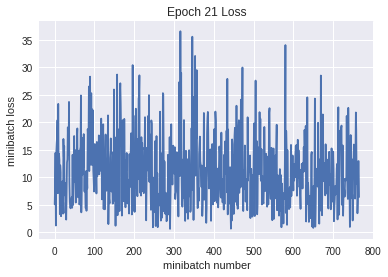

Iteration 16100: with minibatch training loss = 0.0926 and accuracy of 0.98
Iteration 16200: with minibatch training loss = 0.08 and accuracy of 0.97
Iteration 16300: with minibatch training loss = 0.111 and accuracy of 0.97
Iteration 16400: with minibatch training loss = 0.12 and accuracy of 0.95
Iteration 16500: with minibatch training loss = 0.216 and accuracy of 0.92
Iteration 16600: with minibatch training loss = 0.0915 and accuracy of 0.98
Iteration 16700: with minibatch training loss = 0.119 and accuracy of 0.97
Iteration 16800: with minibatch training loss = 0.208 and accuracy of 0.95
Epoch 22, Overall loss = 0.161 and accuracy of 0.948


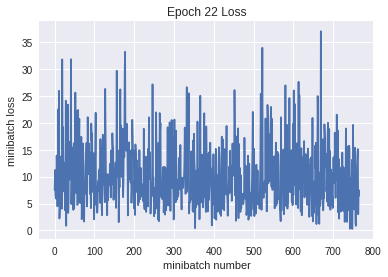

Iteration 16900: with minibatch training loss = 0.0764 and accuracy of 0.97
Iteration 17000: with minibatch training loss = 0.157 and accuracy of 0.95
Iteration 17100: with minibatch training loss = 0.0899 and accuracy of 0.95
Iteration 17200: with minibatch training loss = 0.108 and accuracy of 0.97
Iteration 17300: with minibatch training loss = 0.243 and accuracy of 0.92
Iteration 17400: with minibatch training loss = 0.233 and accuracy of 0.91
Iteration 17500: with minibatch training loss = 0.189 and accuracy of 0.95
Iteration 17600: with minibatch training loss = 0.0416 and accuracy of 1
Epoch 23, Overall loss = 0.161 and accuracy of 0.949


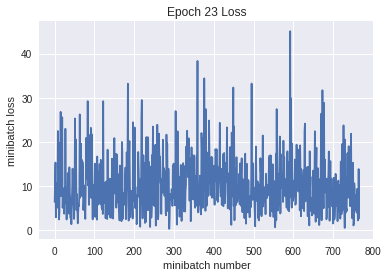

Iteration 17700: with minibatch training loss = 0.158 and accuracy of 0.95
Iteration 17800: with minibatch training loss = 0.142 and accuracy of 0.91
Iteration 17900: with minibatch training loss = 0.125 and accuracy of 0.94
Iteration 18000: with minibatch training loss = 0.0142 and accuracy of 1
Iteration 18100: with minibatch training loss = 0.136 and accuracy of 0.94
Iteration 18200: with minibatch training loss = 0.0756 and accuracy of 0.98
Iteration 18300: with minibatch training loss = 0.168 and accuracy of 0.97
Epoch 24, Overall loss = 0.146 and accuracy of 0.954


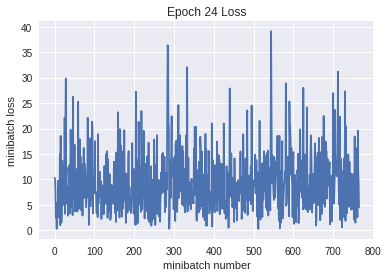

Iteration 18400: with minibatch training loss = 0.0497 and accuracy of 0.98
Iteration 18500: with minibatch training loss = 0.188 and accuracy of 0.91
Iteration 18600: with minibatch training loss = 0.152 and accuracy of 0.94
Iteration 18700: with minibatch training loss = 0.172 and accuracy of 0.94
Iteration 18800: with minibatch training loss = 0.156 and accuracy of 0.95
Iteration 18900: with minibatch training loss = 0.0508 and accuracy of 0.98
Iteration 19000: with minibatch training loss = 0.113 and accuracy of 0.95
Iteration 19100: with minibatch training loss = 0.223 and accuracy of 0.94
Epoch 25, Overall loss = 0.135 and accuracy of 0.958


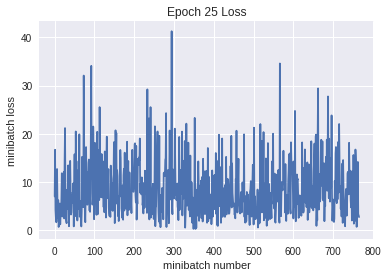

Iteration 19200: with minibatch training loss = 0.142 and accuracy of 0.94
Iteration 19300: with minibatch training loss = 0.0528 and accuracy of 0.98
Iteration 19400: with minibatch training loss = 0.0361 and accuracy of 0.98
Iteration 19500: with minibatch training loss = 0.167 and accuracy of 0.97
Iteration 19600: with minibatch training loss = 0.0989 and accuracy of 0.94
Iteration 19700: with minibatch training loss = 0.138 and accuracy of 0.92
Iteration 19800: with minibatch training loss = 0.221 and accuracy of 0.92
Iteration 19900: with minibatch training loss = 0.127 and accuracy of 0.98
Epoch 26, Overall loss = 0.14 and accuracy of 0.957


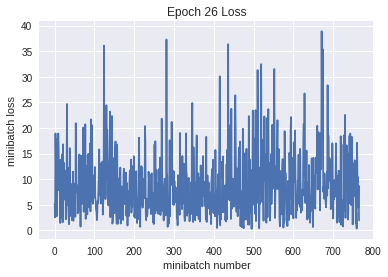

Iteration 20000: with minibatch training loss = 0.166 and accuracy of 0.95
Iteration 20100: with minibatch training loss = 0.346 and accuracy of 0.94
Iteration 20200: with minibatch training loss = 0.0958 and accuracy of 0.98
Iteration 20300: with minibatch training loss = 0.067 and accuracy of 0.97
Iteration 20400: with minibatch training loss = 0.00524 and accuracy of 1
Iteration 20500: with minibatch training loss = 0.0326 and accuracy of 0.98
Iteration 20600: with minibatch training loss = 0.138 and accuracy of 0.97
Epoch 27, Overall loss = 0.132 and accuracy of 0.959


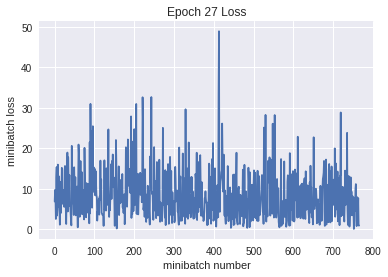

Iteration 20700: with minibatch training loss = 0.0831 and accuracy of 0.97
Iteration 20800: with minibatch training loss = 0.103 and accuracy of 0.97
Iteration 20900: with minibatch training loss = 0.0736 and accuracy of 0.98
Iteration 21000: with minibatch training loss = 0.176 and accuracy of 0.94
Iteration 21100: with minibatch training loss = 0.176 and accuracy of 0.95
Iteration 21200: with minibatch training loss = 0.169 and accuracy of 0.97
Iteration 21300: with minibatch training loss = 0.0741 and accuracy of 0.97
Iteration 21400: with minibatch training loss = 0.0539 and accuracy of 0.98
Epoch 28, Overall loss = 0.12 and accuracy of 0.963


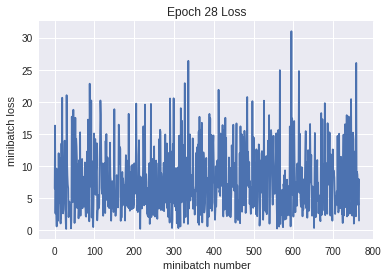

Iteration 21500: with minibatch training loss = 0.322 and accuracy of 0.92
Iteration 21600: with minibatch training loss = 0.0482 and accuracy of 0.98
Iteration 21700: with minibatch training loss = 0.326 and accuracy of 0.89
Iteration 21800: with minibatch training loss = 0.0271 and accuracy of 0.98
Iteration 21900: with minibatch training loss = 0.156 and accuracy of 0.97
Iteration 22000: with minibatch training loss = 0.109 and accuracy of 0.95
Iteration 22100: with minibatch training loss = 0.204 and accuracy of 0.94
Iteration 22200: with minibatch training loss = 0.0121 and accuracy of 1
Epoch 29, Overall loss = 0.135 and accuracy of 0.959


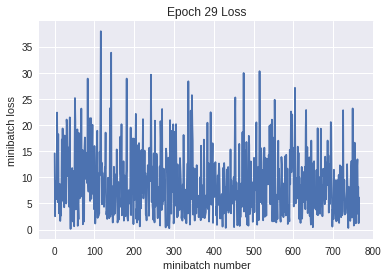

Iteration 22300: with minibatch training loss = 0.0367 and accuracy of 0.98
Iteration 22400: with minibatch training loss = 0.107 and accuracy of 0.92
Iteration 22500: with minibatch training loss = 0.207 and accuracy of 0.97
Iteration 22600: with minibatch training loss = 0.0666 and accuracy of 0.95
Iteration 22700: with minibatch training loss = 0.042 and accuracy of 0.97
Iteration 22800: with minibatch training loss = 0.23 and accuracy of 0.97
Iteration 22900: with minibatch training loss = 0.105 and accuracy of 0.94
Epoch 30, Overall loss = 0.125 and accuracy of 0.963


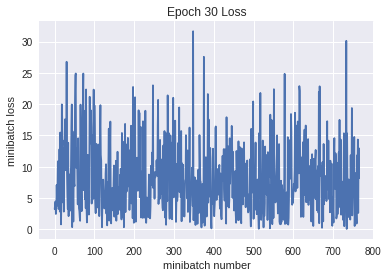

Iteration 23000: with minibatch training loss = 0.111 and accuracy of 0.95
Iteration 23100: with minibatch training loss = 0.0519 and accuracy of 0.98
Iteration 23200: with minibatch training loss = 0.0509 and accuracy of 0.97
Iteration 23300: with minibatch training loss = 0.21 and accuracy of 0.92
Iteration 23400: with minibatch training loss = 0.114 and accuracy of 0.98
Iteration 23500: with minibatch training loss = 0.0789 and accuracy of 0.97
Iteration 23600: with minibatch training loss = 0.0957 and accuracy of 0.97
Iteration 23700: with minibatch training loss = 0.0099 and accuracy of 1
Epoch 31, Overall loss = 0.117 and accuracy of 0.964


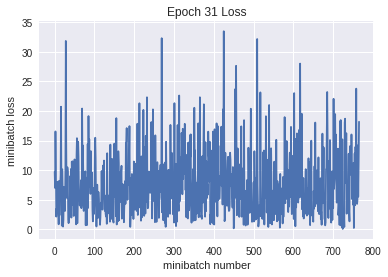

Iteration 23800: with minibatch training loss = 0.264 and accuracy of 0.91
Iteration 23900: with minibatch training loss = 0.0899 and accuracy of 0.98
Iteration 24000: with minibatch training loss = 0.213 and accuracy of 0.94
Iteration 24100: with minibatch training loss = 0.0749 and accuracy of 0.97
Iteration 24200: with minibatch training loss = 0.0372 and accuracy of 0.98
Iteration 24300: with minibatch training loss = 0.0725 and accuracy of 0.97
Iteration 24400: with minibatch training loss = 0.133 and accuracy of 0.95
Iteration 24500: with minibatch training loss = 0.116 and accuracy of 0.95
Epoch 32, Overall loss = 0.127 and accuracy of 0.963


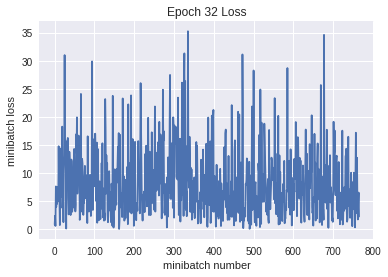

Iteration 24600: with minibatch training loss = 0.182 and accuracy of 0.92
Iteration 24700: with minibatch training loss = 0.0432 and accuracy of 0.97
Iteration 24800: with minibatch training loss = 0.0354 and accuracy of 0.98
Iteration 24900: with minibatch training loss = 0.157 and accuracy of 0.94
Iteration 25000: with minibatch training loss = 0.0287 and accuracy of 0.98
Iteration 25100: with minibatch training loss = 0.337 and accuracy of 0.95
Iteration 25200: with minibatch training loss = 0.125 and accuracy of 0.98
Epoch 33, Overall loss = 0.12 and accuracy of 0.965


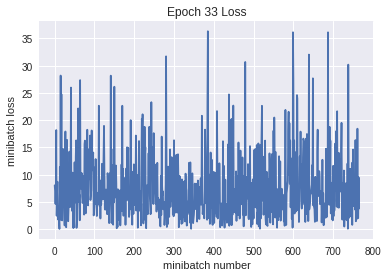

Iteration 25300: with minibatch training loss = 0.296 and accuracy of 0.89
Iteration 25400: with minibatch training loss = 0.216 and accuracy of 0.91
Iteration 25500: with minibatch training loss = 0.174 and accuracy of 0.94
Iteration 25600: with minibatch training loss = 0.0997 and accuracy of 0.97
Iteration 25700: with minibatch training loss = 0.105 and accuracy of 0.97
Iteration 25800: with minibatch training loss = 0.0995 and accuracy of 0.95
Iteration 25900: with minibatch training loss = 0.264 and accuracy of 0.94
Iteration 26000: with minibatch training loss = 0.0845 and accuracy of 0.98
Epoch 34, Overall loss = 0.111 and accuracy of 0.967


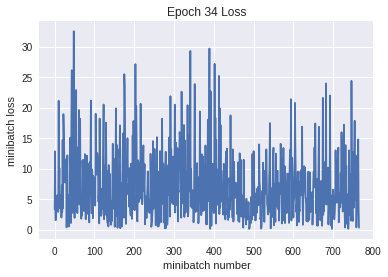

Iteration 26100: with minibatch training loss = 0.0123 and accuracy of 1
Iteration 26200: with minibatch training loss = 0.0768 and accuracy of 0.98
Iteration 26300: with minibatch training loss = 0.0789 and accuracy of 0.97
Iteration 26400: with minibatch training loss = 0.0689 and accuracy of 0.98
Iteration 26500: with minibatch training loss = 0.107 and accuracy of 0.95
Iteration 26600: with minibatch training loss = 0.0661 and accuracy of 0.98
Iteration 26700: with minibatch training loss = 0.0781 and accuracy of 0.98
Iteration 26800: with minibatch training loss = 0.0915 and accuracy of 0.98
Epoch 35, Overall loss = 0.111 and accuracy of 0.968


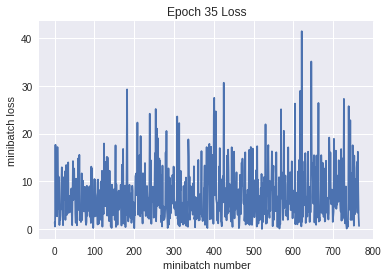

Iteration 26900: with minibatch training loss = 0.065 and accuracy of 0.98
Iteration 27000: with minibatch training loss = 0.0509 and accuracy of 0.98
Iteration 27100: with minibatch training loss = 0.0791 and accuracy of 0.98
Iteration 27200: with minibatch training loss = 0.0139 and accuracy of 1
Iteration 27300: with minibatch training loss = 0.00202 and accuracy of 1
Iteration 27400: with minibatch training loss = 0.0553 and accuracy of 0.98
Iteration 27500: with minibatch training loss = 0.0455 and accuracy of 0.98
Epoch 36, Overall loss = 0.121 and accuracy of 0.965


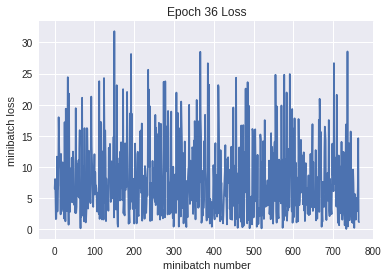

Iteration 27600: with minibatch training loss = 0.0735 and accuracy of 0.97
Iteration 27700: with minibatch training loss = 0.155 and accuracy of 0.95
Iteration 27800: with minibatch training loss = 0.0445 and accuracy of 0.98
Iteration 27900: with minibatch training loss = 0.086 and accuracy of 0.94
Iteration 28000: with minibatch training loss = 0.0283 and accuracy of 0.98
Iteration 28100: with minibatch training loss = 0.0658 and accuracy of 0.97
Iteration 28200: with minibatch training loss = 0.0323 and accuracy of 0.98
Iteration 28300: with minibatch training loss = 0.0698 and accuracy of 0.95
Epoch 37, Overall loss = 0.105 and accuracy of 0.969


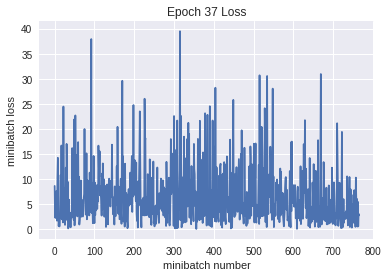

Iteration 28400: with minibatch training loss = 0.0492 and accuracy of 0.98
Iteration 28500: with minibatch training loss = 0.00605 and accuracy of 1
Iteration 28600: with minibatch training loss = 0.105 and accuracy of 0.95
Iteration 28700: with minibatch training loss = 0.0595 and accuracy of 0.97
Iteration 28800: with minibatch training loss = 0.046 and accuracy of 0.97
Iteration 28900: with minibatch training loss = 0.0954 and accuracy of 0.94
Iteration 29000: with minibatch training loss = 0.143 and accuracy of 0.97
Iteration 29100: with minibatch training loss = 0.161 and accuracy of 0.94
Epoch 38, Overall loss = 0.104 and accuracy of 0.97


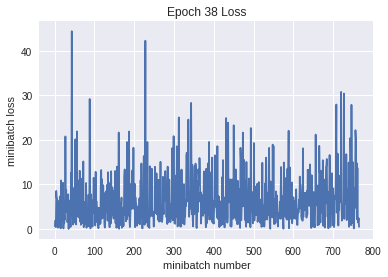

Iteration 29200: with minibatch training loss = 0.247 and accuracy of 0.94
Iteration 29300: with minibatch training loss = 0.0173 and accuracy of 1
Iteration 29400: with minibatch training loss = 0.245 and accuracy of 0.95
Iteration 29500: with minibatch training loss = 0.159 and accuracy of 0.95
Iteration 29600: with minibatch training loss = 0.0829 and accuracy of 0.98
Iteration 29700: with minibatch training loss = 0.208 and accuracy of 0.91
Iteration 29800: with minibatch training loss = 0.0147 and accuracy of 1
Epoch 39, Overall loss = 0.104 and accuracy of 0.97


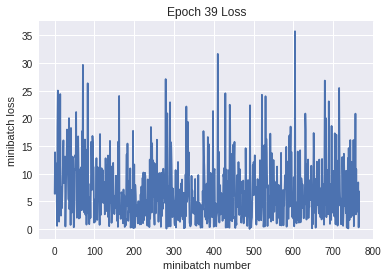

Iteration 29900: with minibatch training loss = 0.16 and accuracy of 0.98
Iteration 30000: with minibatch training loss = 0.142 and accuracy of 0.92
Iteration 30100: with minibatch training loss = 0.262 and accuracy of 0.95
Iteration 30200: with minibatch training loss = 0.0489 and accuracy of 0.98
Iteration 30300: with minibatch training loss = 0.0567 and accuracy of 0.97
Iteration 30400: with minibatch training loss = 0.072 and accuracy of 0.97
Iteration 30500: with minibatch training loss = 0.0733 and accuracy of 0.95
Iteration 30600: with minibatch training loss = 0.263 and accuracy of 0.95
Epoch 40, Overall loss = 0.107 and accuracy of 0.97


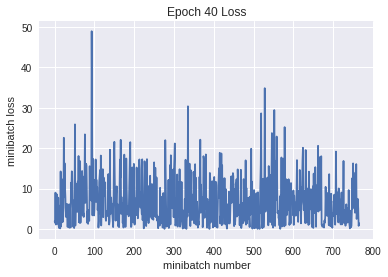

Iteration 30700: with minibatch training loss = 0.111 and accuracy of 0.97
Iteration 30800: with minibatch training loss = 0.132 and accuracy of 0.97
Iteration 30900: with minibatch training loss = 0.0906 and accuracy of 0.98
Iteration 31000: with minibatch training loss = 0.0644 and accuracy of 0.97
Iteration 31100: with minibatch training loss = 0.167 and accuracy of 0.95
Iteration 31200: with minibatch training loss = 0.106 and accuracy of 0.95
Iteration 31300: with minibatch training loss = 0.305 and accuracy of 0.98
Iteration 31400: with minibatch training loss = 0.215 and accuracy of 0.94
Epoch 41, Overall loss = 0.111 and accuracy of 0.97


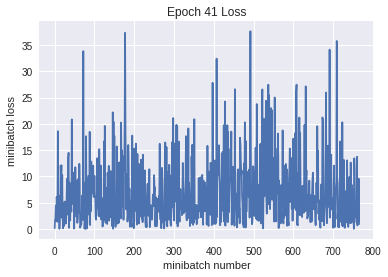

Iteration 31500: with minibatch training loss = 0.0528 and accuracy of 0.98
Iteration 31600: with minibatch training loss = 0.013 and accuracy of 1
Iteration 31700: with minibatch training loss = 0.131 and accuracy of 0.97
Iteration 31800: with minibatch training loss = 0.0663 and accuracy of 0.98
Iteration 31900: with minibatch training loss = 0.00568 and accuracy of 1
Iteration 32000: with minibatch training loss = 0.237 and accuracy of 0.92
Iteration 32100: with minibatch training loss = 0.21 and accuracy of 0.94
Epoch 42, Overall loss = 0.0978 and accuracy of 0.973


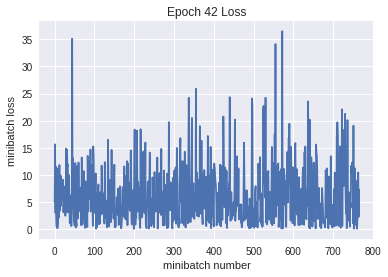

Iteration 32200: with minibatch training loss = 0.155 and accuracy of 0.97
Iteration 32300: with minibatch training loss = 0.0323 and accuracy of 0.98
Iteration 32400: with minibatch training loss = 0.0352 and accuracy of 0.98
Iteration 32500: with minibatch training loss = 0.0651 and accuracy of 0.97
Iteration 32600: with minibatch training loss = 0.0129 and accuracy of 1
Iteration 32700: with minibatch training loss = 0.148 and accuracy of 0.98
Iteration 32800: with minibatch training loss = 0.118 and accuracy of 0.97
Iteration 32900: with minibatch training loss = 0.0194 and accuracy of 0.98
Epoch 43, Overall loss = 0.107 and accuracy of 0.971


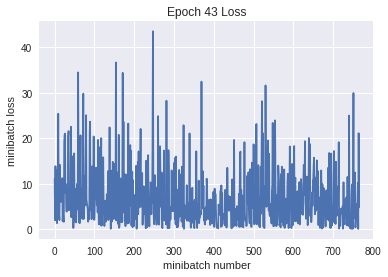

Iteration 33000: with minibatch training loss = 0.127 and accuracy of 0.92
Iteration 33100: with minibatch training loss = 0.0175 and accuracy of 0.98
Iteration 33200: with minibatch training loss = 0.0071 and accuracy of 1
Iteration 33300: with minibatch training loss = 0.00548 and accuracy of 1
Iteration 33400: with minibatch training loss = 0.0267 and accuracy of 0.98
Iteration 33500: with minibatch training loss = 0.181 and accuracy of 0.95
Iteration 33600: with minibatch training loss = 0.228 and accuracy of 0.97
Iteration 33700: with minibatch training loss = 0.198 and accuracy of 0.94
Epoch 44, Overall loss = 0.091 and accuracy of 0.975


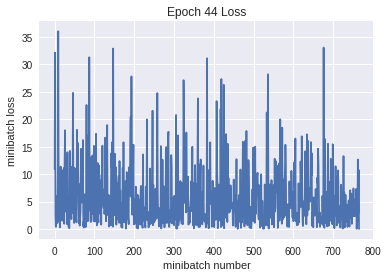

Iteration 33800: with minibatch training loss = 0.139 and accuracy of 0.97
Iteration 33900: with minibatch training loss = 0.207 and accuracy of 0.98
Iteration 34000: with minibatch training loss = 0.126 and accuracy of 0.98
Iteration 34100: with minibatch training loss = 0.118 and accuracy of 0.94
Iteration 34200: with minibatch training loss = 0.0321 and accuracy of 0.98
Iteration 34300: with minibatch training loss = 0.0515 and accuracy of 0.97
Iteration 34400: with minibatch training loss = 0.0831 and accuracy of 0.95
Epoch 45, Overall loss = 0.1 and accuracy of 0.974


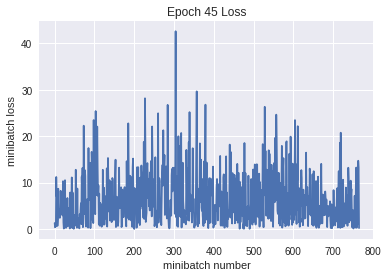

Iteration 34500: with minibatch training loss = 0.094 and accuracy of 0.95
Iteration 34600: with minibatch training loss = 0.0623 and accuracy of 0.98
Iteration 34700: with minibatch training loss = 0.015 and accuracy of 0.98
Iteration 34800: with minibatch training loss = 0.163 and accuracy of 0.92
Iteration 34900: with minibatch training loss = 0.111 and accuracy of 0.97
Iteration 35000: with minibatch training loss = 0.134 and accuracy of 0.97
Iteration 35100: with minibatch training loss = 0.0603 and accuracy of 0.95
Iteration 35200: with minibatch training loss = 0.108 and accuracy of 0.95
Epoch 46, Overall loss = 0.105 and accuracy of 0.972


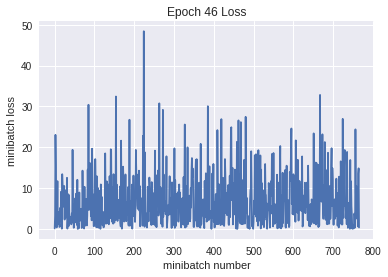

Iteration 35300: with minibatch training loss = 0.0925 and accuracy of 0.97
Iteration 35400: with minibatch training loss = 0.106 and accuracy of 0.94
Iteration 35500: with minibatch training loss = 0.268 and accuracy of 0.95
Iteration 35600: with minibatch training loss = 0.000995 and accuracy of 1
Iteration 35700: with minibatch training loss = 0.0603 and accuracy of 0.98
Iteration 35800: with minibatch training loss = 0.13 and accuracy of 0.95
Iteration 35900: with minibatch training loss = 0.0178 and accuracy of 1
Iteration 36000: with minibatch training loss = 0.0206 and accuracy of 0.98
Epoch 47, Overall loss = 0.0931 and accuracy of 0.975


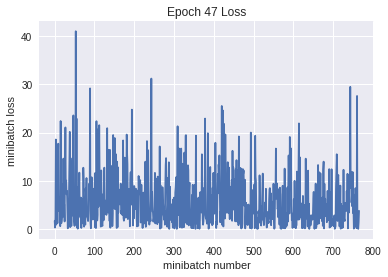

Iteration 36100: with minibatch training loss = 0.000638 and accuracy of 1
Iteration 36200: with minibatch training loss = 0.185 and accuracy of 0.98
Iteration 36300: with minibatch training loss = 0.135 and accuracy of 0.98
Iteration 36400: with minibatch training loss = 0.0133 and accuracy of 1
Iteration 36500: with minibatch training loss = 0.0674 and accuracy of 0.98
Iteration 36600: with minibatch training loss = 0.00598 and accuracy of 1
Iteration 36700: with minibatch training loss = 0.102 and accuracy of 0.95
Epoch 48, Overall loss = 0.101 and accuracy of 0.974


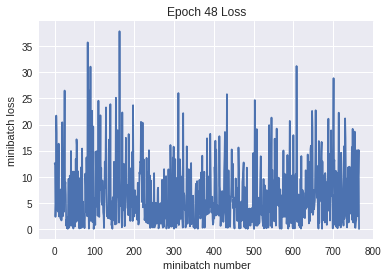

Iteration 36800: with minibatch training loss = 0.116 and accuracy of 0.97
Iteration 36900: with minibatch training loss = 0.115 and accuracy of 0.97
Iteration 37000: with minibatch training loss = 0.0789 and accuracy of 0.95
Iteration 37100: with minibatch training loss = 0.0613 and accuracy of 0.97
Iteration 37200: with minibatch training loss = 0.347 and accuracy of 0.94
Iteration 37300: with minibatch training loss = 0.00243 and accuracy of 1
Iteration 37400: with minibatch training loss = 0.118 and accuracy of 0.98
Iteration 37500: with minibatch training loss = 0.245 and accuracy of 0.97
Epoch 49, Overall loss = 0.0894 and accuracy of 0.976


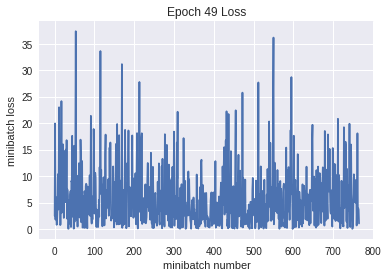

Iteration 37600: with minibatch training loss = 0.0959 and accuracy of 0.97
Iteration 37700: with minibatch training loss = 0.0258 and accuracy of 0.98
Iteration 37800: with minibatch training loss = 0.0901 and accuracy of 0.97
Iteration 37900: with minibatch training loss = 0.097 and accuracy of 0.98
Iteration 38000: with minibatch training loss = 0.0181 and accuracy of 1
Iteration 38100: with minibatch training loss = 0.0245 and accuracy of 1
Iteration 38200: with minibatch training loss = 0.0959 and accuracy of 0.95
Epoch 50, Overall loss = 0.0965 and accuracy of 0.975


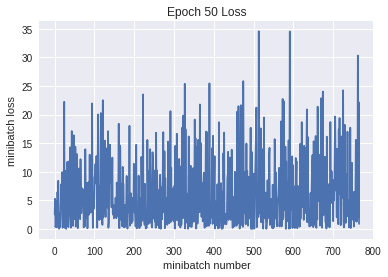

Iteration 38300: with minibatch training loss = 0.0992 and accuracy of 0.95
Iteration 38400: with minibatch training loss = 0.009 and accuracy of 1
Iteration 38500: with minibatch training loss = 0.0246 and accuracy of 0.98
Iteration 38600: with minibatch training loss = 0.189 and accuracy of 0.97
Iteration 38700: with minibatch training loss = 0.225 and accuracy of 0.98
Iteration 38800: with minibatch training loss = 0.00601 and accuracy of 1
Iteration 38900: with minibatch training loss = 0.275 and accuracy of 0.94
Iteration 39000: with minibatch training loss = 0.00406 and accuracy of 1
Epoch 51, Overall loss = 0.0949 and accuracy of 0.976


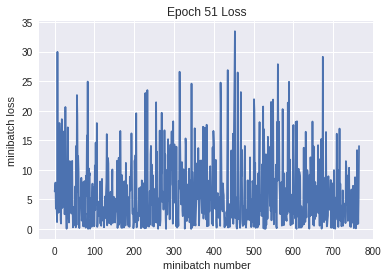

Iteration 39100: with minibatch training loss = 0.00604 and accuracy of 1
Iteration 39200: with minibatch training loss = 0.00418 and accuracy of 1
Iteration 39300: with minibatch training loss = 0.00603 and accuracy of 1
Iteration 39400: with minibatch training loss = 0.00637 and accuracy of 1
Iteration 39500: with minibatch training loss = 0.0865 and accuracy of 0.97
Iteration 39600: with minibatch training loss = 0.23 and accuracy of 0.97
Iteration 39700: with minibatch training loss = 0.19 and accuracy of 0.92
Iteration 39800: with minibatch training loss = 0.0191 and accuracy of 1
Epoch 52, Overall loss = 0.0937 and accuracy of 0.975


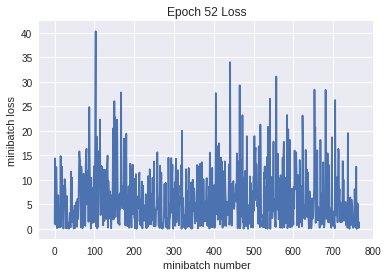

Iteration 39900: with minibatch training loss = 0.184 and accuracy of 0.98
Iteration 40000: with minibatch training loss = 0.0615 and accuracy of 0.98
Iteration 40100: with minibatch training loss = 0.00675 and accuracy of 1
Iteration 40200: with minibatch training loss = 0.00564 and accuracy of 1
Iteration 40300: with minibatch training loss = 0.0384 and accuracy of 0.98
Iteration 40400: with minibatch training loss = 0.0827 and accuracy of 0.97
Iteration 40500: with minibatch training loss = 0.18 and accuracy of 0.98
Epoch 53, Overall loss = 0.0857 and accuracy of 0.978


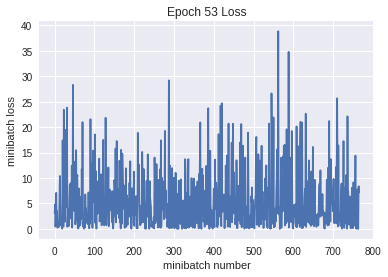

Iteration 40600: with minibatch training loss = 0.00334 and accuracy of 1
Iteration 40700: with minibatch training loss = 0.0348 and accuracy of 0.98
Iteration 40800: with minibatch training loss = 0.115 and accuracy of 0.97
Iteration 40900: with minibatch training loss = 0.215 and accuracy of 0.98
Iteration 41000: with minibatch training loss = 0.161 and accuracy of 0.97
Iteration 41100: with minibatch training loss = 0.137 and accuracy of 0.95
Iteration 41200: with minibatch training loss = 0.048 and accuracy of 0.98
Iteration 41300: with minibatch training loss = 0.156 and accuracy of 0.97
Epoch 54, Overall loss = 0.0915 and accuracy of 0.977


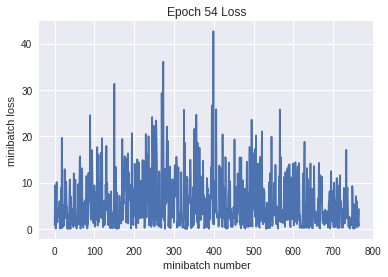

Iteration 41400: with minibatch training loss = 0.106 and accuracy of 0.97
Iteration 41500: with minibatch training loss = 0.0573 and accuracy of 0.97
Iteration 41600: with minibatch training loss = 0.00986 and accuracy of 1
Iteration 41700: with minibatch training loss = 0.0292 and accuracy of 0.98
Iteration 41800: with minibatch training loss = 0.0319 and accuracy of 0.98
Iteration 41900: with minibatch training loss = 0.447 and accuracy of 0.94
Iteration 42000: with minibatch training loss = 0.0789 and accuracy of 0.98
Iteration 42100: with minibatch training loss = 0.0377 and accuracy of 0.98
Epoch 55, Overall loss = 0.101 and accuracy of 0.975


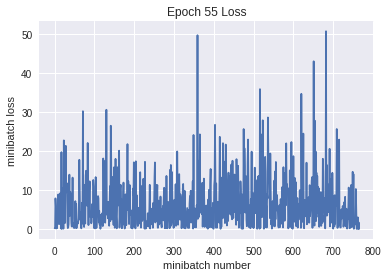

Iteration 42200: with minibatch training loss = 0.0685 and accuracy of 0.97
Iteration 42300: with minibatch training loss = 0.0178 and accuracy of 1
Iteration 42400: with minibatch training loss = 0.0819 and accuracy of 0.98
Iteration 42500: with minibatch training loss = 0.168 and accuracy of 0.97
Iteration 42600: with minibatch training loss = 0.000108 and accuracy of 1
Iteration 42700: with minibatch training loss = 0.0137 and accuracy of 0.98
Iteration 42800: with minibatch training loss = 0.0928 and accuracy of 0.98
Epoch 56, Overall loss = 0.0867 and accuracy of 0.978


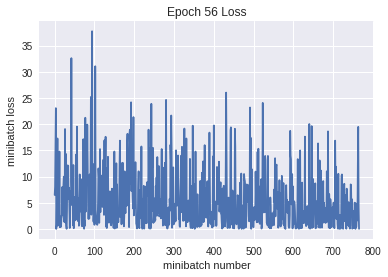

Iteration 42900: with minibatch training loss = 0.0232 and accuracy of 0.98
Iteration 43000: with minibatch training loss = 0.000522 and accuracy of 1
Iteration 43100: with minibatch training loss = 0.0151 and accuracy of 1
Iteration 43200: with minibatch training loss = 0.00151 and accuracy of 1
Iteration 43300: with minibatch training loss = 0.164 and accuracy of 0.95
Iteration 43400: with minibatch training loss = 0.161 and accuracy of 0.97
Iteration 43500: with minibatch training loss = 0.106 and accuracy of 0.98
Iteration 43600: with minibatch training loss = 0.0798 and accuracy of 0.98
Epoch 57, Overall loss = 0.0716 and accuracy of 0.982


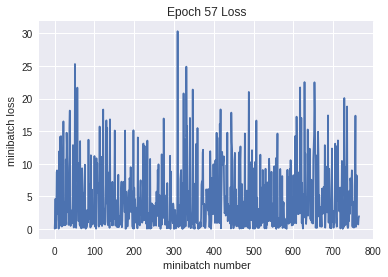

Iteration 43700: with minibatch training loss = 0.081 and accuracy of 0.95
Iteration 43800: with minibatch training loss = 0.0659 and accuracy of 0.98
Iteration 43900: with minibatch training loss = 0.033 and accuracy of 0.98
Iteration 44000: with minibatch training loss = 0.0255 and accuracy of 0.98
Iteration 44100: with minibatch training loss = 0.237 and accuracy of 0.95
Iteration 44200: with minibatch training loss = 0.101 and accuracy of 0.97
Iteration 44300: with minibatch training loss = 0.0885 and accuracy of 0.97
Iteration 44400: with minibatch training loss = 0.0952 and accuracy of 0.95
Epoch 58, Overall loss = 0.102 and accuracy of 0.976


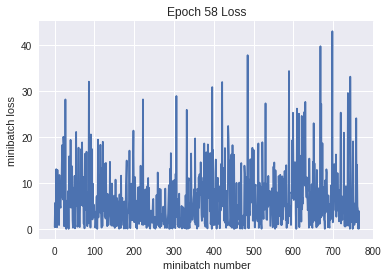

Iteration 44500: with minibatch training loss = 0.108 and accuracy of 0.97
Iteration 44600: with minibatch training loss = 0.109 and accuracy of 0.97
Iteration 44700: with minibatch training loss = 0.0128 and accuracy of 1
Iteration 44800: with minibatch training loss = 0.00775 and accuracy of 1
Iteration 44900: with minibatch training loss = 0.136 and accuracy of 0.94
Iteration 45000: with minibatch training loss = 0.00198 and accuracy of 1
Iteration 45100: with minibatch training loss = 0.32 and accuracy of 0.97
Epoch 59, Overall loss = 0.112 and accuracy of 0.974


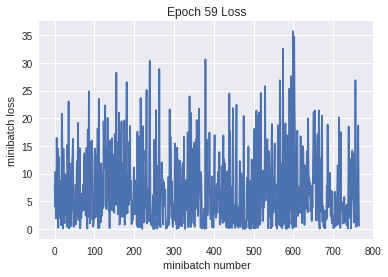

Iteration 45200: with minibatch training loss = 0.0145 and accuracy of 1
Iteration 45300: with minibatch training loss = 0.0651 and accuracy of 0.98
Iteration 45400: with minibatch training loss = 0.105 and accuracy of 0.98
Iteration 45500: with minibatch training loss = 0.045 and accuracy of 0.97
Iteration 45600: with minibatch training loss = 0.00526 and accuracy of 1
Iteration 45700: with minibatch training loss = 0.00343 and accuracy of 1
Iteration 45800: with minibatch training loss = 0.177 and accuracy of 0.95
Iteration 45900: with minibatch training loss = 0.0164 and accuracy of 1
Epoch 60, Overall loss = 0.0786 and accuracy of 0.979


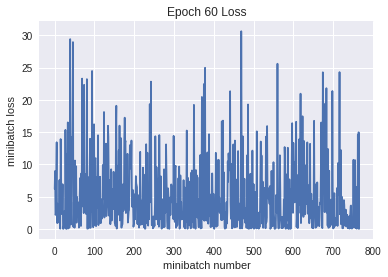

Iteration 46000: with minibatch training loss = 0.00264 and accuracy of 1
Iteration 46100: with minibatch training loss = 0.0458 and accuracy of 0.98
Iteration 46200: with minibatch training loss = 0.101 and accuracy of 0.97
Iteration 46300: with minibatch training loss = 0.047 and accuracy of 0.98
Iteration 46400: with minibatch training loss = 0.109 and accuracy of 0.97
Iteration 46500: with minibatch training loss = 0.369 and accuracy of 0.91
Iteration 46600: with minibatch training loss = 0.0556 and accuracy of 0.98
Iteration 46700: with minibatch training loss = 0.289 and accuracy of 0.95
Epoch 61, Overall loss = 0.0844 and accuracy of 0.98


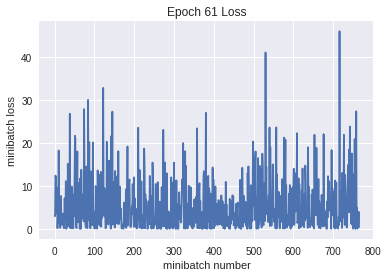

Iteration 46800: with minibatch training loss = 0.0839 and accuracy of 0.98
Iteration 46900: with minibatch training loss = 0.00899 and accuracy of 1
Iteration 47000: with minibatch training loss = 0.0396 and accuracy of 0.98
Iteration 47100: with minibatch training loss = 0.039 and accuracy of 0.98
Iteration 47200: with minibatch training loss = 0.0251 and accuracy of 0.98
Iteration 47300: with minibatch training loss = 0.114 and accuracy of 0.95
Iteration 47400: with minibatch training loss = 0.0262 and accuracy of 0.98
Epoch 62, Overall loss = 0.0925 and accuracy of 0.979


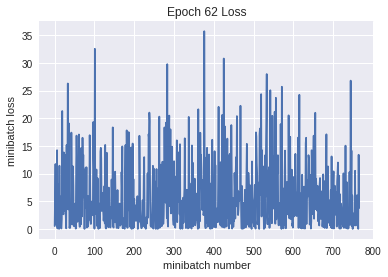

Iteration 47500: with minibatch training loss = 0.125 and accuracy of 0.95
Iteration 47600: with minibatch training loss = 0.0176 and accuracy of 1
Iteration 47700: with minibatch training loss = 0.000522 and accuracy of 1
Iteration 47800: with minibatch training loss = 0.00351 and accuracy of 1
Iteration 47900: with minibatch training loss = 0.152 and accuracy of 0.97
Iteration 48000: with minibatch training loss = 0.00296 and accuracy of 1
Iteration 48100: with minibatch training loss = 0.15 and accuracy of 0.98
Iteration 48200: with minibatch training loss = 0.349 and accuracy of 0.97
Epoch 63, Overall loss = 0.0967 and accuracy of 0.978


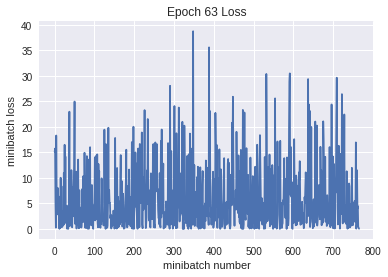

Iteration 48300: with minibatch training loss = 0.025 and accuracy of 0.98
Iteration 48400: with minibatch training loss = 0.0585 and accuracy of 0.97
Iteration 48500: with minibatch training loss = 0.00893 and accuracy of 1
Iteration 48600: with minibatch training loss = 0.0166 and accuracy of 0.98
Iteration 48700: with minibatch training loss = 0.115 and accuracy of 0.97
Iteration 48800: with minibatch training loss = 0.0342 and accuracy of 0.98
Iteration 48900: with minibatch training loss = 0.00542 and accuracy of 1
Iteration 49000: with minibatch training loss = 0.25 and accuracy of 0.98
Epoch 64, Overall loss = 0.0876 and accuracy of 0.98


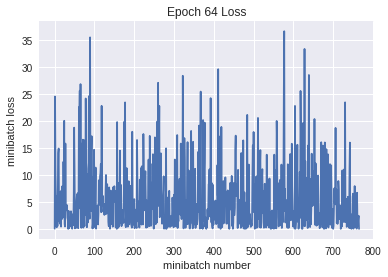

Iteration 49100: with minibatch training loss = 0.0569 and accuracy of 0.98
Iteration 49200: with minibatch training loss = 0.00989 and accuracy of 1
Iteration 49300: with minibatch training loss = 0.0943 and accuracy of 0.97
Iteration 49400: with minibatch training loss = 0.456 and accuracy of 0.98
Iteration 49500: with minibatch training loss = 0.0852 and accuracy of 0.97
Iteration 49600: with minibatch training loss = 0.00302 and accuracy of 1
Iteration 49700: with minibatch training loss = 0.0519 and accuracy of 0.98
Epoch 65, Overall loss = 0.0833 and accuracy of 0.98


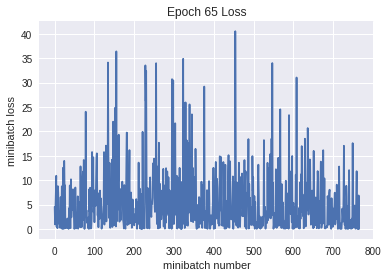

Iteration 49800: with minibatch training loss = 0.00251 and accuracy of 1
Iteration 49900: with minibatch training loss = 0.139 and accuracy of 0.95
Iteration 50000: with minibatch training loss = 0.0027 and accuracy of 1
Iteration 50100: with minibatch training loss = 0.225 and accuracy of 0.97
Iteration 50200: with minibatch training loss = 0.0131 and accuracy of 1
Iteration 50300: with minibatch training loss = 0.0147 and accuracy of 1
Iteration 50400: with minibatch training loss = 0.0645 and accuracy of 0.98
Iteration 50500: with minibatch training loss = 0.112 and accuracy of 0.98
Epoch 66, Overall loss = 0.0793 and accuracy of 0.981


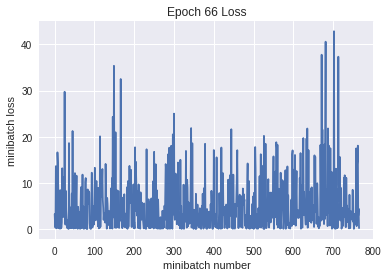

Iteration 50600: with minibatch training loss = 0.0124 and accuracy of 0.98
Iteration 50700: with minibatch training loss = 0.139 and accuracy of 0.95
Iteration 50800: with minibatch training loss = 0.15 and accuracy of 0.97
Iteration 50900: with minibatch training loss = 0.497 and accuracy of 0.94
Iteration 51000: with minibatch training loss = 0.0191 and accuracy of 0.98
Iteration 51100: with minibatch training loss = 0.0228 and accuracy of 0.98
Iteration 51200: with minibatch training loss = 0.0459 and accuracy of 0.98
Iteration 51300: with minibatch training loss = 0.0789 and accuracy of 0.97
Epoch 67, Overall loss = 0.101 and accuracy of 0.978


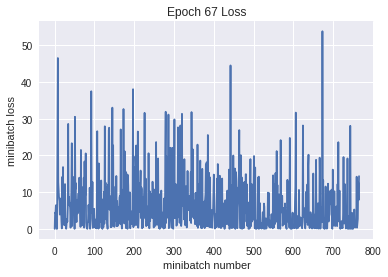

Iteration 51400: with minibatch training loss = 0.073 and accuracy of 0.97
Iteration 51500: with minibatch training loss = 0.000297 and accuracy of 1
Iteration 51600: with minibatch training loss = 0.101 and accuracy of 0.98
Iteration 51700: with minibatch training loss = 0.0765 and accuracy of 0.98
Iteration 51800: with minibatch training loss = 0.0538 and accuracy of 0.97
Iteration 51900: with minibatch training loss = 0.000289 and accuracy of 1
Iteration 52000: with minibatch training loss = 0.00444 and accuracy of 1
Epoch 68, Overall loss = 0.0813 and accuracy of 0.982


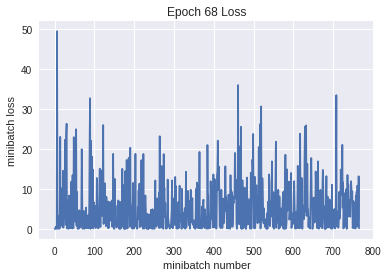

Iteration 52100: with minibatch training loss = 0.0542 and accuracy of 0.97
Iteration 52200: with minibatch training loss = 0.00295 and accuracy of 1
Iteration 52300: with minibatch training loss = 0.00619 and accuracy of 1
Iteration 52400: with minibatch training loss = 0.00954 and accuracy of 1
Iteration 52500: with minibatch training loss = 0.0195 and accuracy of 1
Iteration 52600: with minibatch training loss = 0.0202 and accuracy of 0.98
Iteration 52700: with minibatch training loss = 0.217 and accuracy of 0.94
Iteration 52800: with minibatch training loss = 0.169 and accuracy of 0.98
Epoch 69, Overall loss = 0.0775 and accuracy of 0.982


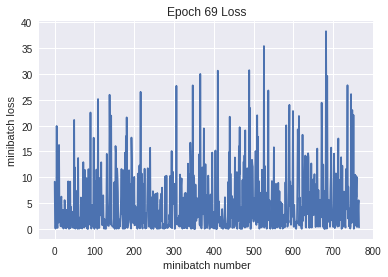

Iteration 52900: with minibatch training loss = 0.136 and accuracy of 0.97
Iteration 53000: with minibatch training loss = 0.06 and accuracy of 0.95
Iteration 53100: with minibatch training loss = 0.08 and accuracy of 0.98
Iteration 53200: with minibatch training loss = 0.237 and accuracy of 0.94
Iteration 53300: with minibatch training loss = 0.0126 and accuracy of 0.98
Iteration 53400: with minibatch training loss = 0.000487 and accuracy of 1
Iteration 53500: with minibatch training loss = 0.11 and accuracy of 0.98
Iteration 53600: with minibatch training loss = 0.202 and accuracy of 0.97
Epoch 70, Overall loss = 0.0872 and accuracy of 0.98


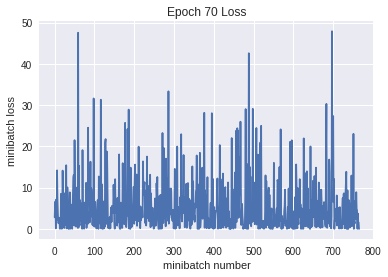

Iteration 53700: with minibatch training loss = 0.175 and accuracy of 0.97
Iteration 53800: with minibatch training loss = 0.0318 and accuracy of 0.98
Iteration 53900: with minibatch training loss = 0.00046 and accuracy of 1
Iteration 54000: with minibatch training loss = 0.00673 and accuracy of 1
Iteration 54100: with minibatch training loss = 0.00289 and accuracy of 1
Iteration 54200: with minibatch training loss = 0.0714 and accuracy of 0.98
Iteration 54300: with minibatch training loss = 0.164 and accuracy of 0.97
Epoch 71, Overall loss = 0.0813 and accuracy of 0.982


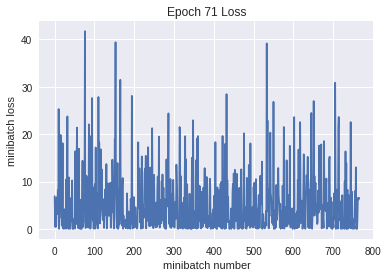

Iteration 54400: with minibatch training loss = 0.00267 and accuracy of 1
Iteration 54500: with minibatch training loss = 0.00421 and accuracy of 1
Iteration 54600: with minibatch training loss = 0.0139 and accuracy of 1
Iteration 54700: with minibatch training loss = 0.0384 and accuracy of 0.98
Iteration 54800: with minibatch training loss = 0.239 and accuracy of 0.98
Iteration 54900: with minibatch training loss = 0.00206 and accuracy of 1
Iteration 55000: with minibatch training loss = 0.000304 and accuracy of 1
Iteration 55100: with minibatch training loss = 0.00144 and accuracy of 1
Epoch 72, Overall loss = 0.09 and accuracy of 0.981


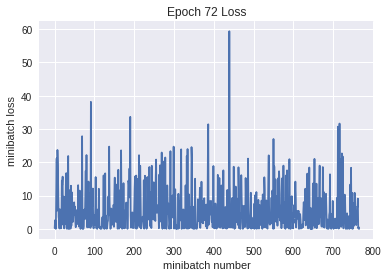

Iteration 55200: with minibatch training loss = 0.0399 and accuracy of 0.98
Iteration 55300: with minibatch training loss = 0.0766 and accuracy of 0.98
Iteration 55400: with minibatch training loss = 0.185 and accuracy of 0.98
Iteration 55500: with minibatch training loss = 0.103 and accuracy of 0.97
Iteration 55600: with minibatch training loss = 0.00656 and accuracy of 1
Iteration 55700: with minibatch training loss = 0.111 and accuracy of 0.98
Iteration 55800: with minibatch training loss = 0.0185 and accuracy of 0.98
Iteration 55900: with minibatch training loss = 0.113 and accuracy of 0.98
Epoch 73, Overall loss = 0.0856 and accuracy of 0.981


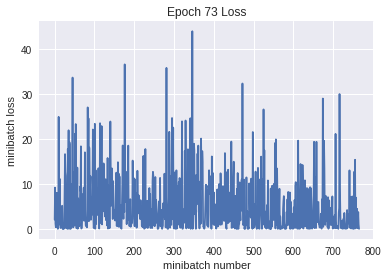

Iteration 56000: with minibatch training loss = 0.00566 and accuracy of 1
Iteration 56100: with minibatch training loss = 0.00265 and accuracy of 1
Iteration 56200: with minibatch training loss = 0.0642 and accuracy of 0.98
Iteration 56300: with minibatch training loss = 0.0798 and accuracy of 0.95
Iteration 56400: with minibatch training loss = 0.0513 and accuracy of 0.97
Iteration 56500: with minibatch training loss = 0.139 and accuracy of 0.98
Iteration 56600: with minibatch training loss = 0.00586 and accuracy of 1
Epoch 74, Overall loss = 0.088 and accuracy of 0.981


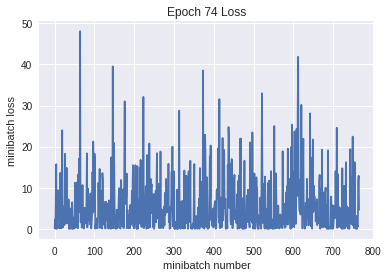

Iteration 56700: with minibatch training loss = 0.13 and accuracy of 0.98
Iteration 56800: with minibatch training loss = 0.0399 and accuracy of 0.98
Iteration 56900: with minibatch training loss = 0.23 and accuracy of 0.95
Iteration 57000: with minibatch training loss = 0.016 and accuracy of 0.98
Iteration 57100: with minibatch training loss = 7.15e-05 and accuracy of 1
Iteration 57200: with minibatch training loss = 0.000111 and accuracy of 1
Iteration 57300: with minibatch training loss = 0.0235 and accuracy of 0.98
Iteration 57400: with minibatch training loss = 0.119 and accuracy of 0.97
Epoch 75, Overall loss = 0.0704 and accuracy of 0.984


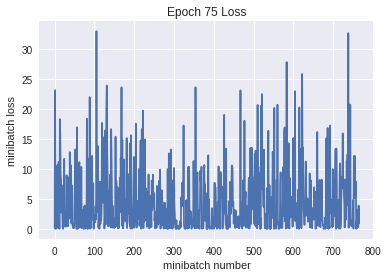

Iteration 57500: with minibatch training loss = 0.0654 and accuracy of 0.97
Iteration 57600: with minibatch training loss = 0.569 and accuracy of 0.94
Iteration 57700: with minibatch training loss = 0.15 and accuracy of 0.95
Iteration 57800: with minibatch training loss = 0.0216 and accuracy of 0.98
Iteration 57900: with minibatch training loss = 0.103 and accuracy of 0.97
Iteration 58000: with minibatch training loss = 0.415 and accuracy of 0.97
Iteration 58100: with minibatch training loss = 0.178 and accuracy of 0.95
Iteration 58200: with minibatch training loss = 0.0616 and accuracy of 0.97
Epoch 76, Overall loss = 0.102 and accuracy of 0.98


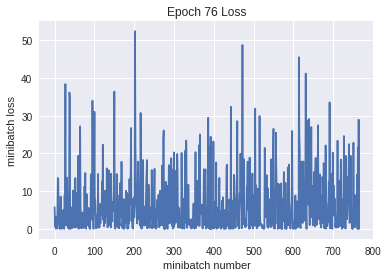

Iteration 58300: with minibatch training loss = 0.0147 and accuracy of 1
Iteration 58400: with minibatch training loss = 0.000731 and accuracy of 1
Iteration 58500: with minibatch training loss = 0.0208 and accuracy of 0.98
Iteration 58600: with minibatch training loss = 0.0722 and accuracy of 0.97
Iteration 58700: with minibatch training loss = 0.00319 and accuracy of 1
Iteration 58800: with minibatch training loss = 0.064 and accuracy of 0.98
Iteration 58900: with minibatch training loss = 0.156 and accuracy of 0.97
Epoch 77, Overall loss = 0.101 and accuracy of 0.979


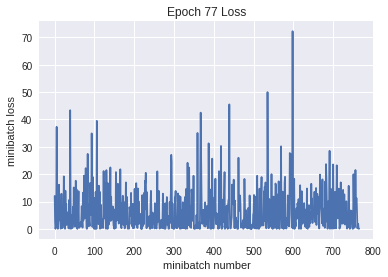

Iteration 59000: with minibatch training loss = 0.017 and accuracy of 0.98
Iteration 59100: with minibatch training loss = 0.823 and accuracy of 0.94
Iteration 59200: with minibatch training loss = 0.0292 and accuracy of 0.98
Iteration 59300: with minibatch training loss = 0.0035 and accuracy of 1
Iteration 59400: with minibatch training loss = 0.000867 and accuracy of 1
Iteration 59500: with minibatch training loss = 0.011 and accuracy of 1
Iteration 59600: with minibatch training loss = 0.0387 and accuracy of 0.98
Iteration 59700: with minibatch training loss = 0.00056 and accuracy of 1
Epoch 78, Overall loss = 0.077 and accuracy of 0.983


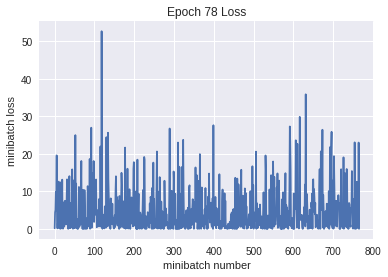

Iteration 59800: with minibatch training loss = 0.104 and accuracy of 0.95
Iteration 59900: with minibatch training loss = 0.112 and accuracy of 0.95
Iteration 60000: with minibatch training loss = 0.094 and accuracy of 0.97
Iteration 60100: with minibatch training loss = 0.382 and accuracy of 0.97
Iteration 60200: with minibatch training loss = 0.153 and accuracy of 0.97
Iteration 60300: with minibatch training loss = 0.0163 and accuracy of 0.98
Iteration 60400: with minibatch training loss = 0.0117 and accuracy of 1
Iteration 60500: with minibatch training loss = 0.000444 and accuracy of 1
Epoch 79, Overall loss = 0.0791 and accuracy of 0.983


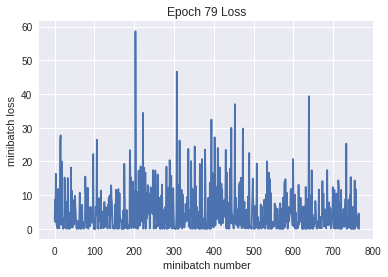

Iteration 60600: with minibatch training loss = 0.109 and accuracy of 0.97
Iteration 60700: with minibatch training loss = 0.00924 and accuracy of 1
Iteration 60800: with minibatch training loss = 0.18 and accuracy of 0.95
Iteration 60900: with minibatch training loss = 0.146 and accuracy of 0.97
Iteration 61000: with minibatch training loss = 0.333 and accuracy of 0.97
Iteration 61100: with minibatch training loss = 0.00021 and accuracy of 1
Iteration 61200: with minibatch training loss = 0.136 and accuracy of 0.98
Epoch 80, Overall loss = 0.0753 and accuracy of 0.984


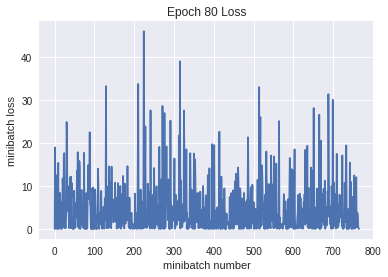

Iteration 61300: with minibatch training loss = 0.00523 and accuracy of 1
Iteration 61400: with minibatch training loss = 0.00105 and accuracy of 1
Iteration 61500: with minibatch training loss = 0.226 and accuracy of 0.98
Iteration 61600: with minibatch training loss = 0.021 and accuracy of 0.98
Iteration 61700: with minibatch training loss = 0.389 and accuracy of 0.92
Iteration 61800: with minibatch training loss = 0.0992 and accuracy of 0.97
Iteration 61900: with minibatch training loss = 0.0478 and accuracy of 0.98
Iteration 62000: with minibatch training loss = 0.112 and accuracy of 0.97
Epoch 81, Overall loss = 0.0937 and accuracy of 0.981


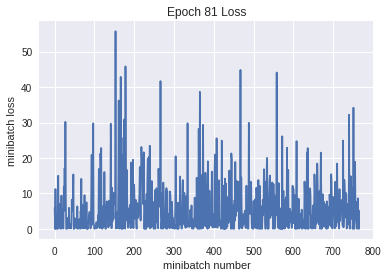

Iteration 62100: with minibatch training loss = 0.0929 and accuracy of 0.98
Iteration 62200: with minibatch training loss = 0.00537 and accuracy of 1
Iteration 62300: with minibatch training loss = 5.32e-06 and accuracy of 1
Iteration 62400: with minibatch training loss = 0.000102 and accuracy of 1
Iteration 62500: with minibatch training loss = 0.0831 and accuracy of 0.97
Iteration 62600: with minibatch training loss = 0.000231 and accuracy of 1
Iteration 62700: with minibatch training loss = 0.00325 and accuracy of 1
Iteration 62800: with minibatch training loss = 0.101 and accuracy of 0.98
Epoch 82, Overall loss = 0.0931 and accuracy of 0.981


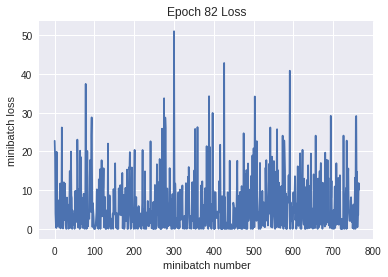

Iteration 62900: with minibatch training loss = 0.107 and accuracy of 0.97
Iteration 63000: with minibatch training loss = 0.0218 and accuracy of 0.98
Iteration 63100: with minibatch training loss = 0.0142 and accuracy of 0.98
Iteration 63200: with minibatch training loss = 0.224 and accuracy of 0.97
Iteration 63300: with minibatch training loss = 2.78e-06 and accuracy of 1
Iteration 63400: with minibatch training loss = 0.000577 and accuracy of 1
Iteration 63500: with minibatch training loss = 0.0429 and accuracy of 0.98
Epoch 83, Overall loss = 0.0831 and accuracy of 0.983


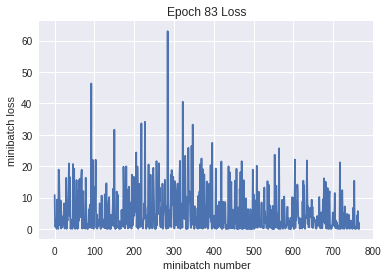

Iteration 63600: with minibatch training loss = 0.181 and accuracy of 0.98
Iteration 63700: with minibatch training loss = 0.000161 and accuracy of 1
Iteration 63800: with minibatch training loss = 0.1 and accuracy of 0.95
Iteration 63900: with minibatch training loss = 0.218 and accuracy of 0.98
Iteration 64000: with minibatch training loss = 0.107 and accuracy of 0.98
Iteration 64100: with minibatch training loss = 0.047 and accuracy of 0.97
Iteration 64200: with minibatch training loss = 0.0591 and accuracy of 0.98
Iteration 64300: with minibatch training loss = 0.0568 and accuracy of 0.98
Epoch 84, Overall loss = 0.0735 and accuracy of 0.985


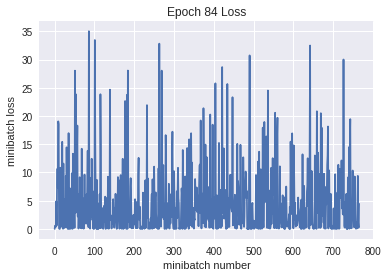

Iteration 64400: with minibatch training loss = 0.00277 and accuracy of 1
Iteration 64500: with minibatch training loss = 0.0552 and accuracy of 0.98
Iteration 64600: with minibatch training loss = 0.0236 and accuracy of 1
Iteration 64700: with minibatch training loss = 0.0925 and accuracy of 0.97
Iteration 64800: with minibatch training loss = 0.482 and accuracy of 0.95
Iteration 64900: with minibatch training loss = 0.244 and accuracy of 0.95
Iteration 65000: with minibatch training loss = 0.000358 and accuracy of 1
Iteration 65100: with minibatch training loss = 0.00121 and accuracy of 1
Epoch 85, Overall loss = 0.0918 and accuracy of 0.982


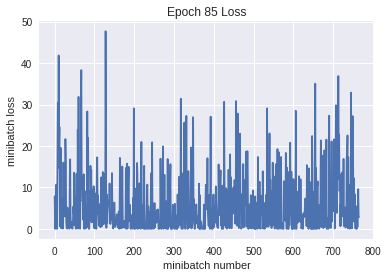

Iteration 65200: with minibatch training loss = 0.0143 and accuracy of 0.98
Iteration 65300: with minibatch training loss = 0.000316 and accuracy of 1
Iteration 65400: with minibatch training loss = 0.00381 and accuracy of 1
Iteration 65500: with minibatch training loss = 0.0268 and accuracy of 0.98
Iteration 65600: with minibatch training loss = 0.000132 and accuracy of 1
Iteration 65700: with minibatch training loss = 0.0581 and accuracy of 0.97
Iteration 65800: with minibatch training loss = 0.0527 and accuracy of 0.98
Epoch 86, Overall loss = 0.0811 and accuracy of 0.984


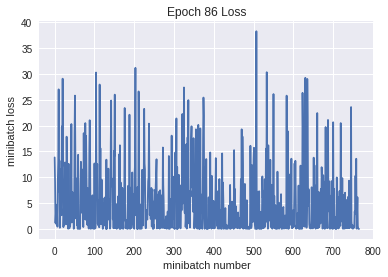

Iteration 65900: with minibatch training loss = 0.413 and accuracy of 0.94
Iteration 66000: with minibatch training loss = 0.0357 and accuracy of 0.98
Iteration 66100: with minibatch training loss = 0.608 and accuracy of 0.98
Iteration 66200: with minibatch training loss = 0.000214 and accuracy of 1
Iteration 66300: with minibatch training loss = 0.23 and accuracy of 0.98
Iteration 66400: with minibatch training loss = 0.142 and accuracy of 0.98
Iteration 66500: with minibatch training loss = 0.125 and accuracy of 0.95
Iteration 66600: with minibatch training loss = 0.201 and accuracy of 0.95
Epoch 87, Overall loss = 0.0942 and accuracy of 0.983


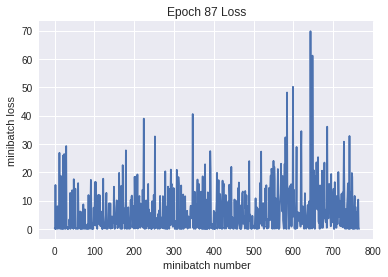

Iteration 66700: with minibatch training loss = 0.218 and accuracy of 0.97
Iteration 66800: with minibatch training loss = 0.000358 and accuracy of 1
Iteration 66900: with minibatch training loss = 0.00187 and accuracy of 1
Iteration 67000: with minibatch training loss = 0.0208 and accuracy of 0.98
Iteration 67100: with minibatch training loss = 0.193 and accuracy of 0.95
Iteration 67200: with minibatch training loss = 0.0795 and accuracy of 0.95
Iteration 67300: with minibatch training loss = 0.0734 and accuracy of 0.98
Iteration 67400: with minibatch training loss = 8.78e-05 and accuracy of 1
Epoch 88, Overall loss = 0.0894 and accuracy of 0.982


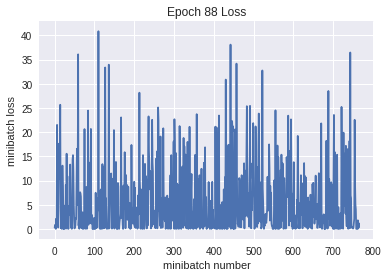

Iteration 67500: with minibatch training loss = 0.0765 and accuracy of 0.95
Iteration 67600: with minibatch training loss = 0.122 and accuracy of 0.98
Iteration 67700: with minibatch training loss = 0.144 and accuracy of 0.98
Iteration 67800: with minibatch training loss = 0.0739 and accuracy of 0.98
Iteration 67900: with minibatch training loss = 0.00769 and accuracy of 1
Iteration 68000: with minibatch training loss = 0.0713 and accuracy of 0.97
Iteration 68100: with minibatch training loss = 0.0246 and accuracy of 0.98
Epoch 89, Overall loss = 0.0739 and accuracy of 0.984


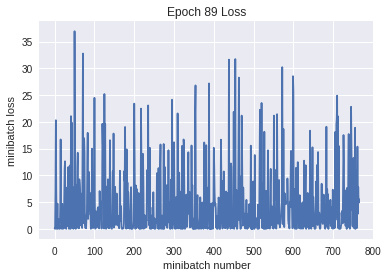

Iteration 68200: with minibatch training loss = 0.0172 and accuracy of 0.98
Iteration 68300: with minibatch training loss = 0.0157 and accuracy of 1
Iteration 68400: with minibatch training loss = 0.0252 and accuracy of 0.98
Iteration 68500: with minibatch training loss = 0.15 and accuracy of 0.97
Iteration 68600: with minibatch training loss = 0.249 and accuracy of 0.98
Iteration 68700: with minibatch training loss = 0.159 and accuracy of 0.98
Iteration 68800: with minibatch training loss = 0.352 and accuracy of 0.92
Iteration 68900: with minibatch training loss = 0.104 and accuracy of 0.98
Epoch 90, Overall loss = 0.102 and accuracy of 0.982


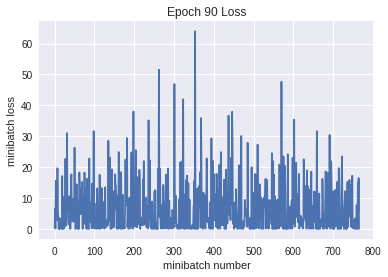

Iteration 69000: with minibatch training loss = 1.53e-05 and accuracy of 1
Iteration 69100: with minibatch training loss = 0.111 and accuracy of 0.97
Iteration 69200: with minibatch training loss = 0.163 and accuracy of 0.98
Iteration 69300: with minibatch training loss = 0.0527 and accuracy of 0.97
Iteration 69400: with minibatch training loss = 0.000196 and accuracy of 1
Iteration 69500: with minibatch training loss = 0.127 and accuracy of 0.98
Iteration 69600: with minibatch training loss = 0.354 and accuracy of 0.97
Iteration 69700: with minibatch training loss = 0.0147 and accuracy of 1
Epoch 91, Overall loss = 0.0867 and accuracy of 0.984


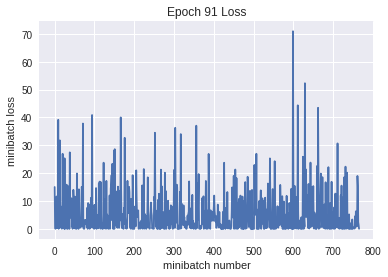

Iteration 69800: with minibatch training loss = 0.113 and accuracy of 0.98
Iteration 69900: with minibatch training loss = 0.0412 and accuracy of 0.97
Iteration 70000: with minibatch training loss = 0.0611 and accuracy of 0.98
Iteration 70100: with minibatch training loss = 0.0979 and accuracy of 0.97
Iteration 70200: with minibatch training loss = 0.0412 and accuracy of 0.98
Iteration 70300: with minibatch training loss = 0.00634 and accuracy of 1
Iteration 70400: with minibatch training loss = 0.0804 and accuracy of 0.98
Epoch 92, Overall loss = 0.0773 and accuracy of 0.985


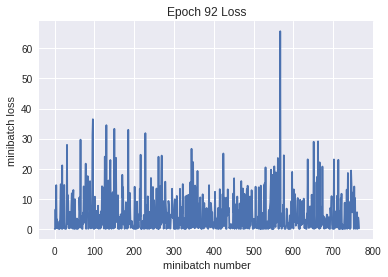

Iteration 70500: with minibatch training loss = 0.000332 and accuracy of 1
Iteration 70600: with minibatch training loss = 0.0449 and accuracy of 0.98
Iteration 70700: with minibatch training loss = 0.00157 and accuracy of 1
Iteration 70800: with minibatch training loss = 0.000408 and accuracy of 1
Iteration 70900: with minibatch training loss = 0.042 and accuracy of 0.98
Iteration 71000: with minibatch training loss = 0.124 and accuracy of 0.97
Iteration 71100: with minibatch training loss = 0.0264 and accuracy of 0.98
Iteration 71200: with minibatch training loss = 0.111 and accuracy of 0.95
Epoch 93, Overall loss = 0.0871 and accuracy of 0.983


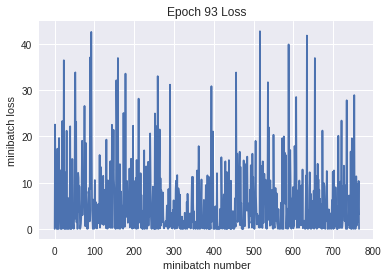

Iteration 71300: with minibatch training loss = 0.0429 and accuracy of 0.98
Iteration 71400: with minibatch training loss = 0.136 and accuracy of 0.97
Iteration 71500: with minibatch training loss = 0.134 and accuracy of 0.98
Iteration 71600: with minibatch training loss = 0.00356 and accuracy of 1
Iteration 71700: with minibatch training loss = 0.0128 and accuracy of 0.98
Iteration 71800: with minibatch training loss = 0.00511 and accuracy of 1
Iteration 71900: with minibatch training loss = 0.0264 and accuracy of 0.98
Iteration 72000: with minibatch training loss = 0.253 and accuracy of 0.95
Epoch 94, Overall loss = 0.0882 and accuracy of 0.984


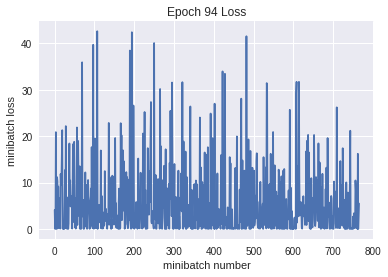

Iteration 72100: with minibatch training loss = 0.000273 and accuracy of 1
Iteration 72200: with minibatch training loss = 0.00178 and accuracy of 1
Iteration 72300: with minibatch training loss = 0.35 and accuracy of 0.97
Iteration 72400: with minibatch training loss = 0.366 and accuracy of 0.97
Iteration 72500: with minibatch training loss = 0.00232 and accuracy of 1
Iteration 72600: with minibatch training loss = 0.000192 and accuracy of 1
Iteration 72700: with minibatch training loss = 0.134 and accuracy of 0.97
Epoch 95, Overall loss = 0.0866 and accuracy of 0.985


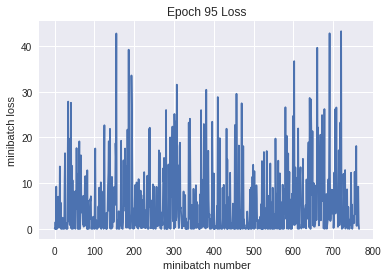

Iteration 72800: with minibatch training loss = 0.0156 and accuracy of 0.98
Iteration 72900: with minibatch training loss = 0.027 and accuracy of 0.98
Iteration 73000: with minibatch training loss = 5.3e-05 and accuracy of 1
Iteration 73100: with minibatch training loss = 0.205 and accuracy of 0.98
Iteration 73200: with minibatch training loss = 0.416 and accuracy of 0.98
Iteration 73300: with minibatch training loss = 4.83e-05 and accuracy of 1
Iteration 73400: with minibatch training loss = 0.00114 and accuracy of 1
Iteration 73500: with minibatch training loss = 0.00042 and accuracy of 1
Epoch 96, Overall loss = 0.0821 and accuracy of 0.985


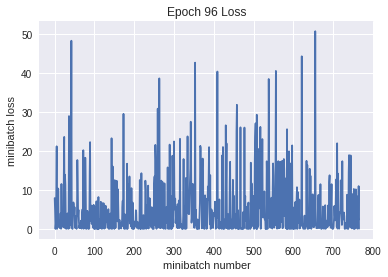

Iteration 73600: with minibatch training loss = 0.00789 and accuracy of 1
Iteration 73700: with minibatch training loss = 0.131 and accuracy of 0.98
Iteration 73800: with minibatch training loss = 0.000428 and accuracy of 1
Iteration 73900: with minibatch training loss = 0.14 and accuracy of 0.97
Iteration 74000: with minibatch training loss = 3.45e-06 and accuracy of 1
Iteration 74100: with minibatch training loss = 0.000254 and accuracy of 1
Iteration 74200: with minibatch training loss = 0.284 and accuracy of 0.95
Iteration 74300: with minibatch training loss = 0.00063 and accuracy of 1
Epoch 97, Overall loss = 0.0883 and accuracy of 0.984


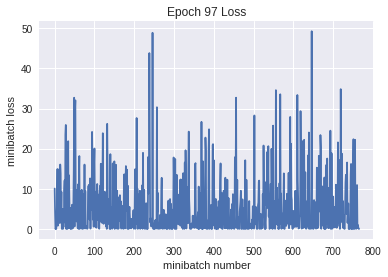

Iteration 74400: with minibatch training loss = 0.019 and accuracy of 0.98
Iteration 74500: with minibatch training loss = 0.106 and accuracy of 0.98
Iteration 74600: with minibatch training loss = 0.0012 and accuracy of 1
Iteration 74700: with minibatch training loss = 0.00429 and accuracy of 1
Iteration 74800: with minibatch training loss = 0.00301 and accuracy of 1
Iteration 74900: with minibatch training loss = 0.126 and accuracy of 0.98
Iteration 75000: with minibatch training loss = 0.071 and accuracy of 0.98
Epoch 98, Overall loss = 0.0773 and accuracy of 0.986


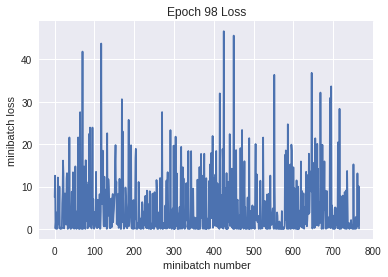

Iteration 75100: with minibatch training loss = 0.00709 and accuracy of 1
Iteration 75200: with minibatch training loss = 0.000936 and accuracy of 1
Iteration 75300: with minibatch training loss = 2.47e-05 and accuracy of 1
Iteration 75400: with minibatch training loss = 0.0466 and accuracy of 0.97
Iteration 75500: with minibatch training loss = 0.0688 and accuracy of 0.98
Iteration 75600: with minibatch training loss = 5.08e-05 and accuracy of 1
Iteration 75700: with minibatch training loss = 0.0501 and accuracy of 0.98
Iteration 75800: with minibatch training loss = 0.0142 and accuracy of 0.98
Epoch 99, Overall loss = 0.0759 and accuracy of 0.986


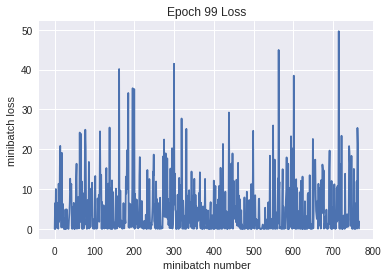

Iteration 75900: with minibatch training loss = 0.0998 and accuracy of 0.98
Iteration 76000: with minibatch training loss = 0.00584 and accuracy of 1
Iteration 76100: with minibatch training loss = 0.00114 and accuracy of 1
Iteration 76200: with minibatch training loss = 0.46 and accuracy of 0.95
Iteration 76300: with minibatch training loss = 0.0145 and accuracy of 0.98
Iteration 76400: with minibatch training loss = 0.00257 and accuracy of 1
Iteration 76500: with minibatch training loss = 0.144 and accuracy of 0.97
Epoch 100, Overall loss = 0.0894 and accuracy of 0.984


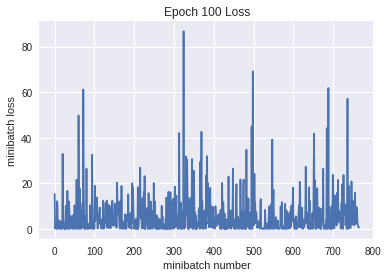

Validation
Epoch 1, Overall loss = 6.12 and accuracy of 0.726


(6.119840881347656, 0.726)

In [89]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,100,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [93]:
def my_model20(X,y,is_training):
  
    Wconv1 = tf.get_variable("Wconv1", shape=[7, 7, 3, 16])
    bconv1 = tf.get_variable("bconv1", shape=[16])
    Wconv2 = tf.get_variable("Wconv2", shape=[3, 3, 16, 32])
    bconv2 = tf.get_variable("bconv2", shape=[32])
    Wconv3 = tf.get_variable("Wconv3", shape=[3, 3, 32, 64])
    bconv3 = tf.get_variable("bconv3", shape=[64])
    Wconv4 = tf.get_variable("Wconv4", shape=[3, 3, 64, 80])
    bconv4 = tf.get_variable("bconv4", shape=[80])
    Waff1 = tf.get_variable("Waff1", shape=[1280, 500])
    baff1 = tf.get_variable("baff1", shape=[500])
    Waff2 = tf.get_variable("Waff2", shape=[500, 10])
    baff2 = tf.get_variable("baff2", shape=[10])
    
    
    # conv7x7 stride1 padding valid: (32 - 7 + 1 ) / 1  = 26 -> 16*26*26 = 10816
    c1 = tf.nn.conv2d(X, Wconv1, strides=[1,1,1,1], padding='VALID') + bconv1
    r1 = tf.nn.relu(c1)
    b1 = tf.layers.batch_normalization(r1, training=is_training) # training?
    ## maxpool2x2 stride2 padding valid:(26 - 2 + 1 ) / 2  = 12.5 -> 16*13*13 = 2704
    #p1 = tf.nn.max_pool(b1,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p1 = b1
    # conv3x3 stride1 padding valid: (26 - 3 + 1 ) / 1  = 24 -> 32*24*24 = 18432
    c2 = tf.nn.conv2d(p1, Wconv2, strides=[1,1,1,1], padding='VALID') + bconv2
    r2 = tf.nn.relu(c2)
    b2 = tf.layers.batch_normalization(r2, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(24 - 2 + 1 ) / 2  = 11.5 -> 32*12*12 = 4608
    p2 = tf.nn.max_pool(b2,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    #p2 = b2
    # conv3x3 stride1 padding valid: (12 - 3 + 1 ) / 1  = 10 -> 64*10*10 = 6400
    c3 = tf.nn.conv2d(p2, Wconv3, strides=[1,1,1,1], padding='VALID') + bconv3
    r3 = tf.nn.relu(c3)
    b3 = tf.layers.batch_normalization(r3, training=is_training) # training?
    p3 = b3
    # conv3x3 stride1 padding valid: (10 - 3 + 1 ) / 1  = 8 -> 80*8*8 = 5120
    c4 = tf.nn.conv2d(p3, Wconv4, strides=[1,1,1,1], padding='VALID') + bconv4
    r4 = tf.nn.relu(c4)
    drop_out = tf.layers.dropout(r4, training=is_training)
    b4 = tf.layers.batch_normalization(drop_out, training=is_training) # training?
    # maxpool2x2 stride2 padding valid:(8 - 2 + 1 ) / 2  = 3.5 -> 80*4*4 = 1280
    p4 = tf.nn.max_pool(b4,ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    p4_flat = tf.reshape(p4,[-1,1280])
    a1 = tf.matmul(p4_flat,Waff1) + baff1
    r3 = tf.nn.relu(a1)
    a2 = tf.matmul(r3,Waff2) + baff2
    y_out = a2
    return y_out
    

tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model20(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(5e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 3.25 and accuracy of 0.11
Iteration 100: with minibatch training loss = 1.87 and accuracy of 0.23
Iteration 200: with minibatch training loss = 1.54 and accuracy of 0.48
Iteration 300: with minibatch training loss = 2.07 and accuracy of 0.28
Iteration 400: with minibatch training loss = 1.58 and accuracy of 0.41
Iteration 500: with minibatch training loss = 1.37 and accuracy of 0.55
Iteration 600: with minibatch training loss = 1.56 and accuracy of 0.44
Iteration 700: with minibatch training loss = 1.5 and accuracy of 0.44
Epoch 1, Overall loss = 1.7 and accuracy of 0.412


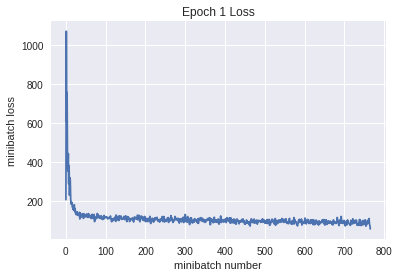

Iteration 800: with minibatch training loss = 1.55 and accuracy of 0.45
Iteration 900: with minibatch training loss = 1.47 and accuracy of 0.47
Iteration 1000: with minibatch training loss = 1.29 and accuracy of 0.55
Iteration 1100: with minibatch training loss = 1.42 and accuracy of 0.55
Iteration 1200: with minibatch training loss = 1.36 and accuracy of 0.52
Iteration 1300: with minibatch training loss = 1.31 and accuracy of 0.52
Iteration 1400: with minibatch training loss = 1.12 and accuracy of 0.61
Iteration 1500: with minibatch training loss = 1.21 and accuracy of 0.58
Epoch 2, Overall loss = 1.26 and accuracy of 0.548


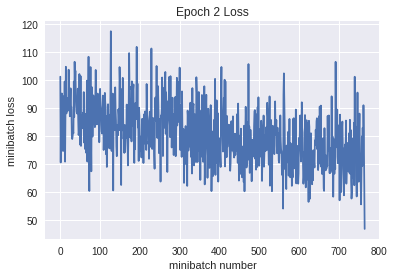

Iteration 1600: with minibatch training loss = 1.08 and accuracy of 0.62
Iteration 1700: with minibatch training loss = 1.02 and accuracy of 0.58
Iteration 1800: with minibatch training loss = 1.17 and accuracy of 0.59
Iteration 1900: with minibatch training loss = 1.08 and accuracy of 0.64
Iteration 2000: with minibatch training loss = 0.949 and accuracy of 0.7
Iteration 2100: with minibatch training loss = 0.742 and accuracy of 0.7
Iteration 2200: with minibatch training loss = 0.903 and accuracy of 0.66
Epoch 3, Overall loss = 1.03 and accuracy of 0.635


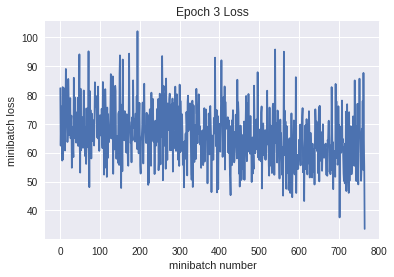

Iteration 2300: with minibatch training loss = 0.911 and accuracy of 0.66
Iteration 2400: with minibatch training loss = 0.974 and accuracy of 0.7
Iteration 2500: with minibatch training loss = 0.698 and accuracy of 0.73
Iteration 2600: with minibatch training loss = 1.1 and accuracy of 0.67
Iteration 2700: with minibatch training loss = 0.777 and accuracy of 0.73
Iteration 2800: with minibatch training loss = 0.946 and accuracy of 0.7
Iteration 2900: with minibatch training loss = 0.872 and accuracy of 0.72
Iteration 3000: with minibatch training loss = 0.541 and accuracy of 0.84
Epoch 4, Overall loss = 0.896 and accuracy of 0.685


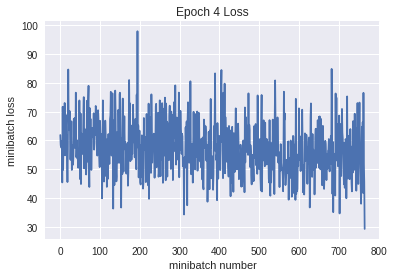

Iteration 3100: with minibatch training loss = 0.936 and accuracy of 0.62
Iteration 3200: with minibatch training loss = 0.708 and accuracy of 0.72
Iteration 3300: with minibatch training loss = 0.837 and accuracy of 0.72
Iteration 3400: with minibatch training loss = 0.726 and accuracy of 0.73
Iteration 3500: with minibatch training loss = 0.66 and accuracy of 0.72
Iteration 3600: with minibatch training loss = 0.805 and accuracy of 0.73
Iteration 3700: with minibatch training loss = 0.71 and accuracy of 0.75
Iteration 3800: with minibatch training loss = 1.04 and accuracy of 0.66
Epoch 5, Overall loss = 0.812 and accuracy of 0.716


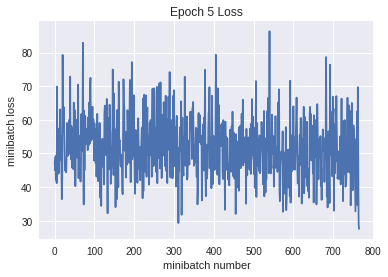

Iteration 3900: with minibatch training loss = 0.737 and accuracy of 0.73
Iteration 4000: with minibatch training loss = 0.714 and accuracy of 0.72
Iteration 4100: with minibatch training loss = 1.03 and accuracy of 0.62
Iteration 4200: with minibatch training loss = 0.476 and accuracy of 0.83
Iteration 4300: with minibatch training loss = 0.834 and accuracy of 0.73
Iteration 4400: with minibatch training loss = 0.707 and accuracy of 0.77
Iteration 4500: with minibatch training loss = 0.761 and accuracy of 0.69
Epoch 6, Overall loss = 0.748 and accuracy of 0.74


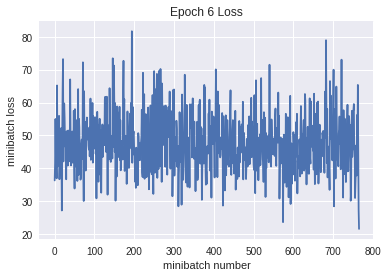

Iteration 4600: with minibatch training loss = 0.707 and accuracy of 0.73
Iteration 4700: with minibatch training loss = 0.548 and accuracy of 0.83
Iteration 4800: with minibatch training loss = 0.555 and accuracy of 0.81
Iteration 4900: with minibatch training loss = 0.752 and accuracy of 0.7
Iteration 5000: with minibatch training loss = 0.793 and accuracy of 0.69
Iteration 5100: with minibatch training loss = 0.385 and accuracy of 0.86
Iteration 5200: with minibatch training loss = 0.495 and accuracy of 0.81
Iteration 5300: with minibatch training loss = 0.721 and accuracy of 0.7
Epoch 7, Overall loss = 0.695 and accuracy of 0.756


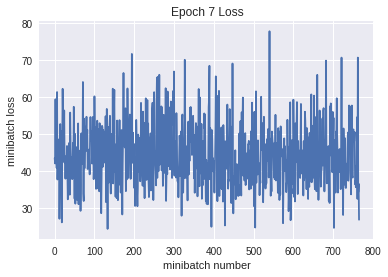

Iteration 5400: with minibatch training loss = 0.642 and accuracy of 0.8
Iteration 5500: with minibatch training loss = 0.746 and accuracy of 0.77
Iteration 5600: with minibatch training loss = 0.806 and accuracy of 0.77
Iteration 5700: with minibatch training loss = 0.703 and accuracy of 0.77
Iteration 5800: with minibatch training loss = 0.495 and accuracy of 0.84
Iteration 5900: with minibatch training loss = 0.605 and accuracy of 0.83
Iteration 6000: with minibatch training loss = 0.553 and accuracy of 0.8
Iteration 6100: with minibatch training loss = 0.542 and accuracy of 0.81
Epoch 8, Overall loss = 0.648 and accuracy of 0.775


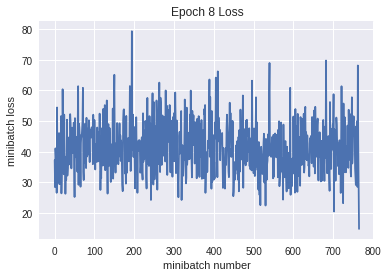

Iteration 6200: with minibatch training loss = 0.505 and accuracy of 0.83
Iteration 6300: with minibatch training loss = 0.738 and accuracy of 0.72
Iteration 6400: with minibatch training loss = 0.609 and accuracy of 0.8
Iteration 6500: with minibatch training loss = 0.603 and accuracy of 0.77
Iteration 6600: with minibatch training loss = 0.823 and accuracy of 0.75
Iteration 6700: with minibatch training loss = 0.678 and accuracy of 0.78
Iteration 6800: with minibatch training loss = 0.573 and accuracy of 0.8
Epoch 9, Overall loss = 0.602 and accuracy of 0.791


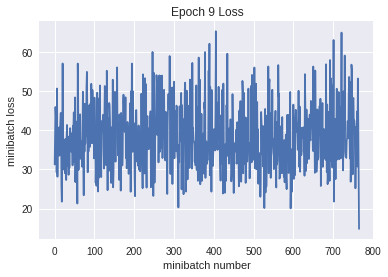

Iteration 6900: with minibatch training loss = 0.793 and accuracy of 0.72
Iteration 7000: with minibatch training loss = 0.491 and accuracy of 0.81
Iteration 7100: with minibatch training loss = 0.551 and accuracy of 0.81
Iteration 7200: with minibatch training loss = 0.604 and accuracy of 0.8
Iteration 7300: with minibatch training loss = 0.754 and accuracy of 0.7
Iteration 7400: with minibatch training loss = 0.963 and accuracy of 0.69
Iteration 7500: with minibatch training loss = 0.635 and accuracy of 0.8
Iteration 7600: with minibatch training loss = 0.43 and accuracy of 0.78
Epoch 10, Overall loss = 0.57 and accuracy of 0.8


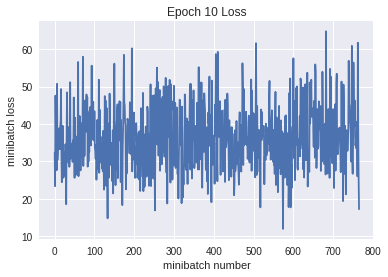

Validation
Epoch 1, Overall loss = 0.88 and accuracy of 0.696


(0.8802007040977478, 0.696)

In [94]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [95]:
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model20(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(5e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

Training
Iteration 0: with minibatch training loss = 4.22 and accuracy of 0.047
Iteration 100: with minibatch training loss = 1.62 and accuracy of 0.34
Iteration 200: with minibatch training loss = 1.4 and accuracy of 0.55
Iteration 300: with minibatch training loss = 1.82 and accuracy of 0.27
Iteration 400: with minibatch training loss = 1.55 and accuracy of 0.38
Iteration 500: with minibatch training loss = 1.73 and accuracy of 0.31
Iteration 600: with minibatch training loss = 1.52 and accuracy of 0.47
Iteration 700: with minibatch training loss = 1.33 and accuracy of 0.52
Epoch 1, Overall loss = 1.74 and accuracy of 0.383


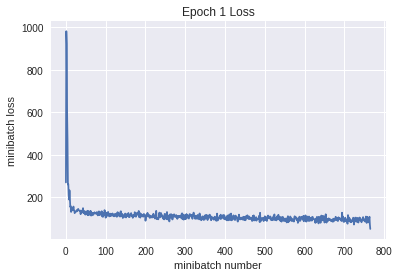

Iteration 800: with minibatch training loss = 1.4 and accuracy of 0.52
Iteration 900: with minibatch training loss = 1.34 and accuracy of 0.5
Iteration 1000: with minibatch training loss = 1.56 and accuracy of 0.48
Iteration 1100: with minibatch training loss = 1.3 and accuracy of 0.5
Iteration 1200: with minibatch training loss = 1.17 and accuracy of 0.59
Iteration 1300: with minibatch training loss = 1.49 and accuracy of 0.47
Iteration 1400: with minibatch training loss = 1.12 and accuracy of 0.64
Iteration 1500: with minibatch training loss = 1.17 and accuracy of 0.64
Epoch 2, Overall loss = 1.3 and accuracy of 0.537


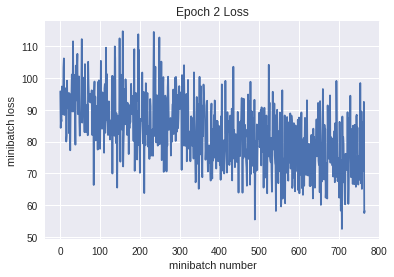

Iteration 1600: with minibatch training loss = 1.28 and accuracy of 0.58
Iteration 1700: with minibatch training loss = 1.16 and accuracy of 0.55
Iteration 1800: with minibatch training loss = 1.03 and accuracy of 0.66
Iteration 1900: with minibatch training loss = 1.12 and accuracy of 0.59
Iteration 2000: with minibatch training loss = 0.81 and accuracy of 0.67
Iteration 2100: with minibatch training loss = 1.08 and accuracy of 0.64
Iteration 2200: with minibatch training loss = 0.821 and accuracy of 0.67
Epoch 3, Overall loss = 1.08 and accuracy of 0.621


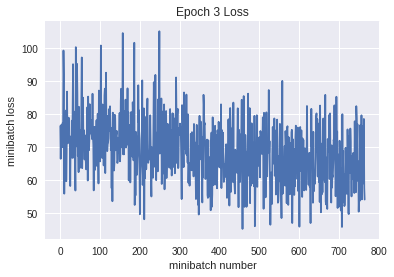

Iteration 2300: with minibatch training loss = 0.893 and accuracy of 0.72
Iteration 2400: with minibatch training loss = 1.26 and accuracy of 0.56
Iteration 2500: with minibatch training loss = 0.841 and accuracy of 0.72
Iteration 2600: with minibatch training loss = 1.01 and accuracy of 0.58
Iteration 2700: with minibatch training loss = 0.805 and accuracy of 0.7
Iteration 2800: with minibatch training loss = 0.821 and accuracy of 0.67
Iteration 2900: with minibatch training loss = 0.944 and accuracy of 0.62
Iteration 3000: with minibatch training loss = 0.982 and accuracy of 0.67
Epoch 4, Overall loss = 0.94 and accuracy of 0.67


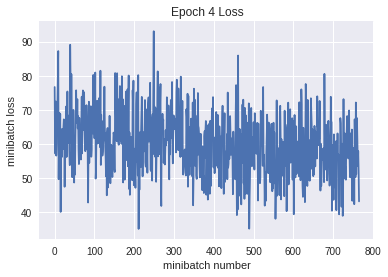

Iteration 3100: with minibatch training loss = 1.07 and accuracy of 0.59
Iteration 3200: with minibatch training loss = 0.769 and accuracy of 0.72
Iteration 3300: with minibatch training loss = 1.04 and accuracy of 0.59
Iteration 3400: with minibatch training loss = 0.931 and accuracy of 0.69
Iteration 3500: with minibatch training loss = 0.847 and accuracy of 0.67
Iteration 3600: with minibatch training loss = 0.905 and accuracy of 0.69
Iteration 3700: with minibatch training loss = 0.939 and accuracy of 0.66
Iteration 3800: with minibatch training loss = 0.814 and accuracy of 0.72
Epoch 5, Overall loss = 0.852 and accuracy of 0.701


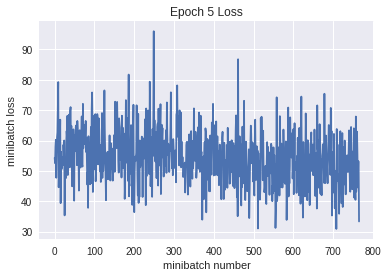

Iteration 3900: with minibatch training loss = 0.828 and accuracy of 0.69
Iteration 4000: with minibatch training loss = 0.824 and accuracy of 0.72
Iteration 4100: with minibatch training loss = 0.849 and accuracy of 0.72
Iteration 4200: with minibatch training loss = 0.654 and accuracy of 0.75
Iteration 4300: with minibatch training loss = 0.787 and accuracy of 0.73
Iteration 4400: with minibatch training loss = 0.806 and accuracy of 0.7
Iteration 4500: with minibatch training loss = 0.616 and accuracy of 0.8
Epoch 6, Overall loss = 0.787 and accuracy of 0.724


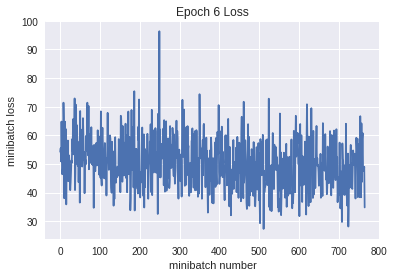

Iteration 4600: with minibatch training loss = 0.812 and accuracy of 0.73
Iteration 4700: with minibatch training loss = 0.593 and accuracy of 0.78
Iteration 4800: with minibatch training loss = 0.797 and accuracy of 0.72
Iteration 4900: with minibatch training loss = 0.766 and accuracy of 0.7
Iteration 5000: with minibatch training loss = 0.863 and accuracy of 0.75
Iteration 5100: with minibatch training loss = 0.86 and accuracy of 0.72
Iteration 5200: with minibatch training loss = 0.673 and accuracy of 0.8
Iteration 5300: with minibatch training loss = 0.548 and accuracy of 0.81
Epoch 7, Overall loss = 0.739 and accuracy of 0.741


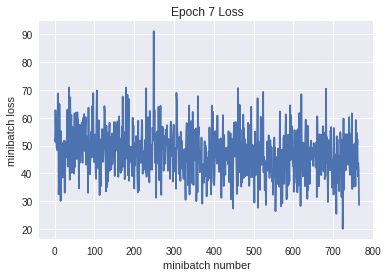

Iteration 5400: with minibatch training loss = 0.56 and accuracy of 0.84
Iteration 5500: with minibatch training loss = 0.795 and accuracy of 0.7
Iteration 5600: with minibatch training loss = 0.592 and accuracy of 0.78
Iteration 5700: with minibatch training loss = 0.773 and accuracy of 0.77
Iteration 5800: with minibatch training loss = 0.671 and accuracy of 0.8
Iteration 5900: with minibatch training loss = 0.821 and accuracy of 0.67
Iteration 6000: with minibatch training loss = 0.464 and accuracy of 0.83
Iteration 6100: with minibatch training loss = 0.538 and accuracy of 0.86
Epoch 8, Overall loss = 0.694 and accuracy of 0.757


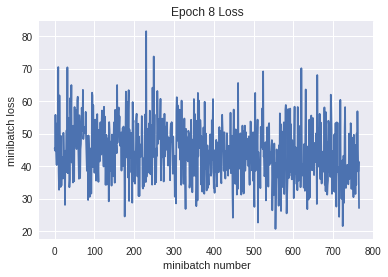

Iteration 6200: with minibatch training loss = 0.581 and accuracy of 0.84
Iteration 6300: with minibatch training loss = 0.502 and accuracy of 0.77
Iteration 6400: with minibatch training loss = 0.772 and accuracy of 0.75
Iteration 6500: with minibatch training loss = 0.639 and accuracy of 0.72
Iteration 6600: with minibatch training loss = 0.879 and accuracy of 0.7
Iteration 6700: with minibatch training loss = 0.437 and accuracy of 0.81
Iteration 6800: with minibatch training loss = 0.474 and accuracy of 0.83
Epoch 9, Overall loss = 0.652 and accuracy of 0.774


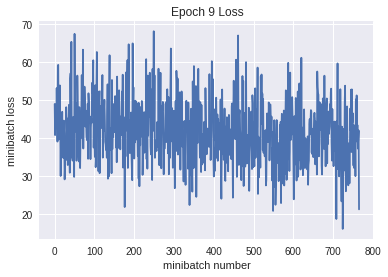

Iteration 6900: with minibatch training loss = 0.623 and accuracy of 0.81
Iteration 7000: with minibatch training loss = 0.779 and accuracy of 0.75
Iteration 7100: with minibatch training loss = 0.827 and accuracy of 0.73
Iteration 7200: with minibatch training loss = 0.806 and accuracy of 0.72
Iteration 7300: with minibatch training loss = 0.54 and accuracy of 0.86
Iteration 7400: with minibatch training loss = 0.678 and accuracy of 0.73
Iteration 7500: with minibatch training loss = 0.791 and accuracy of 0.75
Iteration 7600: with minibatch training loss = 0.645 and accuracy of 0.77
Epoch 10, Overall loss = 0.609 and accuracy of 0.79


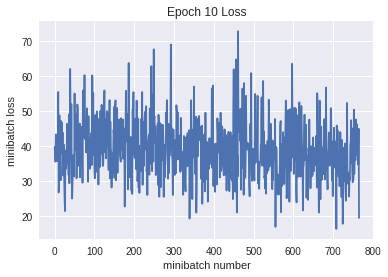

Validation
Epoch 1, Overall loss = 0.949 and accuracy of 0.687
Training
Iteration 0: with minibatch training loss = 0.919 and accuracy of 0.62
Iteration 100: with minibatch training loss = 0.654 and accuracy of 0.77
Iteration 200: with minibatch training loss = 0.894 and accuracy of 0.75
Iteration 300: with minibatch training loss = 0.531 and accuracy of 0.73
Iteration 400: with minibatch training loss = 0.548 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.597 and accuracy of 0.8
Iteration 600: with minibatch training loss = 0.706 and accuracy of 0.78
Iteration 700: with minibatch training loss = 0.708 and accuracy of 0.7
Epoch 1, Overall loss = 0.624 and accuracy of 0.784


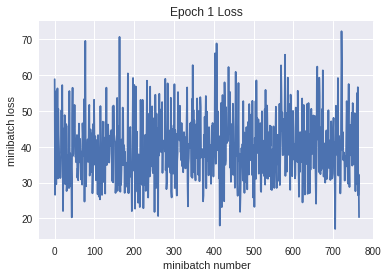

Iteration 800: with minibatch training loss = 0.662 and accuracy of 0.77
Iteration 900: with minibatch training loss = 0.675 and accuracy of 0.77
Iteration 1000: with minibatch training loss = 0.585 and accuracy of 0.83
Iteration 1100: with minibatch training loss = 0.434 and accuracy of 0.84
Iteration 1200: with minibatch training loss = 0.593 and accuracy of 0.81
Iteration 1300: with minibatch training loss = 0.623 and accuracy of 0.77
Iteration 1400: with minibatch training loss = 0.487 and accuracy of 0.84
Iteration 1500: with minibatch training loss = 0.732 and accuracy of 0.7
Epoch 2, Overall loss = 0.573 and accuracy of 0.8


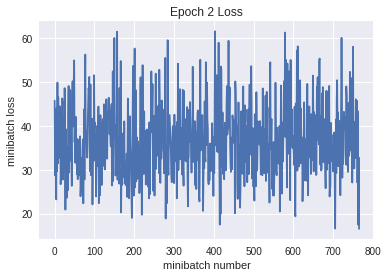

Iteration 1600: with minibatch training loss = 0.567 and accuracy of 0.81
Iteration 1700: with minibatch training loss = 0.316 and accuracy of 0.88
Iteration 1800: with minibatch training loss = 0.663 and accuracy of 0.8
Iteration 1900: with minibatch training loss = 0.406 and accuracy of 0.86
Iteration 2000: with minibatch training loss = 0.626 and accuracy of 0.8
Iteration 2100: with minibatch training loss = 0.568 and accuracy of 0.78
Iteration 2200: with minibatch training loss = 0.454 and accuracy of 0.78
Epoch 3, Overall loss = 0.537 and accuracy of 0.811


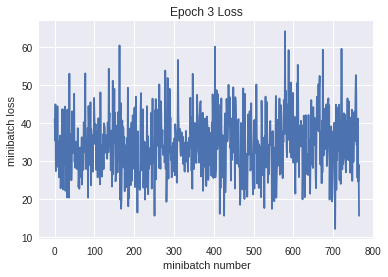

Iteration 2300: with minibatch training loss = 0.643 and accuracy of 0.77
Iteration 2400: with minibatch training loss = 0.535 and accuracy of 0.73
Iteration 2500: with minibatch training loss = 0.379 and accuracy of 0.83
Iteration 2600: with minibatch training loss = 0.265 and accuracy of 0.92
Iteration 2700: with minibatch training loss = 0.639 and accuracy of 0.75
Iteration 2800: with minibatch training loss = 0.372 and accuracy of 0.88
Iteration 2900: with minibatch training loss = 0.509 and accuracy of 0.8
Iteration 3000: with minibatch training loss = 0.687 and accuracy of 0.73
Epoch 4, Overall loss = 0.514 and accuracy of 0.823


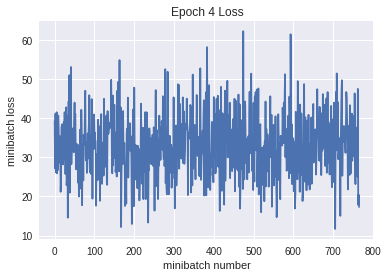

Iteration 3100: with minibatch training loss = 0.248 and accuracy of 0.91
Iteration 3200: with minibatch training loss = 0.737 and accuracy of 0.7
Iteration 3300: with minibatch training loss = 0.313 and accuracy of 0.91
Iteration 3400: with minibatch training loss = 0.534 and accuracy of 0.81
Iteration 3500: with minibatch training loss = 0.46 and accuracy of 0.88
Iteration 3600: with minibatch training loss = 0.343 and accuracy of 0.86
Iteration 3700: with minibatch training loss = 0.449 and accuracy of 0.88
Iteration 3800: with minibatch training loss = 0.486 and accuracy of 0.84
Epoch 5, Overall loss = 0.486 and accuracy of 0.831


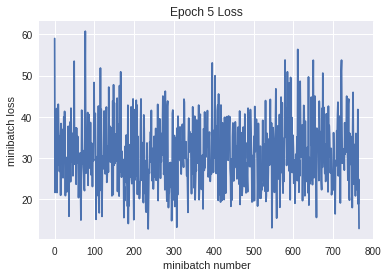

Iteration 3900: with minibatch training loss = 0.345 and accuracy of 0.88
Iteration 4000: with minibatch training loss = 0.43 and accuracy of 0.88
Iteration 4100: with minibatch training loss = 0.389 and accuracy of 0.88
Iteration 4200: with minibatch training loss = 0.487 and accuracy of 0.8
Iteration 4300: with minibatch training loss = 0.435 and accuracy of 0.8
Iteration 4400: with minibatch training loss = 0.478 and accuracy of 0.86
Iteration 4500: with minibatch training loss = 0.505 and accuracy of 0.8
Epoch 6, Overall loss = 0.461 and accuracy of 0.841


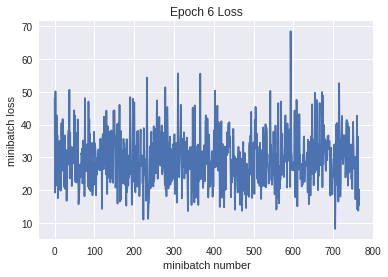

Iteration 4600: with minibatch training loss = 0.334 and accuracy of 0.89
Iteration 4700: with minibatch training loss = 0.295 and accuracy of 0.92
Iteration 4800: with minibatch training loss = 0.599 and accuracy of 0.77
Iteration 4900: with minibatch training loss = 0.35 and accuracy of 0.86
Iteration 5000: with minibatch training loss = 0.394 and accuracy of 0.86
Iteration 5100: with minibatch training loss = 0.421 and accuracy of 0.88
Iteration 5200: with minibatch training loss = 0.245 and accuracy of 0.88
Iteration 5300: with minibatch training loss = 0.248 and accuracy of 0.95
Epoch 7, Overall loss = 0.442 and accuracy of 0.847


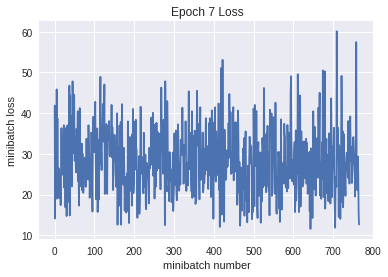

Iteration 5400: with minibatch training loss = 0.283 and accuracy of 0.86
Iteration 5500: with minibatch training loss = 0.604 and accuracy of 0.8
Iteration 5600: with minibatch training loss = 0.356 and accuracy of 0.84
Iteration 5700: with minibatch training loss = 0.438 and accuracy of 0.83
Iteration 5800: with minibatch training loss = 0.466 and accuracy of 0.78
Iteration 5900: with minibatch training loss = 0.342 and accuracy of 0.88
Iteration 6000: with minibatch training loss = 0.673 and accuracy of 0.77
Iteration 6100: with minibatch training loss = 0.417 and accuracy of 0.84
Epoch 8, Overall loss = 0.425 and accuracy of 0.853


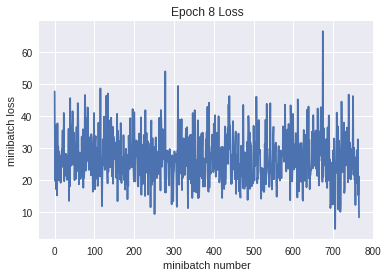

Iteration 6200: with minibatch training loss = 0.225 and accuracy of 0.91
Iteration 6300: with minibatch training loss = 0.445 and accuracy of 0.86
Iteration 6400: with minibatch training loss = 0.621 and accuracy of 0.83
Iteration 6500: with minibatch training loss = 0.622 and accuracy of 0.8
Iteration 6600: with minibatch training loss = 0.275 and accuracy of 0.92
Iteration 6700: with minibatch training loss = 0.551 and accuracy of 0.84
Iteration 6800: with minibatch training loss = 0.449 and accuracy of 0.88
Epoch 9, Overall loss = 0.405 and accuracy of 0.861


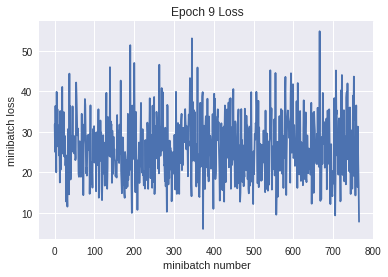

Iteration 6900: with minibatch training loss = 0.382 and accuracy of 0.84
Iteration 7000: with minibatch training loss = 0.334 and accuracy of 0.88
Iteration 7100: with minibatch training loss = 0.409 and accuracy of 0.89
Iteration 7200: with minibatch training loss = 0.394 and accuracy of 0.83
Iteration 7300: with minibatch training loss = 0.475 and accuracy of 0.86
Iteration 7400: with minibatch training loss = 0.382 and accuracy of 0.88
Iteration 7500: with minibatch training loss = 0.436 and accuracy of 0.86
Iteration 7600: with minibatch training loss = 0.28 and accuracy of 0.89
Epoch 10, Overall loss = 0.383 and accuracy of 0.866


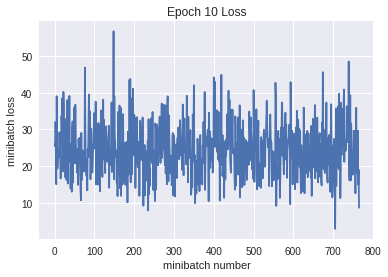

Validation
Epoch 1, Overall loss = 0.927 and accuracy of 0.724
Training
Iteration 0: with minibatch training loss = 0.49 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.312 and accuracy of 0.88
Iteration 200: with minibatch training loss = 0.231 and accuracy of 0.94
Iteration 300: with minibatch training loss = 0.451 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.614 and accuracy of 0.84
Iteration 500: with minibatch training loss = 0.305 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.753 and accuracy of 0.75
Iteration 700: with minibatch training loss = 0.489 and accuracy of 0.83
Epoch 1, Overall loss = 0.425 and accuracy of 0.856


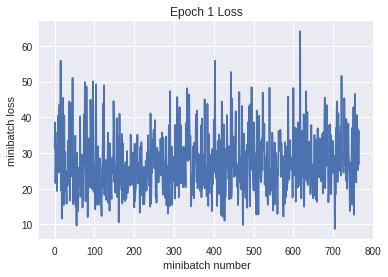

Iteration 800: with minibatch training loss = 0.51 and accuracy of 0.83
Iteration 900: with minibatch training loss = 0.402 and accuracy of 0.91
Iteration 1000: with minibatch training loss = 0.66 and accuracy of 0.83
Iteration 1100: with minibatch training loss = 0.346 and accuracy of 0.83
Iteration 1200: with minibatch training loss = 0.437 and accuracy of 0.84
Iteration 1300: with minibatch training loss = 0.502 and accuracy of 0.84
Iteration 1400: with minibatch training loss = 0.518 and accuracy of 0.81
Iteration 1500: with minibatch training loss = 0.285 and accuracy of 0.88
Epoch 2, Overall loss = 0.392 and accuracy of 0.865


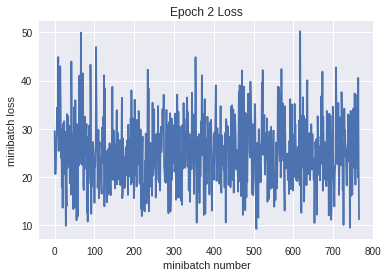

Iteration 1600: with minibatch training loss = 0.272 and accuracy of 0.91
Iteration 1700: with minibatch training loss = 0.382 and accuracy of 0.88
Iteration 1800: with minibatch training loss = 0.391 and accuracy of 0.89
Iteration 1900: with minibatch training loss = 0.442 and accuracy of 0.83
Iteration 2000: with minibatch training loss = 0.185 and accuracy of 0.91
Iteration 2100: with minibatch training loss = 0.46 and accuracy of 0.86
Iteration 2200: with minibatch training loss = 0.354 and accuracy of 0.91
Epoch 3, Overall loss = 0.363 and accuracy of 0.875


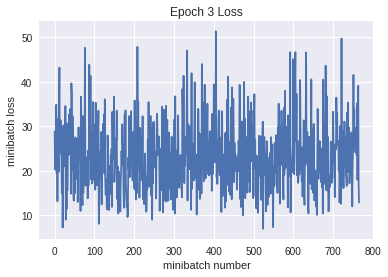

Iteration 2300: with minibatch training loss = 0.279 and accuracy of 0.91
Iteration 2400: with minibatch training loss = 0.267 and accuracy of 0.95
Iteration 2500: with minibatch training loss = 0.276 and accuracy of 0.91
Iteration 2600: with minibatch training loss = 0.206 and accuracy of 0.95
Iteration 2700: with minibatch training loss = 0.395 and accuracy of 0.84
Iteration 2800: with minibatch training loss = 0.321 and accuracy of 0.89
Iteration 2900: with minibatch training loss = 0.261 and accuracy of 0.92
Iteration 3000: with minibatch training loss = 0.251 and accuracy of 0.88
Epoch 4, Overall loss = 0.352 and accuracy of 0.879


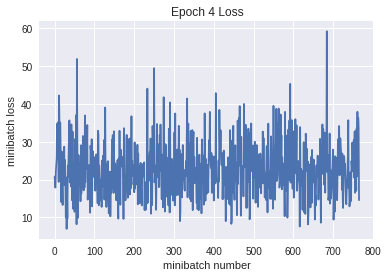

Iteration 3100: with minibatch training loss = 0.366 and accuracy of 0.83
Iteration 3200: with minibatch training loss = 0.122 and accuracy of 0.97
Iteration 3300: with minibatch training loss = 0.461 and accuracy of 0.86
Iteration 3400: with minibatch training loss = 0.373 and accuracy of 0.84
Iteration 3500: with minibatch training loss = 0.396 and accuracy of 0.84
Iteration 3600: with minibatch training loss = 0.373 and accuracy of 0.88
Iteration 3700: with minibatch training loss = 0.425 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.462 and accuracy of 0.81
Epoch 5, Overall loss = 0.346 and accuracy of 0.881


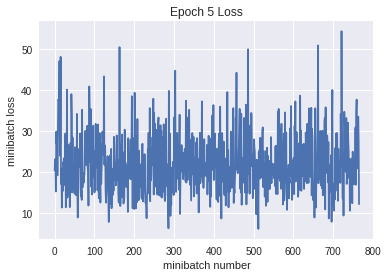

Iteration 3900: with minibatch training loss = 0.226 and accuracy of 0.89
Iteration 4000: with minibatch training loss = 0.262 and accuracy of 0.88
Iteration 4100: with minibatch training loss = 0.331 and accuracy of 0.86
Iteration 4200: with minibatch training loss = 0.246 and accuracy of 0.92
Iteration 4300: with minibatch training loss = 0.231 and accuracy of 0.91
Iteration 4400: with minibatch training loss = 0.36 and accuracy of 0.86
Iteration 4500: with minibatch training loss = 0.239 and accuracy of 0.89
Epoch 6, Overall loss = 0.335 and accuracy of 0.884


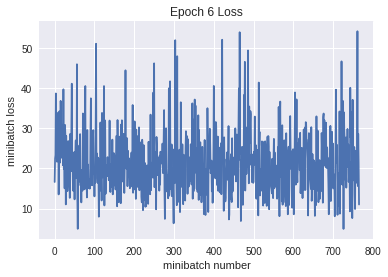

Iteration 4600: with minibatch training loss = 0.351 and accuracy of 0.84
Iteration 4700: with minibatch training loss = 0.373 and accuracy of 0.84
Iteration 4800: with minibatch training loss = 0.375 and accuracy of 0.91
Iteration 4900: with minibatch training loss = 0.344 and accuracy of 0.88
Iteration 5000: with minibatch training loss = 0.418 and accuracy of 0.92
Iteration 5100: with minibatch training loss = 0.341 and accuracy of 0.91
Iteration 5200: with minibatch training loss = 0.381 and accuracy of 0.84
Iteration 5300: with minibatch training loss = 0.339 and accuracy of 0.86
Epoch 7, Overall loss = 0.315 and accuracy of 0.892


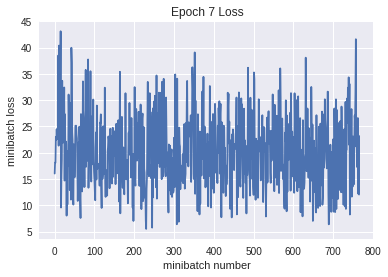

Iteration 5400: with minibatch training loss = 0.273 and accuracy of 0.88
Iteration 5500: with minibatch training loss = 0.207 and accuracy of 0.89
Iteration 5600: with minibatch training loss = 0.341 and accuracy of 0.89
Iteration 5700: with minibatch training loss = 0.321 and accuracy of 0.92
Iteration 5800: with minibatch training loss = 0.446 and accuracy of 0.88
Iteration 5900: with minibatch training loss = 0.327 and accuracy of 0.89
Iteration 6000: with minibatch training loss = 0.305 and accuracy of 0.89
Iteration 6100: with minibatch training loss = 0.221 and accuracy of 0.94
Epoch 8, Overall loss = 0.313 and accuracy of 0.893


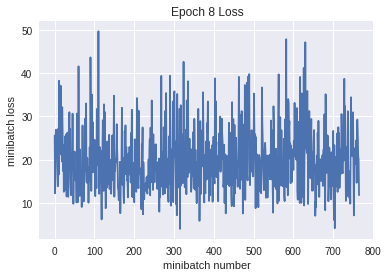

Iteration 6200: with minibatch training loss = 0.176 and accuracy of 0.95
Iteration 6300: with minibatch training loss = 0.221 and accuracy of 0.91
Iteration 6400: with minibatch training loss = 0.299 and accuracy of 0.89
Iteration 6500: with minibatch training loss = 0.387 and accuracy of 0.88
Iteration 6600: with minibatch training loss = 0.253 and accuracy of 0.89
Iteration 6700: with minibatch training loss = 0.277 and accuracy of 0.91
Iteration 6800: with minibatch training loss = 0.277 and accuracy of 0.92
Epoch 9, Overall loss = 0.3 and accuracy of 0.898


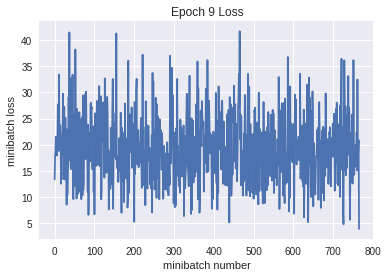

Iteration 6900: with minibatch training loss = 0.469 and accuracy of 0.84
Iteration 7000: with minibatch training loss = 0.228 and accuracy of 0.89
Iteration 7100: with minibatch training loss = 0.277 and accuracy of 0.88
Iteration 7200: with minibatch training loss = 0.396 and accuracy of 0.91
Iteration 7300: with minibatch training loss = 0.189 and accuracy of 0.92
Iteration 7400: with minibatch training loss = 0.207 and accuracy of 0.92
Iteration 7500: with minibatch training loss = 0.27 and accuracy of 0.92
Iteration 7600: with minibatch training loss = 0.304 and accuracy of 0.91
Epoch 10, Overall loss = 0.293 and accuracy of 0.9


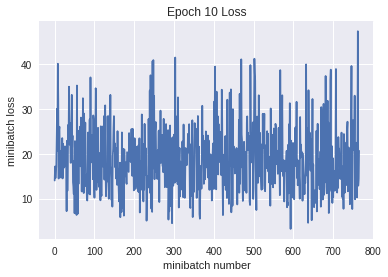

Validation
Epoch 1, Overall loss = 1.01 and accuracy of 0.723
Training
Iteration 0: with minibatch training loss = 0.361 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.503 and accuracy of 0.91
Iteration 200: with minibatch training loss = 0.171 and accuracy of 0.92
Iteration 300: with minibatch training loss = 0.339 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.374 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.289 and accuracy of 0.89
Iteration 600: with minibatch training loss = 0.478 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.609 and accuracy of 0.84
Epoch 1, Overall loss = 0.329 and accuracy of 0.889


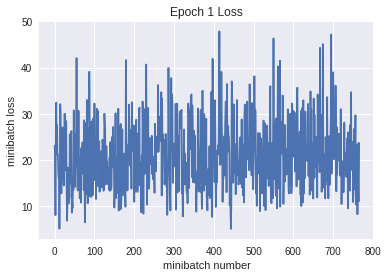

Iteration 800: with minibatch training loss = 0.223 and accuracy of 0.88
Iteration 900: with minibatch training loss = 0.458 and accuracy of 0.86
Iteration 1000: with minibatch training loss = 0.345 and accuracy of 0.84
Iteration 1100: with minibatch training loss = 0.196 and accuracy of 0.91
Iteration 1200: with minibatch training loss = 0.389 and accuracy of 0.86
Iteration 1300: with minibatch training loss = 0.355 and accuracy of 0.86
Iteration 1400: with minibatch training loss = 0.236 and accuracy of 0.91
Iteration 1500: with minibatch training loss = 0.406 and accuracy of 0.84
Epoch 2, Overall loss = 0.292 and accuracy of 0.9


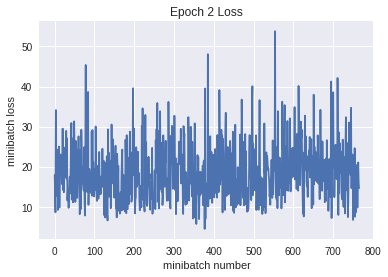

Iteration 1600: with minibatch training loss = 0.452 and accuracy of 0.83
Iteration 1700: with minibatch training loss = 0.175 and accuracy of 0.91
Iteration 1800: with minibatch training loss = 0.395 and accuracy of 0.92
Iteration 1900: with minibatch training loss = 0.241 and accuracy of 0.89
Iteration 2000: with minibatch training loss = 0.272 and accuracy of 0.92
Iteration 2100: with minibatch training loss = 0.332 and accuracy of 0.89
Iteration 2200: with minibatch training loss = 0.231 and accuracy of 0.94
Epoch 3, Overall loss = 0.284 and accuracy of 0.903


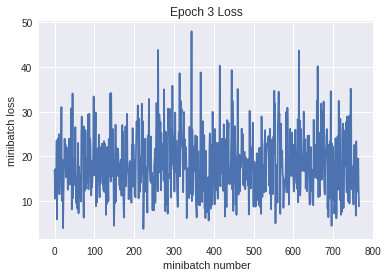

Iteration 2300: with minibatch training loss = 0.165 and accuracy of 0.92
Iteration 2400: with minibatch training loss = 0.306 and accuracy of 0.92
Iteration 2500: with minibatch training loss = 0.263 and accuracy of 0.91
Iteration 2600: with minibatch training loss = 0.237 and accuracy of 0.94
Iteration 2700: with minibatch training loss = 0.175 and accuracy of 0.89
Iteration 2800: with minibatch training loss = 0.469 and accuracy of 0.81
Iteration 2900: with minibatch training loss = 0.216 and accuracy of 0.94
Iteration 3000: with minibatch training loss = 0.538 and accuracy of 0.84
Epoch 4, Overall loss = 0.272 and accuracy of 0.907


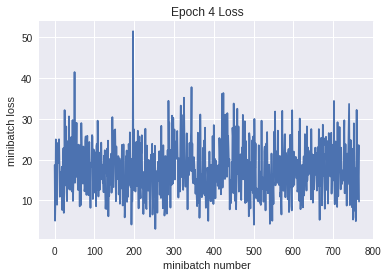

Iteration 3100: with minibatch training loss = 0.216 and accuracy of 0.91
Iteration 3200: with minibatch training loss = 0.334 and accuracy of 0.91
Iteration 3300: with minibatch training loss = 0.175 and accuracy of 0.97
Iteration 3400: with minibatch training loss = 0.29 and accuracy of 0.88
Iteration 3500: with minibatch training loss = 0.355 and accuracy of 0.91
Iteration 3600: with minibatch training loss = 0.256 and accuracy of 0.89
Iteration 3700: with minibatch training loss = 0.33 and accuracy of 0.91
Iteration 3800: with minibatch training loss = 0.184 and accuracy of 0.95
Epoch 5, Overall loss = 0.269 and accuracy of 0.908


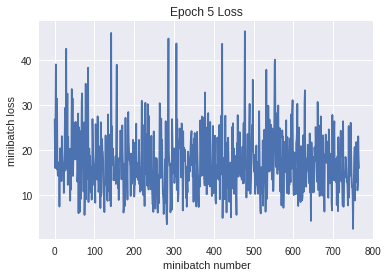

Iteration 3900: with minibatch training loss = 0.327 and accuracy of 0.89
Iteration 4000: with minibatch training loss = 0.309 and accuracy of 0.88
Iteration 4100: with minibatch training loss = 0.421 and accuracy of 0.88
Iteration 4200: with minibatch training loss = 0.241 and accuracy of 0.94
Iteration 4300: with minibatch training loss = 0.147 and accuracy of 0.95
Iteration 4400: with minibatch training loss = 0.238 and accuracy of 0.92
Iteration 4500: with minibatch training loss = 0.406 and accuracy of 0.86
Epoch 6, Overall loss = 0.258 and accuracy of 0.913


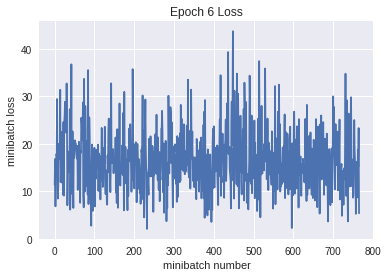

Iteration 4600: with minibatch training loss = 0.328 and accuracy of 0.88
Iteration 4700: with minibatch training loss = 0.265 and accuracy of 0.91
Iteration 4800: with minibatch training loss = 0.225 and accuracy of 0.89
Iteration 4900: with minibatch training loss = 0.34 and accuracy of 0.91
Iteration 5000: with minibatch training loss = 0.118 and accuracy of 0.95
Iteration 5100: with minibatch training loss = 0.511 and accuracy of 0.86
Iteration 5200: with minibatch training loss = 0.118 and accuracy of 0.95
Iteration 5300: with minibatch training loss = 0.181 and accuracy of 0.95
Epoch 7, Overall loss = 0.254 and accuracy of 0.914


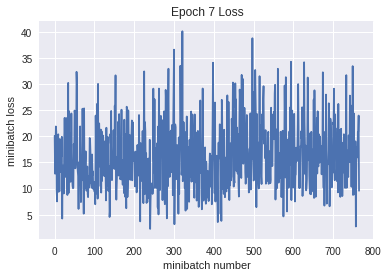

Iteration 5400: with minibatch training loss = 0.199 and accuracy of 0.95
Iteration 5500: with minibatch training loss = 0.207 and accuracy of 0.92
Iteration 5600: with minibatch training loss = 0.149 and accuracy of 0.92
Iteration 5700: with minibatch training loss = 0.187 and accuracy of 0.91
Iteration 5800: with minibatch training loss = 0.51 and accuracy of 0.81
Iteration 5900: with minibatch training loss = 0.226 and accuracy of 0.92
Iteration 6000: with minibatch training loss = 0.166 and accuracy of 0.91
Iteration 6100: with minibatch training loss = 0.187 and accuracy of 0.91
Epoch 8, Overall loss = 0.247 and accuracy of 0.916


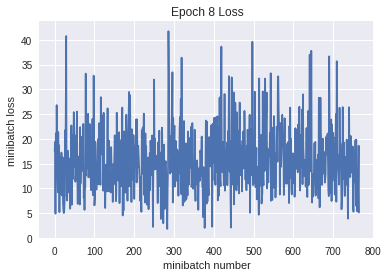

Iteration 6200: with minibatch training loss = 0.166 and accuracy of 0.95
Iteration 6300: with minibatch training loss = 0.33 and accuracy of 0.92
Iteration 6400: with minibatch training loss = 0.255 and accuracy of 0.89
Iteration 6500: with minibatch training loss = 0.312 and accuracy of 0.86
Iteration 6600: with minibatch training loss = 0.113 and accuracy of 0.95
Iteration 6700: with minibatch training loss = 0.224 and accuracy of 0.91
Iteration 6800: with minibatch training loss = 0.0763 and accuracy of 0.98
Epoch 9, Overall loss = 0.239 and accuracy of 0.92


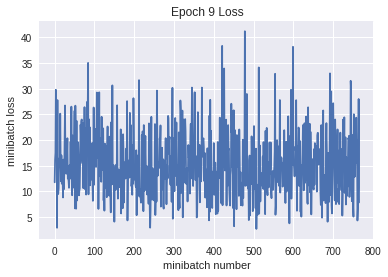

Iteration 6900: with minibatch training loss = 0.157 and accuracy of 0.94
Iteration 7000: with minibatch training loss = 0.251 and accuracy of 0.92
Iteration 7100: with minibatch training loss = 0.244 and accuracy of 0.92
Iteration 7200: with minibatch training loss = 0.23 and accuracy of 0.92
Iteration 7300: with minibatch training loss = 0.13 and accuracy of 0.97
Iteration 7400: with minibatch training loss = 0.236 and accuracy of 0.95
Iteration 7500: with minibatch training loss = 0.291 and accuracy of 0.84
Iteration 7600: with minibatch training loss = 0.266 and accuracy of 0.89
Epoch 10, Overall loss = 0.24 and accuracy of 0.919


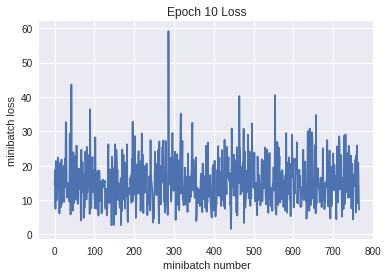

Validation
Epoch 1, Overall loss = 0.872 and accuracy of 0.747
Training
Iteration 0: with minibatch training loss = 0.136 and accuracy of 0.95
Iteration 100: with minibatch training loss = 0.311 and accuracy of 0.94
Iteration 200: with minibatch training loss = 0.269 and accuracy of 0.86
Iteration 300: with minibatch training loss = 0.195 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.352 and accuracy of 0.89
Iteration 500: with minibatch training loss = 0.18 and accuracy of 0.95
Iteration 600: with minibatch training loss = 0.282 and accuracy of 0.89
Iteration 700: with minibatch training loss = 0.141 and accuracy of 0.95
Epoch 1, Overall loss = 0.272 and accuracy of 0.911


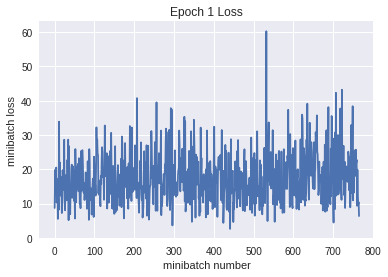

Iteration 800: with minibatch training loss = 0.518 and accuracy of 0.83
Iteration 900: with minibatch training loss = 0.405 and accuracy of 0.89
Iteration 1000: with minibatch training loss = 0.251 and accuracy of 0.92
Iteration 1100: with minibatch training loss = 0.241 and accuracy of 0.92
Iteration 1200: with minibatch training loss = 0.384 and accuracy of 0.84
Iteration 1300: with minibatch training loss = 0.214 and accuracy of 0.92
Iteration 1400: with minibatch training loss = 0.105 and accuracy of 0.94
Iteration 1500: with minibatch training loss = 0.0242 and accuracy of 1
Epoch 2, Overall loss = 0.241 and accuracy of 0.918


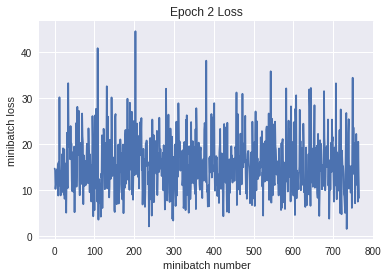

Iteration 1600: with minibatch training loss = 0.152 and accuracy of 0.95
Iteration 1700: with minibatch training loss = 0.344 and accuracy of 0.89
Iteration 1800: with minibatch training loss = 0.178 and accuracy of 0.92
Iteration 1900: with minibatch training loss = 0.315 and accuracy of 0.89
Iteration 2000: with minibatch training loss = 0.243 and accuracy of 0.89
Iteration 2100: with minibatch training loss = 0.197 and accuracy of 0.94
Iteration 2200: with minibatch training loss = 0.216 and accuracy of 0.95
Epoch 3, Overall loss = 0.233 and accuracy of 0.922


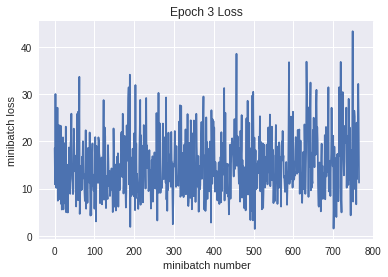

Iteration 2300: with minibatch training loss = 0.346 and accuracy of 0.89
Iteration 2400: with minibatch training loss = 0.283 and accuracy of 0.92
Iteration 2500: with minibatch training loss = 0.115 and accuracy of 0.98
Iteration 2600: with minibatch training loss = 0.219 and accuracy of 0.92
Iteration 2700: with minibatch training loss = 0.27 and accuracy of 0.92
Iteration 2800: with minibatch training loss = 0.3 and accuracy of 0.91
Iteration 2900: with minibatch training loss = 0.234 and accuracy of 0.91
Iteration 3000: with minibatch training loss = 0.139 and accuracy of 0.92
Epoch 4, Overall loss = 0.228 and accuracy of 0.924


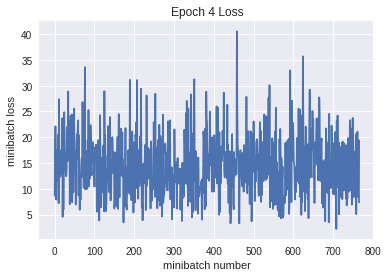

Iteration 3100: with minibatch training loss = 0.389 and accuracy of 0.84
Iteration 3200: with minibatch training loss = 0.19 and accuracy of 0.97
Iteration 3300: with minibatch training loss = 0.58 and accuracy of 0.81
Iteration 3400: with minibatch training loss = 0.141 and accuracy of 0.95
Iteration 3500: with minibatch training loss = 0.0661 and accuracy of 0.98
Iteration 3600: with minibatch training loss = 0.503 and accuracy of 0.84
Iteration 3700: with minibatch training loss = 0.416 and accuracy of 0.89
Iteration 3800: with minibatch training loss = 0.287 and accuracy of 0.92
Epoch 5, Overall loss = 0.224 and accuracy of 0.927


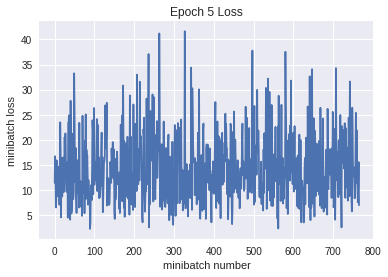

Iteration 3900: with minibatch training loss = 0.222 and accuracy of 0.94
Iteration 4000: with minibatch training loss = 0.14 and accuracy of 0.97
Iteration 4100: with minibatch training loss = 0.18 and accuracy of 0.92
Iteration 4200: with minibatch training loss = 0.215 and accuracy of 0.94
Iteration 4300: with minibatch training loss = 0.157 and accuracy of 0.95
Iteration 4400: with minibatch training loss = 0.252 and accuracy of 0.92
Iteration 4500: with minibatch training loss = 0.319 and accuracy of 0.89
Epoch 6, Overall loss = 0.219 and accuracy of 0.927


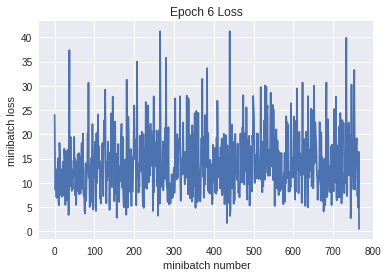

Iteration 4600: with minibatch training loss = 0.0735 and accuracy of 0.98
Iteration 4700: with minibatch training loss = 0.142 and accuracy of 0.97
Iteration 4800: with minibatch training loss = 0.0603 and accuracy of 0.98
Iteration 4900: with minibatch training loss = 0.172 and accuracy of 0.92
Iteration 5000: with minibatch training loss = 0.0681 and accuracy of 0.98
Iteration 5100: with minibatch training loss = 0.197 and accuracy of 0.91
Iteration 5200: with minibatch training loss = 0.242 and accuracy of 0.91
Iteration 5300: with minibatch training loss = 0.197 and accuracy of 0.92
Epoch 7, Overall loss = 0.215 and accuracy of 0.928


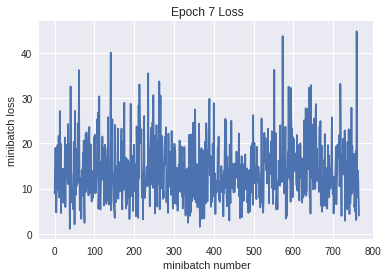

Iteration 5400: with minibatch training loss = 0.201 and accuracy of 0.88
Iteration 5500: with minibatch training loss = 0.108 and accuracy of 0.97
Iteration 5600: with minibatch training loss = 0.232 and accuracy of 0.92
Iteration 5700: with minibatch training loss = 0.213 and accuracy of 0.88
Iteration 5800: with minibatch training loss = 0.0473 and accuracy of 1
Iteration 5900: with minibatch training loss = 0.382 and accuracy of 0.88
Iteration 6000: with minibatch training loss = 0.308 and accuracy of 0.92
Iteration 6100: with minibatch training loss = 0.308 and accuracy of 0.91
Epoch 8, Overall loss = 0.212 and accuracy of 0.929


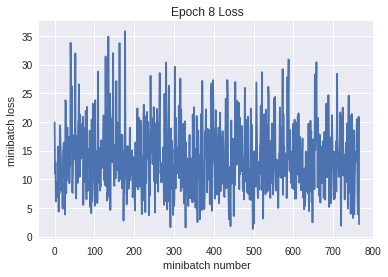

Iteration 6200: with minibatch training loss = 0.418 and accuracy of 0.86
Iteration 6300: with minibatch training loss = 0.33 and accuracy of 0.92
Iteration 6400: with minibatch training loss = 0.161 and accuracy of 0.94
Iteration 6500: with minibatch training loss = 0.303 and accuracy of 0.89
Iteration 6600: with minibatch training loss = 0.357 and accuracy of 0.88
Iteration 6700: with minibatch training loss = 0.254 and accuracy of 0.91
Iteration 6800: with minibatch training loss = 0.147 and accuracy of 0.98
Epoch 9, Overall loss = 0.208 and accuracy of 0.932


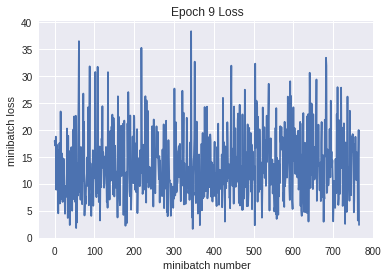

Iteration 6900: with minibatch training loss = 0.142 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.186 and accuracy of 0.95
Iteration 7100: with minibatch training loss = 0.322 and accuracy of 0.92
Iteration 7200: with minibatch training loss = 0.0388 and accuracy of 1
Iteration 7300: with minibatch training loss = 0.309 and accuracy of 0.88
Iteration 7400: with minibatch training loss = 0.301 and accuracy of 0.89
Iteration 7500: with minibatch training loss = 0.248 and accuracy of 0.91
Iteration 7600: with minibatch training loss = 0.0885 and accuracy of 0.97
Epoch 10, Overall loss = 0.201 and accuracy of 0.934


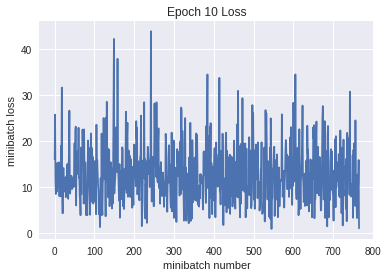

Validation
Epoch 1, Overall loss = 1.04 and accuracy of 0.747
Training
Iteration 0: with minibatch training loss = 0.217 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.162 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.478 and accuracy of 0.89
Iteration 300: with minibatch training loss = 0.228 and accuracy of 0.91
Iteration 400: with minibatch training loss = 0.211 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.17 and accuracy of 0.94
Iteration 600: with minibatch training loss = 0.143 and accuracy of 0.97
Iteration 700: with minibatch training loss = 0.158 and accuracy of 0.97
Epoch 1, Overall loss = 0.24 and accuracy of 0.923


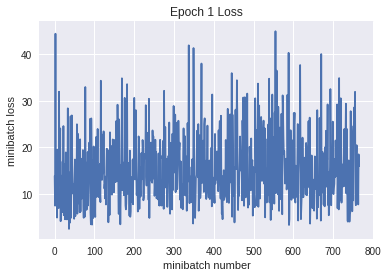

Iteration 800: with minibatch training loss = 0.244 and accuracy of 0.94
Iteration 900: with minibatch training loss = 0.143 and accuracy of 0.98
Iteration 1000: with minibatch training loss = 0.241 and accuracy of 0.91
Iteration 1100: with minibatch training loss = 0.304 and accuracy of 0.94
Iteration 1200: with minibatch training loss = 0.276 and accuracy of 0.91
Iteration 1300: with minibatch training loss = 0.28 and accuracy of 0.89
Iteration 1400: with minibatch training loss = 0.182 and accuracy of 0.94
Iteration 1500: with minibatch training loss = 0.247 and accuracy of 0.94
Epoch 2, Overall loss = 0.211 and accuracy of 0.931


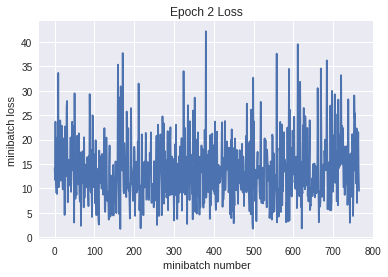

Iteration 1600: with minibatch training loss = 0.11 and accuracy of 0.95
Iteration 1700: with minibatch training loss = 0.249 and accuracy of 0.92
Iteration 1800: with minibatch training loss = 0.0889 and accuracy of 0.95
Iteration 1900: with minibatch training loss = 0.26 and accuracy of 0.92
Iteration 2000: with minibatch training loss = 0.105 and accuracy of 0.97
Iteration 2100: with minibatch training loss = 0.0947 and accuracy of 0.95
Iteration 2200: with minibatch training loss = 0.382 and accuracy of 0.91
Epoch 3, Overall loss = 0.201 and accuracy of 0.933


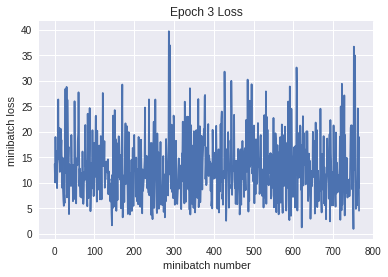

Iteration 2300: with minibatch training loss = 0.417 and accuracy of 0.91
Iteration 2400: with minibatch training loss = 0.171 and accuracy of 0.92
Iteration 2500: with minibatch training loss = 0.529 and accuracy of 0.89
Iteration 2600: with minibatch training loss = 0.202 and accuracy of 0.94
Iteration 2700: with minibatch training loss = 0.114 and accuracy of 0.95
Iteration 2800: with minibatch training loss = 0.13 and accuracy of 0.95
Iteration 2900: with minibatch training loss = 0.178 and accuracy of 0.94
Iteration 3000: with minibatch training loss = 0.0915 and accuracy of 0.98
Epoch 4, Overall loss = 0.2 and accuracy of 0.935


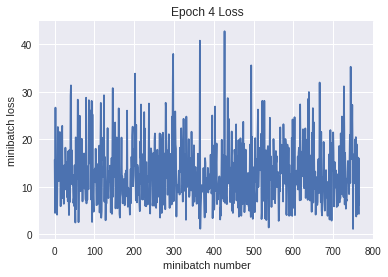

Iteration 3100: with minibatch training loss = 0.0654 and accuracy of 0.98
Iteration 3200: with minibatch training loss = 0.118 and accuracy of 0.97
Iteration 3300: with minibatch training loss = 0.234 and accuracy of 0.91
Iteration 3400: with minibatch training loss = 0.157 and accuracy of 0.97
Iteration 3500: with minibatch training loss = 0.312 and accuracy of 0.89
Iteration 3600: with minibatch training loss = 0.286 and accuracy of 0.91
Iteration 3700: with minibatch training loss = 0.271 and accuracy of 0.92
Iteration 3800: with minibatch training loss = 0.119 and accuracy of 0.95
Epoch 5, Overall loss = 0.199 and accuracy of 0.936


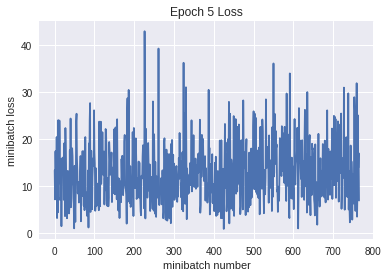

Iteration 3900: with minibatch training loss = 0.334 and accuracy of 0.89
Iteration 4000: with minibatch training loss = 0.199 and accuracy of 0.91
Iteration 4100: with minibatch training loss = 0.237 and accuracy of 0.92
Iteration 4200: with minibatch training loss = 0.169 and accuracy of 0.92
Iteration 4300: with minibatch training loss = 0.433 and accuracy of 0.91
Iteration 4400: with minibatch training loss = 0.221 and accuracy of 0.91
Iteration 4500: with minibatch training loss = 0.28 and accuracy of 0.92
Epoch 6, Overall loss = 0.2 and accuracy of 0.936


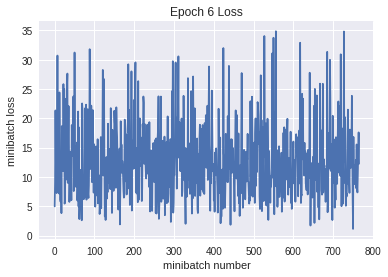

Iteration 4600: with minibatch training loss = 0.134 and accuracy of 0.98
Iteration 4700: with minibatch training loss = 0.166 and accuracy of 0.97
Iteration 4800: with minibatch training loss = 0.264 and accuracy of 0.88
Iteration 4900: with minibatch training loss = 0.24 and accuracy of 0.92
Iteration 5000: with minibatch training loss = 0.149 and accuracy of 0.95
Iteration 5100: with minibatch training loss = 0.258 and accuracy of 0.89
Iteration 5200: with minibatch training loss = 0.0957 and accuracy of 0.97
Iteration 5300: with minibatch training loss = 0.188 and accuracy of 0.91
Epoch 7, Overall loss = 0.187 and accuracy of 0.939


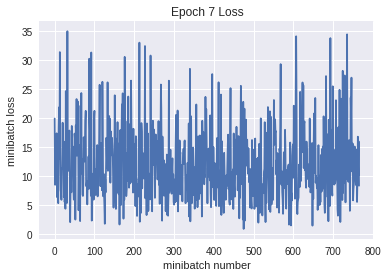

Iteration 5400: with minibatch training loss = 0.148 and accuracy of 0.94
Iteration 5500: with minibatch training loss = 0.195 and accuracy of 0.92
Iteration 5600: with minibatch training loss = 0.41 and accuracy of 0.92
Iteration 5700: with minibatch training loss = 0.138 and accuracy of 0.92
Iteration 5800: with minibatch training loss = 0.0973 and accuracy of 0.95
Iteration 5900: with minibatch training loss = 0.192 and accuracy of 0.94
Iteration 6000: with minibatch training loss = 0.141 and accuracy of 0.97
Iteration 6100: with minibatch training loss = 0.248 and accuracy of 0.92
Epoch 8, Overall loss = 0.187 and accuracy of 0.939


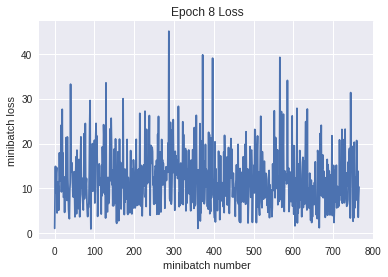

Iteration 6200: with minibatch training loss = 0.378 and accuracy of 0.88
Iteration 6300: with minibatch training loss = 0.0997 and accuracy of 0.98
Iteration 6400: with minibatch training loss = 0.332 and accuracy of 0.91
Iteration 6500: with minibatch training loss = 0.366 and accuracy of 0.86
Iteration 6600: with minibatch training loss = 0.476 and accuracy of 0.88
Iteration 6700: with minibatch training loss = 0.187 and accuracy of 0.91
Iteration 6800: with minibatch training loss = 0.0857 and accuracy of 0.97
Epoch 9, Overall loss = 0.184 and accuracy of 0.941


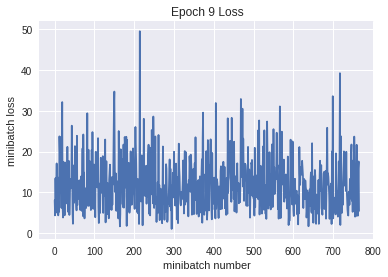

Iteration 6900: with minibatch training loss = 0.123 and accuracy of 0.94
Iteration 7000: with minibatch training loss = 0.177 and accuracy of 0.95
Iteration 7100: with minibatch training loss = 0.28 and accuracy of 0.95
Iteration 7200: with minibatch training loss = 0.192 and accuracy of 0.92
Iteration 7300: with minibatch training loss = 0.161 and accuracy of 0.92
Iteration 7400: with minibatch training loss = 0.295 and accuracy of 0.94
Iteration 7500: with minibatch training loss = 0.0833 and accuracy of 0.97
Iteration 7600: with minibatch training loss = 0.146 and accuracy of 0.94
Epoch 10, Overall loss = 0.18 and accuracy of 0.941


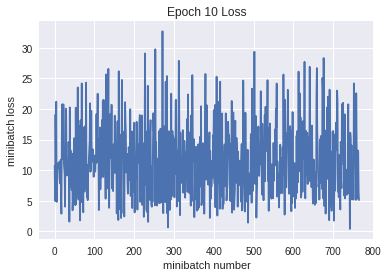

Validation
Epoch 1, Overall loss = 1.06 and accuracy of 0.728
Training
Iteration 0: with minibatch training loss = 0.377 and accuracy of 0.97
Iteration 100: with minibatch training loss = 0.226 and accuracy of 0.92
Iteration 200: with minibatch training loss = 0.0714 and accuracy of 0.97
Iteration 300: with minibatch training loss = 0.11 and accuracy of 0.97
Iteration 400: with minibatch training loss = 0.452 and accuracy of 0.88
Iteration 500: with minibatch training loss = 0.257 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.178 and accuracy of 0.95
Iteration 700: with minibatch training loss = 0.129 and accuracy of 0.95
Epoch 1, Overall loss = 0.209 and accuracy of 0.934


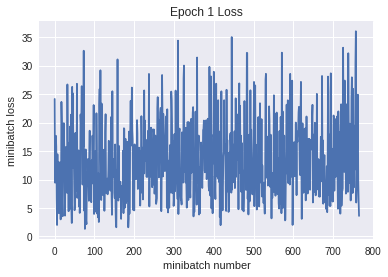

Iteration 800: with minibatch training loss = 0.104 and accuracy of 0.95
Iteration 900: with minibatch training loss = 0.219 and accuracy of 0.92
Iteration 1000: with minibatch training loss = 0.264 and accuracy of 0.92
Iteration 1100: with minibatch training loss = 0.251 and accuracy of 0.92
Iteration 1200: with minibatch training loss = 0.485 and accuracy of 0.88
Iteration 1300: with minibatch training loss = 0.155 and accuracy of 0.94
Iteration 1400: with minibatch training loss = 0.104 and accuracy of 0.97
Iteration 1500: with minibatch training loss = 0.197 and accuracy of 0.95
Epoch 2, Overall loss = 0.198 and accuracy of 0.936


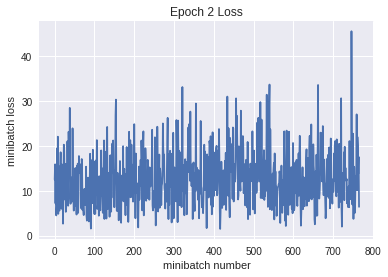

Iteration 1600: with minibatch training loss = 0.043 and accuracy of 1
Iteration 1700: with minibatch training loss = 0.195 and accuracy of 0.97
Iteration 1800: with minibatch training loss = 0.0879 and accuracy of 0.98
Iteration 1900: with minibatch training loss = 0.121 and accuracy of 0.94
Iteration 2000: with minibatch training loss = 0.231 and accuracy of 0.95
Iteration 2100: with minibatch training loss = 0.303 and accuracy of 0.97
Iteration 2200: with minibatch training loss = 0.0267 and accuracy of 1
Epoch 3, Overall loss = 0.176 and accuracy of 0.943


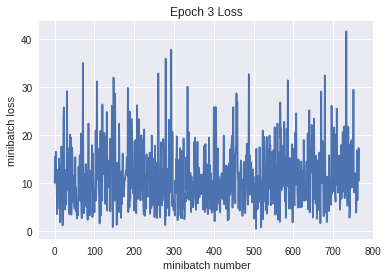

Iteration 2300: with minibatch training loss = 0.227 and accuracy of 0.95
Iteration 2400: with minibatch training loss = 0.377 and accuracy of 0.94
Iteration 2500: with minibatch training loss = 0.221 and accuracy of 0.92
Iteration 2600: with minibatch training loss = 0.135 and accuracy of 0.97
Iteration 2700: with minibatch training loss = 0.0702 and accuracy of 0.98
Iteration 2800: with minibatch training loss = 0.139 and accuracy of 0.95
Iteration 2900: with minibatch training loss = 0.331 and accuracy of 0.95
Iteration 3000: with minibatch training loss = 0.169 and accuracy of 0.94
Epoch 4, Overall loss = 0.178 and accuracy of 0.944


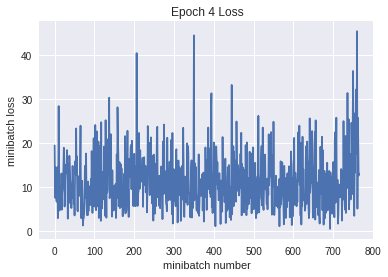

Iteration 3100: with minibatch training loss = 0.171 and accuracy of 0.95
Iteration 3200: with minibatch training loss = 0.401 and accuracy of 0.91
Iteration 3300: with minibatch training loss = 0.125 and accuracy of 0.97
Iteration 3400: with minibatch training loss = 0.109 and accuracy of 0.94
Iteration 3500: with minibatch training loss = 0.158 and accuracy of 0.94
Iteration 3600: with minibatch training loss = 0.0636 and accuracy of 0.98
Iteration 3700: with minibatch training loss = 0.05 and accuracy of 0.98
Iteration 3800: with minibatch training loss = 0.315 and accuracy of 0.95
Epoch 5, Overall loss = 0.182 and accuracy of 0.942


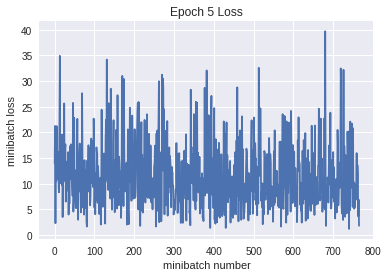

Iteration 3900: with minibatch training loss = 0.163 and accuracy of 0.94
Iteration 4000: with minibatch training loss = 0.095 and accuracy of 0.95
Iteration 4100: with minibatch training loss = 0.213 and accuracy of 0.95
Iteration 4200: with minibatch training loss = 0.222 and accuracy of 0.94
Iteration 4300: with minibatch training loss = 0.0803 and accuracy of 0.98
Iteration 4400: with minibatch training loss = 0.24 and accuracy of 0.95
Iteration 4500: with minibatch training loss = 0.126 and accuracy of 0.95
Epoch 6, Overall loss = 0.18 and accuracy of 0.942


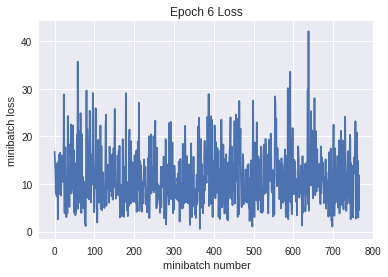

Iteration 4600: with minibatch training loss = 0.249 and accuracy of 0.94
Iteration 4700: with minibatch training loss = 0.332 and accuracy of 0.91
Iteration 4800: with minibatch training loss = 0.174 and accuracy of 0.94
Iteration 4900: with minibatch training loss = 0.114 and accuracy of 0.94
Iteration 5000: with minibatch training loss = 0.0619 and accuracy of 0.98
Iteration 5100: with minibatch training loss = 0.0969 and accuracy of 0.97
Iteration 5200: with minibatch training loss = 0.238 and accuracy of 0.89
Iteration 5300: with minibatch training loss = 0.0695 and accuracy of 0.98
Epoch 7, Overall loss = 0.177 and accuracy of 0.943


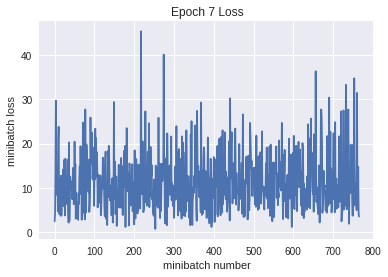

Iteration 5400: with minibatch training loss = 0.216 and accuracy of 0.92
Iteration 5500: with minibatch training loss = 0.103 and accuracy of 0.97
Iteration 5600: with minibatch training loss = 0.329 and accuracy of 0.95
Iteration 5700: with minibatch training loss = 0.0669 and accuracy of 0.98
Iteration 5800: with minibatch training loss = 0.151 and accuracy of 0.95
Iteration 5900: with minibatch training loss = 0.125 and accuracy of 0.92
Iteration 6000: with minibatch training loss = 0.165 and accuracy of 0.91
Iteration 6100: with minibatch training loss = 0.0378 and accuracy of 1
Epoch 8, Overall loss = 0.174 and accuracy of 0.944


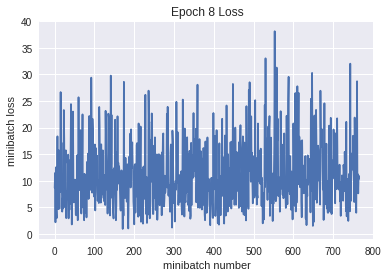

Iteration 6200: with minibatch training loss = 0.142 and accuracy of 0.94
Iteration 6300: with minibatch training loss = 0.0673 and accuracy of 0.97
Iteration 6400: with minibatch training loss = 0.337 and accuracy of 0.94
Iteration 6500: with minibatch training loss = 0.375 and accuracy of 0.89
Iteration 6600: with minibatch training loss = 0.0829 and accuracy of 0.97
Iteration 6700: with minibatch training loss = 0.142 and accuracy of 0.95
Iteration 6800: with minibatch training loss = 0.327 and accuracy of 0.94
Epoch 9, Overall loss = 0.166 and accuracy of 0.948


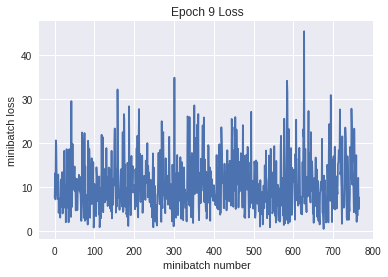

Iteration 6900: with minibatch training loss = 0.175 and accuracy of 0.97
Iteration 7000: with minibatch training loss = 0.212 and accuracy of 0.95
Iteration 7100: with minibatch training loss = 0.305 and accuracy of 0.92
Iteration 7200: with minibatch training loss = 0.304 and accuracy of 0.94
Iteration 7300: with minibatch training loss = 0.189 and accuracy of 0.95
Iteration 7400: with minibatch training loss = 0.0484 and accuracy of 0.98
Iteration 7500: with minibatch training loss = 0.0431 and accuracy of 0.98
Iteration 7600: with minibatch training loss = 0.21 and accuracy of 0.94
Epoch 10, Overall loss = 0.167 and accuracy of 0.947


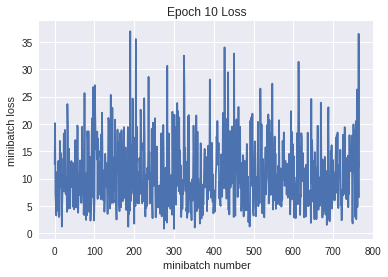

Validation
Epoch 1, Overall loss = 1.07 and accuracy of 0.749
Training
Iteration 0: with minibatch training loss = 0.648 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.132 and accuracy of 0.95
Iteration 200: with minibatch training loss = 0.184 and accuracy of 0.95
Iteration 300: with minibatch training loss = 0.0874 and accuracy of 0.98
Iteration 400: with minibatch training loss = 0.191 and accuracy of 0.97
Iteration 500: with minibatch training loss = 0.389 and accuracy of 0.91
Iteration 600: with minibatch training loss = 0.0987 and accuracy of 0.95
Iteration 700: with minibatch training loss = 0.194 and accuracy of 0.95
Epoch 1, Overall loss = 0.201 and accuracy of 0.938


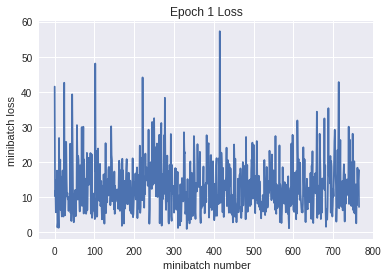

Iteration 800: with minibatch training loss = 0.246 and accuracy of 0.95
Iteration 900: with minibatch training loss = 0.344 and accuracy of 0.91
Iteration 1000: with minibatch training loss = 0.186 and accuracy of 0.95
Iteration 1100: with minibatch training loss = 0.0623 and accuracy of 0.98
Iteration 1200: with minibatch training loss = 0.0543 and accuracy of 0.95
Iteration 1300: with minibatch training loss = 0.233 and accuracy of 0.94
Iteration 1400: with minibatch training loss = 0.368 and accuracy of 0.88
Iteration 1500: with minibatch training loss = 0.262 and accuracy of 0.92
Epoch 2, Overall loss = 0.175 and accuracy of 0.944


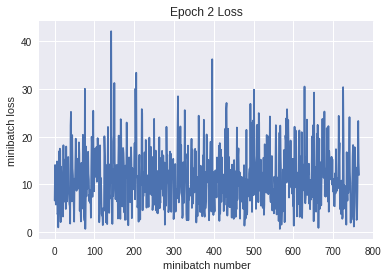

Iteration 1600: with minibatch training loss = 0.207 and accuracy of 0.94
Iteration 1700: with minibatch training loss = 0.137 and accuracy of 0.94
Iteration 1800: with minibatch training loss = 0.152 and accuracy of 0.97
Iteration 1900: with minibatch training loss = 0.0574 and accuracy of 0.98
Iteration 2000: with minibatch training loss = 0.162 and accuracy of 0.95
Iteration 2100: with minibatch training loss = 0.115 and accuracy of 0.95
Iteration 2200: with minibatch training loss = 0.301 and accuracy of 0.94
Epoch 3, Overall loss = 0.176 and accuracy of 0.947


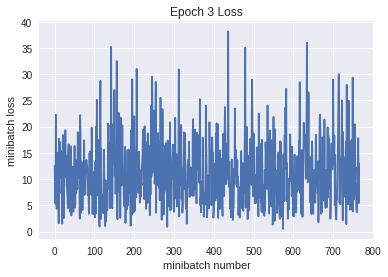

Iteration 2300: with minibatch training loss = 0.204 and accuracy of 0.92
Iteration 2400: with minibatch training loss = 0.315 and accuracy of 0.92
Iteration 2500: with minibatch training loss = 0.0879 and accuracy of 0.97
Iteration 2600: with minibatch training loss = 0.0827 and accuracy of 0.95
Iteration 2700: with minibatch training loss = 0.152 and accuracy of 0.95
Iteration 2800: with minibatch training loss = 0.44 and accuracy of 0.91
Iteration 2900: with minibatch training loss = 0.167 and accuracy of 0.94
Iteration 3000: with minibatch training loss = 0.178 and accuracy of 0.95
Epoch 4, Overall loss = 0.169 and accuracy of 0.947


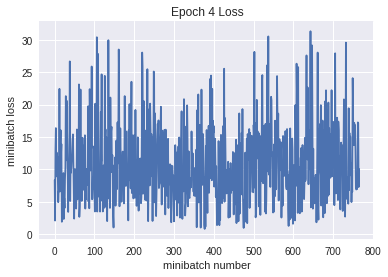

Iteration 3100: with minibatch training loss = 0.306 and accuracy of 0.92
Iteration 3200: with minibatch training loss = 0.211 and accuracy of 0.89
Iteration 3300: with minibatch training loss = 0.169 and accuracy of 0.94
Iteration 3400: with minibatch training loss = 0.0794 and accuracy of 0.97
Iteration 3500: with minibatch training loss = 0.364 and accuracy of 0.92
Iteration 3600: with minibatch training loss = 0.238 and accuracy of 0.89
Iteration 3700: with minibatch training loss = 0.0305 and accuracy of 0.98
Iteration 3800: with minibatch training loss = 0.247 and accuracy of 0.95
Epoch 5, Overall loss = 0.172 and accuracy of 0.946


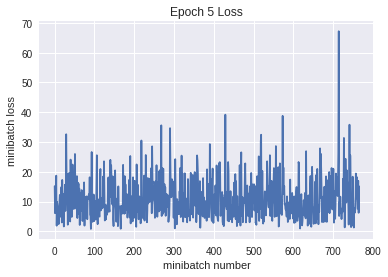

Iteration 3900: with minibatch training loss = 0.164 and accuracy of 0.94
Iteration 4000: with minibatch training loss = 0.0605 and accuracy of 0.98
Iteration 4100: with minibatch training loss = 0.266 and accuracy of 0.91
Iteration 4200: with minibatch training loss = 0.265 and accuracy of 0.92
Iteration 4300: with minibatch training loss = 0.167 and accuracy of 0.94
Iteration 4400: with minibatch training loss = 0.0963 and accuracy of 0.97
Iteration 4500: with minibatch training loss = 0.0391 and accuracy of 1
Epoch 6, Overall loss = 0.163 and accuracy of 0.949


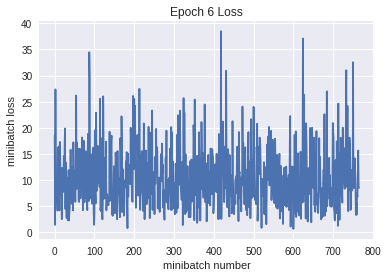

Iteration 4600: with minibatch training loss = 0.124 and accuracy of 0.95
Iteration 4700: with minibatch training loss = 0.294 and accuracy of 0.94
Iteration 4800: with minibatch training loss = 0.169 and accuracy of 0.95
Iteration 4900: with minibatch training loss = 0.108 and accuracy of 0.95
Iteration 5000: with minibatch training loss = 0.395 and accuracy of 0.92
Iteration 5100: with minibatch training loss = 0.117 and accuracy of 0.95
Iteration 5200: with minibatch training loss = 0.156 and accuracy of 0.97
Iteration 5300: with minibatch training loss = 0.0696 and accuracy of 0.98
Epoch 7, Overall loss = 0.157 and accuracy of 0.952


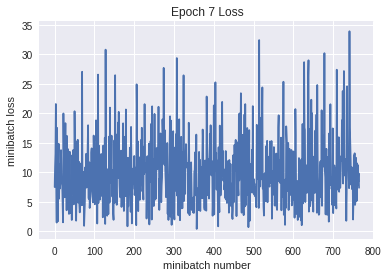

Iteration 5400: with minibatch training loss = 0.185 and accuracy of 0.95
Iteration 5500: with minibatch training loss = 0.124 and accuracy of 0.94
Iteration 5600: with minibatch training loss = 0.0383 and accuracy of 0.98
Iteration 5700: with minibatch training loss = 0.0545 and accuracy of 0.98
Iteration 5800: with minibatch training loss = 0.12 and accuracy of 0.97
Iteration 5900: with minibatch training loss = 0.0806 and accuracy of 0.97
Iteration 6000: with minibatch training loss = 0.117 and accuracy of 0.91
Iteration 6100: with minibatch training loss = 0.0885 and accuracy of 0.97
Epoch 8, Overall loss = 0.163 and accuracy of 0.95


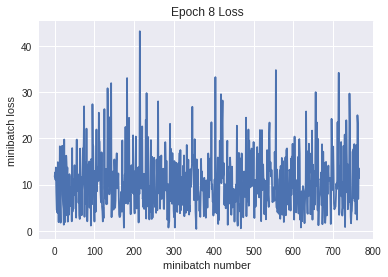

Iteration 6200: with minibatch training loss = 0.0881 and accuracy of 0.95
Iteration 6300: with minibatch training loss = 0.105 and accuracy of 0.97
Iteration 6400: with minibatch training loss = 0.0135 and accuracy of 1
Iteration 6500: with minibatch training loss = 0.0707 and accuracy of 0.97
Iteration 6600: with minibatch training loss = 0.17 and accuracy of 0.95
Iteration 6700: with minibatch training loss = 0.176 and accuracy of 0.95
Iteration 6800: with minibatch training loss = 0.172 and accuracy of 0.97
Epoch 9, Overall loss = 0.155 and accuracy of 0.951


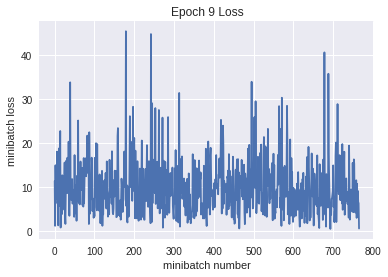

Iteration 6900: with minibatch training loss = 0.139 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.0642 and accuracy of 0.97
Iteration 7100: with minibatch training loss = 0.149 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.123 and accuracy of 0.97
Iteration 7300: with minibatch training loss = 0.213 and accuracy of 0.95
Iteration 7400: with minibatch training loss = 0.354 and accuracy of 0.95
Iteration 7500: with minibatch training loss = 0.233 and accuracy of 0.92
Iteration 7600: with minibatch training loss = 0.0983 and accuracy of 0.97
Epoch 10, Overall loss = 0.159 and accuracy of 0.95


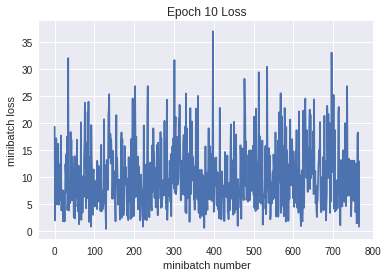

Validation
Epoch 1, Overall loss = 1.13 and accuracy of 0.733
Training
Iteration 0: with minibatch training loss = 0.202 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.192 and accuracy of 0.94
Iteration 200: with minibatch training loss = 0.419 and accuracy of 0.88
Iteration 300: with minibatch training loss = 0.259 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.19 and accuracy of 0.97
Iteration 500: with minibatch training loss = 0.158 and accuracy of 0.98
Iteration 600: with minibatch training loss = 0.244 and accuracy of 0.94
Iteration 700: with minibatch training loss = 0.191 and accuracy of 0.95
Epoch 1, Overall loss = 0.183 and accuracy of 0.945


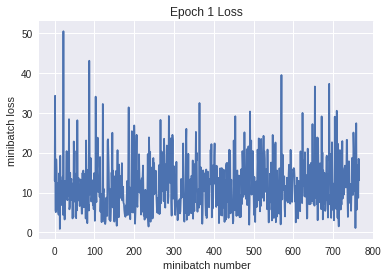

Iteration 800: with minibatch training loss = 0.122 and accuracy of 0.98
Iteration 900: with minibatch training loss = 0.241 and accuracy of 0.91
Iteration 1000: with minibatch training loss = 0.123 and accuracy of 0.94
Iteration 1100: with minibatch training loss = 0.203 and accuracy of 0.94
Iteration 1200: with minibatch training loss = 0.318 and accuracy of 0.92
Iteration 1300: with minibatch training loss = 0.129 and accuracy of 0.95
Iteration 1400: with minibatch training loss = 0.199 and accuracy of 0.91
Iteration 1500: with minibatch training loss = 0.219 and accuracy of 0.94
Epoch 2, Overall loss = 0.165 and accuracy of 0.95


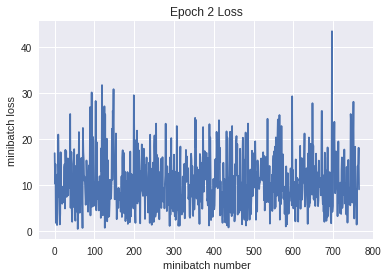

Iteration 1600: with minibatch training loss = 0.19 and accuracy of 0.95
Iteration 1700: with minibatch training loss = 0.193 and accuracy of 0.92
Iteration 1800: with minibatch training loss = 0.103 and accuracy of 0.97
Iteration 1900: with minibatch training loss = 0.225 and accuracy of 0.97
Iteration 2000: with minibatch training loss = 0.0667 and accuracy of 0.97
Iteration 2100: with minibatch training loss = 0.0994 and accuracy of 0.97
Iteration 2200: with minibatch training loss = 0.0422 and accuracy of 1
Epoch 3, Overall loss = 0.166 and accuracy of 0.95


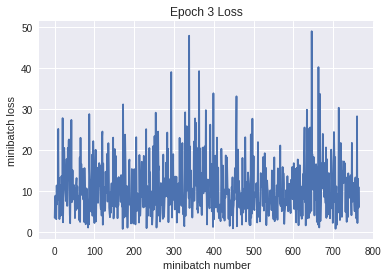

Iteration 2300: with minibatch training loss = 0.046 and accuracy of 1
Iteration 2400: with minibatch training loss = 0.211 and accuracy of 0.92
Iteration 2500: with minibatch training loss = 0.00878 and accuracy of 1
Iteration 2600: with minibatch training loss = 0.119 and accuracy of 0.95
Iteration 2700: with minibatch training loss = 0.21 and accuracy of 0.94
Iteration 2800: with minibatch training loss = 0.242 and accuracy of 0.89
Iteration 2900: with minibatch training loss = 0.285 and accuracy of 0.94
Iteration 3000: with minibatch training loss = 0.299 and accuracy of 0.89
Epoch 4, Overall loss = 0.167 and accuracy of 0.95


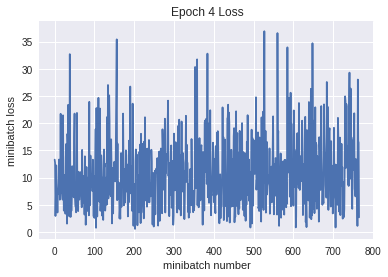

Iteration 3100: with minibatch training loss = 0.226 and accuracy of 0.88
Iteration 3200: with minibatch training loss = 0.127 and accuracy of 0.95
Iteration 3300: with minibatch training loss = 0.0677 and accuracy of 0.98
Iteration 3400: with minibatch training loss = 0.179 and accuracy of 0.95
Iteration 3500: with minibatch training loss = 0.16 and accuracy of 0.97
Iteration 3600: with minibatch training loss = 0.0618 and accuracy of 0.97
Iteration 3700: with minibatch training loss = 0.232 and accuracy of 0.95
Iteration 3800: with minibatch training loss = 0.343 and accuracy of 0.92
Epoch 5, Overall loss = 0.159 and accuracy of 0.952


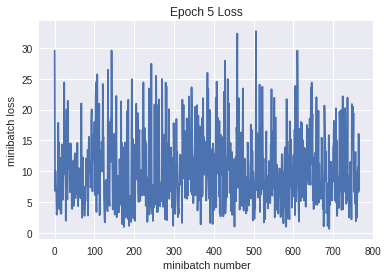

Iteration 3900: with minibatch training loss = 0.0311 and accuracy of 0.98
Iteration 4000: with minibatch training loss = 0.0285 and accuracy of 1
Iteration 4100: with minibatch training loss = 0.051 and accuracy of 1
Iteration 4200: with minibatch training loss = 0.0383 and accuracy of 0.98
Iteration 4300: with minibatch training loss = 0.335 and accuracy of 0.94
Iteration 4400: with minibatch training loss = 0.291 and accuracy of 0.94
Iteration 4500: with minibatch training loss = 0.0929 and accuracy of 0.98
Epoch 6, Overall loss = 0.146 and accuracy of 0.956


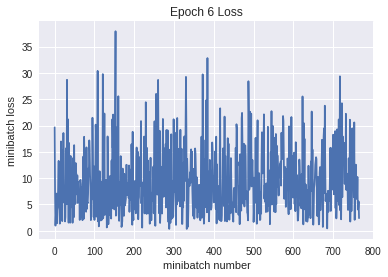

Iteration 4600: with minibatch training loss = 0.154 and accuracy of 0.94
Iteration 4700: with minibatch training loss = 0.102 and accuracy of 0.97
Iteration 4800: with minibatch training loss = 0.133 and accuracy of 0.97
Iteration 4900: with minibatch training loss = 0.0476 and accuracy of 0.98
Iteration 5000: with minibatch training loss = 0.29 and accuracy of 0.89
Iteration 5100: with minibatch training loss = 0.209 and accuracy of 0.94
Iteration 5200: with minibatch training loss = 0.18 and accuracy of 0.92
Iteration 5300: with minibatch training loss = 0.0803 and accuracy of 0.97
Epoch 7, Overall loss = 0.154 and accuracy of 0.953


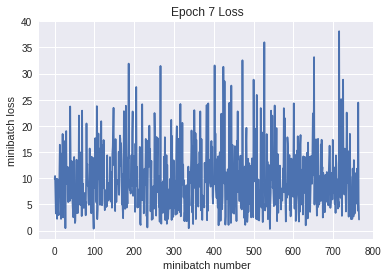

Iteration 5400: with minibatch training loss = 0.148 and accuracy of 0.95
Iteration 5500: with minibatch training loss = 0.0354 and accuracy of 0.98
Iteration 5600: with minibatch training loss = 0.267 and accuracy of 0.95
Iteration 5700: with minibatch training loss = 0.183 and accuracy of 0.95
Iteration 5800: with minibatch training loss = 0.134 and accuracy of 0.95
Iteration 5900: with minibatch training loss = 0.167 and accuracy of 0.94
Iteration 6000: with minibatch training loss = 0.0562 and accuracy of 0.97
Iteration 6100: with minibatch training loss = 0.0593 and accuracy of 0.98
Epoch 8, Overall loss = 0.154 and accuracy of 0.953


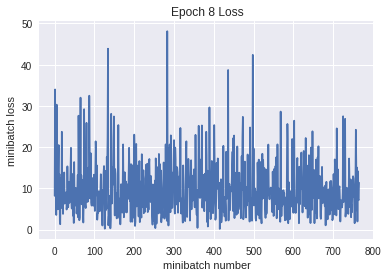

Iteration 6200: with minibatch training loss = 0.225 and accuracy of 0.95
Iteration 6300: with minibatch training loss = 0.145 and accuracy of 0.95
Iteration 6400: with minibatch training loss = 0.16 and accuracy of 0.94
Iteration 6500: with minibatch training loss = 0.139 and accuracy of 0.92
Iteration 6600: with minibatch training loss = 0.16 and accuracy of 0.92
Iteration 6700: with minibatch training loss = 0.0778 and accuracy of 0.97
Iteration 6800: with minibatch training loss = 0.423 and accuracy of 0.92
Epoch 9, Overall loss = 0.148 and accuracy of 0.956


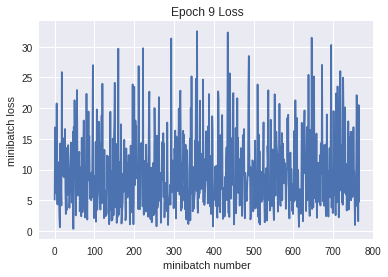

Iteration 6900: with minibatch training loss = 0.0835 and accuracy of 0.97
Iteration 7000: with minibatch training loss = 0.107 and accuracy of 0.97
Iteration 7100: with minibatch training loss = 0.144 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.142 and accuracy of 0.94
Iteration 7300: with minibatch training loss = 0.148 and accuracy of 0.97
Iteration 7400: with minibatch training loss = 0.0418 and accuracy of 0.98
Iteration 7500: with minibatch training loss = 0.0921 and accuracy of 0.97
Iteration 7600: with minibatch training loss = 0.0731 and accuracy of 0.97
Epoch 10, Overall loss = 0.154 and accuracy of 0.955


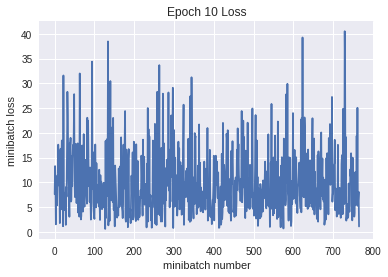

Validation
Epoch 1, Overall loss = 1.05 and accuracy of 0.739
Training
Iteration 0: with minibatch training loss = 0.0968 and accuracy of 0.97
Iteration 100: with minibatch training loss = 0.128 and accuracy of 0.95
Iteration 200: with minibatch training loss = 0.209 and accuracy of 0.97
Iteration 300: with minibatch training loss = 0.136 and accuracy of 0.95
Iteration 400: with minibatch training loss = 0.25 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.571 and accuracy of 0.86
Iteration 600: with minibatch training loss = 0.152 and accuracy of 0.92
Iteration 700: with minibatch training loss = 0.646 and accuracy of 0.83
Epoch 1, Overall loss = 0.182 and accuracy of 0.947


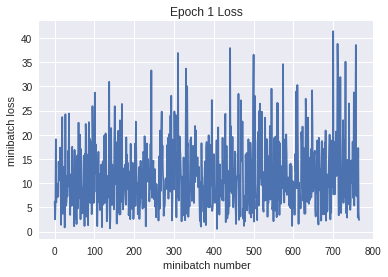

Iteration 800: with minibatch training loss = 0.209 and accuracy of 0.92
Iteration 900: with minibatch training loss = 0.0885 and accuracy of 0.98
Iteration 1000: with minibatch training loss = 0.211 and accuracy of 0.92
Iteration 1100: with minibatch training loss = 0.13 and accuracy of 0.97
Iteration 1200: with minibatch training loss = 0.0642 and accuracy of 0.98
Iteration 1300: with minibatch training loss = 0.158 and accuracy of 0.95
Iteration 1400: with minibatch training loss = 0.283 and accuracy of 0.91
Iteration 1500: with minibatch training loss = 0.115 and accuracy of 0.95
Epoch 2, Overall loss = 0.154 and accuracy of 0.953


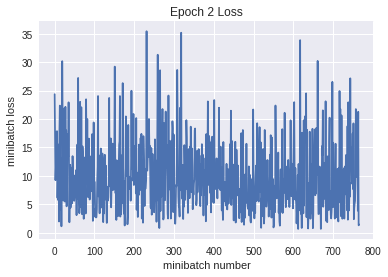

Iteration 1600: with minibatch training loss = 0.104 and accuracy of 0.97
Iteration 1700: with minibatch training loss = 0.144 and accuracy of 0.94
Iteration 1800: with minibatch training loss = 0.176 and accuracy of 0.94
Iteration 1900: with minibatch training loss = 0.155 and accuracy of 0.95
Iteration 2000: with minibatch training loss = 0.0939 and accuracy of 0.95
Iteration 2100: with minibatch training loss = 0.101 and accuracy of 0.97
Iteration 2200: with minibatch training loss = 0.0259 and accuracy of 1
Epoch 3, Overall loss = 0.157 and accuracy of 0.953


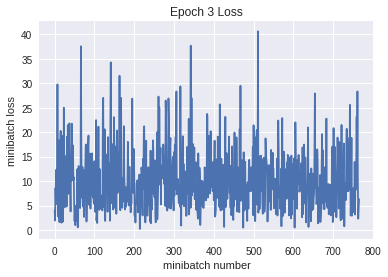

Iteration 2300: with minibatch training loss = 0.143 and accuracy of 0.95
Iteration 2400: with minibatch training loss = 0.181 and accuracy of 0.98
Iteration 2500: with minibatch training loss = 0.152 and accuracy of 0.97
Iteration 2600: with minibatch training loss = 0.0295 and accuracy of 0.98
Iteration 2700: with minibatch training loss = 0.15 and accuracy of 0.97
Iteration 2800: with minibatch training loss = 0.0885 and accuracy of 0.97
Iteration 2900: with minibatch training loss = 0.266 and accuracy of 0.89
Iteration 3000: with minibatch training loss = 0.0693 and accuracy of 0.97
Epoch 4, Overall loss = 0.152 and accuracy of 0.954


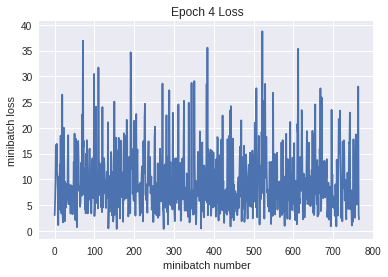

Iteration 3100: with minibatch training loss = 0.159 and accuracy of 0.94
Iteration 3200: with minibatch training loss = 0.104 and accuracy of 0.95
Iteration 3300: with minibatch training loss = 0.172 and accuracy of 0.94
Iteration 3400: with minibatch training loss = 0.0611 and accuracy of 0.97
Iteration 3500: with minibatch training loss = 0.169 and accuracy of 0.92
Iteration 3600: with minibatch training loss = 0.0998 and accuracy of 0.95
Iteration 3700: with minibatch training loss = 0.0116 and accuracy of 1
Iteration 3800: with minibatch training loss = 0.115 and accuracy of 0.94
Epoch 5, Overall loss = 0.157 and accuracy of 0.952


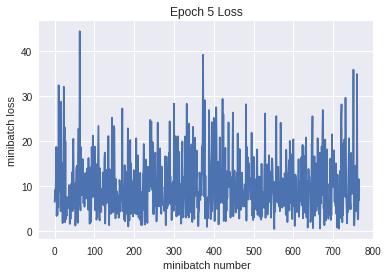

Iteration 3900: with minibatch training loss = 0.183 and accuracy of 0.94
Iteration 4000: with minibatch training loss = 0.0337 and accuracy of 1
Iteration 4100: with minibatch training loss = 0.418 and accuracy of 0.88
Iteration 4200: with minibatch training loss = 0.251 and accuracy of 0.91
Iteration 4300: with minibatch training loss = 0.104 and accuracy of 0.97
Iteration 4400: with minibatch training loss = 0.132 and accuracy of 0.97
Iteration 4500: with minibatch training loss = 0.0213 and accuracy of 1
Epoch 6, Overall loss = 0.147 and accuracy of 0.955


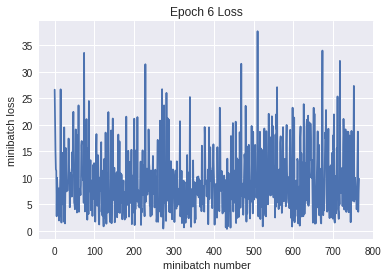

Iteration 4600: with minibatch training loss = 0.22 and accuracy of 0.88
Iteration 4700: with minibatch training loss = 0.0634 and accuracy of 0.98
Iteration 4800: with minibatch training loss = 0.0345 and accuracy of 0.98
Iteration 4900: with minibatch training loss = 0.0613 and accuracy of 0.97
Iteration 5000: with minibatch training loss = 0.238 and accuracy of 0.94
Iteration 5100: with minibatch training loss = 0.145 and accuracy of 0.95
Iteration 5200: with minibatch training loss = 0.389 and accuracy of 0.92
Iteration 5300: with minibatch training loss = 0.00655 and accuracy of 1
Epoch 7, Overall loss = 0.153 and accuracy of 0.955


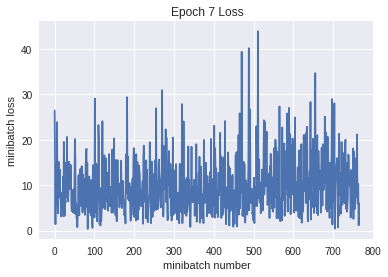

Iteration 5400: with minibatch training loss = 0.241 and accuracy of 0.94
Iteration 5500: with minibatch training loss = 0.0883 and accuracy of 0.95
Iteration 5600: with minibatch training loss = 0.174 and accuracy of 0.92
Iteration 5700: with minibatch training loss = 0.223 and accuracy of 0.95
Iteration 5800: with minibatch training loss = 0.329 and accuracy of 0.89
Iteration 5900: with minibatch training loss = 0.0364 and accuracy of 0.98
Iteration 6000: with minibatch training loss = 0.353 and accuracy of 0.94
Iteration 6100: with minibatch training loss = 0.0737 and accuracy of 0.97
Epoch 8, Overall loss = 0.145 and accuracy of 0.956


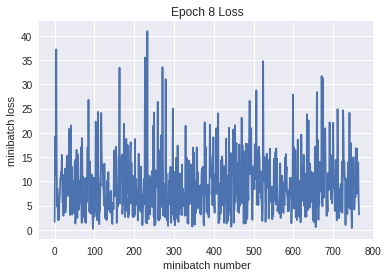

Iteration 6200: with minibatch training loss = 0.0179 and accuracy of 1
Iteration 6300: with minibatch training loss = 0.208 and accuracy of 0.94
Iteration 6400: with minibatch training loss = 0.165 and accuracy of 0.95
Iteration 6500: with minibatch training loss = 0.14 and accuracy of 0.97
Iteration 6600: with minibatch training loss = 0.217 and accuracy of 0.94
Iteration 6700: with minibatch training loss = 0.228 and accuracy of 0.92
Iteration 6800: with minibatch training loss = 0.111 and accuracy of 0.95
Epoch 9, Overall loss = 0.142 and accuracy of 0.958


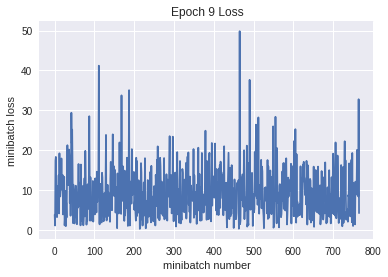

Iteration 6900: with minibatch training loss = 0.232 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.46 and accuracy of 0.91
Iteration 7100: with minibatch training loss = 0.176 and accuracy of 0.95
Iteration 7200: with minibatch training loss = 0.162 and accuracy of 0.97
Iteration 7300: with minibatch training loss = 0.214 and accuracy of 0.94
Iteration 7400: with minibatch training loss = 0.223 and accuracy of 0.92
Iteration 7500: with minibatch training loss = 0.129 and accuracy of 0.95
Iteration 7600: with minibatch training loss = 0.0768 and accuracy of 0.98
Epoch 10, Overall loss = 0.145 and accuracy of 0.958


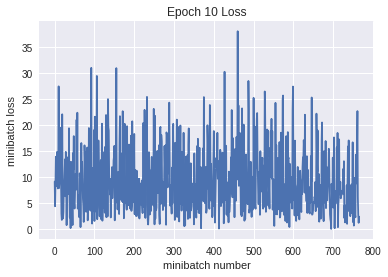

Validation
Epoch 1, Overall loss = 1.15 and accuracy of 0.73


In [96]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
for i in range(10):
  print('Training')
  run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
  print('Validation')
  run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [97]:
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 32, 32, 3])
y = tf.placeholder(tf.int64, [None])
is_training = tf.placeholder(tf.bool)

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 1e-3
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.99, staircase=True)

y_out = my_model20(X,y,is_training)
total_loss = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.one_hot(y,10), logits=y_out)
mean_loss = tf.reduce_mean(total_loss)
optimizer = tf.train.AdamOptimizer(5e-3)
train_step = optimizer.minimize(mean_loss)




# batch normalization in tensorflow requires this extra dependency
extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(extra_update_ops):
    train_step = optimizer.minimize(mean_loss)

0 ***********
Training
Iteration 0: with minibatch training loss = 3.67 and accuracy of 0.031
Iteration 100: with minibatch training loss = 1.85 and accuracy of 0.31
Iteration 200: with minibatch training loss = 1.78 and accuracy of 0.3
Iteration 300: with minibatch training loss = 1.77 and accuracy of 0.41
Iteration 400: with minibatch training loss = 1.57 and accuracy of 0.38
Iteration 500: with minibatch training loss = 1.52 and accuracy of 0.41
Iteration 600: with minibatch training loss = 1.92 and accuracy of 0.31
Iteration 700: with minibatch training loss = 1.36 and accuracy of 0.5
Epoch 1, Overall loss = 1.7 and accuracy of 0.401


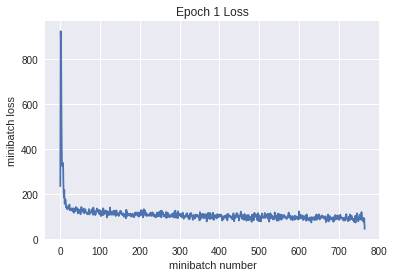

Iteration 800: with minibatch training loss = 1.21 and accuracy of 0.55
Iteration 900: with minibatch training loss = 1.38 and accuracy of 0.55
Iteration 1000: with minibatch training loss = 1.2 and accuracy of 0.61
Iteration 1100: with minibatch training loss = 1.19 and accuracy of 0.53
Iteration 1200: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 1300: with minibatch training loss = 1.1 and accuracy of 0.61
Iteration 1400: with minibatch training loss = 1.01 and accuracy of 0.62
Iteration 1500: with minibatch training loss = 0.965 and accuracy of 0.72
Epoch 2, Overall loss = 1.24 and accuracy of 0.559


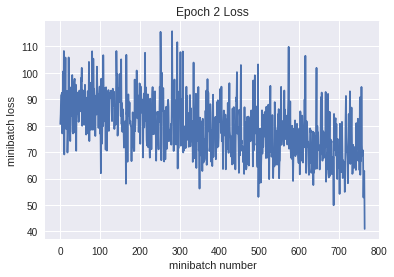

Iteration 1600: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 1700: with minibatch training loss = 0.99 and accuracy of 0.59
Iteration 1800: with minibatch training loss = 0.965 and accuracy of 0.64
Iteration 1900: with minibatch training loss = 0.719 and accuracy of 0.78
Iteration 2000: with minibatch training loss = 0.77 and accuracy of 0.69
Iteration 2100: with minibatch training loss = 0.966 and accuracy of 0.66
Iteration 2200: with minibatch training loss = 0.766 and accuracy of 0.69
Epoch 3, Overall loss = 1.02 and accuracy of 0.639


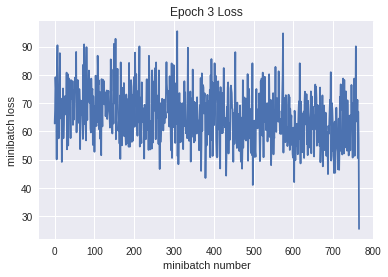

Iteration 2300: with minibatch training loss = 1.03 and accuracy of 0.64
Iteration 2400: with minibatch training loss = 0.805 and accuracy of 0.73
Iteration 2500: with minibatch training loss = 1.3 and accuracy of 0.52
Iteration 2600: with minibatch training loss = 1.18 and accuracy of 0.59
Iteration 2700: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 2800: with minibatch training loss = 1.3 and accuracy of 0.61
Iteration 2900: with minibatch training loss = 0.638 and accuracy of 0.75
Iteration 3000: with minibatch training loss = 0.641 and accuracy of 0.8
Epoch 4, Overall loss = 0.899 and accuracy of 0.686


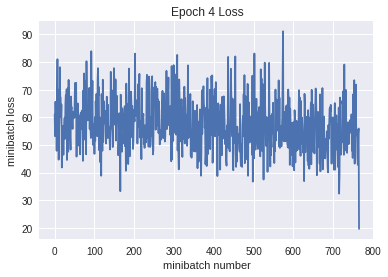

Iteration 3100: with minibatch training loss = 0.877 and accuracy of 0.66
Iteration 3200: with minibatch training loss = 0.873 and accuracy of 0.67
Iteration 3300: with minibatch training loss = 0.773 and accuracy of 0.77
Iteration 3400: with minibatch training loss = 0.824 and accuracy of 0.64
Iteration 3500: with minibatch training loss = 1.12 and accuracy of 0.64
Iteration 3600: with minibatch training loss = 0.7 and accuracy of 0.69
Iteration 3700: with minibatch training loss = 0.61 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.842 and accuracy of 0.72
Epoch 5, Overall loss = 0.814 and accuracy of 0.714


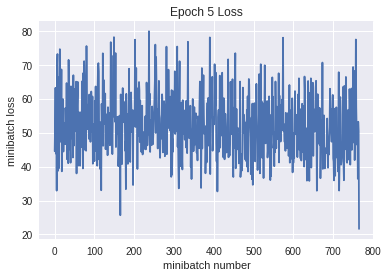

Iteration 3900: with minibatch training loss = 0.52 and accuracy of 0.83
Iteration 4000: with minibatch training loss = 0.634 and accuracy of 0.78
Iteration 4100: with minibatch training loss = 0.768 and accuracy of 0.69
Iteration 4200: with minibatch training loss = 0.901 and accuracy of 0.73
Iteration 4300: with minibatch training loss = 0.712 and accuracy of 0.8
Iteration 4400: with minibatch training loss = 0.6 and accuracy of 0.81
Iteration 4500: with minibatch training loss = 0.721 and accuracy of 0.75
Epoch 6, Overall loss = 0.755 and accuracy of 0.736


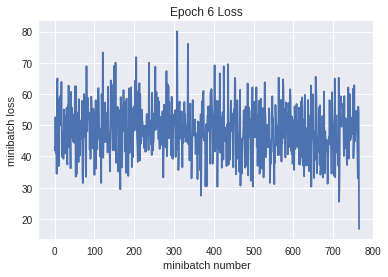

Iteration 4600: with minibatch training loss = 0.753 and accuracy of 0.7
Iteration 4700: with minibatch training loss = 0.626 and accuracy of 0.78
Iteration 4800: with minibatch training loss = 0.74 and accuracy of 0.72
Iteration 4900: with minibatch training loss = 0.671 and accuracy of 0.78
Iteration 5000: with minibatch training loss = 0.815 and accuracy of 0.72
Iteration 5100: with minibatch training loss = 0.617 and accuracy of 0.78
Iteration 5200: with minibatch training loss = 0.82 and accuracy of 0.67
Iteration 5300: with minibatch training loss = 0.899 and accuracy of 0.7
Epoch 7, Overall loss = 0.705 and accuracy of 0.755


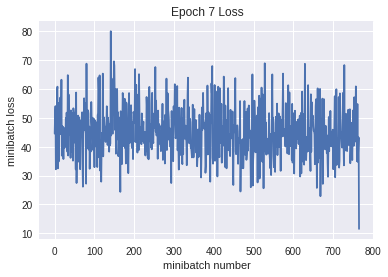

Iteration 5400: with minibatch training loss = 0.606 and accuracy of 0.77
Iteration 5500: with minibatch training loss = 0.786 and accuracy of 0.72
Iteration 5600: with minibatch training loss = 0.914 and accuracy of 0.69
Iteration 5700: with minibatch training loss = 0.509 and accuracy of 0.86
Iteration 5800: with minibatch training loss = 0.575 and accuracy of 0.78
Iteration 5900: with minibatch training loss = 0.6 and accuracy of 0.77
Iteration 6000: with minibatch training loss = 0.617 and accuracy of 0.77
Iteration 6100: with minibatch training loss = 0.73 and accuracy of 0.77
Epoch 8, Overall loss = 0.659 and accuracy of 0.772


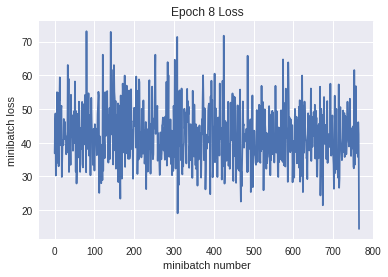

Iteration 6200: with minibatch training loss = 0.627 and accuracy of 0.78
Iteration 6300: with minibatch training loss = 0.78 and accuracy of 0.77
Iteration 6400: with minibatch training loss = 0.692 and accuracy of 0.81
Iteration 6500: with minibatch training loss = 0.807 and accuracy of 0.72
Iteration 6600: with minibatch training loss = 0.64 and accuracy of 0.78
Iteration 6700: with minibatch training loss = 0.75 and accuracy of 0.73
Iteration 6800: with minibatch training loss = 0.51 and accuracy of 0.88
Epoch 9, Overall loss = 0.621 and accuracy of 0.784


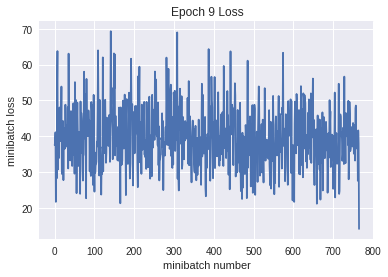

Iteration 6900: with minibatch training loss = 0.638 and accuracy of 0.72
Iteration 7000: with minibatch training loss = 0.479 and accuracy of 0.88
Iteration 7100: with minibatch training loss = 0.619 and accuracy of 0.81
Iteration 7200: with minibatch training loss = 0.611 and accuracy of 0.83
Iteration 7300: with minibatch training loss = 0.611 and accuracy of 0.75
Iteration 7400: with minibatch training loss = 0.451 and accuracy of 0.83
Iteration 7500: with minibatch training loss = 0.372 and accuracy of 0.84
Iteration 7600: with minibatch training loss = 0.594 and accuracy of 0.81
Epoch 10, Overall loss = 0.581 and accuracy of 0.797


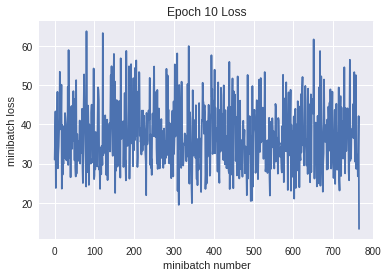

Validation
Epoch 1, Overall loss = 0.85 and accuracy of 0.709
1 ***********
Training
Iteration 0: with minibatch training loss = 0.421 and accuracy of 0.84
Iteration 100: with minibatch training loss = 0.628 and accuracy of 0.8
Iteration 200: with minibatch training loss = 0.696 and accuracy of 0.81
Iteration 300: with minibatch training loss = 0.632 and accuracy of 0.83
Iteration 400: with minibatch training loss = 0.583 and accuracy of 0.8
Iteration 500: with minibatch training loss = 0.829 and accuracy of 0.66
Iteration 600: with minibatch training loss = 0.536 and accuracy of 0.8
Iteration 700: with minibatch training loss = 0.86 and accuracy of 0.64
Epoch 1, Overall loss = 0.598 and accuracy of 0.792


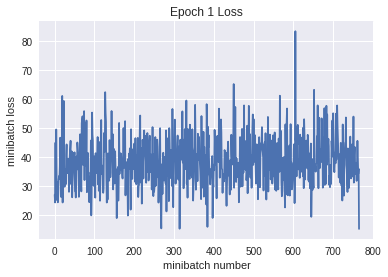

Iteration 800: with minibatch training loss = 0.636 and accuracy of 0.8
Iteration 900: with minibatch training loss = 0.641 and accuracy of 0.77
Iteration 1000: with minibatch training loss = 0.592 and accuracy of 0.75
Iteration 1100: with minibatch training loss = 0.488 and accuracy of 0.84
Iteration 1200: with minibatch training loss = 0.512 and accuracy of 0.84
Iteration 1300: with minibatch training loss = 0.556 and accuracy of 0.78
Iteration 1400: with minibatch training loss = 0.604 and accuracy of 0.81
Iteration 1500: with minibatch training loss = 0.686 and accuracy of 0.78
Epoch 2, Overall loss = 0.548 and accuracy of 0.81


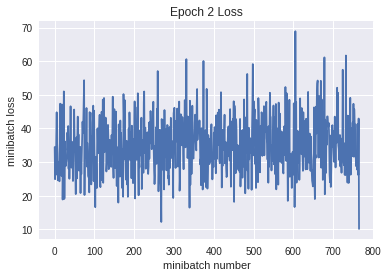

Iteration 1600: with minibatch training loss = 0.551 and accuracy of 0.8
Iteration 1700: with minibatch training loss = 0.459 and accuracy of 0.84
Iteration 1800: with minibatch training loss = 0.204 and accuracy of 0.92
Iteration 1900: with minibatch training loss = 0.356 and accuracy of 0.88
Iteration 2000: with minibatch training loss = 0.557 and accuracy of 0.83
Iteration 2100: with minibatch training loss = 0.389 and accuracy of 0.86
Iteration 2200: with minibatch training loss = 0.407 and accuracy of 0.86
Epoch 3, Overall loss = 0.515 and accuracy of 0.818


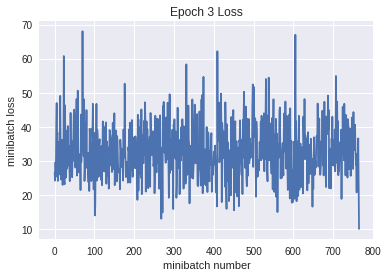

Iteration 2300: with minibatch training loss = 0.399 and accuracy of 0.83
Iteration 2400: with minibatch training loss = 0.381 and accuracy of 0.84
Iteration 2500: with minibatch training loss = 0.413 and accuracy of 0.8
Iteration 2600: with minibatch training loss = 0.775 and accuracy of 0.78
Iteration 2700: with minibatch training loss = 0.527 and accuracy of 0.8
Iteration 2800: with minibatch training loss = 0.417 and accuracy of 0.86
Iteration 2900: with minibatch training loss = 0.384 and accuracy of 0.86
Iteration 3000: with minibatch training loss = 0.448 and accuracy of 0.89
Epoch 4, Overall loss = 0.483 and accuracy of 0.833


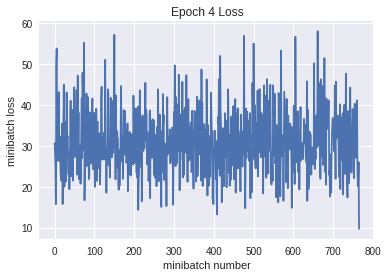

Iteration 3100: with minibatch training loss = 0.292 and accuracy of 0.88
Iteration 3200: with minibatch training loss = 0.553 and accuracy of 0.84
Iteration 3300: with minibatch training loss = 0.338 and accuracy of 0.91
Iteration 3400: with minibatch training loss = 0.48 and accuracy of 0.81
Iteration 3500: with minibatch training loss = 0.748 and accuracy of 0.75
Iteration 3600: with minibatch training loss = 0.472 and accuracy of 0.86
Iteration 3700: with minibatch training loss = 0.482 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.299 and accuracy of 0.88
Epoch 5, Overall loss = 0.463 and accuracy of 0.839


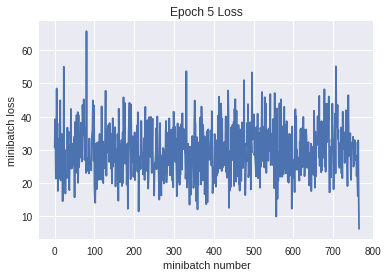

Iteration 3900: with minibatch training loss = 0.579 and accuracy of 0.8
Iteration 4000: with minibatch training loss = 0.506 and accuracy of 0.81
Iteration 4100: with minibatch training loss = 0.412 and accuracy of 0.83
Iteration 4200: with minibatch training loss = 0.467 and accuracy of 0.84
Iteration 4300: with minibatch training loss = 0.344 and accuracy of 0.84
Iteration 4400: with minibatch training loss = 0.472 and accuracy of 0.8
Iteration 4500: with minibatch training loss = 0.31 and accuracy of 0.86
Epoch 6, Overall loss = 0.439 and accuracy of 0.848


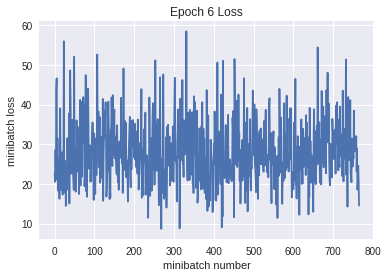

Iteration 4600: with minibatch training loss = 0.617 and accuracy of 0.81
Iteration 4700: with minibatch training loss = 0.413 and accuracy of 0.86
Iteration 4800: with minibatch training loss = 0.522 and accuracy of 0.83
Iteration 4900: with minibatch training loss = 0.225 and accuracy of 0.91
Iteration 5000: with minibatch training loss = 0.289 and accuracy of 0.89
Iteration 5100: with minibatch training loss = 0.377 and accuracy of 0.84
Iteration 5200: with minibatch training loss = 0.223 and accuracy of 0.92
Iteration 5300: with minibatch training loss = 0.469 and accuracy of 0.88
Epoch 7, Overall loss = 0.41 and accuracy of 0.858


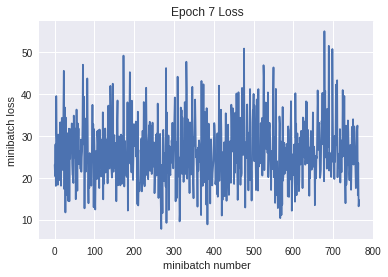

Iteration 5400: with minibatch training loss = 0.321 and accuracy of 0.91
Iteration 5500: with minibatch training loss = 0.395 and accuracy of 0.86
Iteration 5600: with minibatch training loss = 0.388 and accuracy of 0.88
Iteration 5700: with minibatch training loss = 0.428 and accuracy of 0.88
Iteration 5800: with minibatch training loss = 0.247 and accuracy of 0.92
Iteration 5900: with minibatch training loss = 0.582 and accuracy of 0.86
Iteration 6000: with minibatch training loss = 0.221 and accuracy of 0.89
Iteration 6100: with minibatch training loss = 0.528 and accuracy of 0.83
Epoch 8, Overall loss = 0.395 and accuracy of 0.865


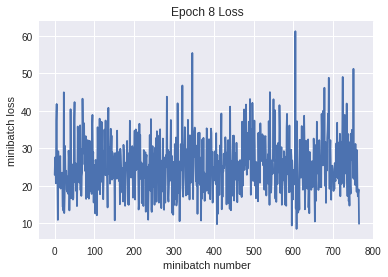

Iteration 6200: with minibatch training loss = 0.545 and accuracy of 0.84
Iteration 6300: with minibatch training loss = 0.161 and accuracy of 0.95
Iteration 6400: with minibatch training loss = 0.273 and accuracy of 0.91
Iteration 6500: with minibatch training loss = 0.287 and accuracy of 0.92
Iteration 6600: with minibatch training loss = 0.311 and accuracy of 0.92
Iteration 6700: with minibatch training loss = 0.188 and accuracy of 0.91
Iteration 6800: with minibatch training loss = 0.369 and accuracy of 0.88
Epoch 9, Overall loss = 0.375 and accuracy of 0.871


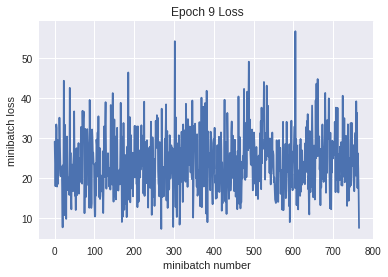

Iteration 6900: with minibatch training loss = 0.434 and accuracy of 0.84
Iteration 7000: with minibatch training loss = 0.238 and accuracy of 0.92
Iteration 7100: with minibatch training loss = 0.439 and accuracy of 0.89
Iteration 7200: with minibatch training loss = 0.102 and accuracy of 1
Iteration 7300: with minibatch training loss = 0.359 and accuracy of 0.89
Iteration 7400: with minibatch training loss = 0.313 and accuracy of 0.88
Iteration 7500: with minibatch training loss = 0.243 and accuracy of 0.91
Iteration 7600: with minibatch training loss = 0.345 and accuracy of 0.89
Epoch 10, Overall loss = 0.361 and accuracy of 0.874


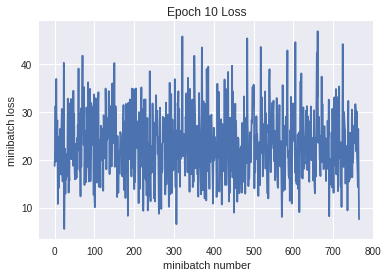

Validation
Epoch 1, Overall loss = 0.929 and accuracy of 0.728
2 ***********
Training
Iteration 0: with minibatch training loss = 0.475 and accuracy of 0.86
Iteration 100: with minibatch training loss = 0.278 and accuracy of 0.89
Iteration 200: with minibatch training loss = 0.559 and accuracy of 0.83
Iteration 300: with minibatch training loss = 0.525 and accuracy of 0.84
Iteration 400: with minibatch training loss = 0.628 and accuracy of 0.78
Iteration 500: with minibatch training loss = 0.295 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.447 and accuracy of 0.84
Iteration 700: with minibatch training loss = 0.246 and accuracy of 0.94
Epoch 1, Overall loss = 0.405 and accuracy of 0.861


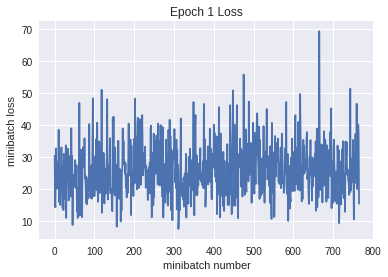

Iteration 800: with minibatch training loss = 0.22 and accuracy of 0.94
Iteration 900: with minibatch training loss = 0.277 and accuracy of 0.91
Iteration 1000: with minibatch training loss = 0.205 and accuracy of 0.95
Iteration 1100: with minibatch training loss = 0.359 and accuracy of 0.84
Iteration 1200: with minibatch training loss = 0.612 and accuracy of 0.81
Iteration 1300: with minibatch training loss = 0.416 and accuracy of 0.86
Iteration 1400: with minibatch training loss = 0.398 and accuracy of 0.86
Iteration 1500: with minibatch training loss = 0.352 and accuracy of 0.88
Epoch 2, Overall loss = 0.368 and accuracy of 0.873


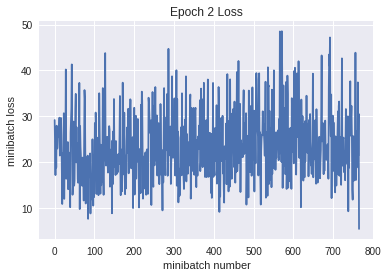

Iteration 1600: with minibatch training loss = 0.26 and accuracy of 0.89
Iteration 1700: with minibatch training loss = 0.218 and accuracy of 0.92
Iteration 1800: with minibatch training loss = 0.24 and accuracy of 0.89
Iteration 1900: with minibatch training loss = 0.268 and accuracy of 0.92
Iteration 2000: with minibatch training loss = 0.443 and accuracy of 0.88
Iteration 2100: with minibatch training loss = 0.392 and accuracy of 0.84
Iteration 2200: with minibatch training loss = 0.392 and accuracy of 0.84
Epoch 3, Overall loss = 0.347 and accuracy of 0.88


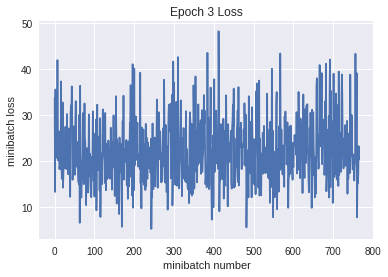

Iteration 2300: with minibatch training loss = 0.328 and accuracy of 0.91
Iteration 2400: with minibatch training loss = 0.307 and accuracy of 0.86
Iteration 2500: with minibatch training loss = 0.575 and accuracy of 0.75
Iteration 2600: with minibatch training loss = 0.558 and accuracy of 0.83
Iteration 2700: with minibatch training loss = 0.46 and accuracy of 0.83
Iteration 2800: with minibatch training loss = 0.332 and accuracy of 0.88
Iteration 2900: with minibatch training loss = 0.436 and accuracy of 0.84
Iteration 3000: with minibatch training loss = 0.318 and accuracy of 0.89
Epoch 4, Overall loss = 0.333 and accuracy of 0.884


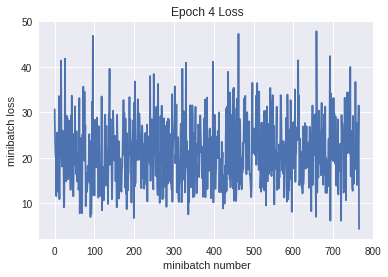

Iteration 3100: with minibatch training loss = 0.239 and accuracy of 0.89
Iteration 3200: with minibatch training loss = 0.327 and accuracy of 0.86
Iteration 3300: with minibatch training loss = 0.341 and accuracy of 0.84
Iteration 3400: with minibatch training loss = 0.32 and accuracy of 0.91
Iteration 3500: with minibatch training loss = 0.336 and accuracy of 0.88
Iteration 3600: with minibatch training loss = 0.236 and accuracy of 0.92
Iteration 3700: with minibatch training loss = 0.278 and accuracy of 0.88
Iteration 3800: with minibatch training loss = 0.271 and accuracy of 0.92
Epoch 5, Overall loss = 0.319 and accuracy of 0.89


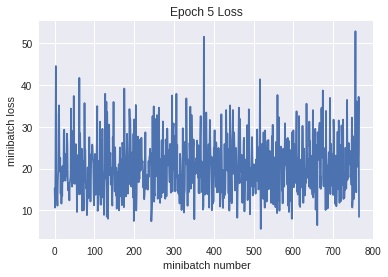

Iteration 3900: with minibatch training loss = 0.43 and accuracy of 0.83
Iteration 4000: with minibatch training loss = 0.291 and accuracy of 0.89
Iteration 4100: with minibatch training loss = 0.234 and accuracy of 0.91
Iteration 4200: with minibatch training loss = 0.28 and accuracy of 0.92
Iteration 4300: with minibatch training loss = 0.385 and accuracy of 0.89
Iteration 4400: with minibatch training loss = 0.186 and accuracy of 0.94
Iteration 4500: with minibatch training loss = 0.276 and accuracy of 0.89
Epoch 6, Overall loss = 0.309 and accuracy of 0.894


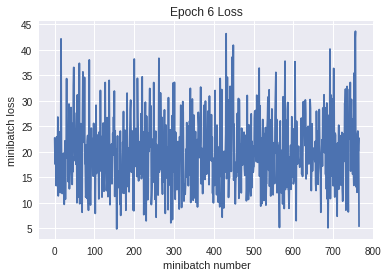

Iteration 4600: with minibatch training loss = 0.259 and accuracy of 0.88
Iteration 4700: with minibatch training loss = 0.371 and accuracy of 0.83
Iteration 4800: with minibatch training loss = 0.281 and accuracy of 0.91
Iteration 4900: with minibatch training loss = 0.14 and accuracy of 0.92
Iteration 5000: with minibatch training loss = 0.207 and accuracy of 0.91
Iteration 5100: with minibatch training loss = 0.28 and accuracy of 0.89
Iteration 5200: with minibatch training loss = 0.593 and accuracy of 0.83
Iteration 5300: with minibatch training loss = 0.375 and accuracy of 0.86
Epoch 7, Overall loss = 0.303 and accuracy of 0.896


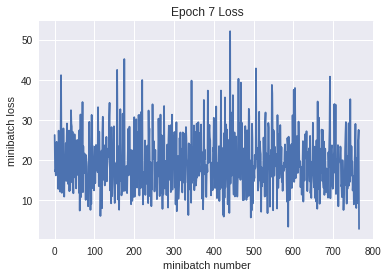

Iteration 5400: with minibatch training loss = 0.185 and accuracy of 0.94
Iteration 5500: with minibatch training loss = 0.622 and accuracy of 0.83
Iteration 5600: with minibatch training loss = 0.302 and accuracy of 0.88
Iteration 5700: with minibatch training loss = 0.278 and accuracy of 0.92
Iteration 5800: with minibatch training loss = 0.347 and accuracy of 0.94
Iteration 5900: with minibatch training loss = 0.199 and accuracy of 0.97
Iteration 6000: with minibatch training loss = 0.241 and accuracy of 0.92
Iteration 6100: with minibatch training loss = 0.139 and accuracy of 0.94
Epoch 8, Overall loss = 0.283 and accuracy of 0.903


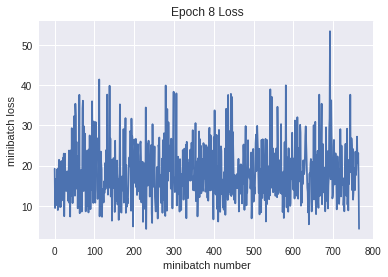

Iteration 6200: with minibatch training loss = 0.356 and accuracy of 0.86
Iteration 6300: with minibatch training loss = 0.244 and accuracy of 0.91
Iteration 6400: with minibatch training loss = 0.324 and accuracy of 0.92
Iteration 6500: with minibatch training loss = 0.119 and accuracy of 0.97
Iteration 6600: with minibatch training loss = 0.311 and accuracy of 0.89
Iteration 6700: with minibatch training loss = 0.131 and accuracy of 0.97
Iteration 6800: with minibatch training loss = 0.208 and accuracy of 0.97
Epoch 9, Overall loss = 0.272 and accuracy of 0.908


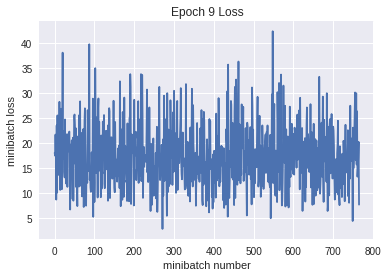

Iteration 6900: with minibatch training loss = 0.206 and accuracy of 0.94
Iteration 7000: with minibatch training loss = 0.373 and accuracy of 0.84
Iteration 7100: with minibatch training loss = 0.338 and accuracy of 0.86
Iteration 7200: with minibatch training loss = 0.32 and accuracy of 0.86
Iteration 7300: with minibatch training loss = 0.252 and accuracy of 0.92
Iteration 7400: with minibatch training loss = 0.221 and accuracy of 0.91
Iteration 7500: with minibatch training loss = 0.126 and accuracy of 0.95
Iteration 7600: with minibatch training loss = 0.319 and accuracy of 0.92
Epoch 10, Overall loss = 0.278 and accuracy of 0.905


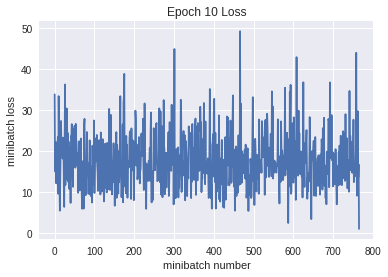

Validation
Epoch 1, Overall loss = 0.904 and accuracy of 0.748


In [98]:
# Feel free to play with this cell
# This default code creates a session
# and trains your model for 10 epochs
# then prints the validation set accuracy
sess = tf.Session()

sess.run(tf.global_variables_initializer())
for i in range(3):
  print(i, "***********")
  print('Training')
  run_model(sess,y_out,mean_loss,X_train,y_train,10,64,100,train_step,True)
  print('Validation')
  run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

In [99]:
# Test your model here, and make sure 
# the output of this cell is the accuracy
# of your best model on the training and val sets
# We're looking for >= 70% accuracy on Validation
print('Training')
run_model(sess,y_out,mean_loss,X_train,y_train,1,64)
print('Validation')
run_model(sess,y_out,mean_loss,X_val,y_val,1,64)

Training
Epoch 1, Overall loss = 0.254 and accuracy of 0.916
Validation
Epoch 1, Overall loss = 0.904 and accuracy of 0.748


(0.9041926608085632, 0.748)

### Describe what you did here
In this cell you should also write an explanation of what you did, any additional features that you implemented, and any visualizations or graphs that you make in the process of training and evaluating your network

_Tell us here_

### Test Set - Do this only once
Now that we've gotten a result that we're happy with, we test our final model on the test set. This would be the score we would achieve on a competition. Think about how this compares to your validation set accuracy.

In [100]:
print('Test')
run_model(sess,y_out,mean_loss,X_test,y_test,1,64)

Test
Epoch 1, Overall loss = 0.922 and accuracy of 0.742


(0.921557561302185, 0.7415)

## Going further with TensorFlow

The next assignment will make heavy use of TensorFlow. You might also find it useful for your projects. 


# Extra Credit Description
If you implement any additional features for extra credit, clearly describe them here with pointers to any code in this or other files if applicable.